### Modeling w/o any hyperparameter tuning

In [47]:
import os
os.environ["OPENBLAS_NUM_THREADS"] = "1"
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import cross_validate,train_test_split,GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, roc_auc_score,make_scorer
)
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
import xgboost as XGBoost
import pandas as pd
import numpy as np

Modeling without hyperparameter tuning

In [51]:
def train_with_cv(df,cv=10,random_state=42):
    X = df.drop(columns = ['pwr_current','participant_id','visit'])
    y = df['pwr_current']

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=random_state,stratify=y)

    # prepare the models
    models = {
        'LogisticRegression': LogisticRegression(max_iter=1000, random_state=random_state),
        'GaussianNB': GaussianNB(),
        'BernoulliNB': BernoulliNB(),
        'SupportVectorMachine': SVC(probability=True, random_state=random_state),
        'RandomForest': RandomForestClassifier(random_state=random_state),
        'K-Nearest Neighbors ': KNeighborsClassifier(n_neighbors=2, n_jobs=1),
        'XGBoost': XGBoost.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=random_state),
        'DecisionTree': DecisionTreeClassifier(random_state=random_state),
        'MultilayerPerceptron': MLPClassifier(max_iter=1000, random_state=random_state),
    }    

    scoring = {
    'accuracy': 'accuracy',
    'precision': make_scorer(precision_score, zero_division=0),
    'recall': make_scorer(recall_score, zero_division=0),
    'f1': make_scorer(f1_score, zero_division=0)
}
    one_hot_cols = ['ppg_BMI', 'first_BMI','pp_weight_loss1', 'pp_weight_loss2', 
                    'pp_weight_loss3','vig_activity','smoke_current2', 'smoke_currentfu_v3', 'smoke_currentfu_v4', 
                    'smoke_currentfu_v5']
    binary_cols = ['race_1', 'race_2','caffeine_v2', 'caffeine_v3_v5_v3', 'caffeine_v3_v5_v4', 'caffeine_v3_v5_v5']
    continuous_cols = ['wt_gain','weight_change_v3','weight_change_v2','weight_change_v1','age_delivery_range2','num_alc_weekly2','num_alc_weekfu_v3',	'num_alc_weekfu_v4','num_alc_weekfu_v5']
    
    X = df.drop(columns = ['pwr_current','participant_id','visit'])
    y = df['pwr_current']
    other_cols = [col for col in X.columns if col not in one_hot_cols + binary_cols + continuous_cols]
    all_results = []
    preprocessor = ColumnTransformer(
        transformers=[
            ('cat', OneHotEncoder(drop = 'first',handle_unknown='ignore'), one_hot_cols),
            ('binary', 'passthrough', binary_cols),
            ('num', StandardScaler(), continuous_cols),
            ('other', 'passthrough', other_cols)  # Keep other columns as they are
        ]
    )
    # Loop through each model
    for name, model in models.items():
        clf = Pipeline([
            ('preprocessor', preprocessor),
            ('model', model)
        ])    

        #Perform cross-validation
        cv_results = cross_validate(clf, X_train, y_train, cv=cv, scoring=scoring)
        
        # Fit the model on the training data
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        try:
            y_proba = clf.predict_proba(X_test)[:, 1]
            roc = roc_auc_score(y_test, y_proba)
        except:
            y_proba = None
            roc = None
        # Store the results
        results = {
            'Model': name,
            'CV Accuracy': np.mean(cv_results['test_accuracy']),
            'CV F1 Score': np.mean(cv_results['test_f1']),
            'CV Precision': np.mean(cv_results['test_precision']),
            'CV Recall': np.mean(cv_results['test_recall']),
            'Test Accuracy': accuracy_score(y_test, y_pred),
            'Test F1 Score': f1_score(y_test, y_pred, zero_division=0),
            'Test Precision': precision_score(y_test, y_pred, zero_division=0),
            'Test Recall': recall_score(y_test, y_pred, zero_division=0),
            'Test ROC AUC': roc,
            'Confusion Matrix': confusion_matrix(y_test, y_pred)
        }
        all_results.append(results)

    return pd.DataFrame(all_results)

In [53]:
for visit in range(1,6):
    df = pd.read_csv(f"../data/DF{visit}.csv")
    print(df.shape)

(68, 143)
(65, 143)
(64, 143)
(61, 143)
(60, 143)


In [52]:
all_results = []
for visit in range(1,6):
    df = pd.read_csv(f"../data/DF{visit}.csv")
    result = train_with_cv(df)
    result['visit'] = visit
    all_results.append(result)
all_results = pd.concat(all_results, ignore_index=True)
all_results.to_csv(f"../data/all_results_without_hyper.csv", index=False)


/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning:

Found unknown categories in columns [3] during transform. These unknown categories will be encoded as all zeros

/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning:

Found unknown categories in columns [0, 6] during transform. These unknown categories will be encoded as all zeros

/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning:

Found unknown categories in columns [3, 4] during transform. These unknown categories will be encoded as all zeros

/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning:

Found unknown categories in columns [4] during transform. These unknown categories will be encoded as all zeros

/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: U

With hyperparameter tuning spliting the training and testing dataset

In [ ]:
import os
os.environ["OPENBLAS_NUM_THREADS"] = "1"
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import cross_validate,train_test_split,GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, roc_auc_score,make_scorer
)
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
import xgboost as XGBoost
import pandas as pd
import numpy as np

In [ ]:
def train_with_cv(df,cv=10,random_state=42):
    # list of columns to analyze
    one_hot_cols = ['ppg_BMI', 'first_BMI','pp_weight_loss1', 'pp_weight_loss2', 
                    'pp_weight_loss3','vig_activity','smoke_current2', 'smoke_currentfu_v3', 'smoke_currentfu_v4', 
                    'smoke_currentfu_v5']
    binary_cols = ['race_1', 'race_2','caffeine_v2', 'caffeine_v3_v5_v3', 'caffeine_v3_v5_v4', 'caffeine_v3_v5_v5']
    continuous_cols = ['wt_gain','weight_change_v3','weight_change_v2','weight_change_v1','age_delivery_range2','num_alc_weekly2','num_alc_weekfu_v3',	'num_alc_weekfu_v4','num_alc_weekfu_v5']
    
    X = df.drop(columns = ['pwr_current','participant_id','visit'])
    y = df['pwr_current']
    other_cols = [col for col in X.columns if col not in one_hot_cols + binary_cols + continuous_cols]
    # Convert categorical columns to one-hot encoding
    preprocessor = ColumnTransformer(
        transformers=[
            ('cat', OneHotEncoder(drop = 'first',handle_unknown='ignore'), one_hot_cols),
            ('binary', 'passthrough', binary_cols),
            ('num', StandardScaler(), continuous_cols),
            ('other', 'passthrough', other_cols)  # Keep other columns as they are
        ]
    )
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=random_state,stratify=y)

    param_grid = {
        'Logistic Regression': {
            'model__C': [0.01, 0.1, 1, 10, 100],
            'model__penalty': ['l2'],
            'model__solver': ['lbfgs', 'liblinear'],
        },
        'Support Vector Machine':[
        # Linear kernel: C only
        {'model__C': [0.01, 0.1, 1, 10], 'model__kernel': ['linear']},
        # RBF kernel: C and gamma
        {'model__C': [0.01, 0.1, 1, 10], 'model__kernel': ['rbf'], 'model__gamma': ['scale', 0.001, 0.01, 0.1, 1]},
        ],
        'K-Nearest Neighbors ':{
            'model__n_neighbors': [1, 2, 3, 4, 5],
            'model__weights': ['uniform', 'distance'],
            'model__metric': ['euclidean', 'manhattan'],
        },
        'Random Forest':{
            'model__n_estimators': [50, 100, 200,300],
            'model__max_depth': [None, 10],
            'model__min_samples_split':[2, 5, 10],
            'model__max_features': ['sqrt', 1.0], # 1.0 means all
            'model__class_weight': ['balanced'],
            'model__bootstrap': [True],
        },
        'XGBoost':{
            'model__n_estimators': [50, 100, 200,300],
            'model__learning_rate': [0.01, 0.05,0.1, 0.2],
            'model__gamma': [0, 0.1],
            'model__reg_alpha': [0.1], # L1 regularization
            'model__reg_lambda': [0.1], # L2 regularization
            },
        'MultiLayer Perceptron':{
            'model__hidden_layer_sizes': [(100,), (150,),(150,50)],
            'model__activation': ['relu'],
            'model__alpha': [0.0001, 0.001],
            'model__solver': ['adam', 'lbfgs'], # 'lbfgs' is for smaller datasets
            'model__learning_rate_init': [0.001, 0.01, 0.1],
        },
        'GaussianNB':{
            'model__var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6],
        },
        'BernoulliNB':{
            'model__alpha': [1e-5, 0.1, 0.5, 1.0],
        },
        'Decision Tree':{
            'model__max_depth': [5, 10, None],
            'model__max_features': [None, 'sqrt', 'log2', 0.8],
            'model__criterion': ['gini', 'entropy'],
        }
    }
    # prepare the models
    models = {
        'Logistic Regression': LogisticRegression(max_iter=1000, random_state=random_state),
        'GaussianNB': GaussianNB(),
        'BernoulliNB': BernoulliNB(),
        'Support Vector Machine': SVC(probability=True, random_state=random_state),
        'Random Forest': RandomForestClassifier(random_state=random_state),
        'K-Nearest Neighbors ': KNeighborsClassifier(n_neighbors=2, n_jobs=1),
        'XGBoost': XGBoost.XGBClassifier(eval_metric='logloss', random_state=random_state),
        'Decision Tree': DecisionTreeClassifier(random_state=random_state),
        'MultiLayer Perceptron': MLPClassifier(max_iter=1000, random_state=random_state),
    }    

    scoring = {
    'accuracy': 'accuracy',
    'precision': make_scorer(precision_score, zero_division=0),
    'recall': make_scorer(recall_score, zero_division=0),
    'f1': make_scorer(f1_score, zero_division=0)
}
    all_results = []
    model_objects = {}
    # Loop through each model
    for name, model in models.items():
        clf = Pipeline([
            ('preprocessor', preprocessor),
            ('model', model)
        ])

        if name in param_grid:
            grid = GridSearchCV(
                clf,
                param_grid=param_grid[name],
                cv=StratifiedKFold(n_splits=cv, shuffle=True, random_state=random_state),
                scoring='f1',
                n_jobs=1,
            )
            grid.fit(X_train, y_train)
            best_model = grid.best_estimator_
        else:
            best_model = clf
            best_model.fit(X_train, y_train)
        
        # Perform cross-validation
        cv_results = cross_validate(best_model, 
                                    X_train, 
                                    y_train, 
                                    cv=StratifiedKFold(n_splits=cv, shuffle=True, random_state=random_state),
                                    scoring=scoring
                                    )

        # Test the model on the test set
        y_pred = best_model.predict(X_test)
        
        try:
            y_proba = best_model.predict_proba(X_test)[:, 1]
            roc = roc_auc_score(y_test, y_proba)
        except:
            y_proba = None
            roc = None
        # Store the results
        results = {
            'Model': name,
            'CV Accuracy': np.mean(cv_results['test_accuracy']),
            'CV F1 Score': np.mean(cv_results['test_f1']),
            'CV Precision': np.mean(cv_results['test_precision']),
            'CV Recall': np.mean(cv_results['test_recall']),
            'Test Accuracy': accuracy_score(y_test, y_pred),
            'Test F1 Score': f1_score(y_test, y_pred, zero_division=0),
            'Test Precision': precision_score(y_test, y_pred, zero_division=0),
            'Test Recall': recall_score(y_test, y_pred, zero_division=0),
            'Test ROC AUC': roc,
            'Confusion Matrix': confusion_matrix(y_test, y_pred)
        }
        all_results.append(results)
        model_objects[name] = {'estimator': best_model, 'y_pred': y_pred}
    return pd.DataFrame(all_results), model_objects, X_test, y_test

In [ ]:
all_best_models = {}
all_x_tests = {}
all_y_tests = {}
for v in (range(1,6)):
    df = pd.read_csv(f"../data/DF{v}.csv", index_col=0)
    result, model_objects, X_test, y_test = train_with_cv(df)
    print(f"Results for Visit V{v}:")
    print(result[['Model', 'Test Accuracy', 'Test F1 Score', 'Test Precision', 'Test Recall', 'Test ROC AUC']])
    print("\n")
    # Save the results to excel files
    result.to_excel(f"../data/model_results_v{v}_hyper.xlsx", index=True)
    all_best_models[f'V{v}'] = model_objects
    all_x_tests[f'V{v}'] = X_test
    all_y_tests[f'V{v}'] = y_test
    # Save all test sets
    X_test.to_csv(f"../data/X_test_v{v}.csv")
    y_test.to_csv(f"../data/y_test_v{v}.csv")
# Save all best models
import joblib
joblib.dump(all_best_models, "../data/all_best_models.pkl")
joblib.dump(all_x_tests, "../data/all_x_tests.pkl")
joblib.dump(all_y_tests, "../data/all_y_tests.pkl")

/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [0, 3, 4] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [1] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [3, 4, 8, 9] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [7, 8] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda

Results for Visit V1:
                    Model  Test Accuracy  Test F1 Score  Test Precision  \
0     Logistic Regression       0.714286       0.500000        0.666667   
1              GaussianNB       0.642857       0.545455        0.500000   
2             BernoulliNB       0.928571       0.909091        0.833333   
3  Support Vector Machine       0.642857       0.545455        0.500000   
4           Random Forest       0.857143       0.800000        0.800000   
5    K-Nearest Neighbors        0.714286       0.500000        0.666667   
6                 XGBoost       0.857143       0.800000        0.800000   
7           Decision Tree       0.857143       0.750000        1.000000   
8   MultiLayer Perceptron       0.714286       0.500000        0.666667   

   Test Recall  Test ROC AUC  
0          0.4      0.711111  
1          0.6      0.633333  
2          1.0      0.911111  
3          0.6      0.711111  
4          0.8      0.888889  
5          0.4      0.655556  
6         

/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [3] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [3, 4, 8, 9] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [0, 2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [7, 8] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/l

Results for Visit V2:
                    Model  Test Accuracy  Test F1 Score  Test Precision  \
0     Logistic Regression       0.923077       0.888889        1.000000   
1              GaussianNB       0.615385       0.615385        0.500000   
2             BernoulliNB       0.846154       0.750000        1.000000   
3  Support Vector Machine       0.923077       0.888889        1.000000   
4           Random Forest       1.000000       1.000000        1.000000   
5    K-Nearest Neighbors        0.846154       0.800000        0.800000   
6                 XGBoost       0.923077       0.888889        1.000000   
7           Decision Tree       0.923077       0.888889        1.000000   
8   MultiLayer Perceptron       0.769231       0.727273        0.666667   

   Test Recall  Test ROC AUC  
0          0.8        0.9250  
1          0.8        0.6500  
2          0.6        0.9500  
3          0.8        0.9250  
4          1.0        1.0000  
5          0.8        0.8375  
6         

/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [8, 9] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [7, 8] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [3, 4] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [3] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/pyt

Results for Visit V3:
                    Model  Test Accuracy  Test F1 Score  Test Precision  \
0     Logistic Regression       0.769231       0.666667        0.750000   
1              GaussianNB       0.615385       0.666667        0.500000   
2             BernoulliNB       0.692308       0.500000        0.666667   
3  Support Vector Machine       0.769231       0.571429        1.000000   
4           Random Forest       0.923077       0.888889        1.000000   
5    K-Nearest Neighbors        0.846154       0.750000        1.000000   
6                 XGBoost       0.846154       0.750000        1.000000   
7           Decision Tree       0.692308       0.500000        0.666667   
8   MultiLayer Perceptron       0.769231       0.666667        0.750000   

   Test Recall  Test ROC AUC  
0          0.6        0.8500  
1          1.0        0.8125  
2          0.4        0.7500  
3          0.4        0.8500  
4          0.8        0.9750  
5          0.6        0.9250  
6         

/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [4] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [8, 9] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [2, 3] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python

Results for Visit V4:
                    Model  Test Accuracy  Test F1 Score  Test Precision  \
0     Logistic Regression       0.615385       0.444444        0.500000   
1              GaussianNB       0.461538       0.363636        0.333333   
2             BernoulliNB       0.692308       0.600000        0.600000   
3  Support Vector Machine       0.846154       0.750000        1.000000   
4           Random Forest       0.692308       0.714286        0.555556   
5    K-Nearest Neighbors        0.615385       0.285714        0.500000   
6                 XGBoost       0.615385       0.615385        0.500000   
7           Decision Tree       0.692308       0.666667        0.571429   
8   MultiLayer Perceptron       0.538462       0.400000        0.400000   

   Test Recall  Test ROC AUC  
0          0.4        0.7250  
1          0.4        0.6500  
2          0.6        0.7250  
3          0.6        0.8000  
4          1.0        0.9375  
5          0.2        0.6875  
6         

/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [3, 4, 7, 8] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [4] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [9] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/pyt

Results for Visit V5:
                    Model  Test Accuracy  Test F1 Score  Test Precision  \
0     Logistic Regression       0.666667       0.500000        0.500000   
1              GaussianNB       0.583333       0.444444        0.400000   
2             BernoulliNB       0.750000       0.666667        0.600000   
3  Support Vector Machine       0.666667       0.500000        0.500000   
4           Random Forest       0.750000       0.727273        0.571429   
5    K-Nearest Neighbors        0.666667       0.333333        0.500000   
6                 XGBoost       0.750000       0.727273        0.571429   
7           Decision Tree       0.666667       0.600000        0.500000   
8   MultiLayer Perceptron       0.750000       0.571429        0.666667   

   Test Recall  Test ROC AUC  
0         0.50      0.843750  
1         0.50      0.531250  
2         0.75      0.812500  
3         0.50      0.781250  
4         1.00      0.750000  
5         0.25      0.671875  
6         

['../data/all_y_tests.pkl']

In [ ]:
# Combine all visit results into a single DataFrame with Visit labels
visit_dfs = []
for v in range(1, 6):
    df = pd.read_excel(f"../data/model_results_v{v}_hyper.xlsx", index_col=0)
    df["Visit"] = f"V{v}"
    visit_dfs.append(df)

# Concatenate all visits
all_visits_results = pd.concat(visit_dfs, ignore_index=True)

# Save to a single Excel file
all_visits_results.to_excel("../data/model_results_all_visits_hyper.xlsx", index=False)

### Visualize the Model Performance

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import joblib

In [ ]:
palette = ["#a6cee3",
"#1f78b4",
"#b2df8a",
"#33a02c",
"#fb9a99",
"#e31a1c",
"#fdbf6f",
"#ff7f00",
"#cab2d6"]

In [ ]:
# Load the combined results
all_visits_results = pd.read_excel("../data/model_results_all_visits_hyper.xlsx")
all_x_tests = joblib.load("../data/all_x_tests.pkl")
all_y_tests = joblib.load("../data/all_y_tests.pkl")

model performance over visits

In [ ]:
# model performance over visits
def plot_model_performance_over_visits(df, metric='Test F1 Score'):
    """
    Plot model performance over visits.
    
    Parameters:
    df (DataFrame): DataFrame containing model results with 'Visit' and 'Model' columns.
    metric (str): The metric to plot (e.g., 'Test F1 Score').
    
    """
    plt.figure(figsize=(24, 18))
    ax = sns.barplot(data=df, x='Visit', y=metric, hue='Model', palette=palette)
    plt.title(f'Model Performance Over Visits ({metric})')
    plt.xlabel('Visit')
    plt.ylabel(metric)
    plt.xticks(rotation=45)
    plt.legend(title='Model', bbox_to_anchor=(1.05, 1), loc='upper left')
    for container in ax.containers:
        labels  = [f'{h*100:.1f}%' for h in container.datavalues]
        ax.bar_label(container, labels = labels, label_type='edge', fontsize=8, padding=3)
    plt.tight_layout()
    plt.show()

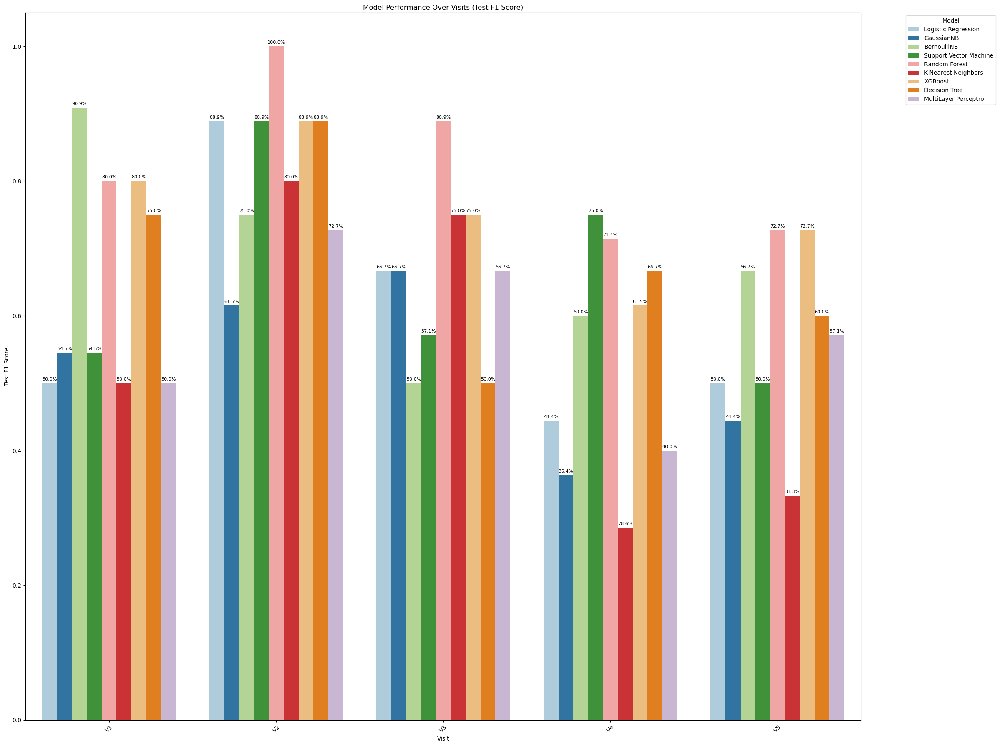

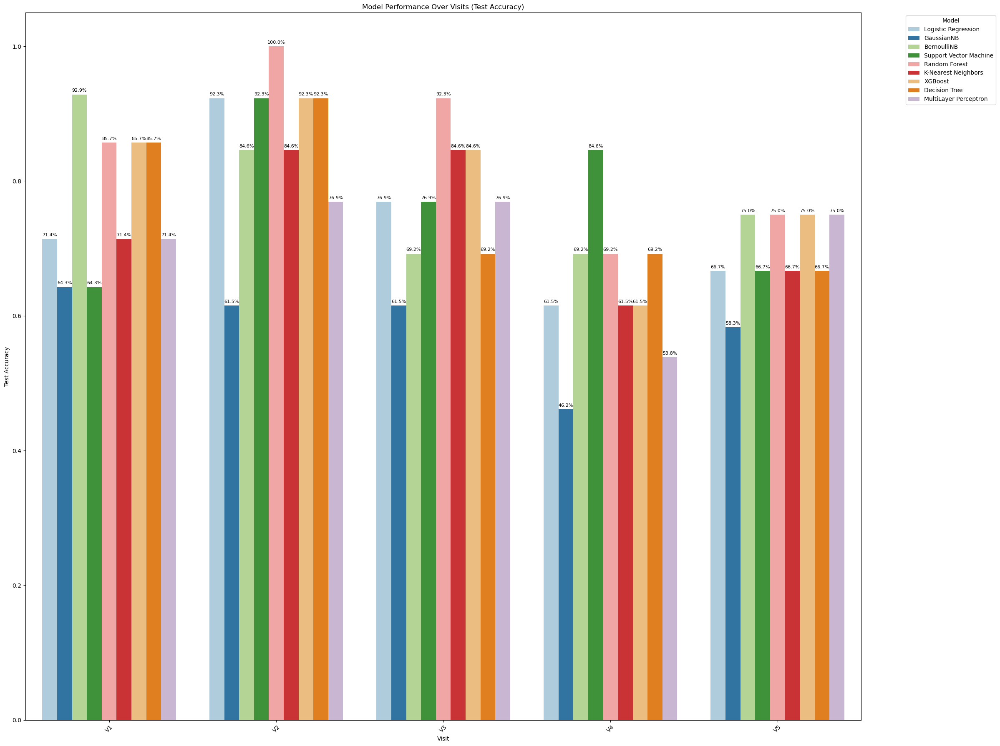

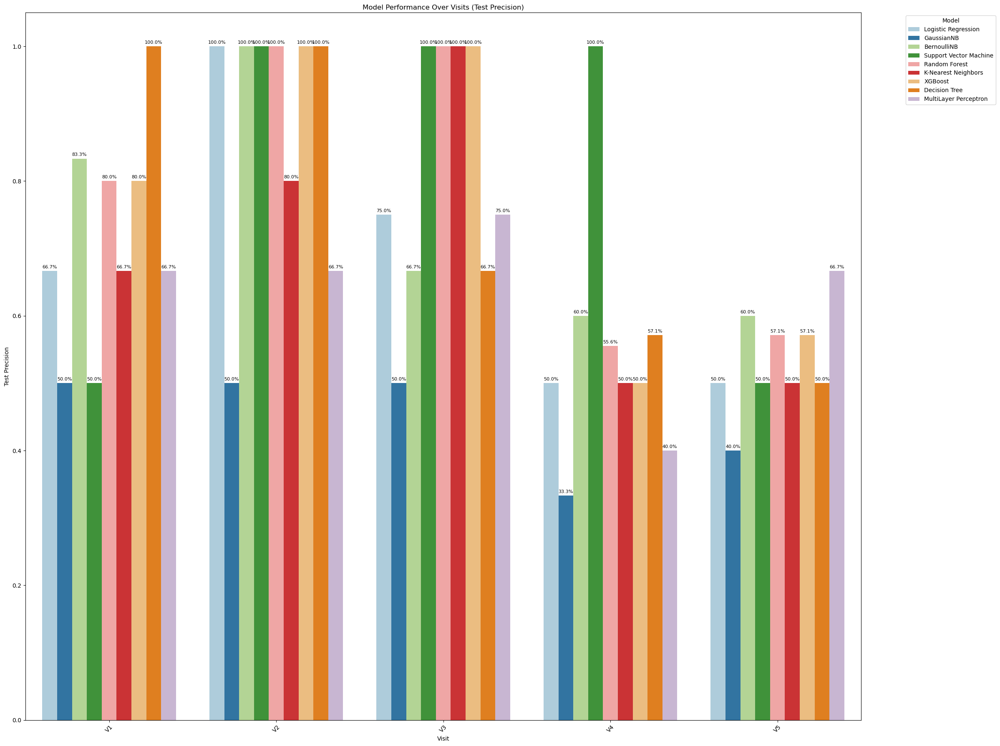

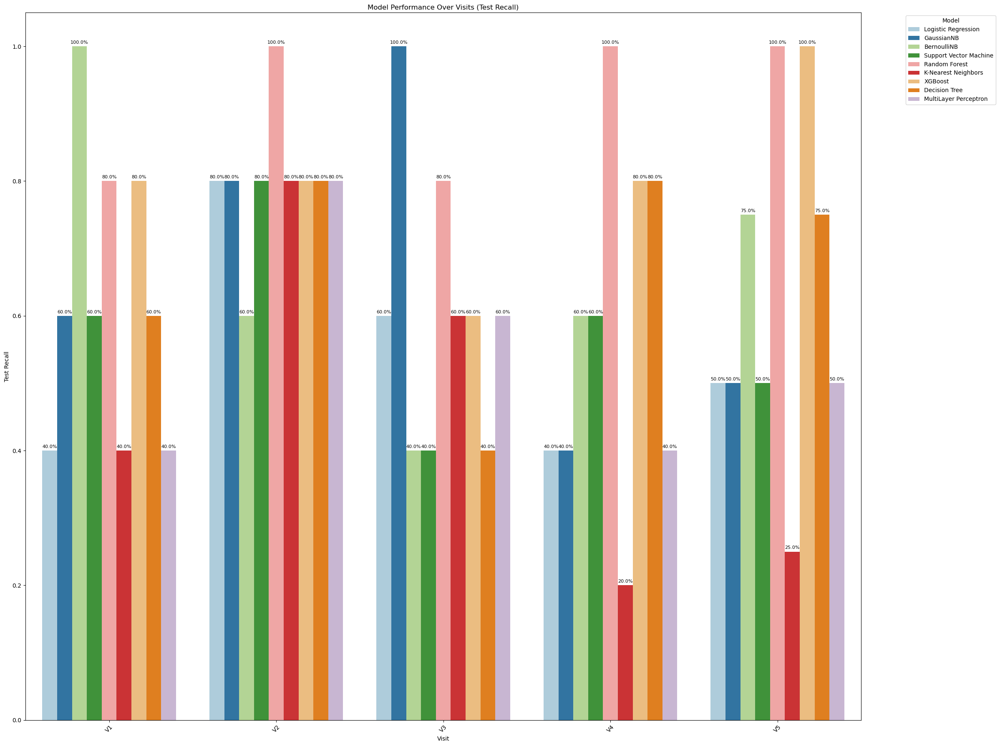

In [ ]:
plot_model_performance_over_visits(all_visits_results, metric='Test F1 Score')
plot_model_performance_over_visits(all_visits_results, metric='Test Accuracy')
plot_model_performance_over_visits(all_visits_results, metric ='Test Precision')
plot_model_performance_over_visits(all_visits_results, metric='Test Recall')

each visit model performance of each model

In [ ]:
# each visit model performance of each model
def plot_models_per_visit_bar(df, metric='Test F1 Score'):
    visits = df['Visit'].unique()
    num_visits = len(visits)
    fig, axes = plt.subplots(1, num_visits, figsize=(8 * num_visits, 10), sharey=True)
    if num_visits == 1:
        axes = [axes]
    for i, visit in enumerate(visits):
        ax = sns.barplot(data=df[df['Visit'] == visit], x='Model', y=metric, ax=axes[i],palette=palette)
        axes[i].set_title(f'{visit}: {metric}')
        axes[i].set_ylim(0, 1.05)
        axes[i].tick_params(axis='x', rotation=45)
        for container in ax.containers:
            labels = [f'{h*100:.1f}%' for h in container.datavalues]
            ax.bar_label(container, labels = labels, label_type='edge', fontsize=10, padding=3)
    plt.tight_layout()
    plt.show()

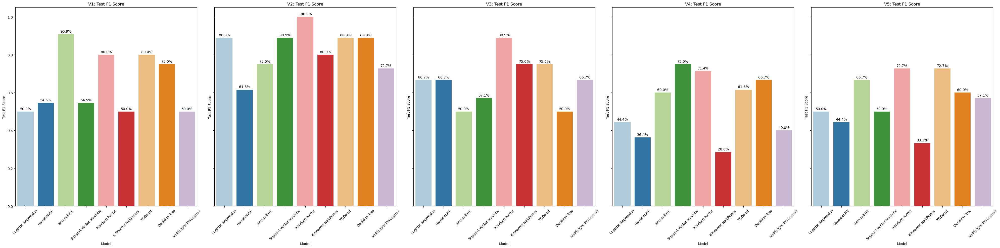

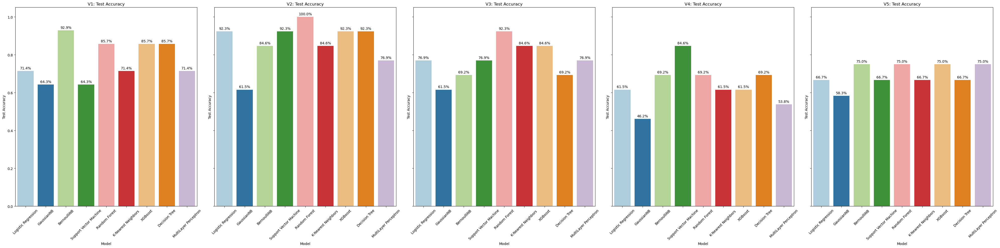

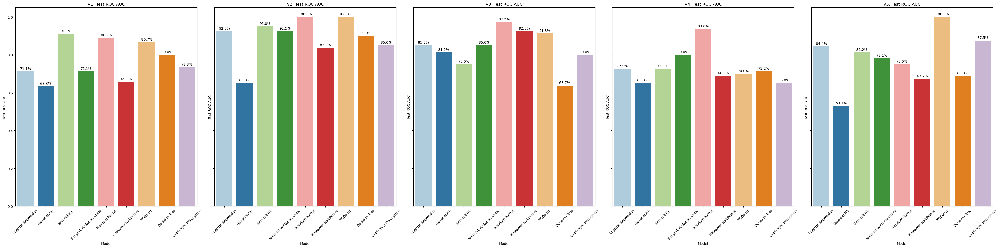

In [ ]:
plot_models_per_visit_bar(all_visits_results, metric='Test F1 Score')
plot_models_per_visit_bar(all_visits_results, metric='Test Accuracy')
plot_models_per_visit_bar(all_visits_results, metric='Test ROC AUC')

Heatmap of model performance across visits

In [ ]:
# Heatmap of model performance across visits
def plot_heatmap_model_visit(df, metric='Test F1 Score'):
    pivot_df = df.pivot(index='Model', columns='Visit', values=metric)
    plt.figure(figsize=(10, 6))
    sns.heatmap(pivot_df, annot=True, fmt=".2f", cmap='Blues', vmin=0, vmax=1)
    plt.title(f'Heatmap of {metric} Across Visits and Models')
    plt.ylabel('Model')
    plt.xlabel('Visit')
    plt.tight_layout()
    plt.show()

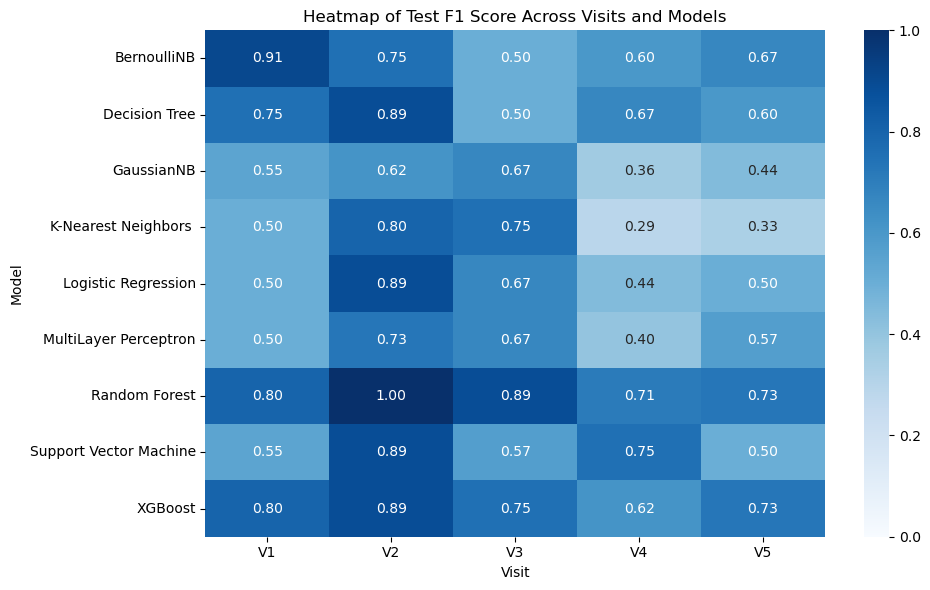

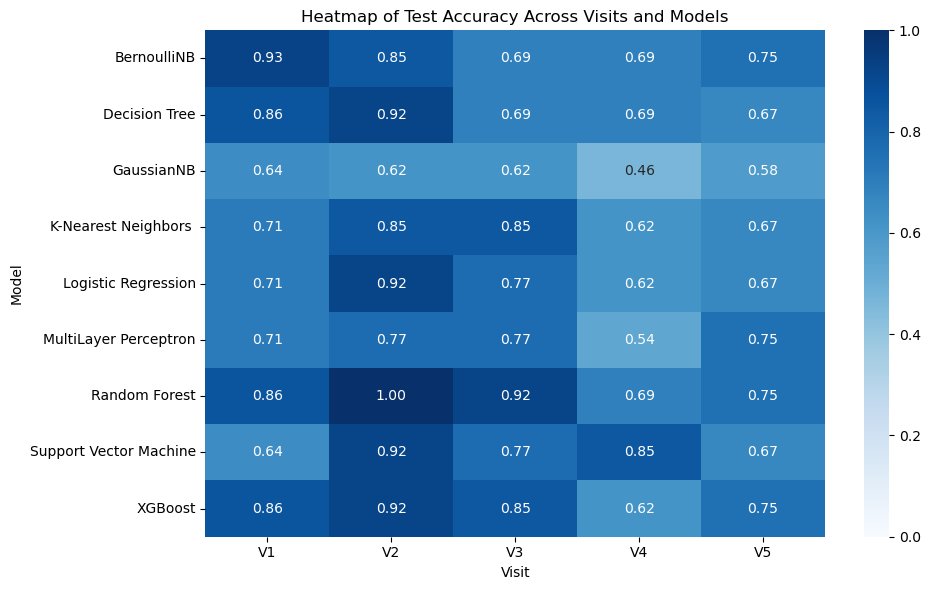

In [ ]:
plot_heatmap_model_visit(all_visits_results, metric='Test F1 Score')
plot_heatmap_model_visit(all_visits_results, metric='Test Accuracy')

visualize the test ROC AUC scores across visits

In [ ]:
# visualize the cv and test results across visits
def plot_cv_test_comparison_all_visits(df_all):
    metrics = ['Accuracy', 'F1 Score', 'Precision', 'Recall']
    visits = df_all['Visit'].unique()

    for visit in visits:
        df_result = df_all[df_all['Visit'] == visit]

        fig, axes = plt.subplots(2, 2, figsize=(25, 15))
        axes = axes.flatten()

        for i, metric in enumerate(metrics):
            cv_col = f'CV {metric}'
            test_col = f'Test {metric}'
            ax = axes[i]

            df_result.plot(
                x='Model',
                y=[cv_col, test_col],
                kind='bar',
                ax=ax,
                width=0.75,
                edgecolor='black'
            )

            ax.set_title(f'{visit}: CV vs Test {metric}')
            ax.set_ylabel(metric)
            ax.set_xlabel('Model')
            ax.set_ylim(0, 1.1)
            ax.tick_params(axis='x', rotation=45)
            ax.legend(["CV", "Test"])
            for container in ax.containers:
                labels = [f'{h*100:.1f}%' for h in container.datavalues]
                ax.bar_label(container, labels = labels, label_type='edge', fontsize=10, padding=3)
        plt.suptitle(f'{visit} - CV vs Test Comparison', fontsize=16)
        
        
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

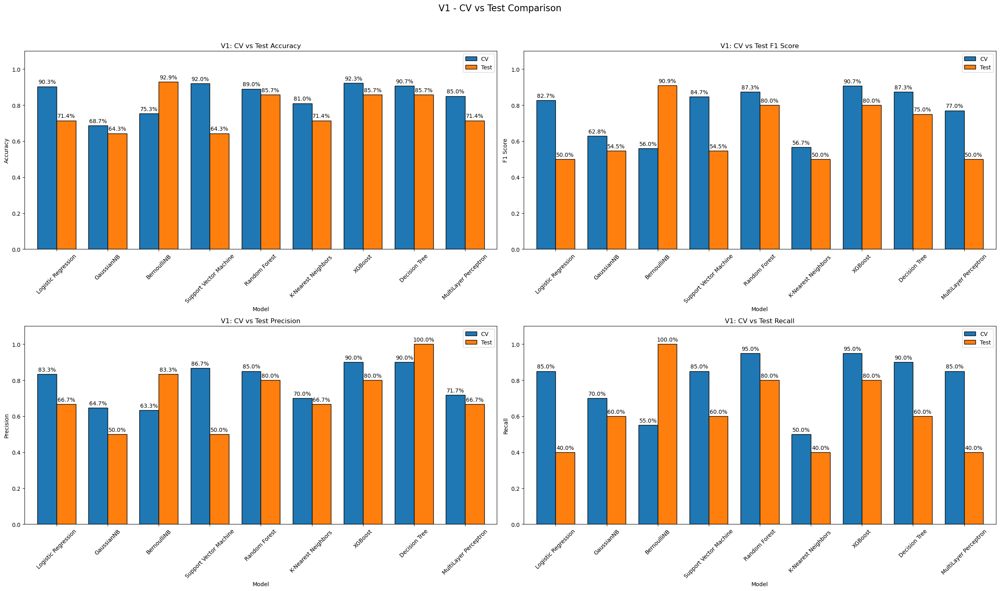

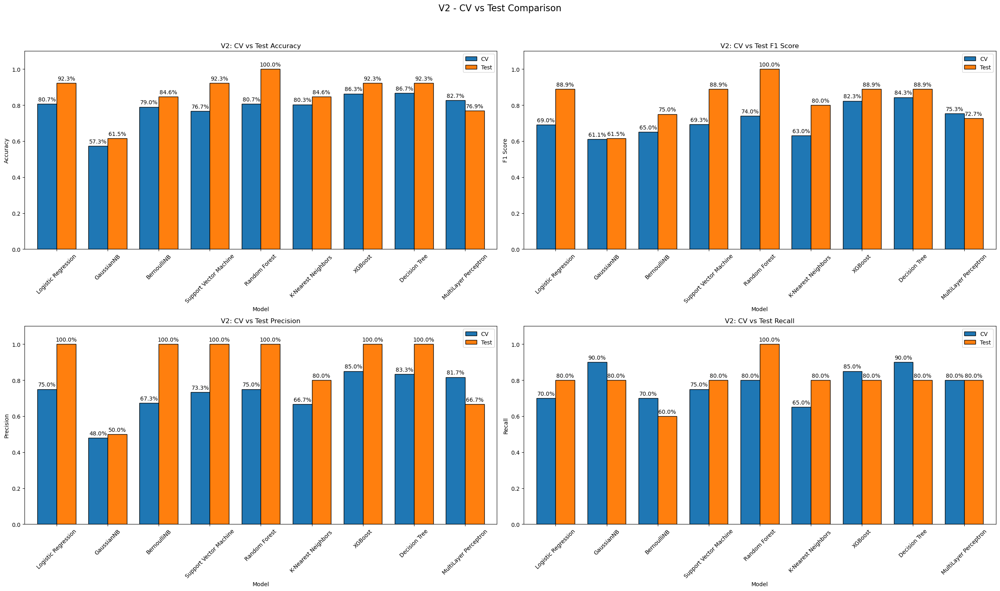

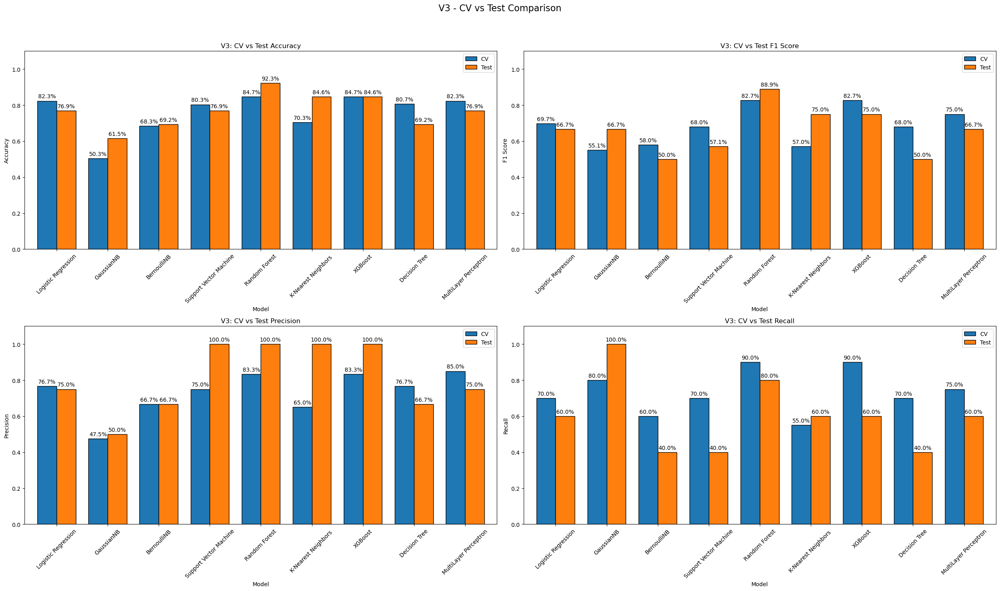

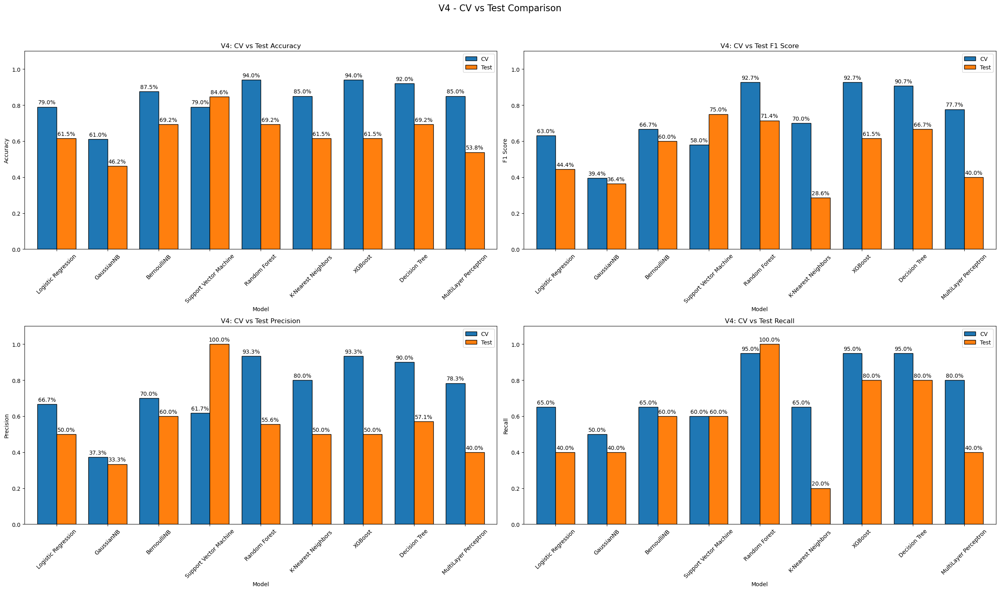

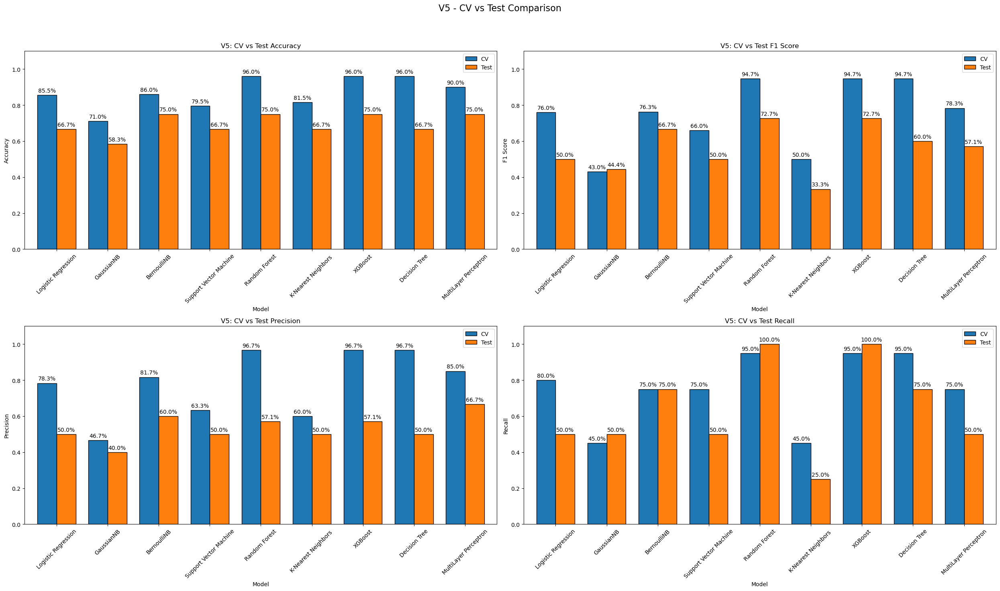

In [ ]:
plot_cv_test_comparison_all_visits(all_visits_results)

visualize the test ROC AUC scores across visits

In [ ]:
# visualize the test ROC AUC scores across visits
def plot_roc_auc_by_visit(df_all):
    visits = df_all['Visit'].unique()

    for visit in visits:
        df_result = df_all[df_all['Visit'] == visit]
        plt.figure(figsize=(15, 9))
        ax = sns.barplot(data=df_result, x='Model', y='Test ROC AUC', palette="Blues_d")
        plt.title(f'{visit} - Test ROC AUC by Model')
        plt.ylim(0, 1.05)
        plt.xticks(rotation=45)
        for container in ax.containers:
            ax.bar_label(container, fmt='%.2f', label_type='edge', fontsize=10, padding=3)
        plt.xlabel('Model')
        plt.tight_layout()
        plt.show()

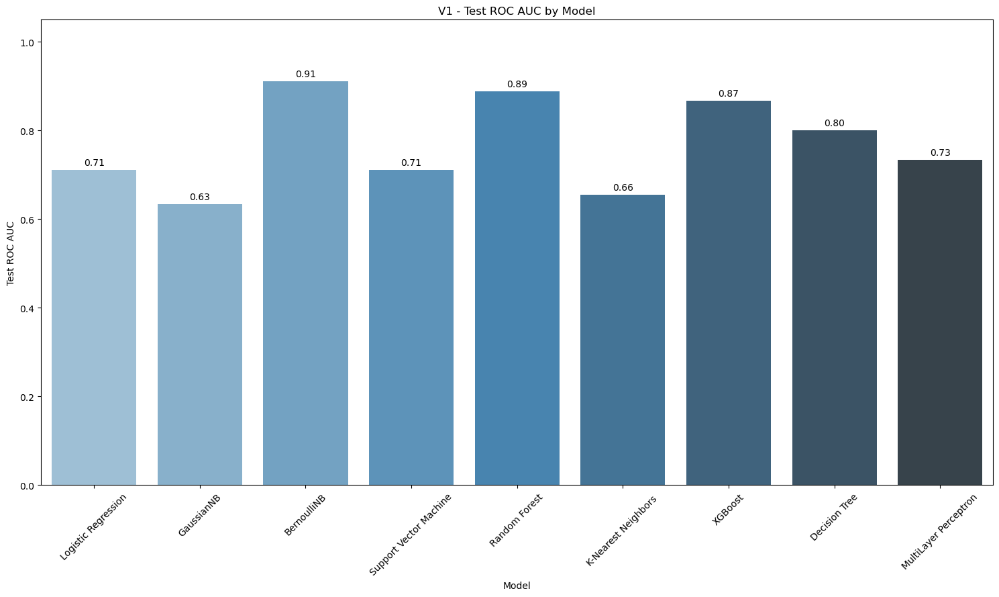

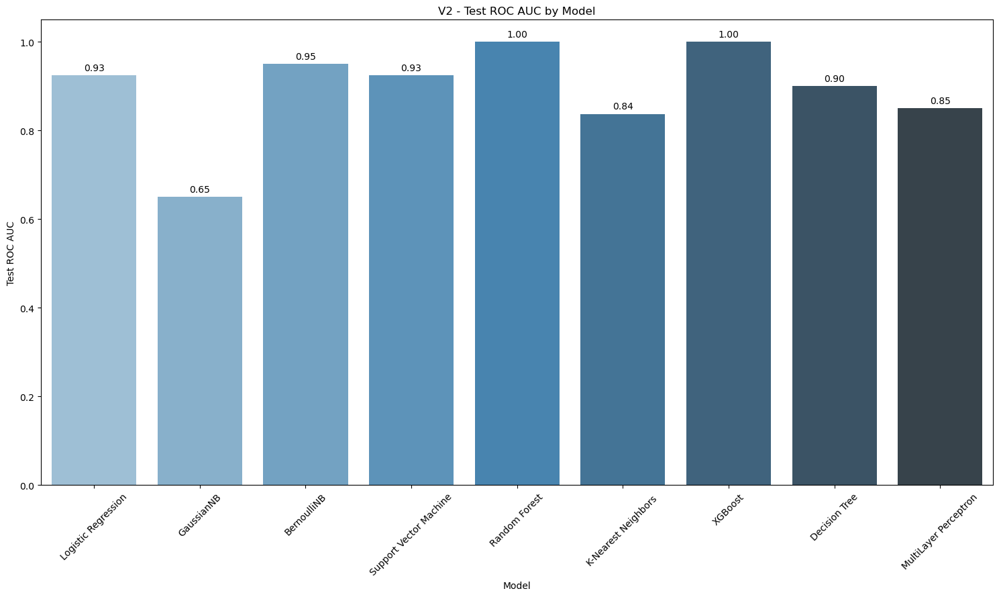

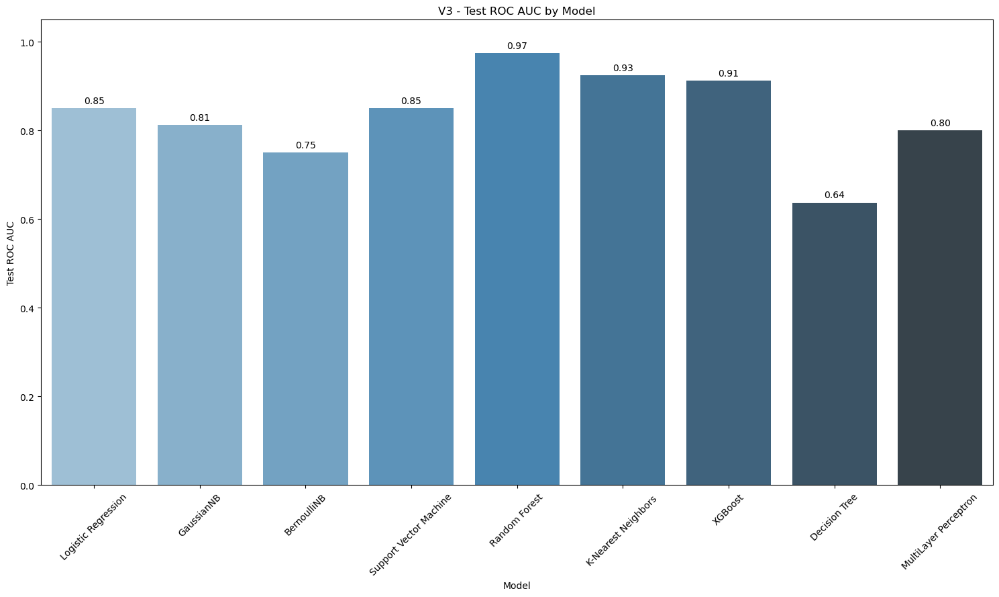

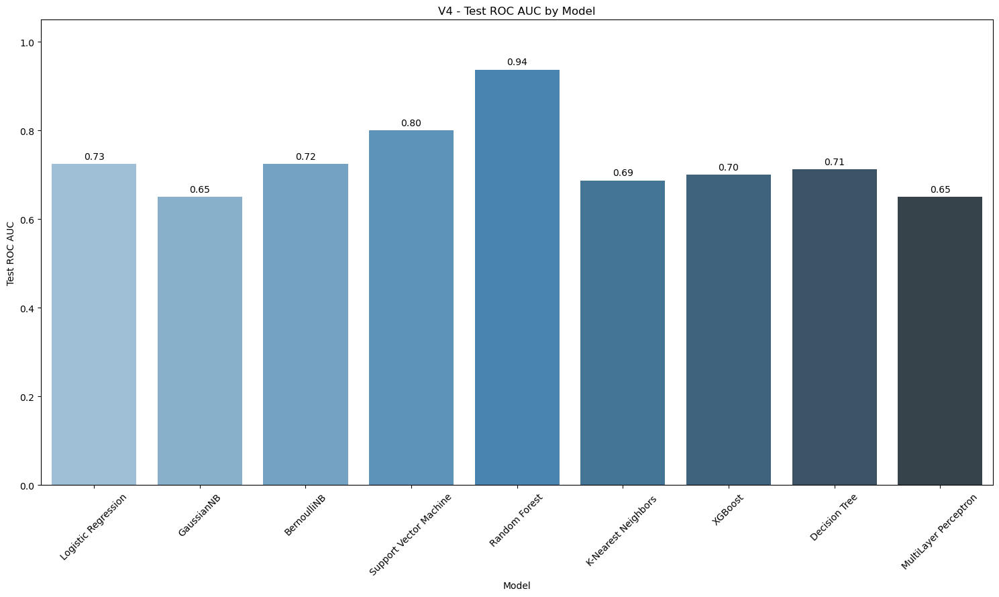

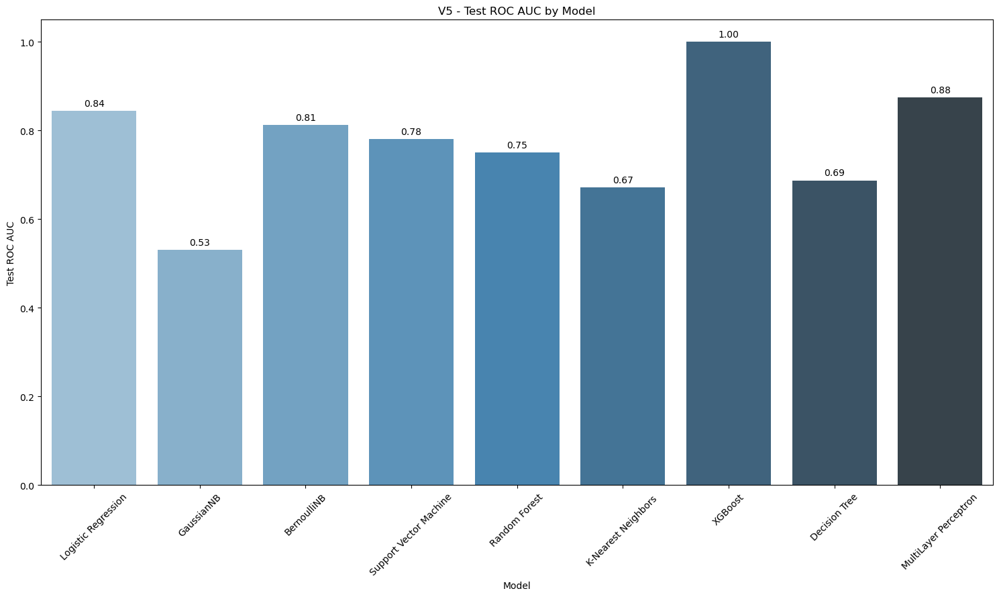

In [ ]:
plot_roc_auc_by_visit(all_visits_results)

In [ ]:
# Visualize the ROC AUC scores with 95% confidence intervals
def plot_roc_with_ci(models_dict, X_test, y_test, visit = 'v1'):
    from sklearn.metrics import roc_curve, auc
    from sklearn.utils import resample
    import matplotlib.pyplot as plt
    import numpy as np

    plt.figure(figsize = (12,10))
    n_bootstraps = 1000
    colors = sns.color_palette("husl", len(models_dict))

    y_test_array = np.array(y_test)

    for idex, (name, model) in enumerate(models_dict.items()):

        model = model['estimator']
        try:
            # for models that support predict_proba
            y_score = model.predict_proba(X_test)[:, 1]
        except:
            try:
                # for models that support decision_function
                y_score = model.decision_function(X_test)
            except:
                # for models that do not support predict_proba or decision_function
                y_score = model.predict(X_test)
        fpr_, tpr_, _ = roc_curve(y_test_array, y_score)
        roc_auc = auc(fpr_, tpr_)
        plt.plot(fpr_, tpr_, color=colors[idex], label=f'{name} (AUC = {roc_auc:.2f})')

        # Bootstrap for confidence intervals
        tprs = []
        aucs = []
        base_fpr = np.linspace(0, 1, 100)

        for _ in range(n_bootstraps):
            indices = resample(np.arange(len(y_test_array)), replace=True)
            if len(np.unique(y_test_array[indices])) < 2:
                continue
            fpr_boot, tpr_boot, _ = roc_curve(y_test_array[indices], y_score[indices])
            tpr_interp = np.interp(base_fpr, fpr_boot, tpr_boot)
            tprs.append(tpr_interp)
            aucs.append(auc(fpr_boot, tpr_boot))
        
        # compute 95% CI
        ci_lower = np.percentile(aucs, 2.5, axis=0)
        ci_upper = np.percentile(aucs, 97.5, axis=0)

        # plot the mean ROC curve
        plt.plot(fpr_, tpr_, color = colors[idex], label = f'95% CI [{ci_lower:.2f} - {ci_upper:.2f}]')
        # plot CI band
        mean_trps = np.mean(tprs, axis=0)
        std_trps = np.std(tprs, axis=0)
        tprs_upper = np.minimum(mean_trps + 1.96 * std_trps, 1)
        tprs_lower = np.maximum(mean_trps - 1.96 * std_trps, 0)
        plt.fill_between(base_fpr, tprs_lower, tprs_upper, color=colors[idex], alpha=0.2)

    plt.plot([0, 1], [0, 1], 'k--', lw = 2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve with 95% CI - {visit.upper()}')
    plt.legend(loc='lower right')
    plt.tight_layout()
    plt.show()

/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [3] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [3] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [3] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [3] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/s

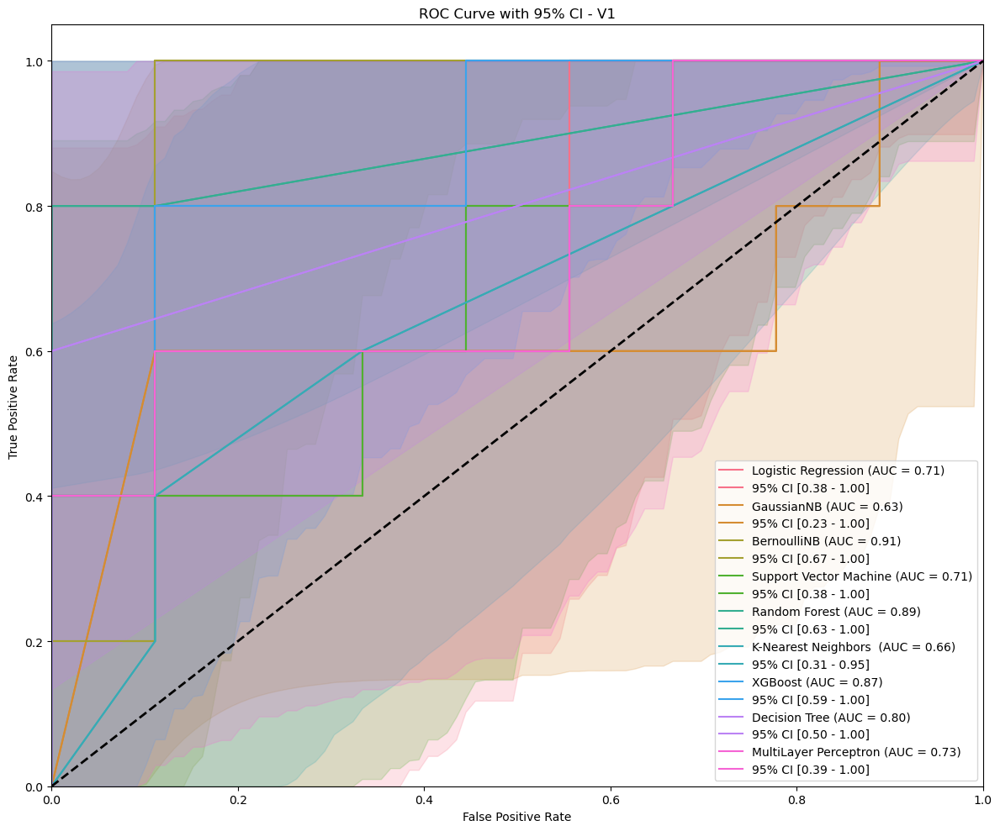

/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [4] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [4] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [4] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [4] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/s

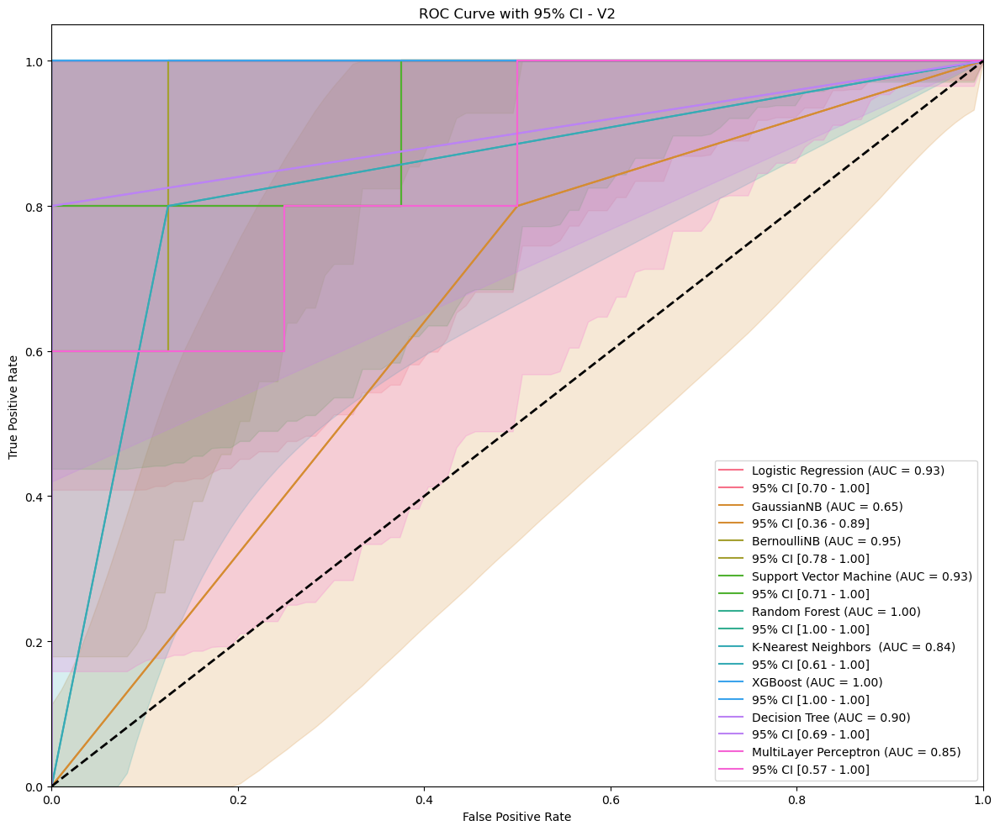

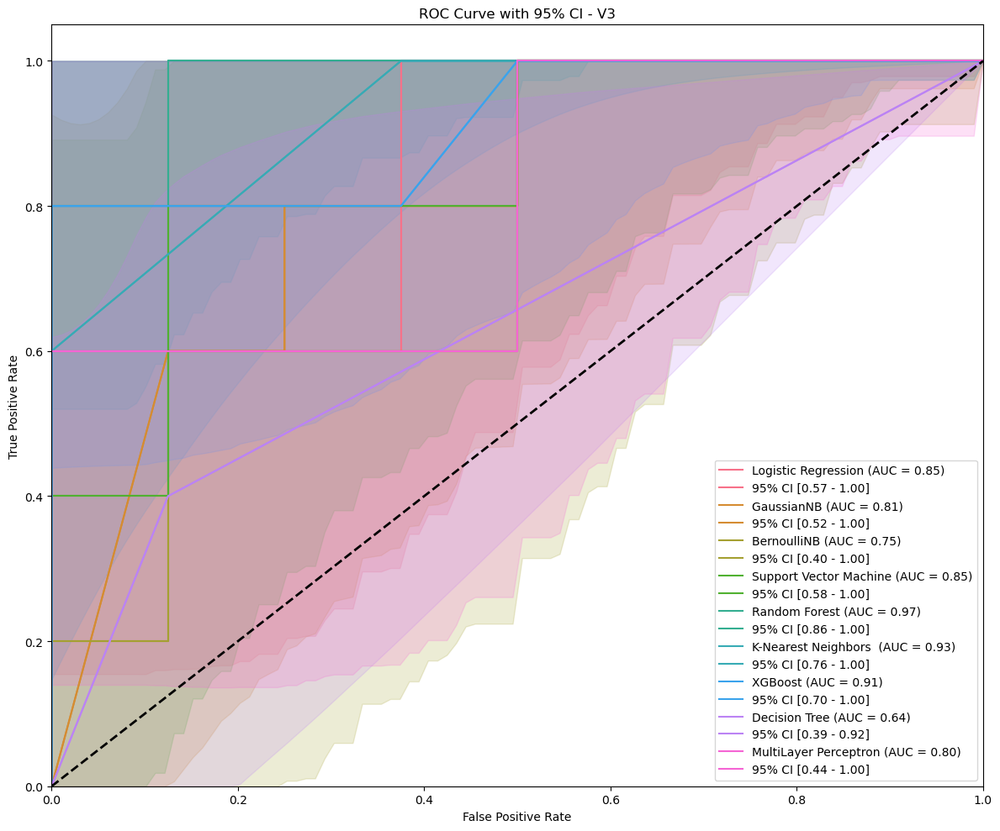

/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [2, 3, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [2, 3, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [2, 3, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [2, 3, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/an

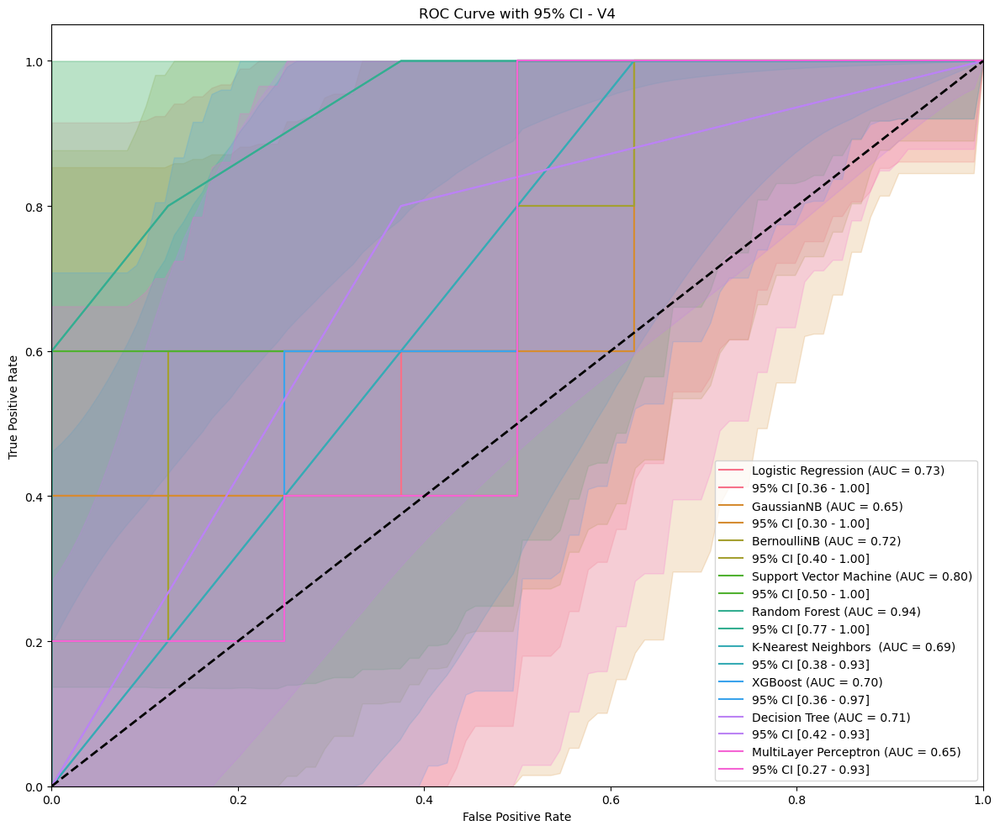

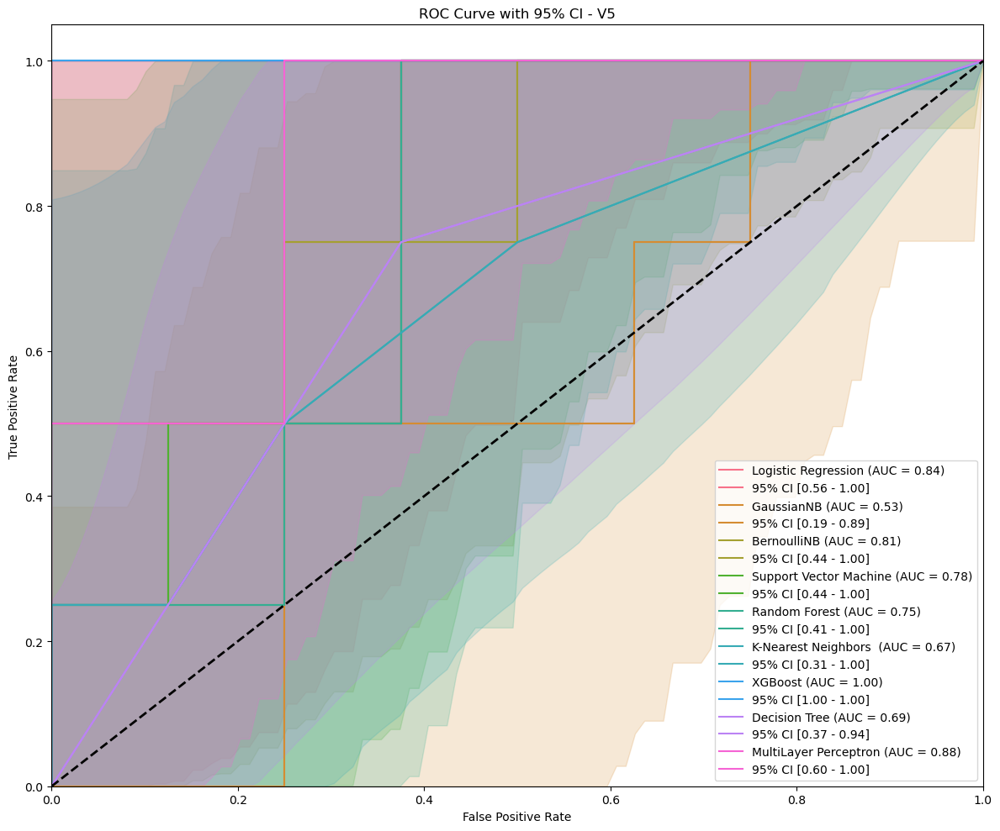

In [ ]:
for v in range(1,6):
    visit = f'v{v}'
    all_best_models = joblib.load(f"../data/all_best_models.pkl")
    X_test = joblib.load(f"../data/all_x_tests.pkl")[f'V{v}']
    y_test = joblib.load(f"../data/all_y_tests.pkl")[f'V{v}']
    plot_roc_with_ci(all_best_models[f'V{v}'], X_test, y_test, visit=visit)

visulize the confusion matrix

In [ ]:
# visualize the confusion matrix for each model
def plot_confusion_matrix(df):
    from sklearn.metrics import ConfusionMatrixDisplay
    import matplotlib.pyplot as plt
    import re
    import numpy as np
    visits = df['Visit'].unique()
    models = df['Model'].unique()
    for visit in visits:
        fig, axes = plt.subplots(3,3, figsize = (20,15))
        axes = axes.flatten()
        for idx,model in enumerate(models):
            ax = axes[idx]
            subset = df[(df['Visit'] == visit) & (df['Model'] == model)]
            if subset.empty:
                continue
            try:
                cm_str = subset['Confusion Matrix'].values[0]
                cm_str = re.sub(r"\s+", ", ", cm_str.replace("\n", " "))
                cm_str = cm_str.replace("[,", "[").replace(",]", "]")  # edge cleanup
                cm = np.array(eval(cm_str))
                disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No PWR', 'PWR'])
                disp.plot(ax = ax,cmap='Blues', values_format='d',colorbar=False)
                ax.set_title(f'{visit} - {model}')
            except Exception as e:
                print(f"Skipping {visit} - {model} due to error: {e}")
                ax.axis('off')
    plt.tight_layout()
    plt.show()


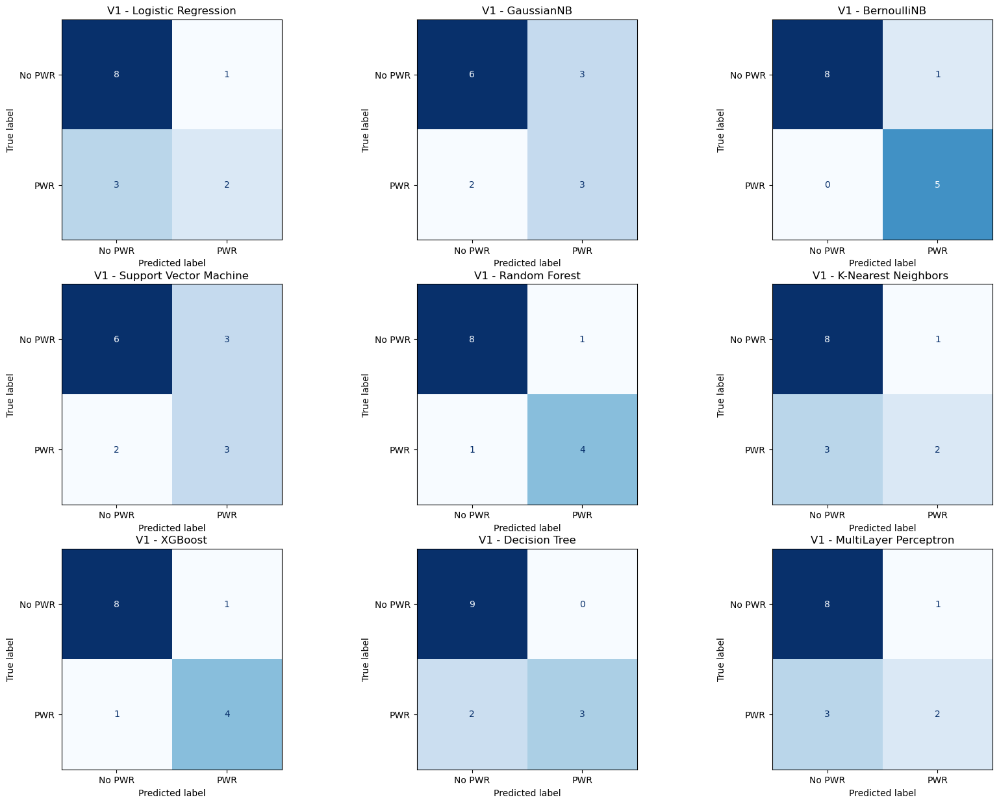

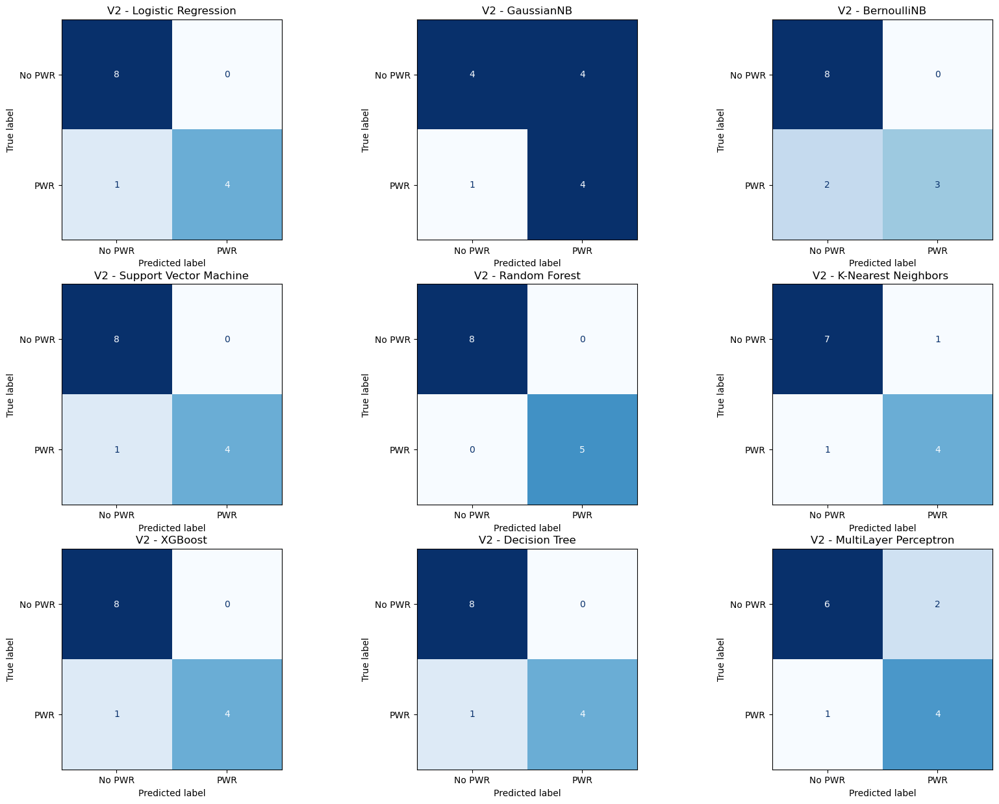

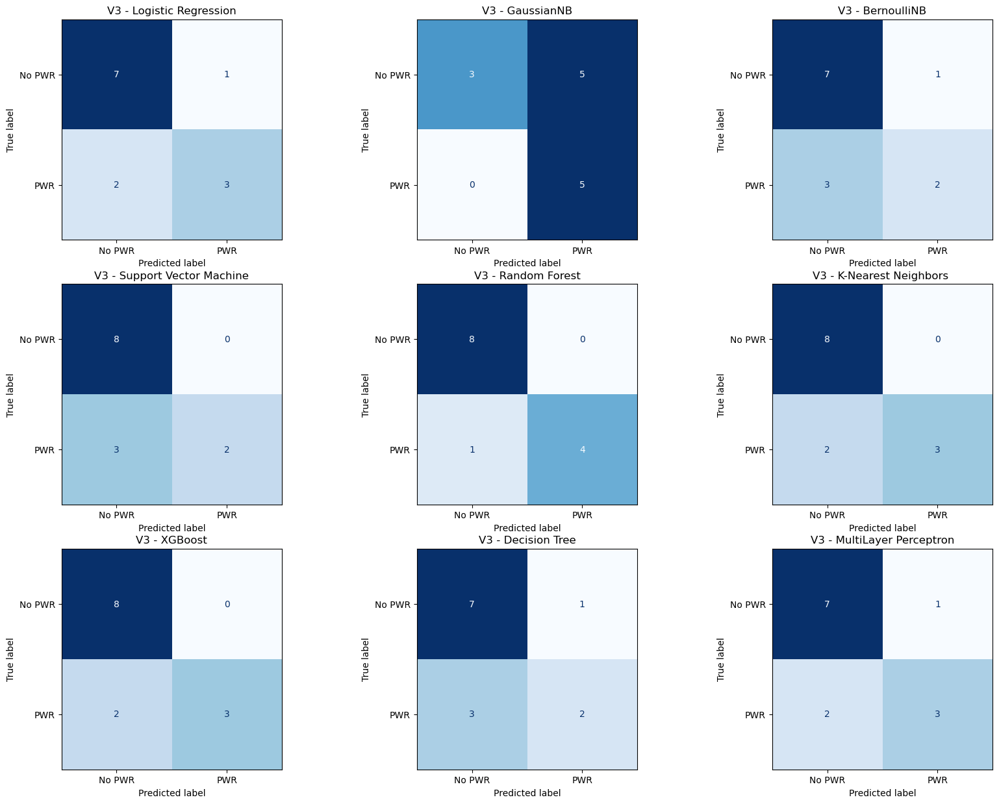

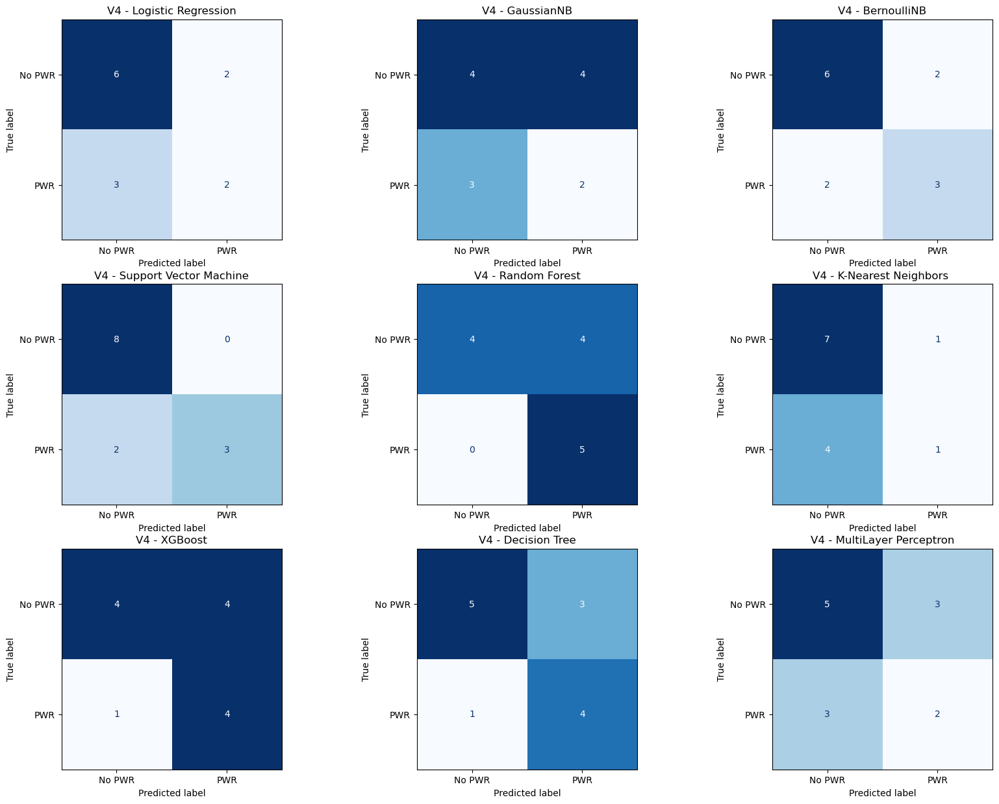

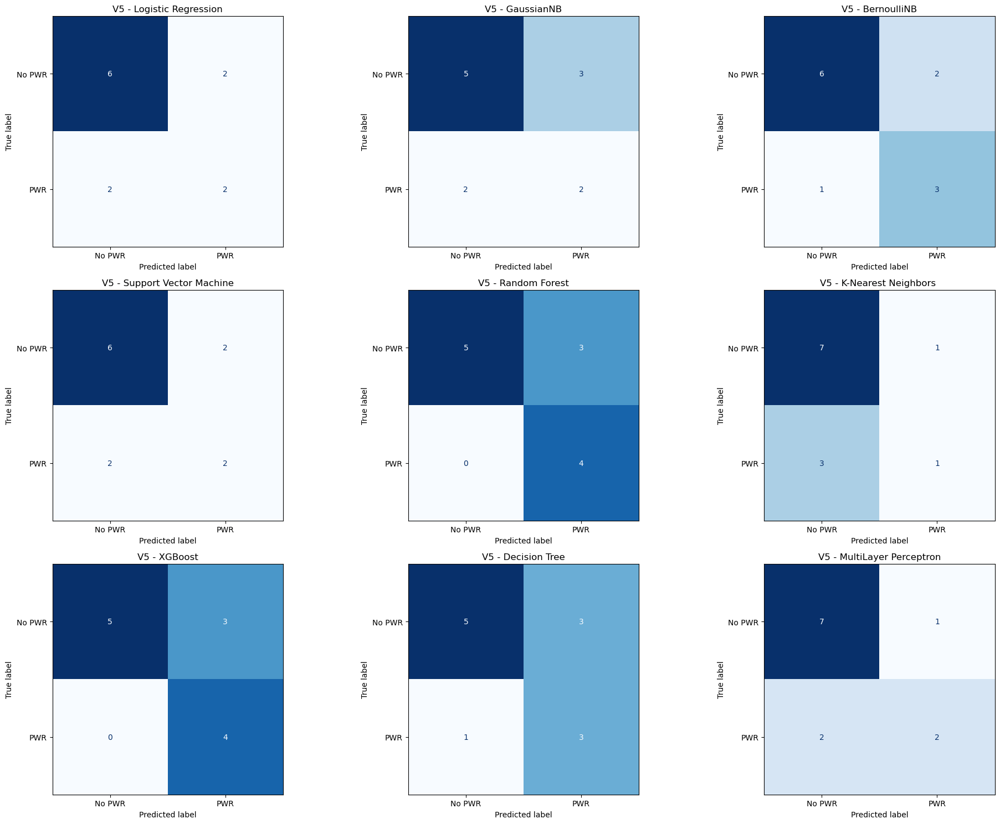

In [ ]:
all_visits_results = pd.read_excel("../data/model_results_all_visits_hyper.xlsx")
plot_confusion_matrix(all_visits_results)

Select the best performance model

In [ ]:
def select_best_model(df):
    # Define the test metrics to average
    metrics = ['Test F1 Score', 'Test Accuracy', 'Test Precision', 'Test Recall', 'Test ROC AUC']

    # Compute mean performance per model
    mean_performance = df.groupby('Model')[metrics].mean()
    mean_performance.reset_index(inplace=True)

    # Select the model with the highest mean ROC AUC
    best_row = mean_performance.loc[mean_performance['Test ROC AUC'].idxmax()]
    return best_row, mean_performance

best_model, all_model_averages = select_best_model(all_visits_results)

# Print best model info
print("Best Model based on Mean Test ROC AUC:")
print(best_model[['Model', 'Test ROC AUC', 'Test F1 Score', 'Test Accuracy', 'Test Precision', 'Test Recall']])
# Print all model averages
print("\nAll Model Averages:")
print(all_model_averages)
# save the all model averages to a CSV file
all_model_averages.to_csv("../data/all_model_averages.csv", index=False)

Best Model based on Mean Test ROC AUC:
Model             Random Forest
Test ROC AUC           0.910278
Test F1 Score          0.826089
Test Accuracy          0.844505
Test Precision         0.785397
Test Recall                0.92
Name: 6, dtype: object

All Model Averages:
                    Model  Test F1 Score  Test Accuracy  Test Precision  \
0             BernoulliNB       0.685152       0.781868        0.740000   
1           Decision Tree       0.681111       0.766300        0.747619   
2              GaussianNB       0.527117       0.583700        0.446667   
3    K-Nearest Neighbors        0.533810       0.737729        0.693333   
4     Logistic Regression       0.600000       0.737729        0.683333   
5   MultiLayer Perceptron       0.573074       0.708242        0.630000   
6           Random Forest       0.826089       0.844505        0.785397   
7  Support Vector Machine       0.651154       0.769597        0.800000   
8                 XGBoost       0.756309       0.7

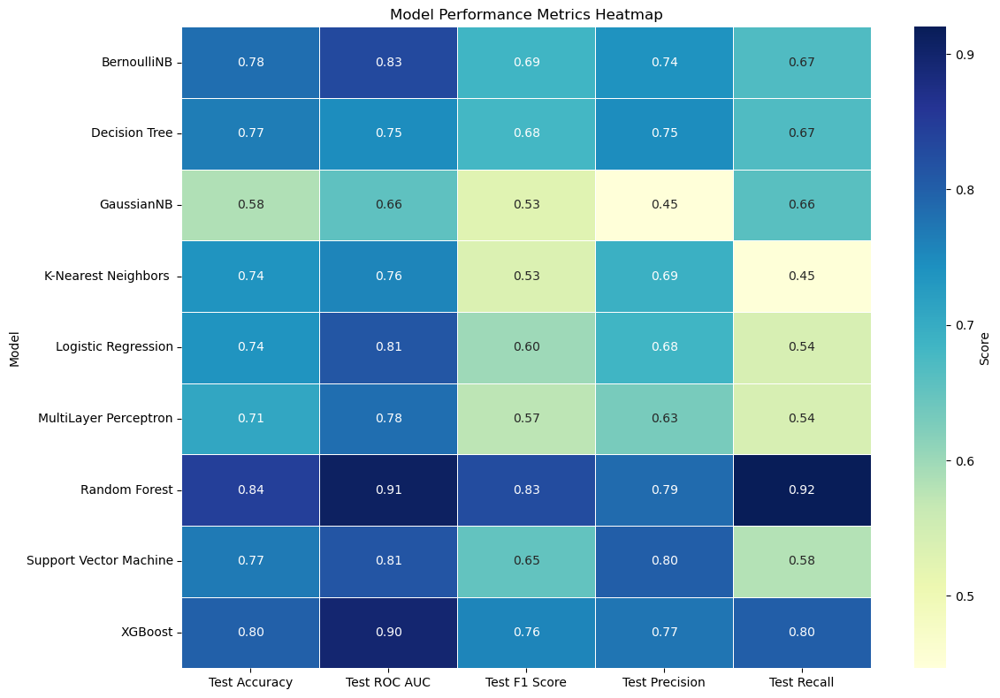

In [ ]:
plt.figure(figsize=(12, 8))
metrics_heatmap = all_model_averages.set_index('Model')
metrics_heatmap = metrics_heatmap[['Test Accuracy', 'Test ROC AUC','Test F1 Score', 'Test Precision', 'Test Recall']]
sns.heatmap(metrics_heatmap, annot=True, cmap='YlGnBu', fmt='.2f',linewidths=0.5, cbar_kws={'label':'Score'})
plt.title('Model Performance Metrics Heatmap')
plt.tight_layout()
plt.show()

Calibration curve

assess how well the model's predicted probabilities align with the actual observed frequencies. If a model predicts a 70% probability for a class, then in a peRandomForestectly calibrated scenario, 70% of those instances should actually belong to that class.

In [ ]:
# Visualize the calibration curve for the best model
def plot_calibration_curve(all_best_models, all_x_tests, all_y_tests, model_name = 'RandomForest'):
    import matplotlib.pyplot as plt
    from sklearn.calibration import calibration_curve
    import numpy as np

    visits = ['V1', 'V2', 'V3', 'V4', 'V5']
    plt.figure(figsize=(12, 8))

    for visit in visits:
        model_dict = all_best_models[visit][model_name]
        model = model_dict['estimator']
        X_test = all_x_tests[visit]
        y_test = all_y_tests[visit]

        try:
            y_proba = model.predict_proba(X_test)[:, 1]
        except:
            try:
                y_proba = model.decision_function(X_test)
            except:
                y_proba = model.predict(X_test)
        prob_true, prob_pred = calibration_curve(y_test, y_proba, n_bins=10)
        plt.plot(prob_pred, prob_true, marker='o', label=f'{visit} - {model_name}')
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfectly Calibrated')
    plt.title(f'Calibration Curve for {model_name}')
    plt.xlabel('Mean Predicted Probability')
    plt.ylabel('Fraction of Positives')
    plt.legend()
    plt.tight_layout()
    plt.show()

/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [3] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [4] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [2, 3, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


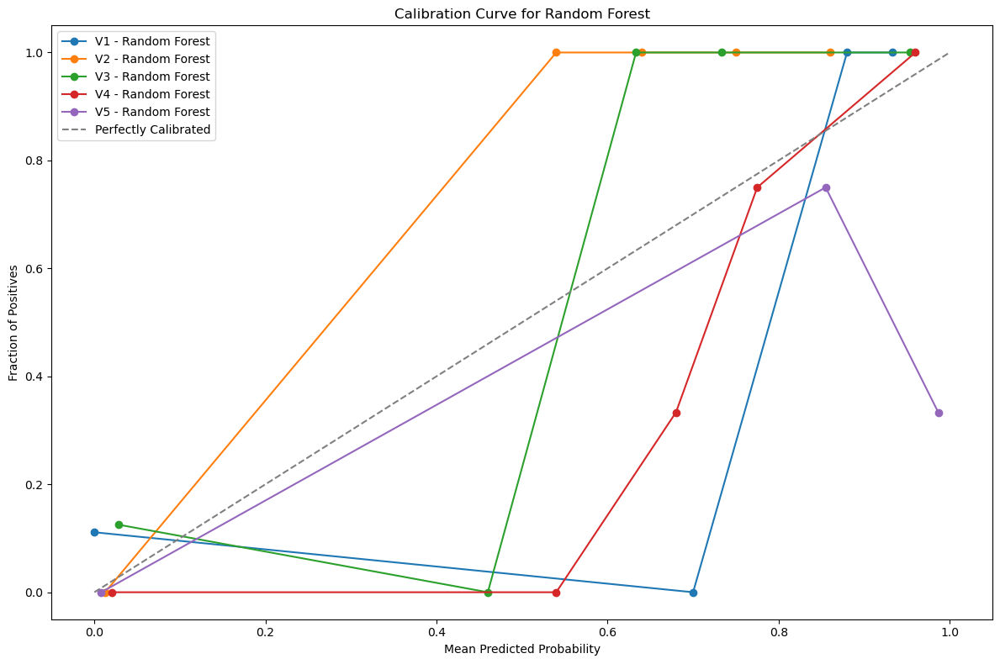

/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [3] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [4] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/Users/billhikari/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [2, 3, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


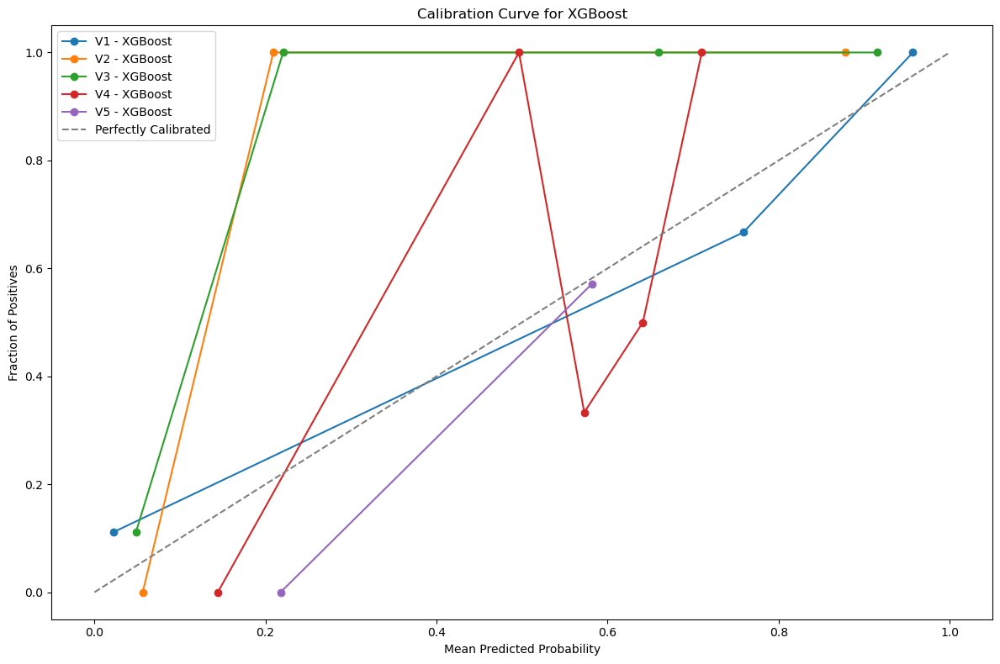

In [ ]:
plot_calibration_curve(all_best_models, all_x_tests, all_y_tests, model_name='Random Forest')
plot_calibration_curve(all_best_models, all_x_tests, all_y_tests, model_name='XGBoost')

SHAP

In [ ]:
# use preprocessor to get feature names
def get_feature_names(preprocessor):
    output_features = []
    for name, trans, cols in preprocessor.transformers_:
        if trans == 'passthrough':
            output_features.extend(cols)
        elif hasattr(trans, 'get_feature_names_out'):
            if isinstance(cols, list):
                names = trans.get_feature_names_out(cols)
            else:
                names = trans.get_feature_names_out()
            output_features.extend(names)
        else:
            output_features.extend(cols)
    return output_features



Running SHAP for XGBoost - V1


/Users/billhikari/anaconda3/envs/shap/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [3] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


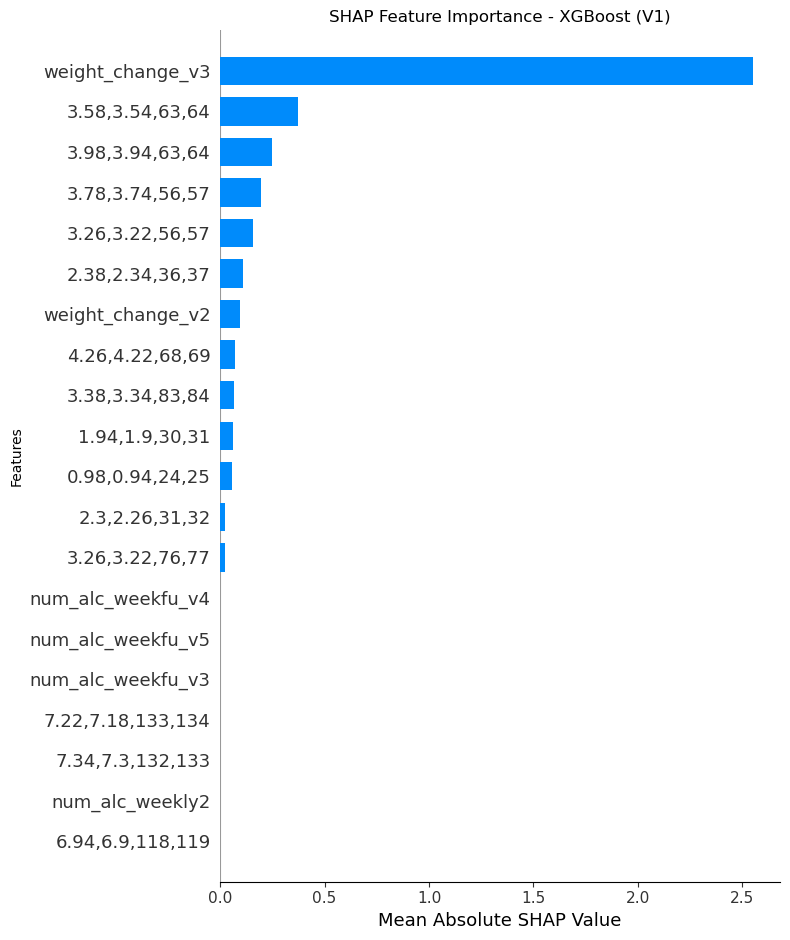

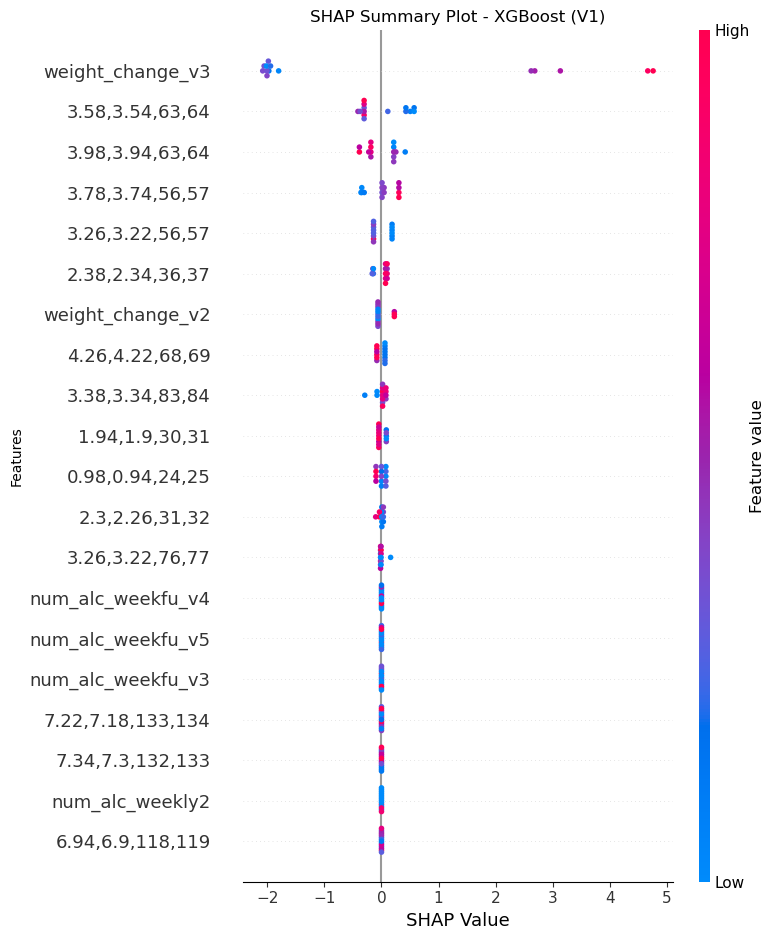

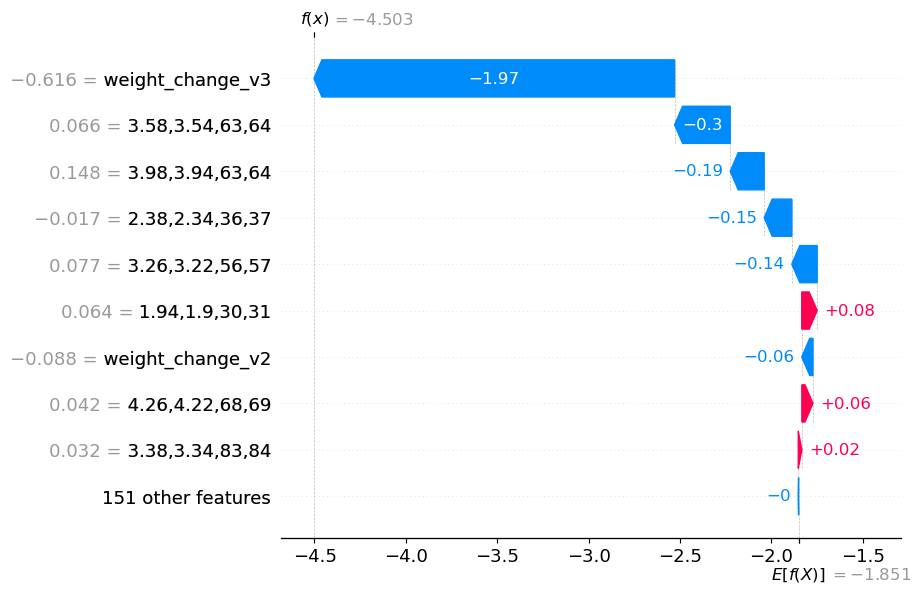

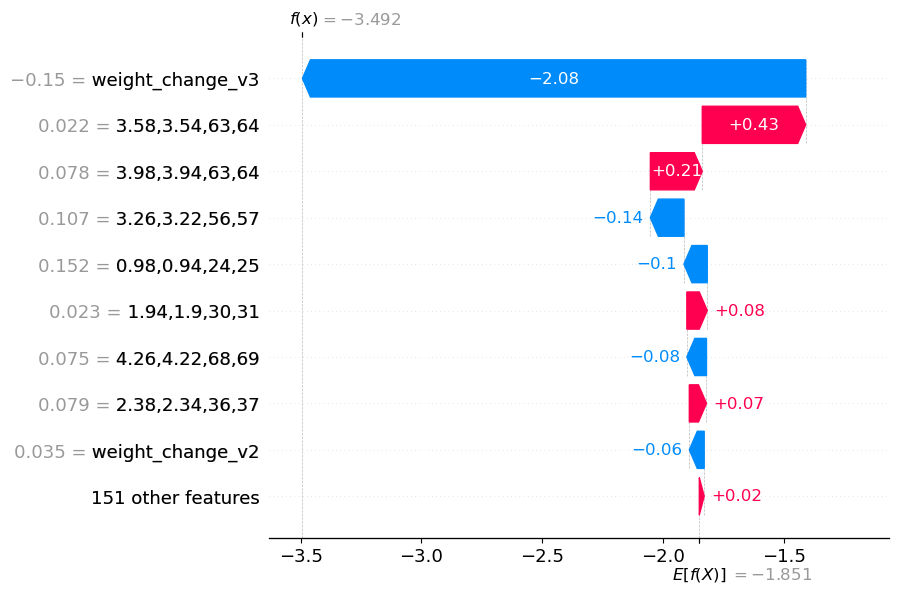

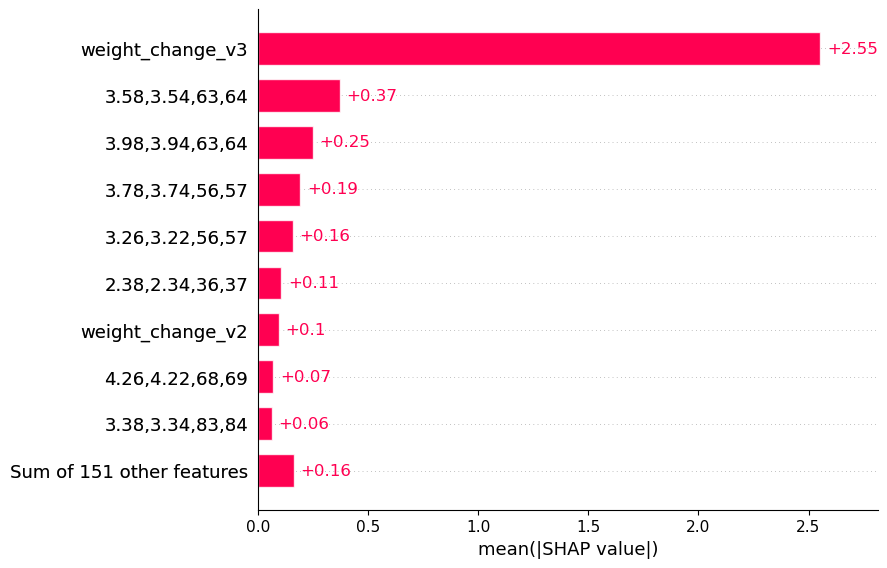

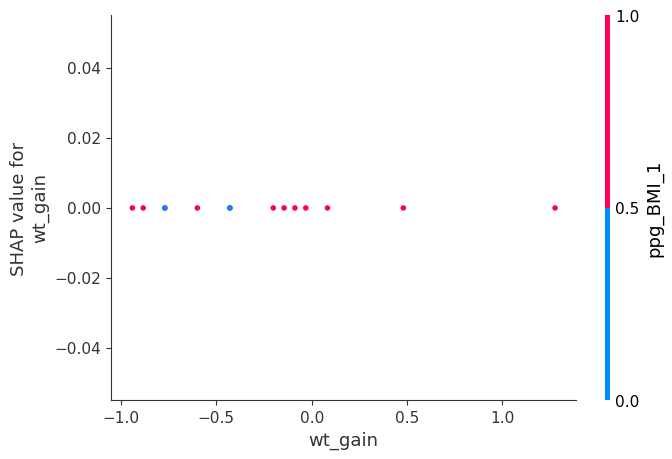

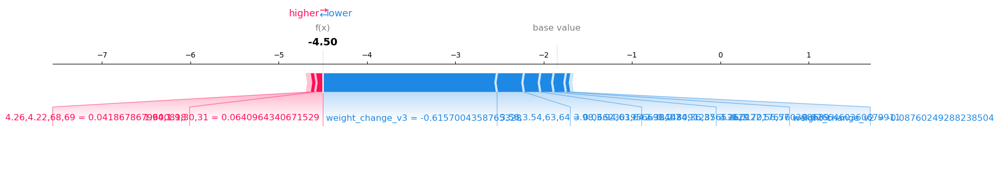

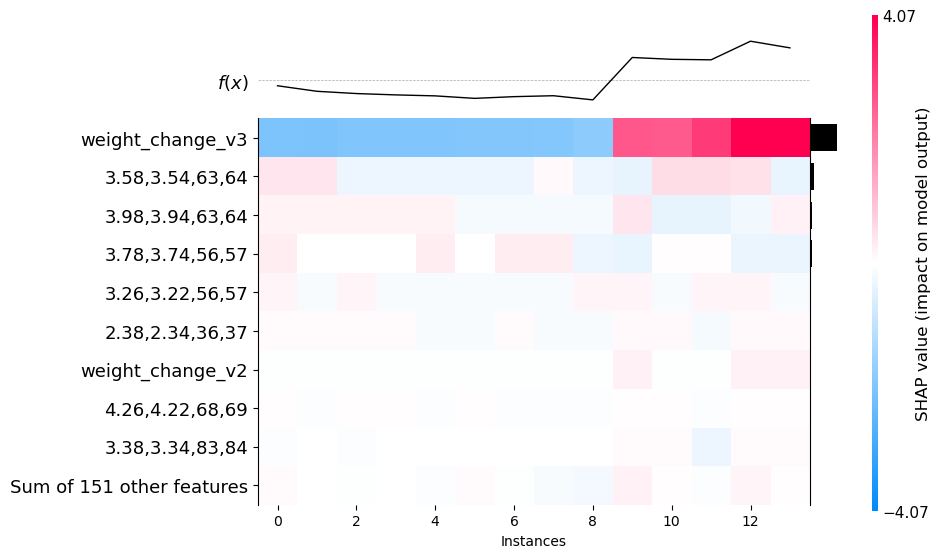


Running SHAP for XGBoost - V2


/Users/billhikari/anaconda3/envs/shap/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [4] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


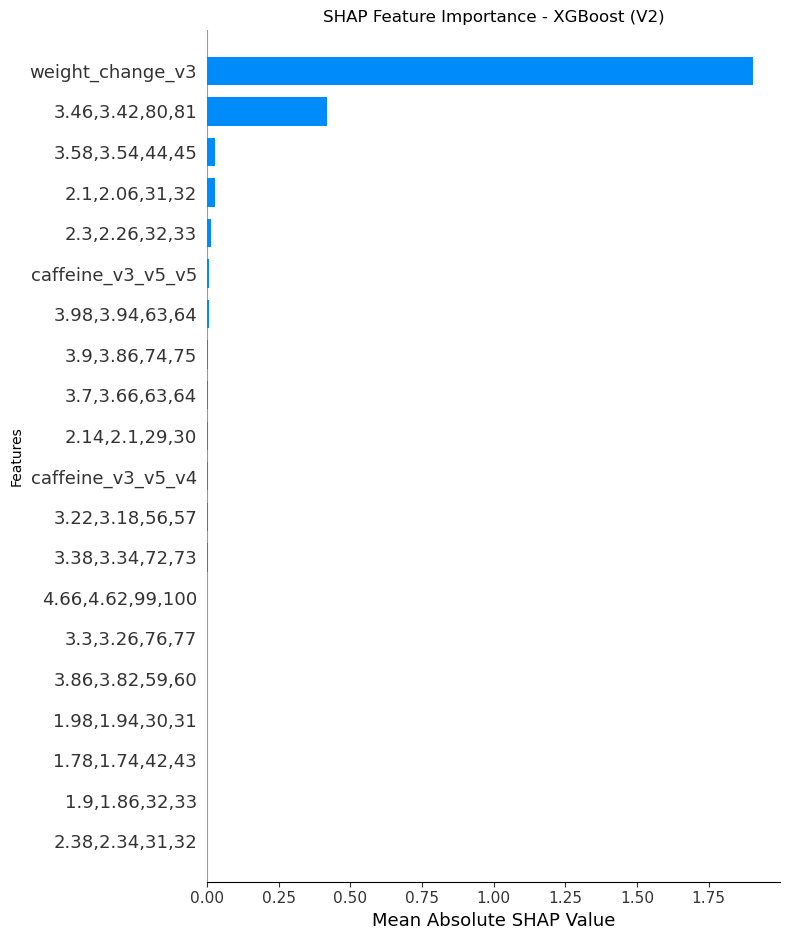

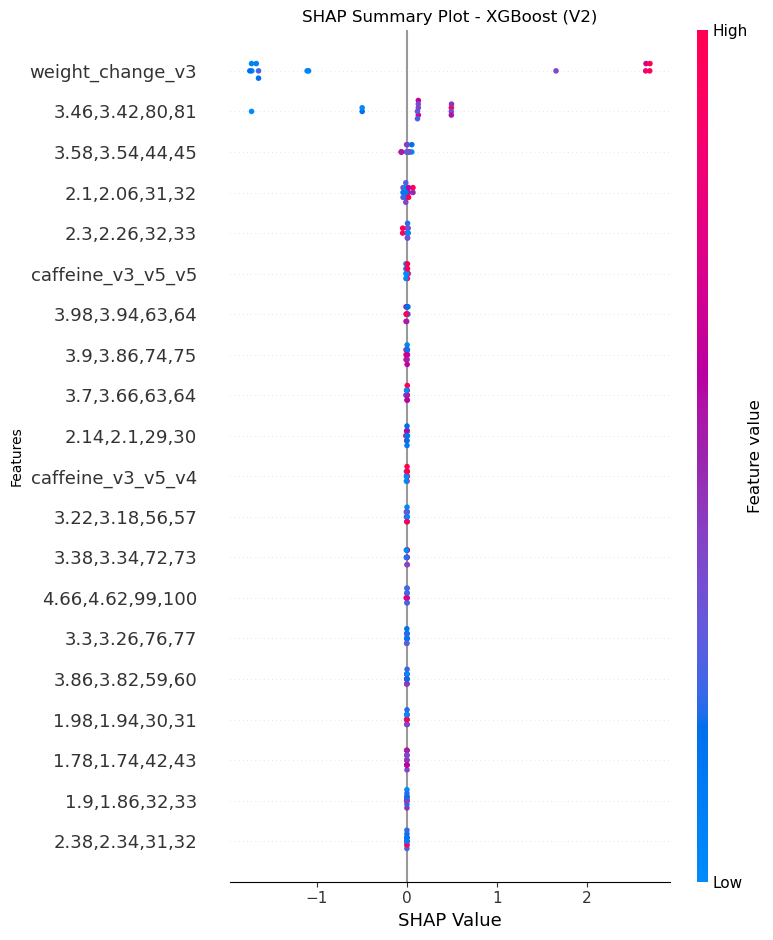

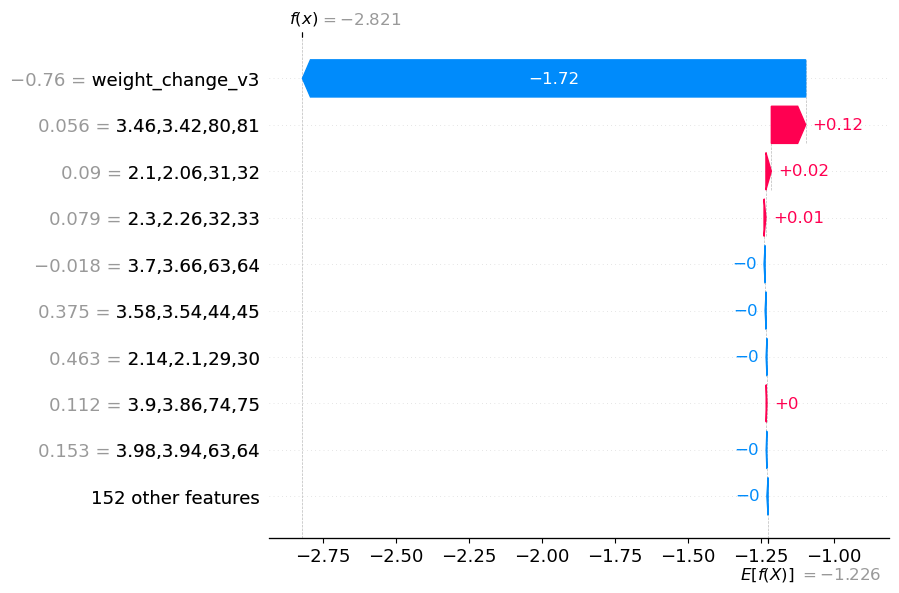

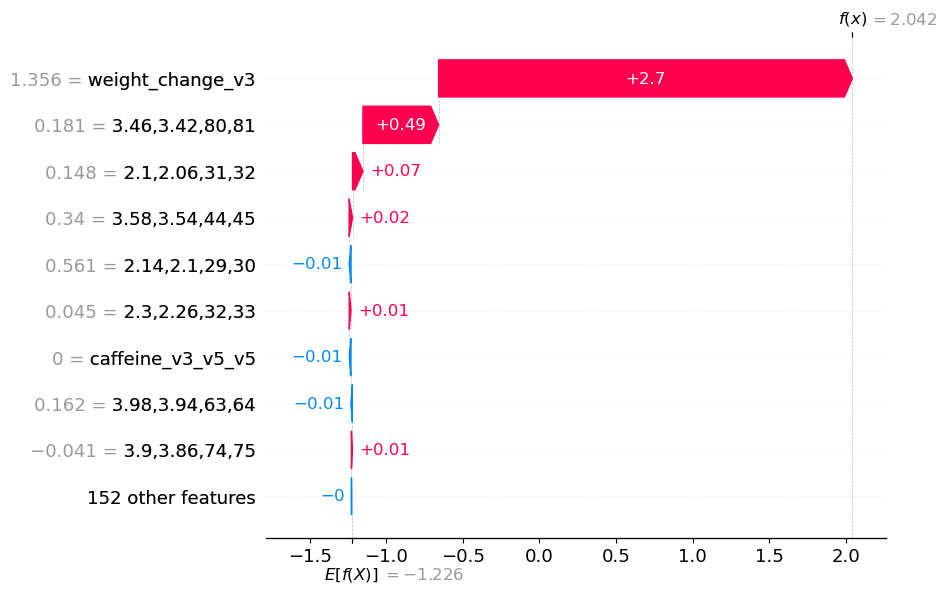

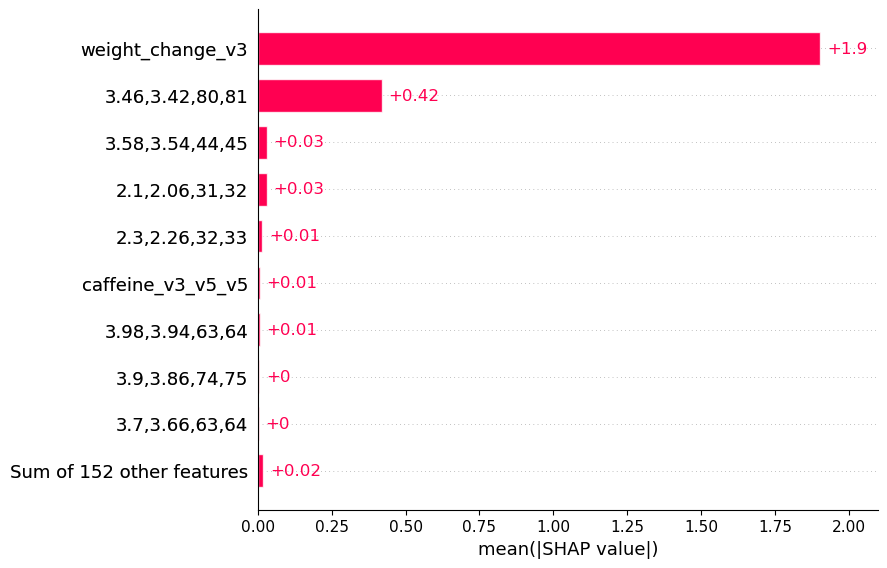

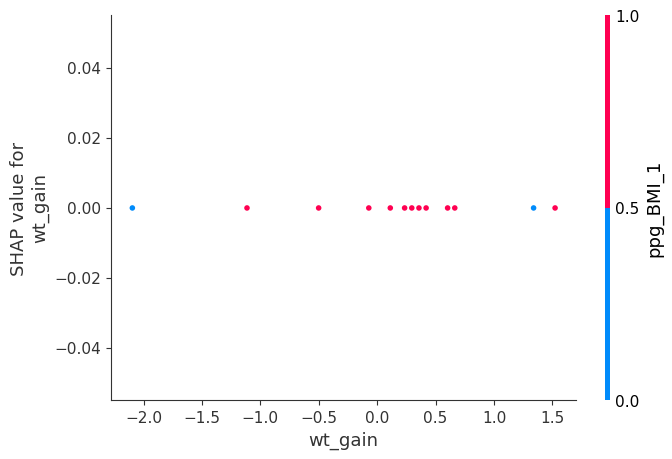

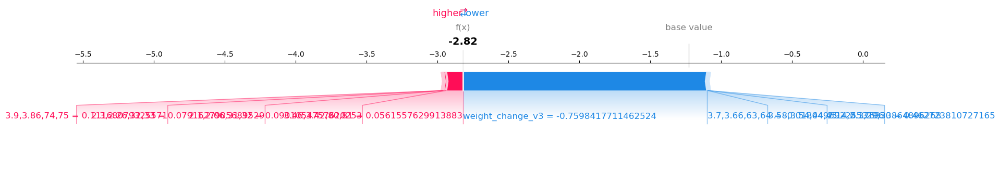

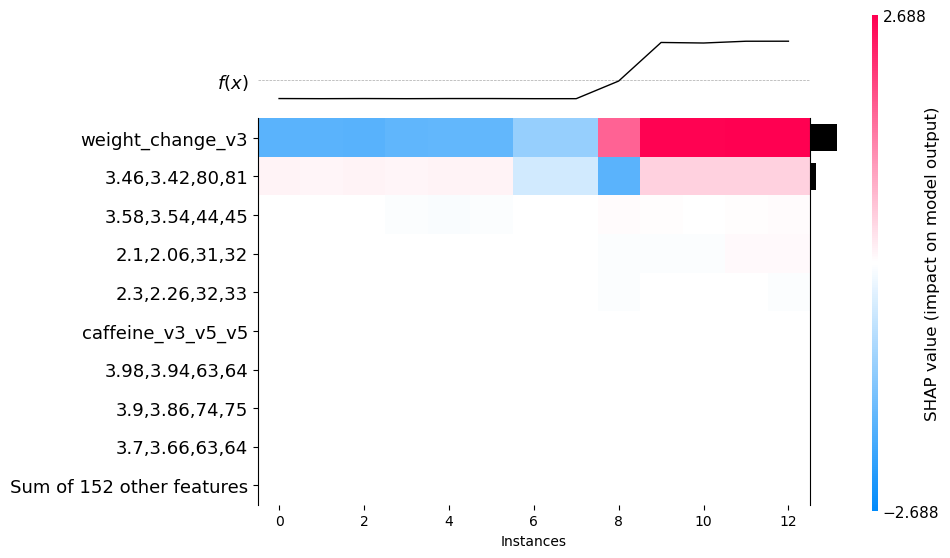


Running SHAP for XGBoost - V3


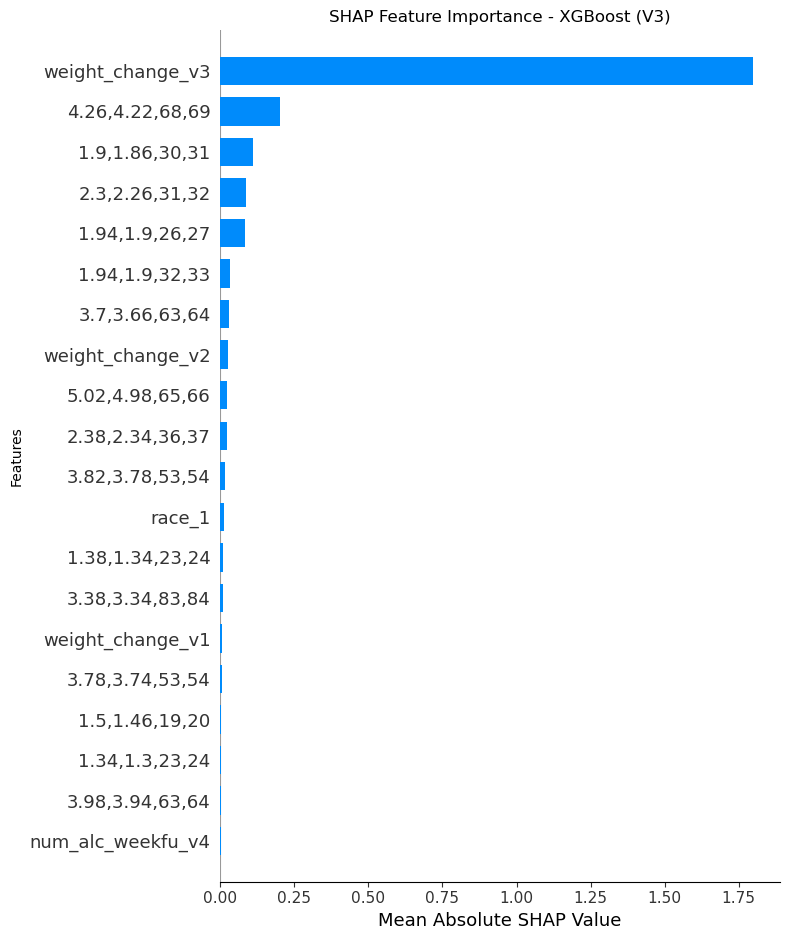

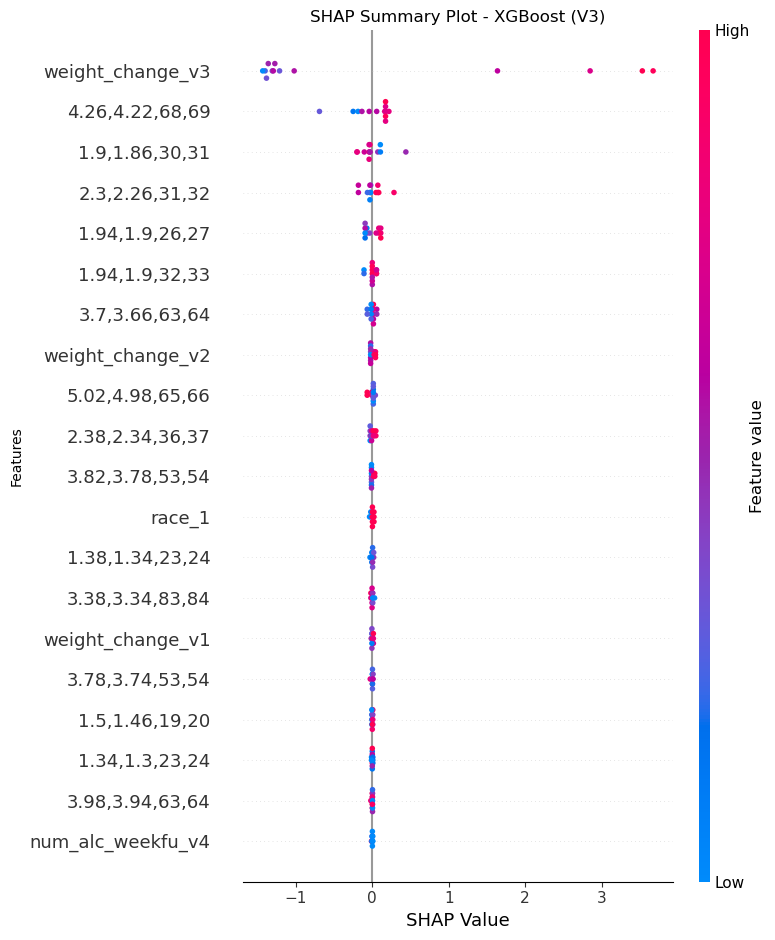

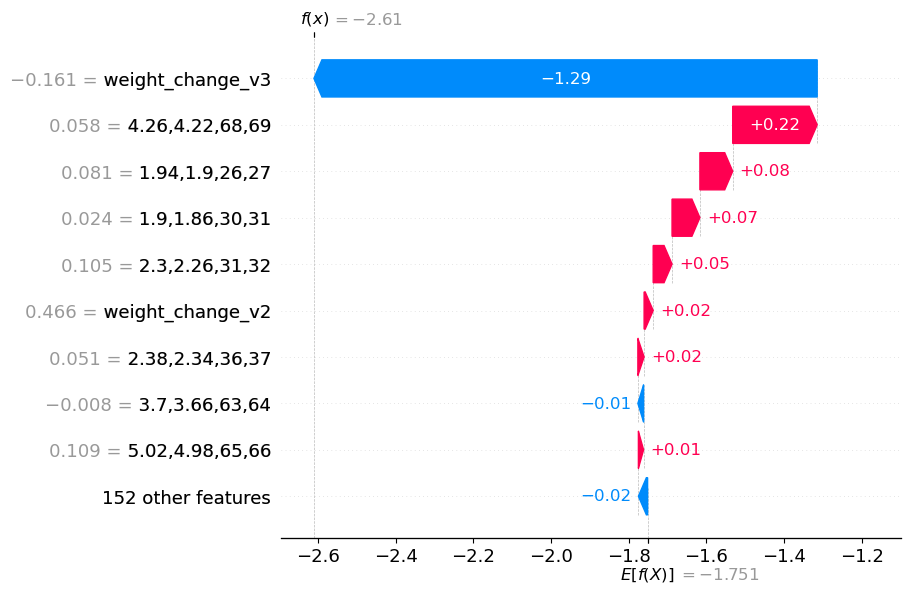

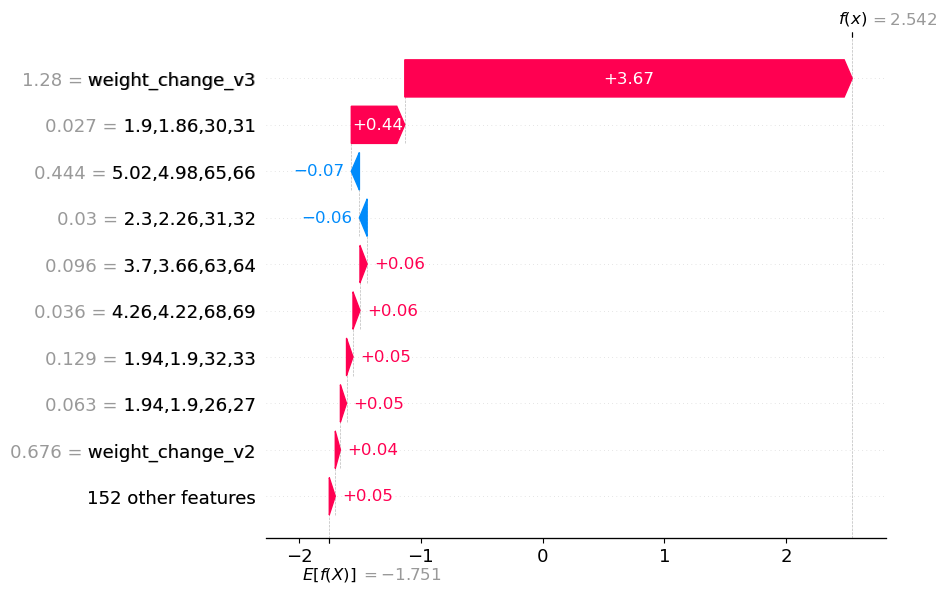

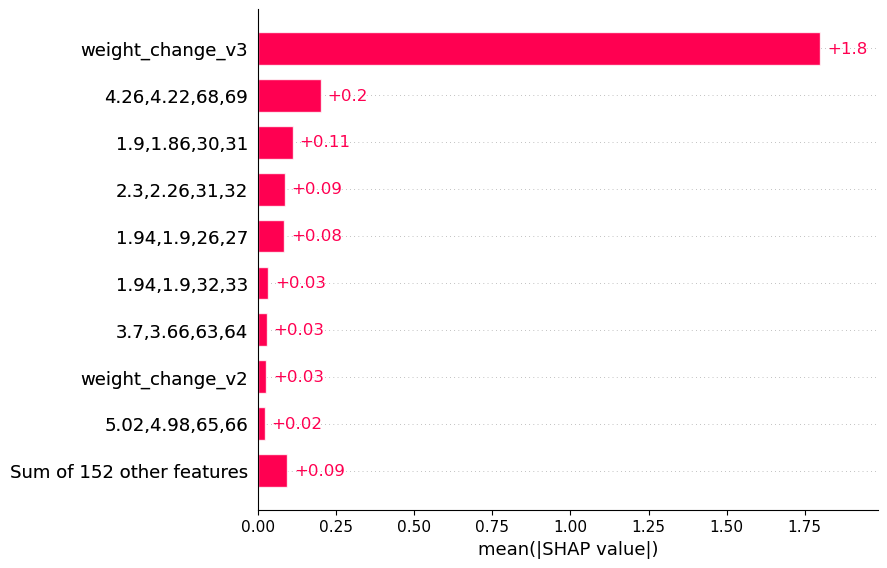

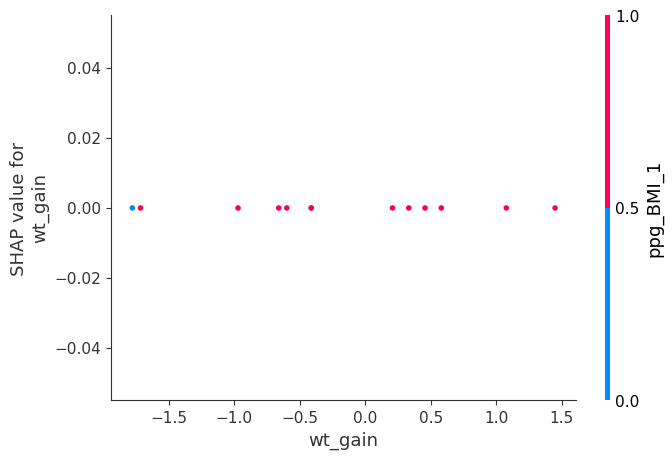

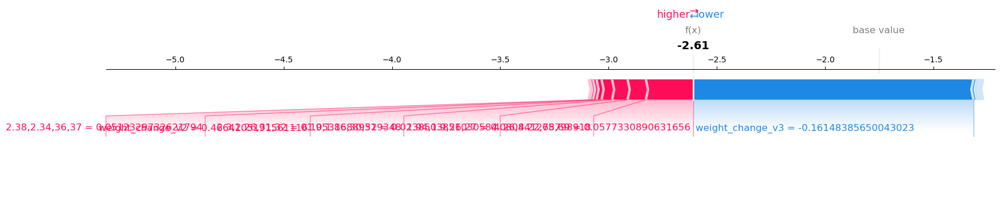

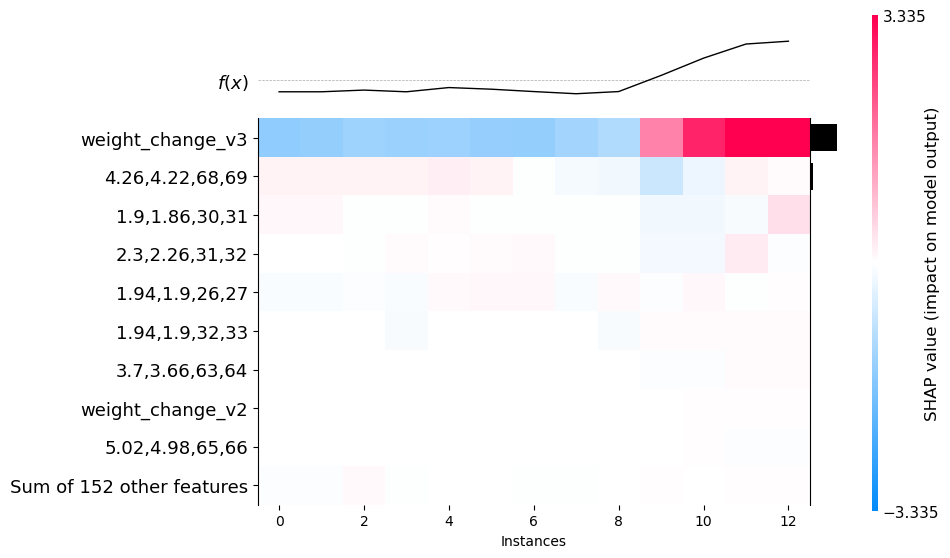


Running SHAP for XGBoost - V4


/Users/billhikari/anaconda3/envs/shap/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [2, 3, 6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


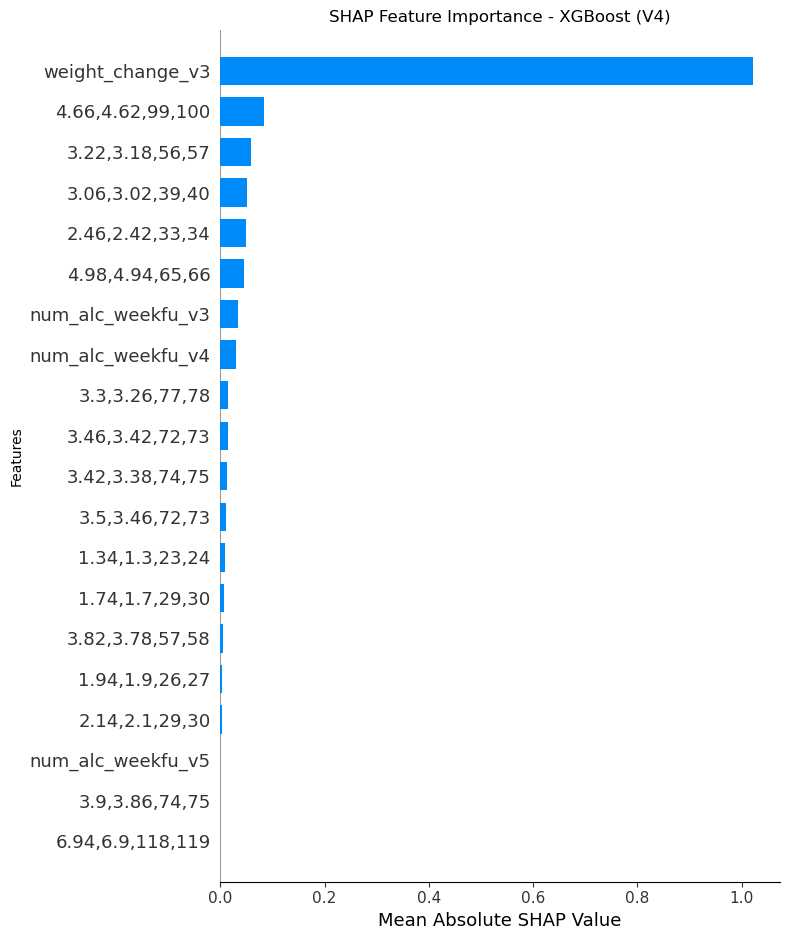

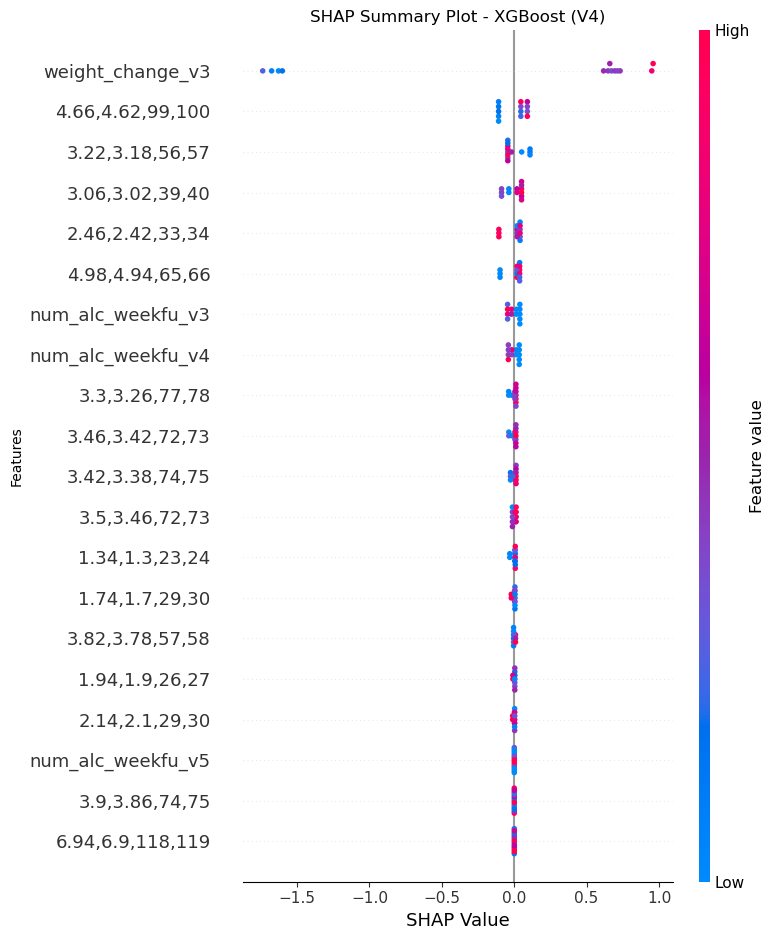

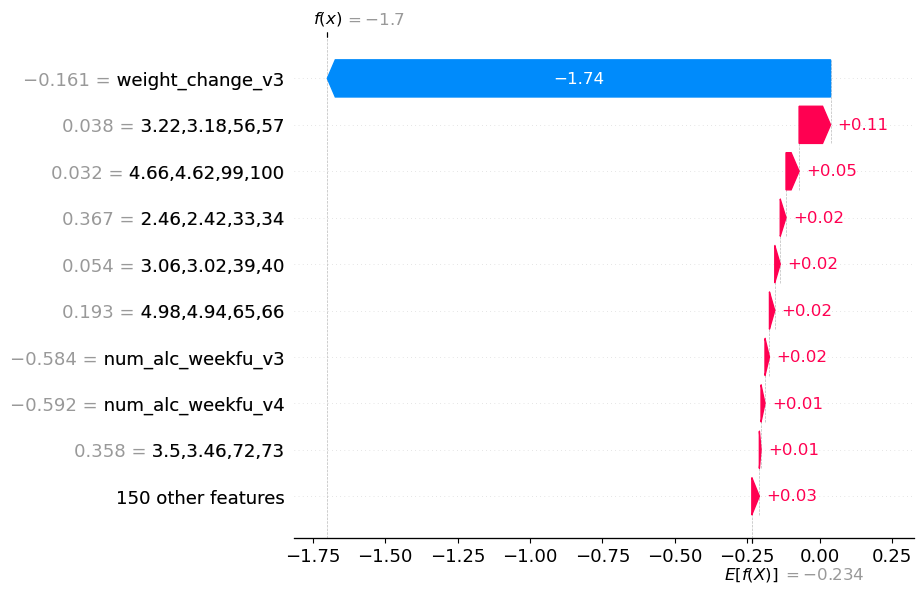

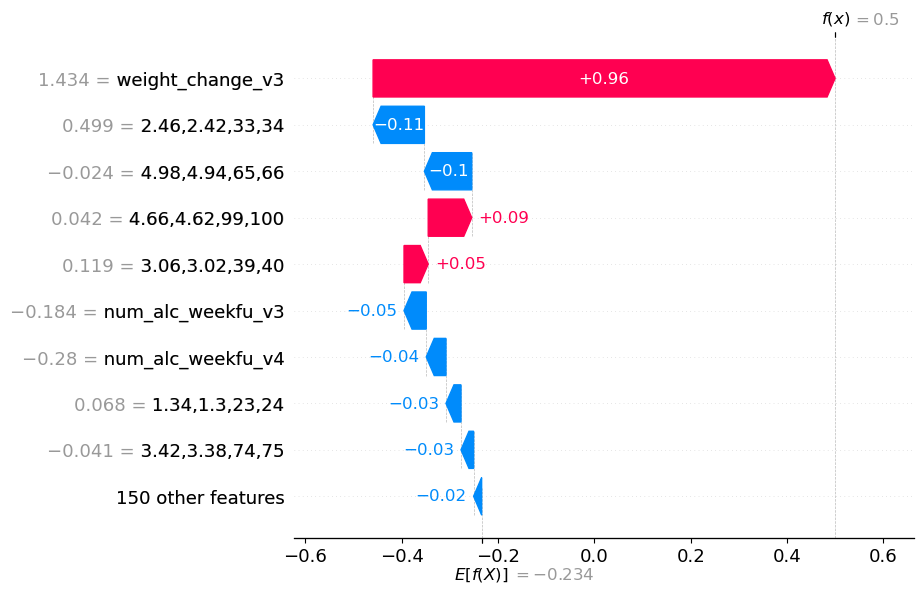

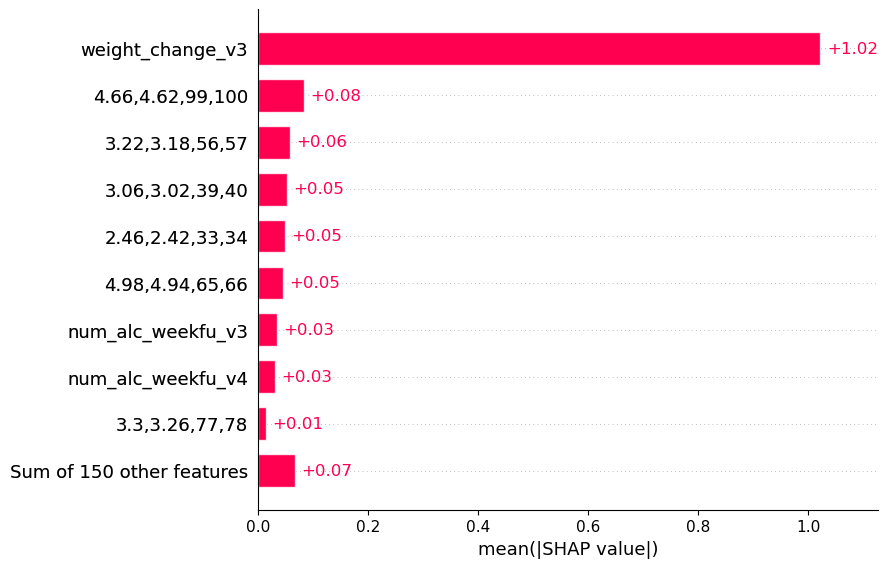

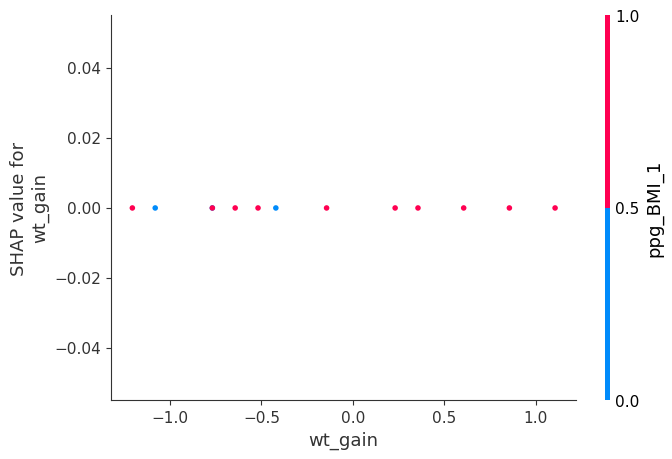

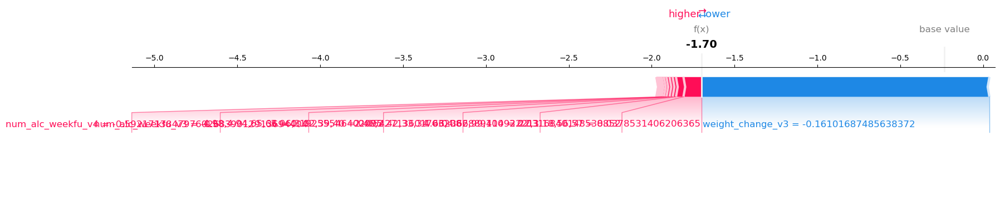

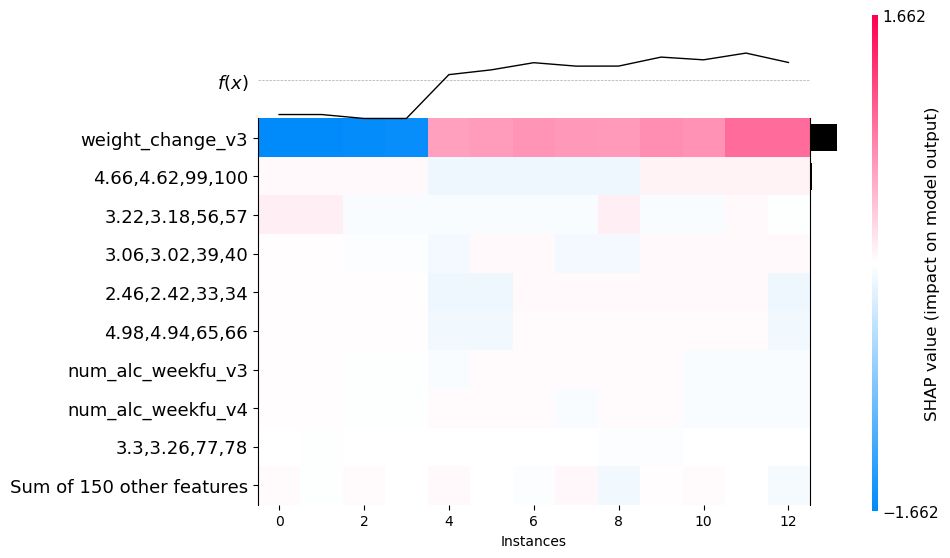


Running SHAP for XGBoost - V5


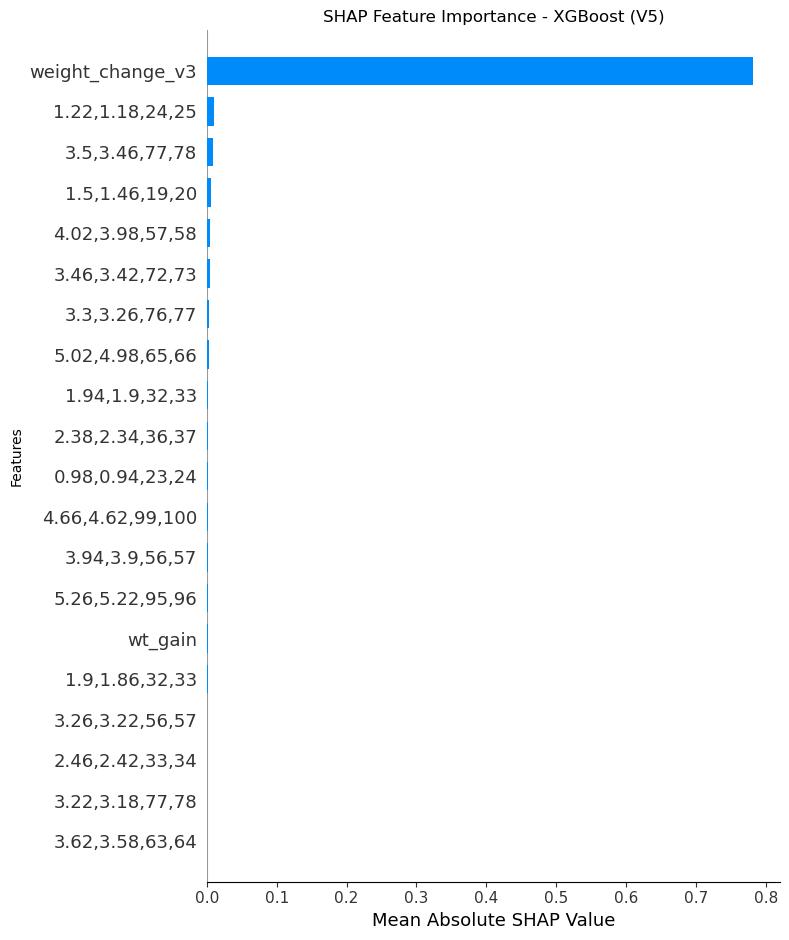

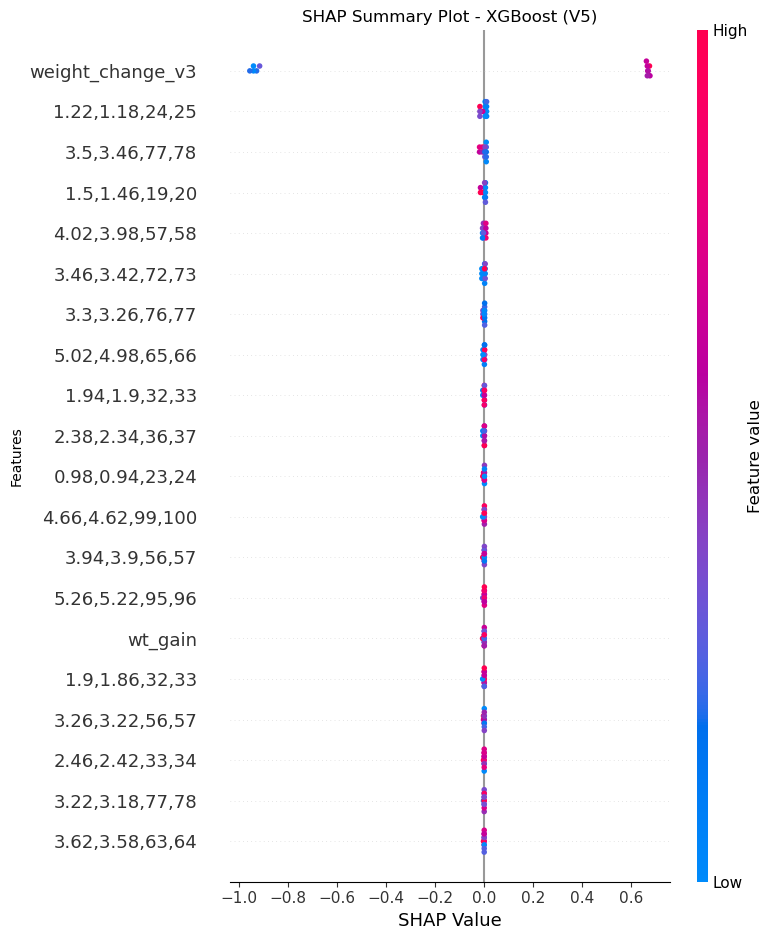

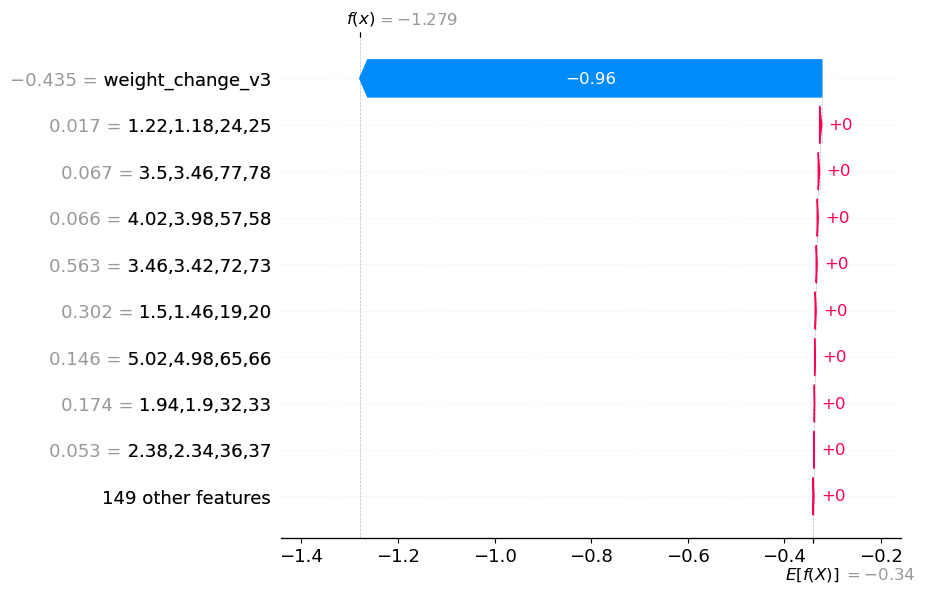

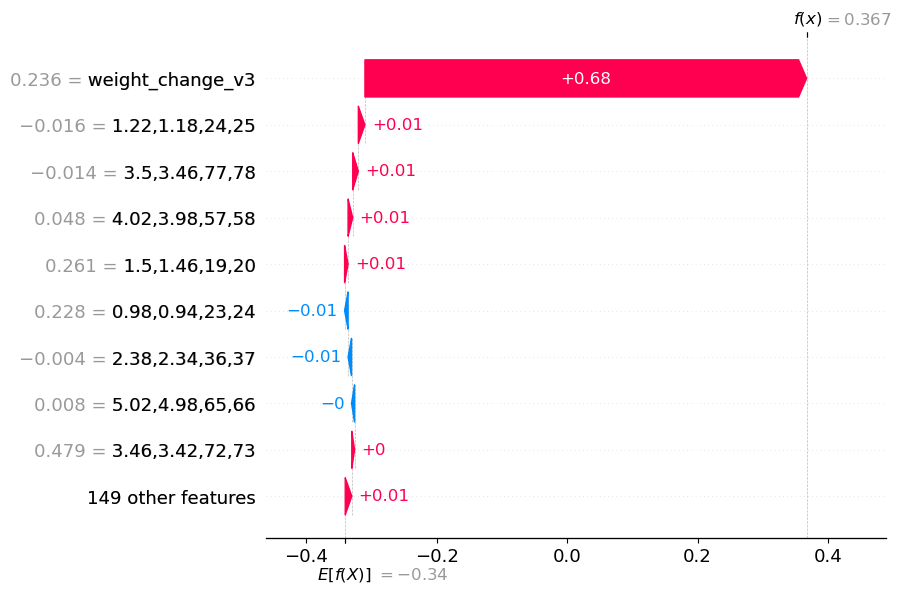

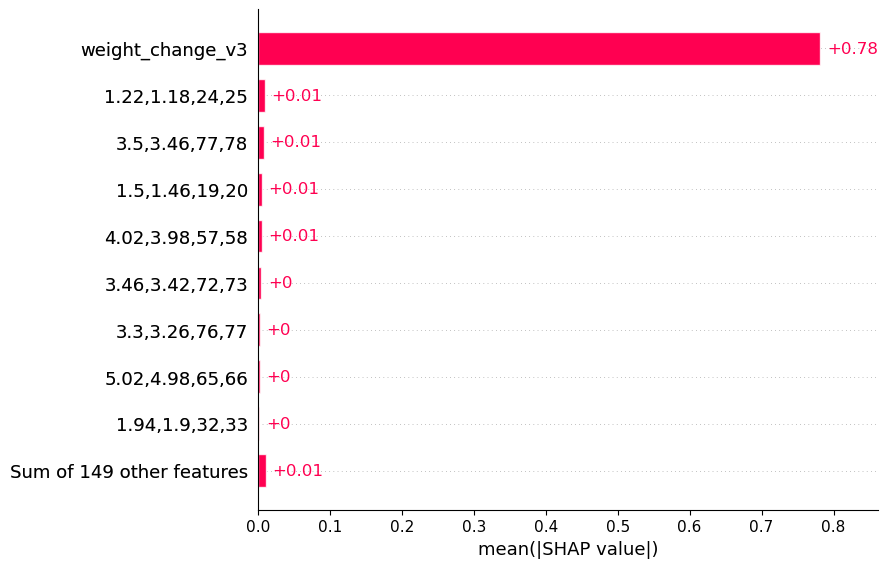

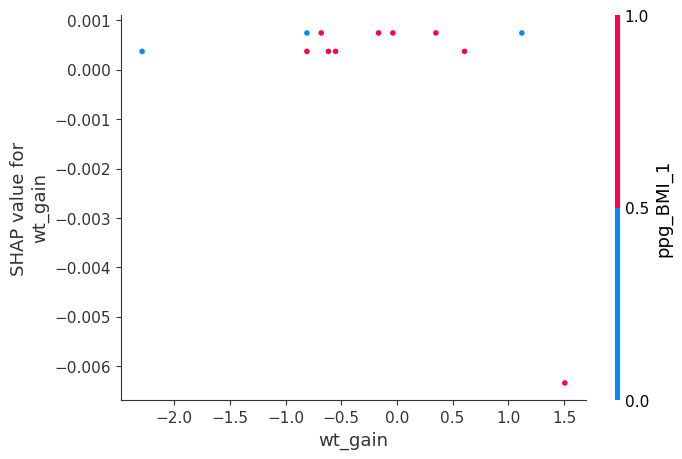

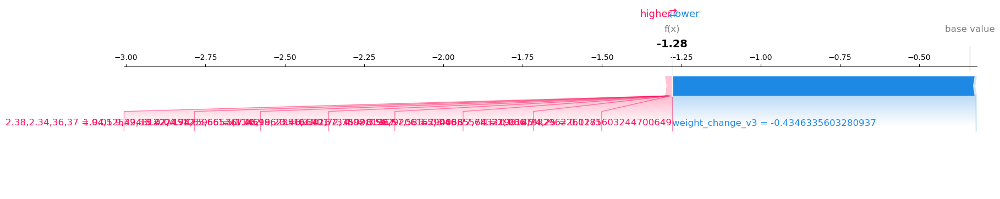

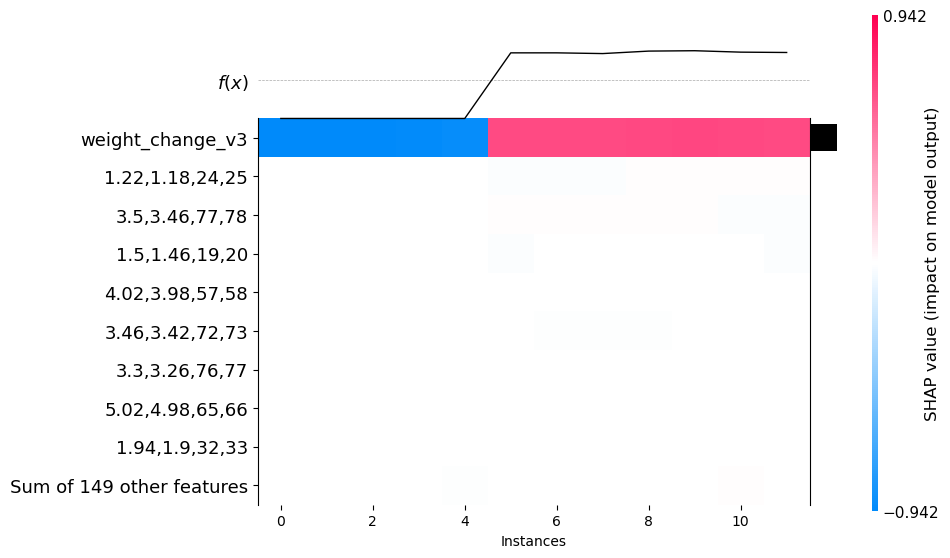

In [ ]:
import shap
import matplotlib.pyplot as plt
import joblib
import numpy as np
import pandas as pd
all_best_models = joblib.load("../data/all_best_models.pkl")
all_x_tests = joblib.load("../data/all_x_tests.pkl")
all_y_tests = joblib.load("../data/all_y_tests.pkl")


# plot SHAP values for XGBoost
for visit in range(1,6):
    visit = f'V{visit}'
    # Get test data
    X_test = all_x_tests[visit]
    y_test = all_y_tests[visit] 

    # Transformer the X_test
    pipeline = all_best_models[visit]['XGBoost']['estimator']
    X_transformered = pipeline.named_steps['preprocessor'].transform(X_test)
    print(f"\nRunning SHAP for {'XGBoost'} - {visit}")
    model_core = pipeline.named_steps['model']

    # Compute SHAP values
    feature_names = get_feature_names(pipeline.named_steps['preprocessor'])
    X_transformered_df = pd.DataFrame(X_transformered, columns=feature_names)     
    explainer = shap.Explainer(model_core, X_transformered_df)
    shap_values = explainer(X_transformered_df)
    # Summary plot
    shap.summary_plot(shap_values, X_transformered_df, plot_type="bar", show=False)
    plt.title(f"SHAP Feature Importance - {'XGBoost'} ({visit})")
    plt.xlabel('Mean Absolute SHAP Value')
    plt.ylabel('Features')
    plt.tight_layout()
    plt.show()

    # Detailed summary (beeswarm)
    shap.summary_plot(shap_values, X_transformered_df, show=False)
    plt.title(f"SHAP Summary Plot - {'XGBoost'} ({visit})")
    plt.xlabel('SHAP Value')
    plt.ylabel('Features')
    plt.tight_layout()
    plt.show()

    
    shap.plots.waterfall(shap_values[0])
    shap.plots.waterfall(shap_values[1])

    # Bar plot of feature importance
    shap.plots.bar(shap_values, max_display=10)
    
    # Dependence plot for a specific feature
    shap.dependence_plot("wt_gain", shap_values.values, X_transformered_df, show=False)

    # Force plot for the first instance
    shap.initjs()
    shap.force_plot(explainer.expected_value, shap_values[0].values, X_transformered_df.iloc[0], matplotlib=True)

    shap.plots.heatmap(shap_values)




<Figure size 640x480 with 0 Axes>

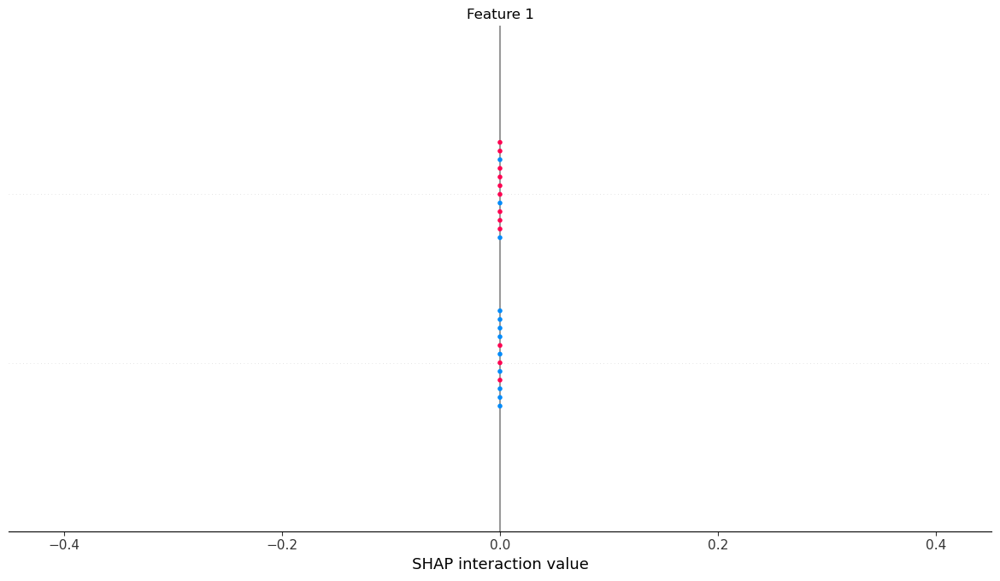

<Figure size 640x480 with 0 Axes>

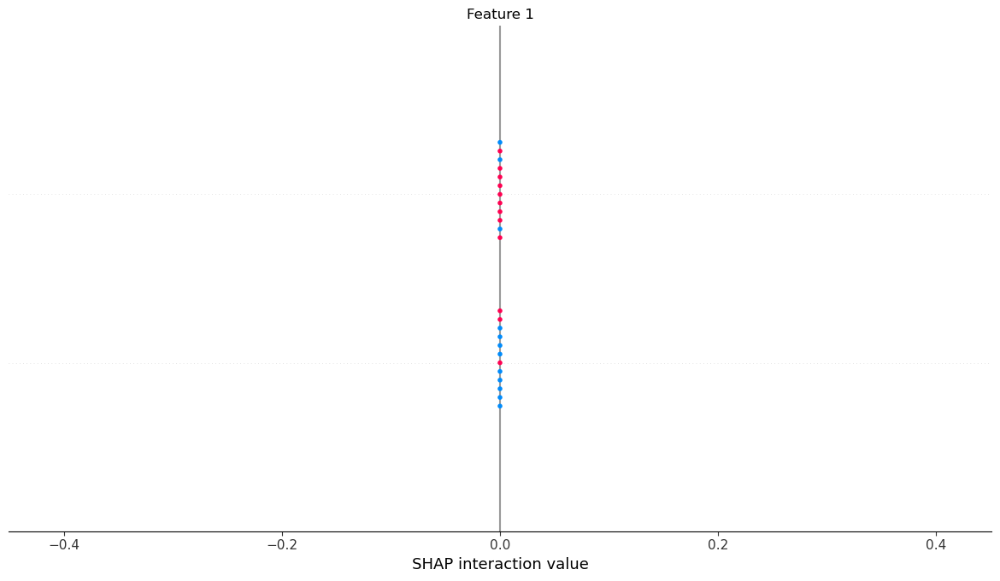

In [ ]:
# Check if RandomForest is a null model or not
from shap import TreeExplainer
model_core = all_best_models['V1']['Random Forest']['estimator'].named_steps['model']  # Get the core model from the pipeline
X_transformered = pipeline.named_steps['preprocessor'].transform(X_test)
explainer = TreeExplainer(model_core)
shap_values = explainer.shap_values(X_transformered)

if isinstance(shap_values, list):
    shap.summary_plot(shap_values[1], X_transformered, plot_type="bar")
    shap.summary_plot(shap_values[1], X_transformered)
else:
    shap.summary_plot(shap_values, X_transformered, plot_type="bar")
    shap.summary_plot(shap_values, X_transformered)

## Nested Cross Validation using Meta + NMR data

prepare the dataset

In [ ]:
import pandas as pd
import numpy as np
# Load the data
meta_df = pd.read_excel("../Matthias Klein's files - GWG/OB70 SHIPP3 SELECTED_marked.xlsx")
nmr_data = pd.read_csv("../mrbin_result/Result_final/mrbin_2025-05-29bins.csv", index_col=0)

In [ ]:
# drop pwr_any and pwr_first columns
meta_df = meta_df.dropna(subset = ['pwr_current'])
meta_df = meta_df.drop(columns = ['pwr_any','pwr_first','pp_weight_loss1','pp_weight_loss2','pp_weight_loss3'])

In [ ]:
# Replace '.' and other known invalid placeholders with NaN
meta_df.replace(to_replace=['.', 'NA', ''], value=np.nan, inplace=True)
# Loop through each object column and convert it to numeric
for col in meta_df.select_dtypes(include=['object']).columns:
    meta_df[col] = pd.to_numeric(meta_df[col], errors='coerce')  
    print(f"Converted column: {col} → {meta_df[col].dtype}")

/var/folders/ff/tm9v3zh91jv9vg9vgbf1rhnr0000gn/T/ipykernel_93663/777501449.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  meta_df.replace(to_replace=['.', 'NA', ''], value=np.nan, inplace=True)


In [ ]:
## Imputation for missing values of wt_gain
# Calulate only when both weight_change_v1 and wt_gain are not NaN

mask = meta_df['weight_change_v1'].notna() & meta_df['wt_gain'].notna()
print(f"Calculating delta for {mask.sum()} rows where both wt_gain and weight_change_v1 are not NaN")
delta = (meta_df.loc[mask, 'wt_gain'] - meta_df.loc[mask, 'weight_change_v1']).mean()

# Impute missing values in wt_gain
missing_mask = meta_df['wt_gain'].isna() & meta_df['weight_change_v1'].notna()
meta_df.loc[missing_mask, 'wt_gain'] = meta_df.loc[missing_mask, 'weight_change_v1'] + delta

# print how many rows were imputed
print(f"Filled {missing_mask.sum()} missing wt_gain values using estimated delta = {delta:.2f}")


Calculating delta for 68 rows where both wt_gain and weight_change_v1 are not NaN
Filled 3 missing wt_gain values using estimated delta = 9.56


In [ ]:
# Define the prefixes and extract the relevant columns
prefixes = ['weight_change','caffeine','num_alc_weekly','smoke_current']
visit_labels = ['V1', 'V2', 'V3', 'V4', 'V5']

# Identify the columns that are not in the prefixes
meta_columns = [col for col in meta_df.columns if not any(col.endswith(f'_v{i}') for i in range(1, 6))]

# Dictionary to store visit-specific DataFrames
visit_dfs = {}

for v in range(1, 6):
    visit = f'V{v}'
    visit_columns = [f"{prefix}_v{v}" for prefix in prefixes]
    seleted_columns = meta_columns + visit_columns 

    # subset the DataFrame for the current visit
    visit_df = meta_df[seleted_columns].copy()
    rename_dict = {f"{prefix}_v{v}": prefix for prefix in prefixes}
    visit_df.rename(columns=rename_dict, inplace=True)
    visit_df['visit'] = visit
    visit_dfs[visit] = visit_df
# Load the NMR data
nmr_data['participant_id'] = nmr_data.index.str.extract(r'GWG-(\d+)', expand=False)
nmr_data['visit'] = nmr_data.index.str.extract(r'GWG-\d+-(V\d)', expand=False)
nmr_data = nmr_data.dropna(subset=['visit'])

# Merge the NMR data with the visit DataFrame
def get_visit_df(visit):
    nmr_visit_df = nmr_data[nmr_data['visit'] == visit].copy()
    meta_visit_df = visit_dfs[visit]
    nmr_visit_df['participant_id'] = nmr_visit_df['participant_id'].astype(str)
    meta_visit_df['participant_id'] = meta_visit_df['participant_id'].astype(str)
    merged = pd.merge(meta_visit_df, nmr_visit_df, on=['participant_id', 'visit'], how='inner')
    return merged


In [ ]:
DF1 = get_visit_df('V1')
DF2 = get_visit_df('V2')
DF3 = get_visit_df('V3')
DF4 = get_visit_df('V4')
DF5 = get_visit_df('V5')

In [ ]:
for i in range(1, 6):
    print(f"DF{i} shape: {eval(f'DF{i}').shape}")

DF1 shape: (68, 128)
DF2 shape: (65, 128)
DF3 shape: (64, 128)
DF4 shape: (61, 128)
DF5 shape: (60, 128)


In [ ]:
DF1.to_csv("../result/data/meta+nmr/DF1.csv", index=False)
DF2.to_csv("../result/data/meta+nmr/DF2.csv", index=False)
DF3.to_csv("../result/data/meta+nmr/DF3.csv", index=False)
DF4.to_csv("../result/data/meta+nmr/DF4.csv", index=False)
DF5.to_csv("../result/data/meta+nmr/DF5.csv", index=False)

In [ ]:
for visit in range(1,6):
    df = pd.read_csv(f"../result/data/meta+nmr/DF{visit}.csv")
    df = df[df['weight_change'] > 0] # Filter out rows where weight_change is not greater than 0
    df.to_csv(f"../result/data/meta+nmr/DF{visit}_filtered.csv", index=False)

In [ ]:
for i in range(1, 6):
    df = pd.read_csv(f"../result/data/meta+nmr/DF{i}_filtered.csv")
    print(f"DF{i} shape: {df.shape}")

DF1 shape: (64, 128)
DF2 shape: (52, 128)
DF3 shape: (48, 128)
DF4 shape: (34, 128)
DF5 shape: (34, 128)


Modeling with hyperparameter tuning and nested validation

In [4]:
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, roc_auc_score
)
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from scipy.stats import ttest_ind
import xgboost as xgb
import pandas as pd
import numpy as np

train_with_cv without feature selection (Use all NMR features)

In [131]:
def train_with_cv(df,cv=10,inner_cv=10,random_state=42):
    # list of columns to analyze
    one_hot_cols = ['vig_activity']
    binary_cols = ['race_1', 'race_2']
    continuous_cols = ['wt_gain','weight_change','age_delivery_range2','num_alc_weekly']
    explicit_cols = ['caffeine','smoke_current','ppg_BMI', 'first_BMI']

    meta_cols = one_hot_cols + binary_cols + continuous_cols + explicit_cols
    non_feature_cols = ['participant_id', 'visit', 'pwr_current']

    # Drop the target and identifier columns
    X = df.drop(columns = ['pwr_current','participant_id','visit'])
    y = df['pwr_current']

    other_cols = [col for col in df.columns if col not in meta_cols + non_feature_cols]
    explicit_categories = [sorted(set(X[col].dropna().unique())) for col in explicit_cols]

    # Preprocessor
    preprocessor = ColumnTransformer(
            transformers=[
            ('cat', OneHotEncoder(drop = 'first',handle_unknown='ignore'), one_hot_cols),
            ('explicit', OneHotEncoder(categories=explicit_categories, handle_unknown='ignore'), explicit_cols),
            ('binary', 'passthrough', binary_cols),
            ('num', StandardScaler(), continuous_cols),
            ('other', 'passthrough', other_cols)  # Keep NMR columns as they are
        ]
    )

    param_grid = {
        'Logistic Regression': [
        # Combinations for 'liblinear' solver
        {'model__C': [0.01, 0.05, 0.1, 1, 10],'model__penalty': ['l1', 'l2'],'model__solver': ['liblinear']},
        # Combinations for 'lbfgs' solver
        {'model__C': [0.01, 0.05, 0.1, 1, 10],'model__penalty': ['l2'],'model__solver': ['lbfgs']},
        # Combinations for 'elastic net'
        {'model__C': [0.01, 0.05, 0.1, 1, 10],'model__penalty': ['elasticnet'],'model__l1_ratio': [0.1, 0.5, 0.9],'model__solver': ['saga']},
        
        ],
        
        'Support Vector Machine':[
        # Linear kernel: C only
        {'model__C': [0.01, 0.1, 1, 10], 'model__kernel': ['linear']},
        # RBF kernel: C and gamma
        {'model__C': [0.01, 0.1, 1, 10], 'model__kernel': ['rbf'], 'model__gamma': ['scale', 0.001, 0.01, 0.1, 1]},
        ],

        'K-Nearest Neighbors':{
            'model__n_neighbors': [1, 2, 3, 4, 5],
            'model__weights': ['uniform', 'distance'],
            'model__metric': ['euclidean', 'manhattan'],
        },

        'Random Forest':{
            'model__n_estimators': [50, 100, 200,300],
            'model__max_depth': [None, 10],
            'model__min_samples_split':[2, 5, 10],
            'model__max_features': ['sqrt', 1.0], # 1.0 means all
            'model__class_weight': ['balanced'],
            'model__bootstrap': [True],
        },

        'XGBoost':{
            'model__n_estimators': [50, 100, 200,300],
            'model__learning_rate': [0.01, 0.05,0.1, 0.2],
            'model__gamma': [0, 0.1],
            'model__reg_alpha': [0.01,0.1], # L1 regularization
            'model__reg_lambda': [0.01,0.1], # L2 regularization
            },
        
        'MultiLayer Perceptron':{
            'model__hidden_layer_sizes': [(100,), (150,),(150,50),(100,50),(50,25)],
            'model__activation': ['relu','tanh'],
            'model__alpha': [0.0001, 0.001],
            'model__solver': ['adam', 'lbfgs'], # 'lbfgs' is for smaller datasets
            'model__learning_rate_init': [0.001, 0.01, 0.1],
        },

        'GaussianNB':{
            'model__var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6],
        },

        'BernoulliNB':{
            'model__alpha': [1e-5, 0.1, 0.5, 1.0],
        },
        
        'Decision Tree':{
            'model__max_depth': [5, 10, None],
            'model__max_features': [None, 'sqrt', 'log2', 0.8],
            'model__criterion': ['gini', 'entropy'],
        }
    }
    # prepare the models
    models = {
        'Logistic Regression': LogisticRegression(max_iter=5000, random_state=random_state),
        'GaussianNB': GaussianNB(),
        'BernoulliNB': BernoulliNB(),
        'Support Vector Machine': SVC(probability=True, random_state=random_state),
        'Random Forest': RandomForestClassifier(random_state=random_state),
        'K-Nearest Neighbors': KNeighborsClassifier(n_jobs=1),
        'XGBoost': xgb.XGBClassifier(eval_metric='logloss', random_state=random_state),
        'Decision Tree': DecisionTreeClassifier(random_state=random_state),
        'MultiLayer Perceptron': MLPClassifier(max_iter=1000, random_state=random_state),
    }    

    all_results = []
    outer_kf = StratifiedKFold(n_splits=cv, shuffle=True, random_state=random_state)
    best_models = {}
    # Loop through each outer fold
    for model_name, model in models.items():
        print(f"Training on the model:{model_name}")
        fold_metrics = []
        all_y_test_outer = []
        all_y_pred_outer = []
        all_y_proba_outer = []

        for fold_idx, (train_idx, test_idx) in enumerate(outer_kf.split(X, y)):
            print(f"This is fold:{fold_idx + 1} for model:{model_name}")
            X_train = X.iloc[train_idx]
            X_test_outer_fold = X.iloc[test_idx]
            y_train, y_test_outer_fold = y.iloc[train_idx], y.iloc[test_idx]
            
            # Define the pipeline
            clf = Pipeline([
                ('preprocessor', preprocessor),
                ('model', model)
            ])

            if model_name in param_grid:
                grid = GridSearchCV(
                    clf,
                    param_grid=param_grid[model_name],
                    cv=StratifiedKFold(n_splits=inner_cv, shuffle=True, random_state=random_state),
                    scoring='roc_auc',
                    n_jobs=-1,
                )
                grid.fit(X_train, y_train)
                best_model = grid.best_estimator_
            else:
                best_model = clf
                best_model.fit(X_train, y_train)
            
            # Predict and Evaluate on the outer fold test set
            y_pred_outer_fold = best_model.predict(X_test_outer_fold)

            try:
                y_proba_outer_fold = best_model.predict_proba(X_test_outer_fold)[:, 1]
                roc = roc_auc_score(y_test_outer_fold, y_proba_outer_fold)
            except:
                y_proba_outer_fold = None
                roc = None
            
            # Store the results for this fold
            fold_metrics.append({
                'accuracy': accuracy_score(y_test_outer_fold, y_pred_outer_fold),
                'f1': f1_score(y_test_outer_fold, y_pred_outer_fold, zero_division=0),
                'precision': precision_score(y_test_outer_fold, y_pred_outer_fold, zero_division=0),
                'recall': recall_score(y_test_outer_fold, y_pred_outer_fold, zero_division=0),
                'roc_auc': roc,
                'confusion_matrix': confusion_matrix(y_test_outer_fold, y_pred_outer_fold),
            })

            # Store predictions and probabilities for later analysis
            all_y_test_outer.extend(y_test_outer_fold.tolist())
            all_y_pred_outer.extend(y_pred_outer_fold.tolist())
            
            if y_proba_outer_fold is not None:
                all_y_proba_outer.extend(y_proba_outer_fold.tolist())
            else:
                all_y_proba_outer.extend([None] * len(y_test_outer_fold))
        
        # Calculate mean metrics across all folds
        overall_roc_auc = roc_auc_score(all_y_test_outer, all_y_proba_outer) if all_y_proba_outer else None
        overall_confusion_matrix = confusion_matrix(all_y_test_outer, all_y_pred_outer)
        
        # Store the average results for this model
        n_folds = len(fold_metrics)

        avg_results = {
            'Model': model_name,
            'Average CV Accuracy': np.mean([fold['accuracy'] for fold in fold_metrics]),
            'Std CV Accuracy': np.std([fold['accuracy'] for fold in fold_metrics]),
            'SE CV Accuracy': np.std([fold['accuracy'] for fold in fold_metrics]) / np.sqrt(n_folds),

            'Average CV F1 Score': np.mean([fold['f1'] for fold in fold_metrics]),
            'Std CV F1 Score': np.std([fold['f1'] for fold in fold_metrics]),
            'SE CV F1 Score': np.std([fold['f1'] for fold in fold_metrics]) / np.sqrt(n_folds),

            'Average CV Precision': np.mean([fold['precision'] for fold in fold_metrics]),
            'Std CV Precision': np.std([fold['precision'] for fold in fold_metrics]),
            'SE CV Precision': np.std([fold['precision'] for fold in fold_metrics]) / np.sqrt(n_folds),

            'Average CV Recall': np.mean([fold['recall'] for fold in fold_metrics]),
            'Std CV Recall': np.std([fold['recall'] for fold in fold_metrics]),
            'SE CV Recall': np.std([fold['recall'] for fold in fold_metrics]) / np.sqrt(n_folds),

            'Average CV ROC AUC': np.mean([fold['roc_auc'] for fold in fold_metrics if fold['roc_auc'] is not None]),
            'Std CV ROC AUC': np.std([fold['roc_auc'] for fold in fold_metrics if fold['roc_auc'] is not None]),
            'SE CV ROC AUC': np.std([fold['roc_auc'] for fold in fold_metrics if fold['roc_auc'] is not None]) / np.sqrt(n_folds),
            
            'Overall ROC AUC': overall_roc_auc,
            'Overall Confusion Matrix': overall_confusion_matrix,
            'All Fold Confusion Matrices': [fold['confusion_matrix'] for fold in fold_metrics],
        }
        avg_results['All y True'] = all_y_test_outer
        avg_results['All y Proba'] = all_y_proba_outer
        all_results.append(avg_results)
        best_models[model_name] = {
            'estimator': best_model
        }
    return pd.DataFrame(all_results), all_results, best_models

In [ ]:
# Training and evaluating models for each visit
import joblib
# Dictionary to save all visits' all_results 
all_visit_raw_results = {}
all_best_models = {}
for v in range(1,6): 
    df = pd.read_csv(f"../result/data/meta+nmr/DF{v}_filtered.csv")
    print(f"Results for Visit V{v}:")
    result, all_results, best_models = train_with_cv(df)
    # Save the results to excel files
    result.to_excel(f"../result/data/meta+nmr/model_results_v{v}_hyper_filtered.xlsx", index=True)
    joblib.dump(all_results,f"../result/data/meta+nmr/all_results_v{v}_filtered.pkl")

    all_visit_raw_results[f"V{v}"] = all_results
    all_best_models[f"V{v}"] = best_models
# Save combined all_results
joblib.dump(all_visit_raw_results,"../result/data/meta+nmr/all_results_combined_filtered.pkl")
joblib.dump(all_best_models,"../result/data/meta+nmr/all_best_models_filtered.pkl")
print("\nTraining and evaluation complete for all files.")

In [1]:
import joblib
combined_params = {}

for visit in range(1,6):
    file_path = f"../result/data/meta+nmr/selection/v{visit}_param_selection.pkl"
    visit_param = joblib.load(file_path)
    combined_params[f'V{visit}'] = visit_param
# Save the combined parameters to a file
joblib.dump(combined_params, "../result/data/meta+nmr/selection/combined_param_selection.pkl")

['../result/data/meta+nmr/selection/combined_param_selection.pkl']

In [3]:
import pandas as pd
# Combine all visit results into a single DataFrame with Visit labels
visit_dfs = []
for v in range(1, 6):
    df = pd.read_csv(f"../result/data/meta+nmr/model_results_v{v}_hyper_filtered.csv", index_col=0)
    df["Visit"] = f"V{v}"
    visit_dfs.append(df)

# Concatenate all visits
all_visits_results = pd.concat(visit_dfs, ignore_index=True)

# Save to a single Excel file
all_visits_results.to_excel("../result/data/meta+nmr/model_results_all_visits_hyper_filtered.xlsx", index=False)

In [59]:
# Select the best model based on Overall ROC AUC across all visits
all_visits_results = pd.read_excel("../result/data/meta+nmr/model_results_all_visits_hyper_filtered.xlsx")
best_model_by_visit = all_visits_results.loc[all_visits_results.groupby('Visit')['Average CV ROC AUC'].idxmax()].reset_index(drop=True)
# Print results
print("Best model using Meta + all 2D NMR by visit based on Average CV ROC AUC:")
print(best_model_by_visit[['Visit', 'Model', 'Average CV ROC AUC','Std CV ROC AUC']])

# save the all model averages to a CSV file
#best_model_by_visit.to_excel("../result/data/meta+nmr/best_model_by_visit_filtered.xlsx", index=False)

Best model using Meta + all 2D NMR by visit based on Average CV ROC AUC:
  Visit                  Model  Average CV ROC AUC  Std CV ROC AUC
0    V1  MultiLayer Perceptron            0.706944        0.218674
1    V2  MultiLayer Perceptron            0.900000        0.133333
2    V3    Logistic Regression            0.933333        0.081650
3    V4    Logistic Regression            0.800000        0.331662
4    V5    Logistic Regression            0.775000        0.325000


### Feature selection

In [1]:
from scipy.stats import ttest_ind
import warnings
warnings.filterwarnings("ignore")

def select_top_nmr_features(X,y, other_cols, top_n):
    p_values = {}
    for col in other_cols:
        group0 = X[y == 0][col]
        group1 = X[y == 1][col]
        try:
            t_stat, p = ttest_ind(group0, group1, equal_var=False)
        except Exception as e:
            print(f"Error calculating t-test for {col}: {e}")
            p = np.nan
        p_values[col] = p
    # Sort features by p-value
    sorted_features = sorted(p_values, key=p_values.get)
    return sorted_features[:top_n]

def train_with_cv(df, cv=10, inner_cv=10, random_state=42, other_cols=None):
    one_hot_cols = ['vig_activity']
    binary_cols = ['race_1', 'race_2']
    continuous_cols = ['wt_gain','weight_change','age_delivery_range2','num_alc_weekly']
    explicit_cols = ['caffeine','smoke_current','ppg_BMI', 'first_BMI']
    meta_cols = one_hot_cols + binary_cols + continuous_cols + explicit_cols
    non_feature_cols = ['participant_id', 'visit', 'pwr_current']
    
    if other_cols is None:
        other_cols = [col for col in df.columns if col not in meta_cols + non_feature_cols]
    explicit_categories = [sorted(set(df[col].dropna().unique())) for col in explicit_cols]
    
    X = df.drop(columns=['pwr_current','participant_id','visit'])
    y = df['pwr_current']

    preprocessor = ColumnTransformer(
        transformers=[
            ('cat', OneHotEncoder(drop='first', handle_unknown='ignore'), one_hot_cols),
            ('explicit', OneHotEncoder(categories=explicit_categories, handle_unknown='ignore'), explicit_cols),
            ('binary', 'passthrough', binary_cols),
            ('num', StandardScaler(), continuous_cols),
            ('other', 'passthrough', other_cols)
        ]
    )

    models = {
        'Logistic Regression': LogisticRegression(max_iter=5000, random_state=random_state),
        'GaussianNB': GaussianNB(),
        'BernoulliNB': BernoulliNB(),
        'Support Vector Machine': SVC(probability=True, random_state=random_state),
        'Random Forest': RandomForestClassifier(random_state=random_state),
        'K-Nearest Neighbors': KNeighborsClassifier(n_jobs=1),
        'XGBoost': xgb.XGBClassifier(eval_metric='logloss', random_state=random_state),
        'Decision Tree': DecisionTreeClassifier(random_state=random_state),
        'MultiLayer Perceptron': MLPClassifier(max_iter=1000, random_state=random_state),
    }

    param_grid = {
        'Logistic Regression': [
        # Combinations for 'liblinear' solver
        {'model__C': [0.01, 0.05, 0.1, 1, 10],'model__penalty': ['l1', 'l2'],'model__solver': ['liblinear']},
        # Combinations for 'lbfgs' solver
        {'model__C': [0.01, 0.05, 0.1, 1, 10],'model__penalty': ['l2'],'model__solver': ['lbfgs']},
        # Combinations for 'elastic net'
        {'model__C': [0.01, 0.05, 0.1, 1, 10],'model__penalty': ['elasticnet'],'model__l1_ratio': [0.1, 0.5, 0.9],'model__solver': ['saga']},
        
        ],
        
        'Support Vector Machine':[
        # Linear kernel: C only
        {'model__C': [0.01, 0.1, 1, 10], 'model__kernel': ['linear']},
        # RBF kernel: C and gamma
        {'model__C': [0.01, 0.1, 1, 10], 'model__kernel': ['rbf'], 'model__gamma': ['scale', 0.001, 0.01, 0.1, 1]},
        ],

        'K-Nearest Neighbors':{
            'model__n_neighbors': [1, 2, 3, 4, 5],
            'model__weights': ['uniform', 'distance'],
            'model__metric': ['euclidean', 'manhattan'],
        },

        'Random Forest':{
            'model__n_estimators': [50, 100, 200,300],
            'model__max_depth': [None, 10],
            'model__min_samples_split':[2, 5, 10],
            'model__max_features': ['sqrt', 1.0], # 1.0 means all
            'model__class_weight': ['balanced'],
            'model__bootstrap': [True],
        },

        'XGBoost':{
            'model__n_estimators': [50, 100, 200,300],
            'model__learning_rate': [0.01, 0.05,0.1, 0.2],
            'model__gamma': [0, 0.1],
            'model__reg_alpha': [0.01,0.1], # L1 regularization
            'model__reg_lambda': [0.01,0.1], # L2 regularization
            },
        
        'MultiLayer Perceptron':{
            'model__hidden_layer_sizes': [(100,), (150,),(150,50),(100,50),(50,25)],
            'model__activation': ['relu','tanh'],
            'model__alpha': [0.0001, 0.001],
            'model__solver': ['adam', 'lbfgs'], # 'lbfgs' is for smaller datasets
            'model__learning_rate_init': [0.001, 0.01, 0.1],
        },

        'GaussianNB':{
            'model__var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6],
        },

        'BernoulliNB':{
            'model__alpha': [1e-5, 0.1, 0.5, 1.0],
        },
        
        'Decision Tree':{
            'model__max_depth': [5, 10, None],
            'model__max_features': [None, 'sqrt', 'log2', 0.8],
            'model__criterion': ['gini', 'entropy'],
        }
    }

    outer_kf = StratifiedKFold(n_splits=cv, shuffle=True, random_state=random_state)
    all_results = []

    for model_name, model in models.items():
        print(f"Training model: {model_name}")
        y_true, y_pred, y_proba = [], [], []
        fold_scores = []

        for train_idx, test_idx in outer_kf.split(X, y):
            X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
            y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

            pipeline = Pipeline([
                ('preprocessor', preprocessor),
                ('model', model)
            ])

            if model_name in param_grid:
                grid = GridSearchCV(pipeline, param_grid[model_name], cv=inner_cv, scoring='roc_auc', n_jobs=-1)
                grid.fit(X_train, y_train)
                best_model = grid.best_estimator_
            else:
                best_model = pipeline.fit(X_train, y_train)

            y_pred_fold = best_model.predict(X_test)
            try:
                y_proba_fold = best_model.predict_proba(X_test)[:, 1]
                roc = roc_auc_score(y_test, y_proba_fold)
            except:
                y_proba_fold = None
                roc = None

            fold_scores.append({
                'accuracy': accuracy_score(y_test, y_pred_fold),
                'f1': f1_score(y_test, y_pred_fold),
                'precision': precision_score(y_test, y_pred_fold),
                'recall': recall_score(y_test, y_pred_fold),
                'roc_auc': roc
            })

            y_true.extend(y_test.tolist())
            y_pred.extend(y_pred_fold.tolist())
            y_proba.extend(y_proba_fold.tolist() if y_proba_fold is not None else [None]*len(y_test))

        df_result = pd.DataFrame(fold_scores)
        avg_result = df_result.mean().to_dict()
        avg_result['Model'] = model_name
        avg_result['Overall ROC AUC'] = roc_auc_score(y_true, y_proba) if None not in y_proba else None
        avg_result['Overall Confusion Matrix'] = confusion_matrix(y_true, y_pred)
        avg_result['Std CV Accuracy'] = df_result['accuracy'].std()
        avg_result['SE CV Accuracy'] = df_result['accuracy'].std() / np.sqrt(len(df_result))
        all_results.append(avg_result)

    return pd.DataFrame(all_results)

def run_nmr_feature_selection(df, n_start=5, n_end=20, **kwargs):
    all_results = []
    top_nmr_feature_dict = {}
    one_hot_cols = ['vig_activity']
    binary_cols = ['race_1', 'race_2']
    continuous_cols = ['wt_gain','weight_change','age_delivery_range2','num_alc_weekly']
    explicit_cols = ['caffeine','smoke_current','ppg_BMI', 'first_BMI']
    meta_cols = one_hot_cols + binary_cols + continuous_cols + explicit_cols
    non_feature_cols = ['participant_id', 'visit', 'pwr_current']
    all_nmr_cols = [col for col in df.columns if col not in meta_cols + non_feature_cols]

    for N in range(n_start, n_end +1):
        print(f"Selecting top {N} NMR features")

        # sorted by p value
        X_tmp = df.drop(columns=['pwr_current', 'participant_id', 'visit'])
        y_tmp = df['pwr_current']
        top_n_nmr = select_top_nmr_features(X_tmp, y_tmp, all_nmr_cols, N)
        top_nmr_feature_dict[N] = top_n_nmr
        # Create a new DataFrame with selected NMR features
        selected_cols = meta_cols + top_n_nmr + non_feature_cols
        df_subset = df[selected_cols].copy()

        # Train and evaluate the model with selected NMR features
        result_df = train_with_cv(df_subset, other_cols=top_n_nmr, **kwargs)
        result_df['Top NMR Features'] = N
        all_results.append(result_df)
    return pd.concat(all_results,ignore_index=True), top_nmr_feature_dict

In [ ]:
import pandas as pd
# Combine all visit results into a single DataFrame with Visit labels
visit_dfs = []
for v in range(1, 6):
    df = pd.read_csv(f"../result/data/meta+nmr/selection/v{v}_result_selection.csv")
    df["Visit"] = f"V{v}"
    visit_dfs.append(df)

# Concatenate all visits
all_visits_results = pd.concat(visit_dfs, ignore_index=True)

# Save to a single Excel file
all_visits_results.to_excel("../result/data/meta+nmr/selection/model_results_all_visits_selection.xlsx", index=False)

In [11]:
import pandas as pd
# Select the best model based on CV ROC AUC across all visits
all_visits_results = pd.read_csv("../result/data/meta+nmr/selection/model_results_all_visits_selection_leak.csv")
best_model_by_visit = all_visits_results.loc[all_visits_results.groupby('Visit')['CV ROC AUC'].idxmax()].reset_index(drop=True)
# Print results
print("Best model using Meta + Selected 2D NMR by visit based on CV ROC AUC:")
print(best_model_by_visit[['Visit', 'Model', 'CV ROC AUC','Top NMR Features','Std CV ROC AUC']])
#all_visits_results.to_excel("../result/data/meta+nmr/selection/model_results_all_visits_selection_leak.xlsx", index=False)
# save the all model averages to a CSV file
#best_model_by_visit.to_excel("../result/data/meta+nmr/selection/best_model_by_visit_selection.xlsx", index=False)

Best model using Meta + Selected 2D NMR by visit based on CV ROC AUC:
  Visit                  Model  CV ROC AUC  Top NMR Features  Std CV ROC AUC
0    V1  MultiLayer Perceptron    0.816667                20        0.154909
1    V2  MultiLayer Perceptron    0.988889                10        0.035136
2    V3    Logistic Regression    0.933333                 5        0.086066
3    V4          Random Forest    0.904167                15        0.177919
4    V5    Logistic Regression    0.800000                 8        0.258199


### Visualization of the model's performance

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

In [24]:
# Load the combined results
all_visits_results = pd.read_excel("../result/data/meta+nmr/selection/model_results_all_visits_selection_leak.xlsx")

In [25]:
palette = ["#a6cee3",
"#1f78b4",
"#b2df8a",
"#33a02c",
"#fb9a99",
"#e31a1c",
"#fdbf6f",
"#ff7f00",
"#cab2d6"]

model performance over visits

In [26]:
# model performance over visits
from matplotlib.container import BarContainer
import numpy as np
def plot_model_performance_over_visits(df, metric='CV ROC AUC'):
    """
    Plot model performance over visits.
    """
    plt.figure(figsize=(24, 18))
    best_rows = df.loc[df.groupby(['Visit','Model'])[metric].idxmax()]
    ax = sns.barplot(data=best_rows, x='Visit', y=metric, hue='Model', palette=palette)
    for patch in ax.patches:
        x = patch.get_x() + patch.get_width() / 2
        height = patch.get_height()

        match = best_rows[np.isclose(best_rows['CV ROC AUC'], height, atol=1e-3)]
        if not match.empty:
            se = match['SE CV ROC AUC'].values[0]
            ax.errorbar(x, height, yerr=se, fmt='none', color='black', capsize=5, elinewidth=2, alpha=0.7)
    plt.title(f'Best CV ROC AUC per Model per Visit')
    plt.xlabel('Visit')
    plt.ylabel(metric)
    plt.legend(title='Model', bbox_to_anchor=(1.05, 1), loc='upper left')
    for container in ax.containers:
        if isinstance(container, BarContainer):
            # Add labels to the bars
            labels  = [f'{h:.3f}' for h in container.datavalues]
            ax.bar_label(container, labels = labels, label_type='edge', fontsize=8, padding=3)
    plt.tight_layout()
    plt.savefig("../result/figure/model_performance_over_visits.png", dpi=300, bbox_inches='tight')
    plt.show()

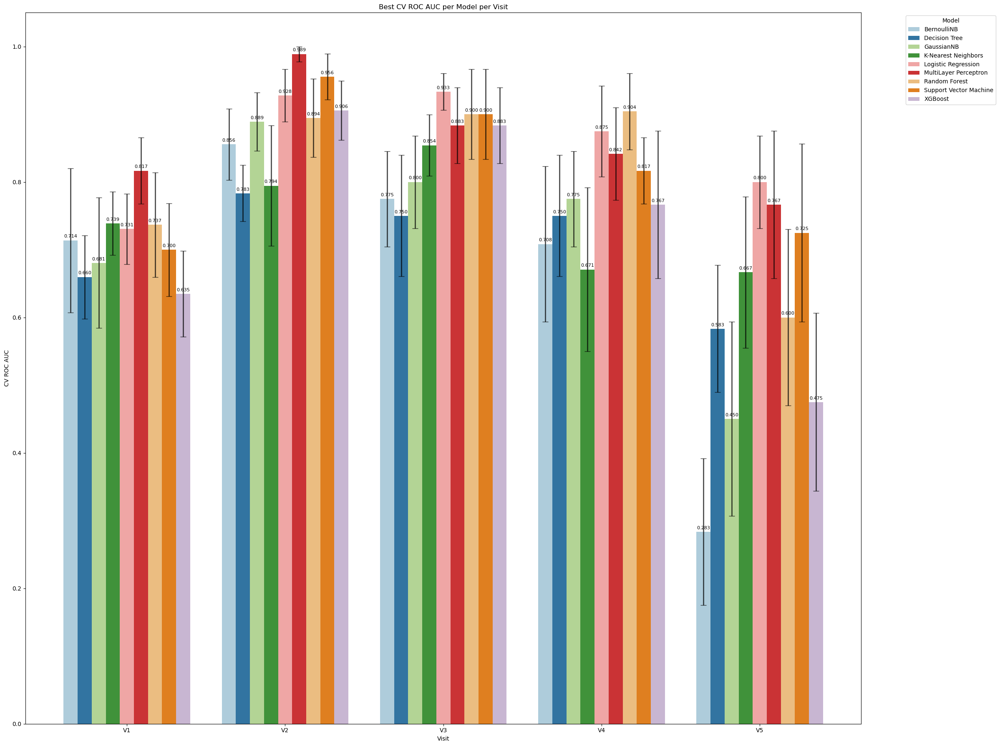

In [27]:
plot_model_performance_over_visits(all_visits_results, metric='CV ROC AUC')

Heatmap of model performance across visits

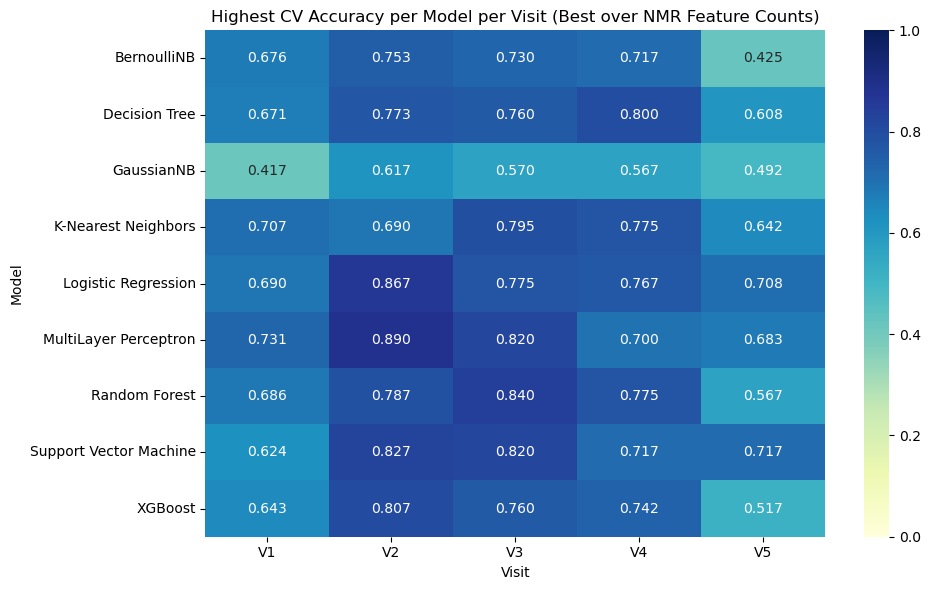

In [28]:
# Heatmap of model performance across visits
def plot_heatmap_model_visit(df):
    best_models = df.groupby(['Model', 'Visit'])['CV Accuracy'].max().reset_index()
    pivot_df = best_models.pivot(index='Model', columns='Visit', values='CV Accuracy')

    # Plot heatmap
    plt.figure(figsize=(10, 6))
    sns.heatmap(pivot_df, annot=True, fmt=".3f", cmap='YlGnBu', vmin=0, vmax=1)
    plt.title('Highest CV Accuracy per Model per Visit (Best over NMR Feature Counts)')
    plt.xlabel('Visit')
    plt.ylabel('Model')
    plt.tight_layout()
    plt.savefig("../result/figure/heatmap_model_visit_cv_accuracy.png", dpi=300, bbox_inches='tight')
    plt.show()
    
plot_heatmap_model_visit(all_visits_results)

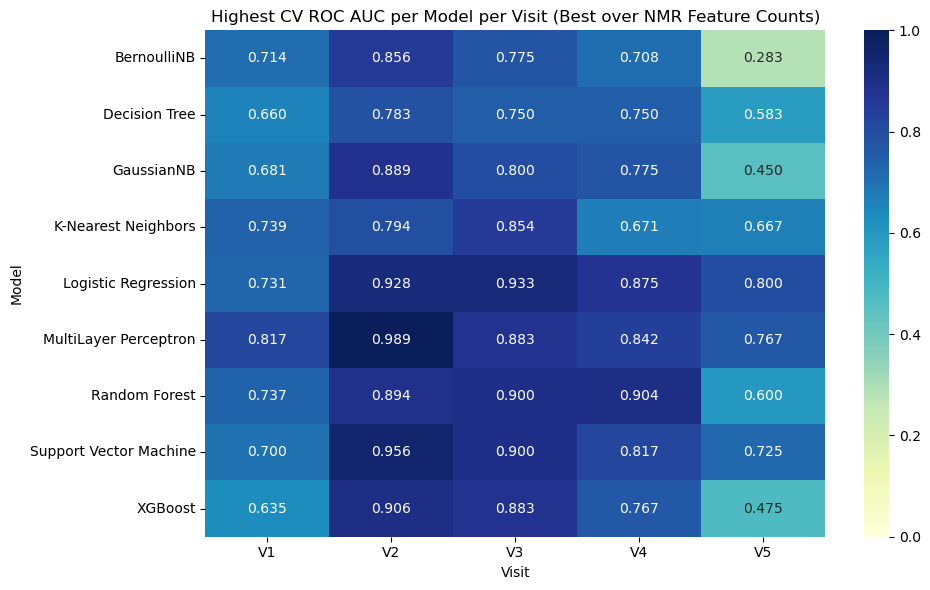

In [29]:
# Heatmap of model performance across visits
def plot_heatmap_model_visit(df):
    best_models = df.groupby(['Model', 'Visit'])['CV ROC AUC'].max().reset_index()
    pivot_df = best_models.pivot(index='Model', columns='Visit', values='CV ROC AUC')

    # Plot heatmap
    plt.figure(figsize=(10, 6))
    sns.heatmap(pivot_df, annot=True, fmt=".3f", cmap='YlGnBu', vmin=0, vmax=1)
    plt.title('Highest CV ROC AUC per Model per Visit (Best over NMR Feature Counts)')
    plt.xlabel('Visit')
    plt.ylabel('Model')
    plt.tight_layout()
    plt.savefig("../result/figure/heatmap_model_visit_cv_roc_auc.png", dpi=300, bbox_inches='tight')
    plt.show()
    
plot_heatmap_model_visit(all_visits_results)

visualize the ROC AUC scores across visits

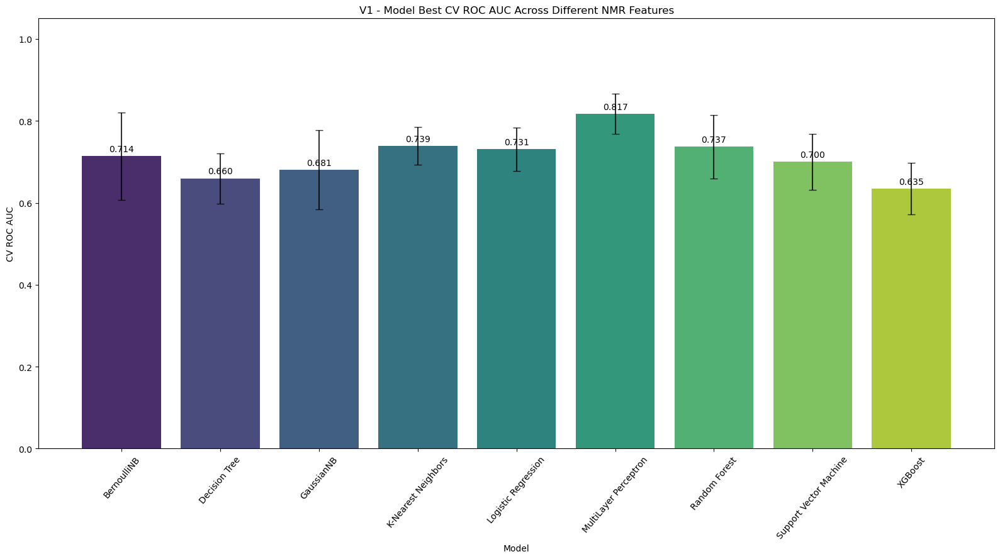

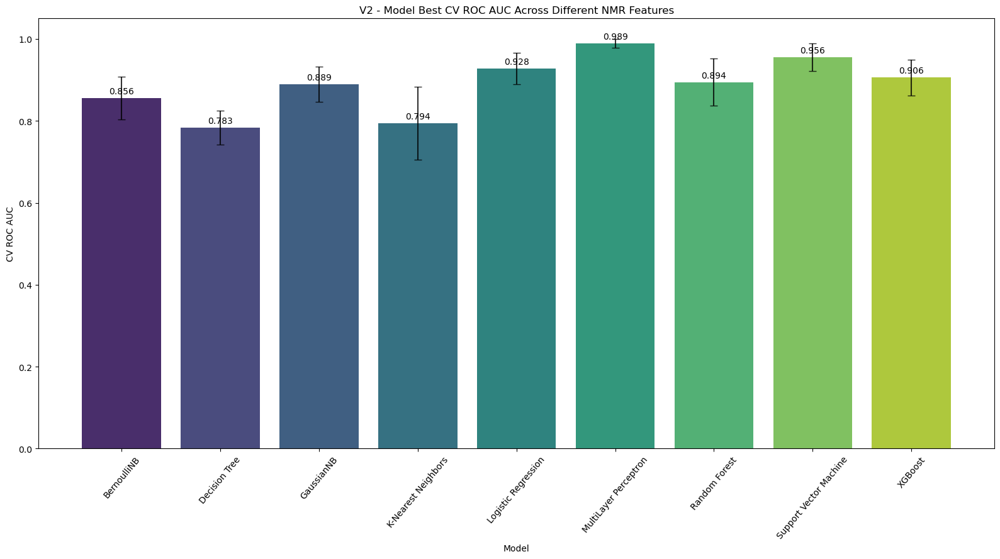

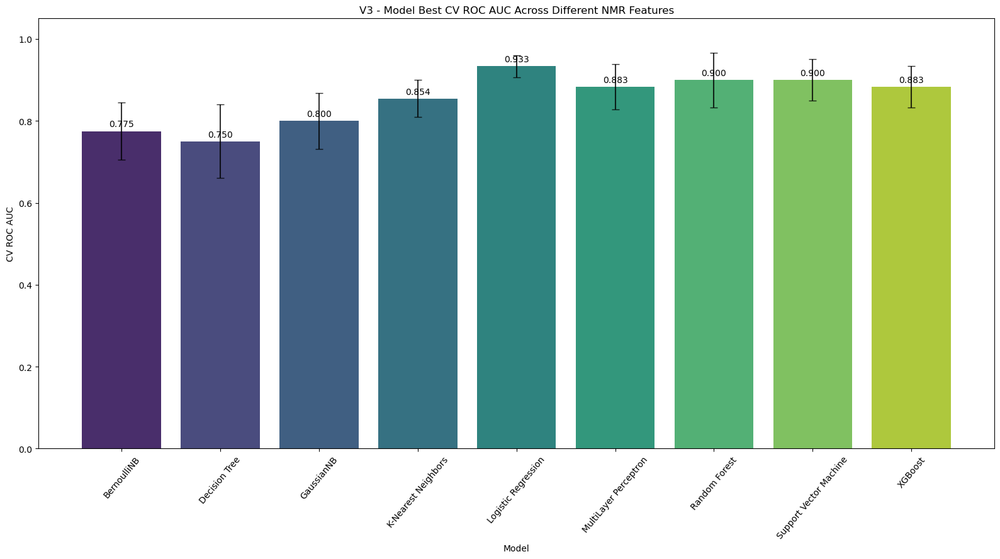

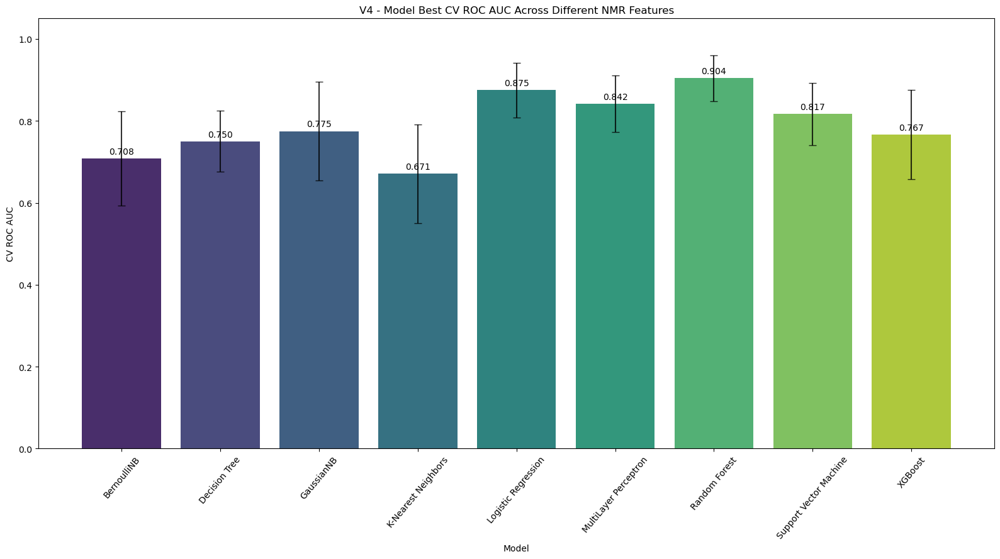

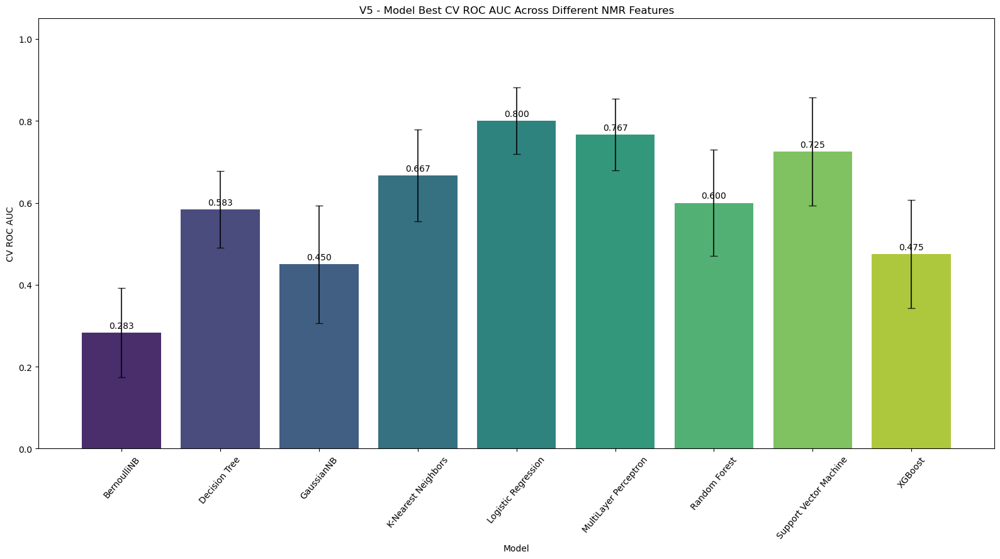

In [30]:
# visualize the CV ROC AUC scores across visits
def plot_roc_auc_by_visit(df_all):
    visits = df_all['Visit'].unique()
    plalette = sns.color_palette("viridis", 9)
    for visit in visits:
        df_result = df_all[df_all['Visit'] == visit]
        plt.figure(figsize=(16, 9))
        best_per_model = df_result.loc[df_result.groupby('Model')['CV ROC AUC'].idxmax()]
        ax = sns.barplot(data=best_per_model, x = 'Model',y='CV ROC AUC',palette= plalette, errorbar=None)
        for patch, (_, row) in zip(ax.patches, best_per_model.iterrows()):
            x = patch.get_x() + patch.get_width() / 2
            height = patch.get_height()
            se = row['SE CV ROC AUC']
            ax.errorbar(x, height, yerr=se, fmt='none', color='black', capsize=4, elinewidth=1.5, alpha=0.8)
        plt.title(f'{visit} - Model Best CV ROC AUC Across Different NMR Features')
        plt.ylim(0, 1.05)
        plt.xticks(rotation=50)
        for container in ax.containers:
            if isinstance(container, BarContainer):
                # Add labels to the bars
                labels = [f'{h:.3f}' for h in container.datavalues]
                ax.bar_label(container,labels = labels, label_type='edge', fontsize=10, padding=3)
        plt.xlabel('Model')
        plt.tight_layout()
        plt.savefig(f"../result/figure/roc_auc_by_visit_{visit}.png", dpi=300, bbox_inches='tight')
        plt.show()
plot_roc_auc_by_visit(all_visits_results)

Visualize the ROC AUC results

Performance of the model at different visits

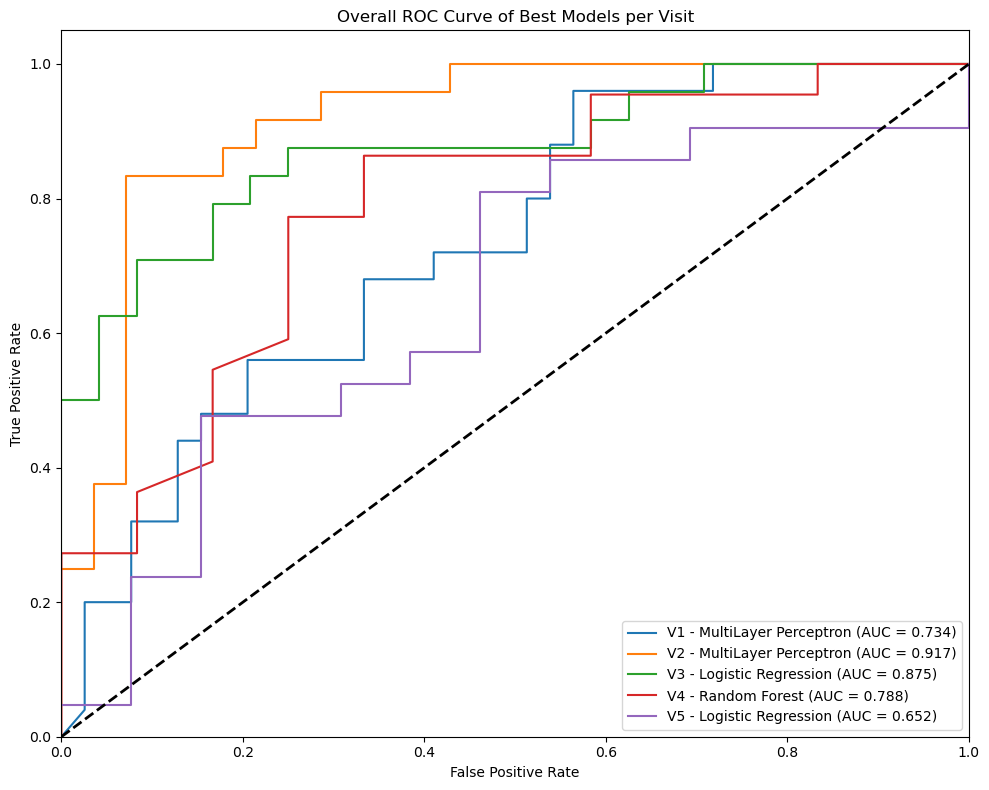

In [31]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
import ast

df = pd.read_excel("../result/data/meta+nmr/selection/model_results_all_visits_selection_leak.xlsx")
# Define the best models per visit based on CV ROC AUC
best_models = {
    'V1': 'MultiLayer Perceptron',
    'V2': 'MultiLayer Perceptron',
    'V3': 'Logistic Regression',
    'V4': 'Random Forest',
    'V5': 'Logistic Regression'
}

# Plot ROC curves for best models
plt.figure(figsize=(10, 8))

for visit, model in best_models.items():
    sub_df = df[(df['Visit'] == visit) & (df['Model'] == model)]
    if sub_df.empty:
        continue
    row = sub_df.loc[sub_df['CV ROC AUC'].idxmax()]
    y_true = ast.literal_eval(row['All y True']) if isinstance(row['All y True'], str) else row['All y True']
    y_proba = ast.literal_eval(row['All y Proba']) if isinstance(row['All y Proba'], str) else row['All y Proba']
    if y_proba is None or len(set(y_proba)) <= 1:
        continue
    fpr, tpr, _ = roc_curve(y_true, y_proba)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{visit} - {model} (AUC = {roc_auc:.3f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Overall ROC Curve of Best Models per Visit')
plt.legend(loc='lower right')
plt.tight_layout()
plt.savefig("../result/figure/roc_curve_best_models_per_visit.png", dpi=300, bbox_inches='tight')
plt.show()


Comparison of ROC curves of the same model on different NMR features across Visits

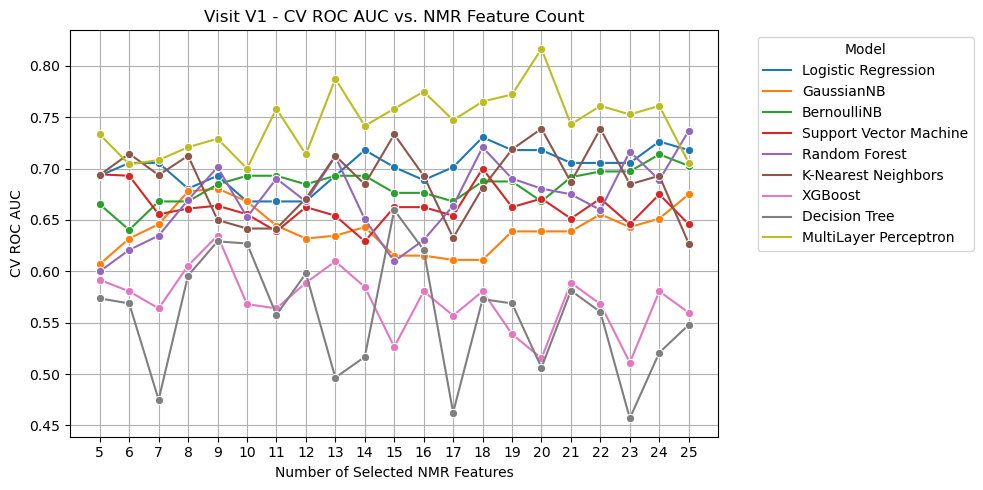

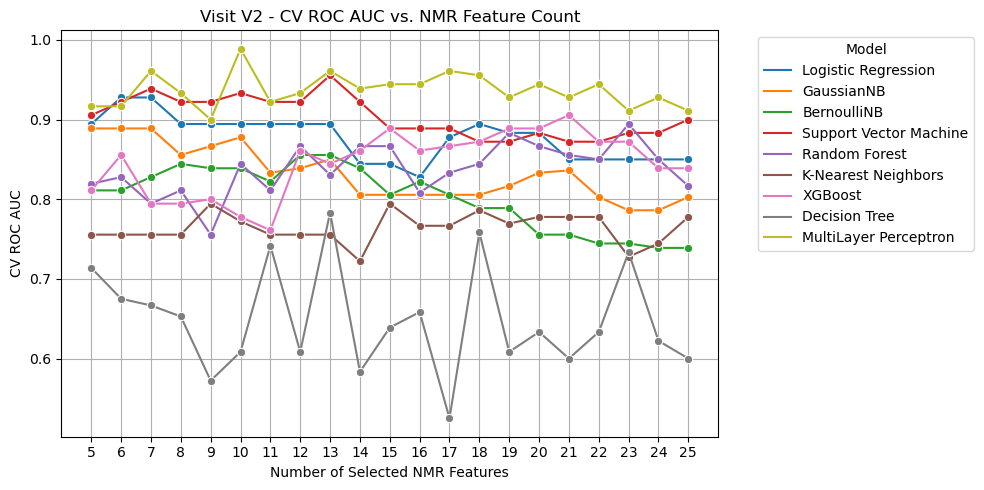

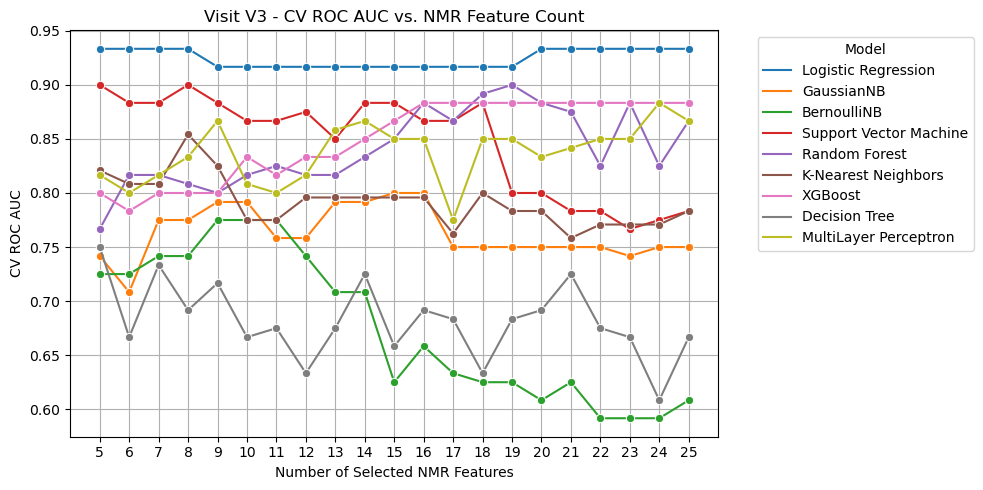

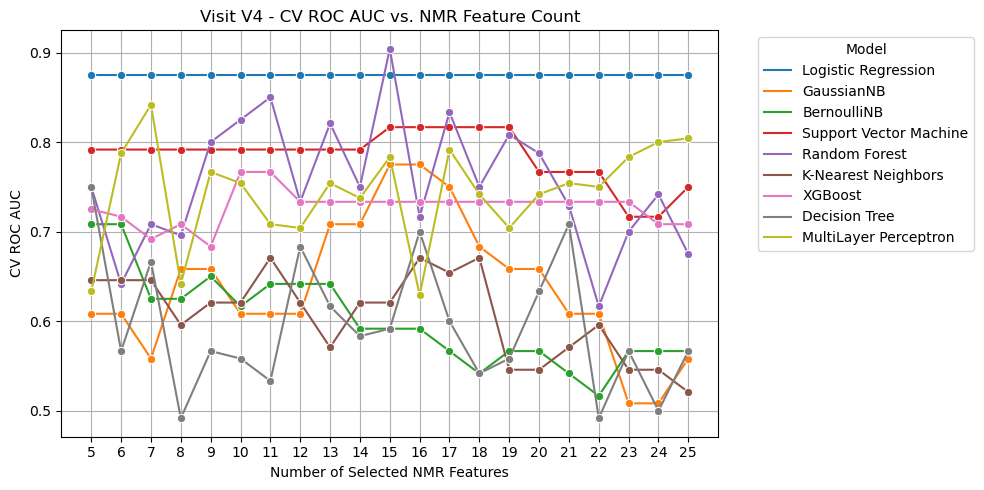

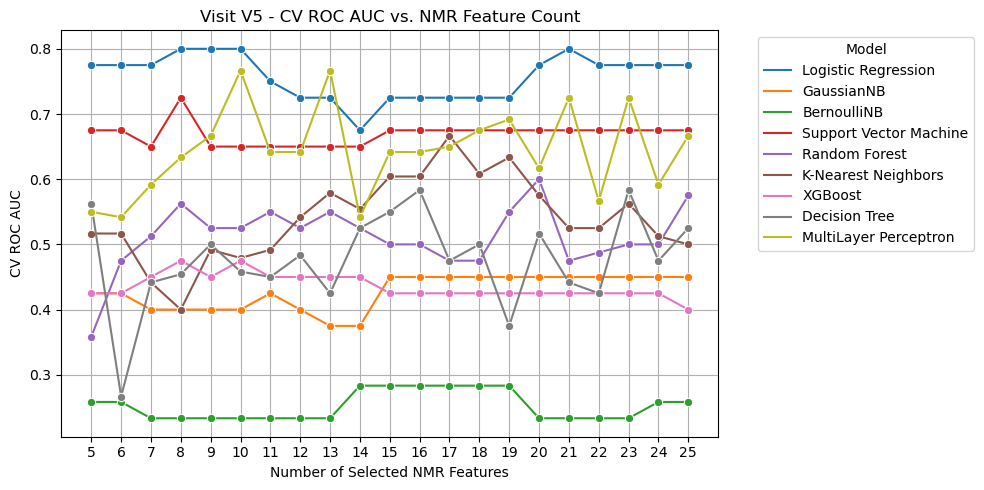

In [32]:
# for each visit, plot the CV ROC AUC vs. Top NMR Features
visits = df['Visit'].unique()
for visit in visits:
    visit_df = df[df['Visit'] == visit].copy()
    visit_df['Top NMR Features'] = pd.to_numeric(visit_df['Top NMR Features'])
    visit_df['CV ROC AUC'] = pd.to_numeric(visit_df['CV ROC AUC'])

    plt.figure(figsize=(10, 5))

    sns.lineplot(
        data=visit_df,
        x='Top NMR Features',
        y='CV ROC AUC',
        hue='Model',
        marker='o',
        errorbar=None
    )

    plt.title(f'Visit {visit} - CV ROC AUC vs. NMR Feature Count')
    plt.xlabel('Number of Selected NMR Features')
    plt.ylabel('CV ROC AUC')
    plt.grid(True)
    plt.legend(title='Model', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(visit_df['Top NMR Features'].unique())

    plt.tight_layout()
    plt.savefig(f"../result/figure/cv_roc_auc_vs_nmr_features_visit_{visit}.png", dpi=300, bbox_inches='tight')
    plt.show()


visulize the confusion matrix

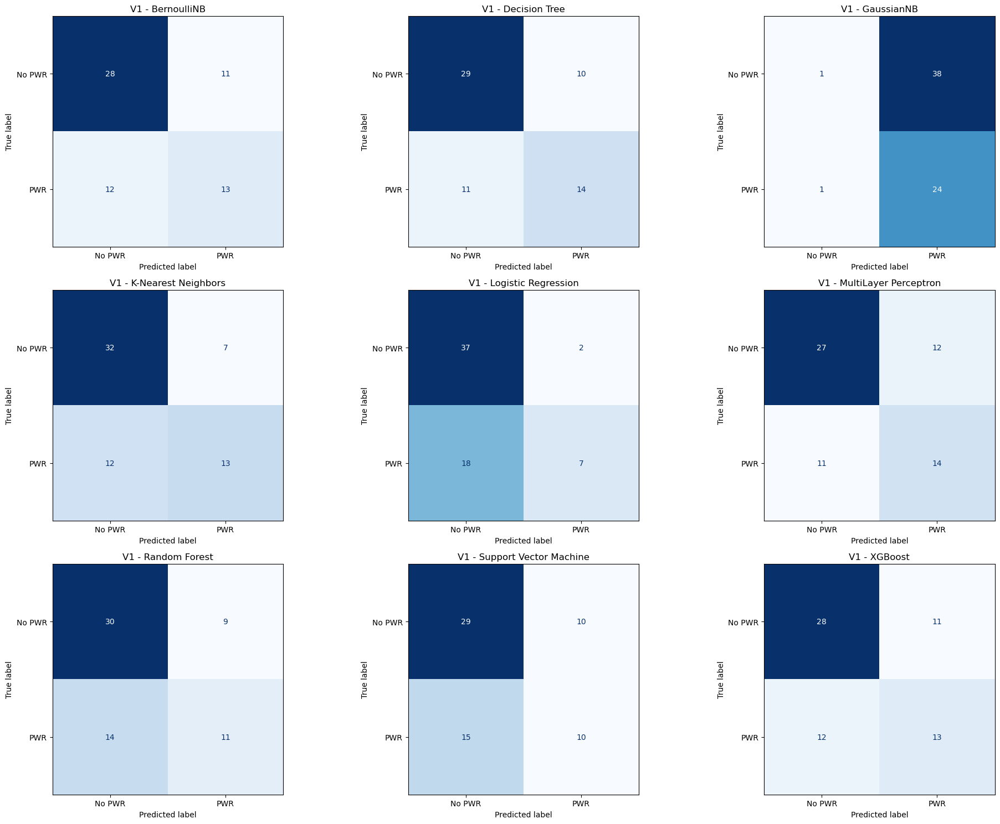

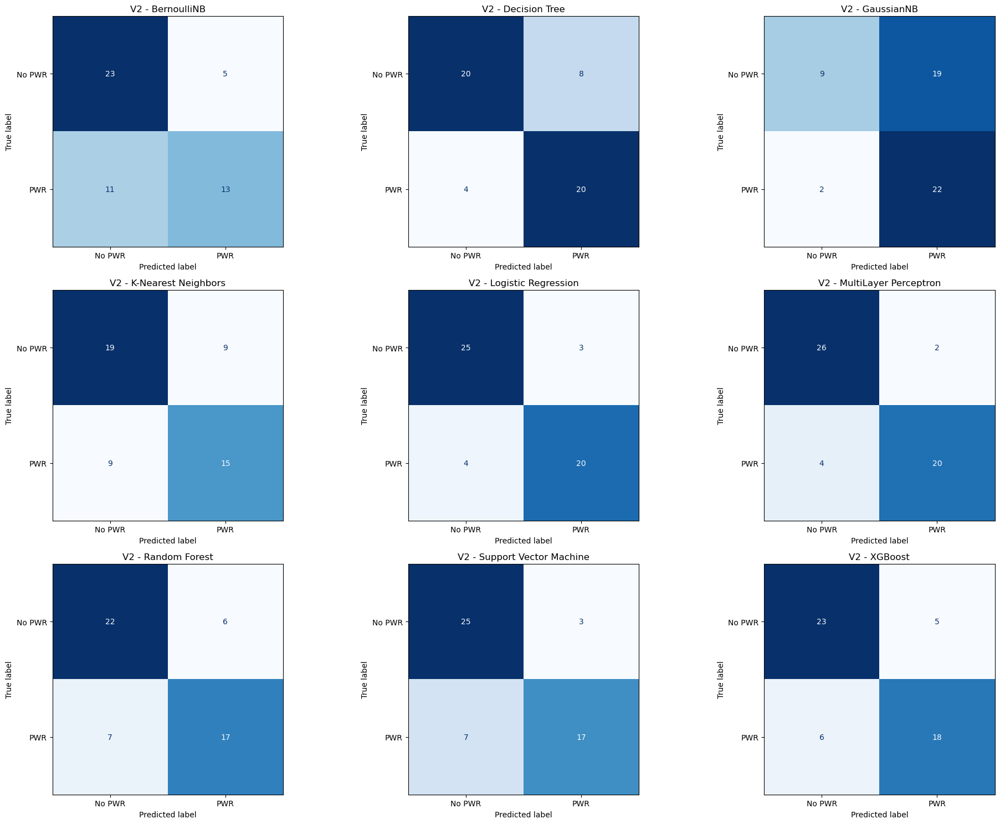

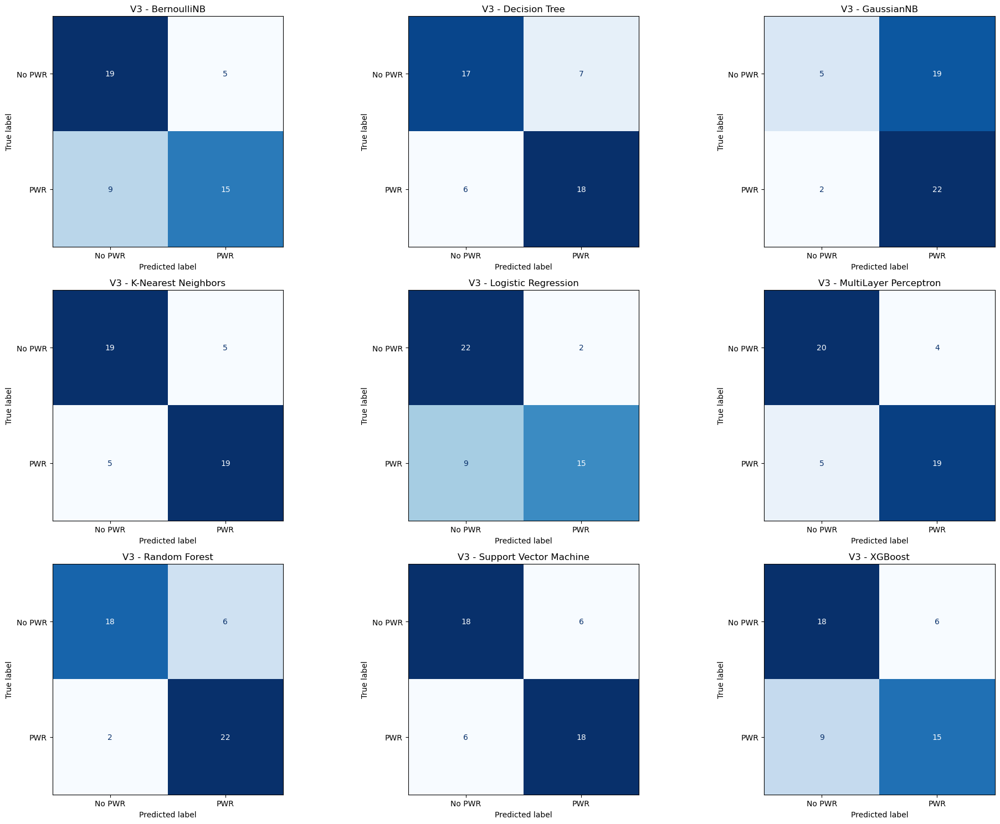

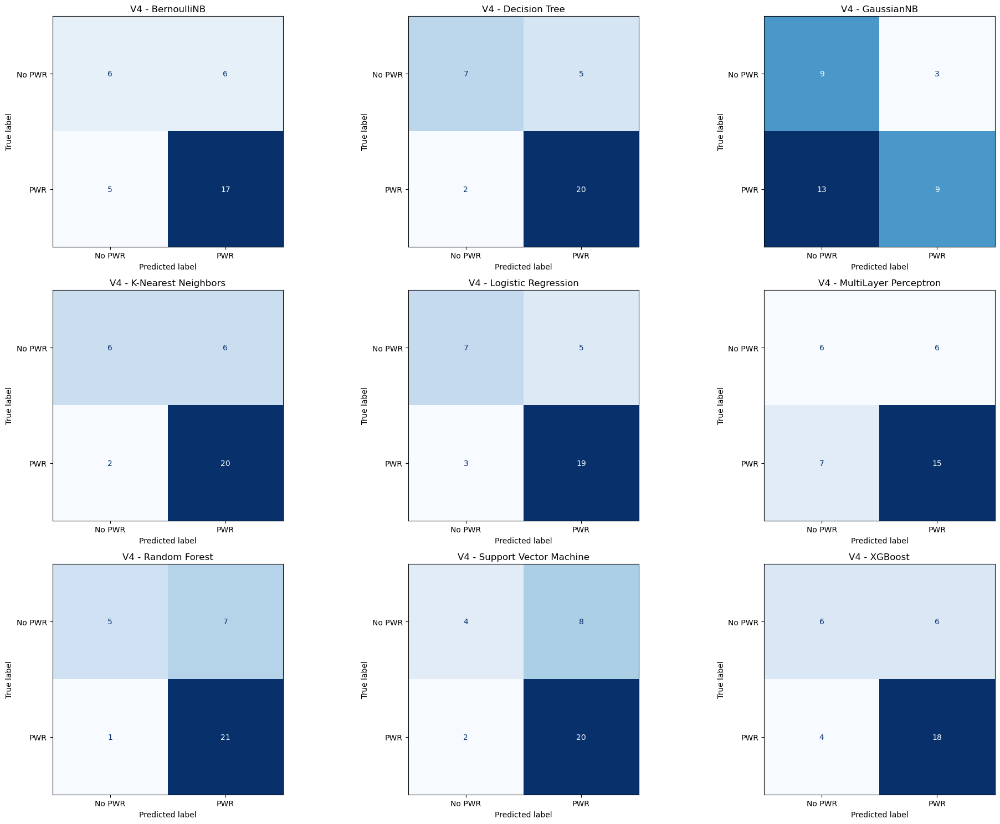

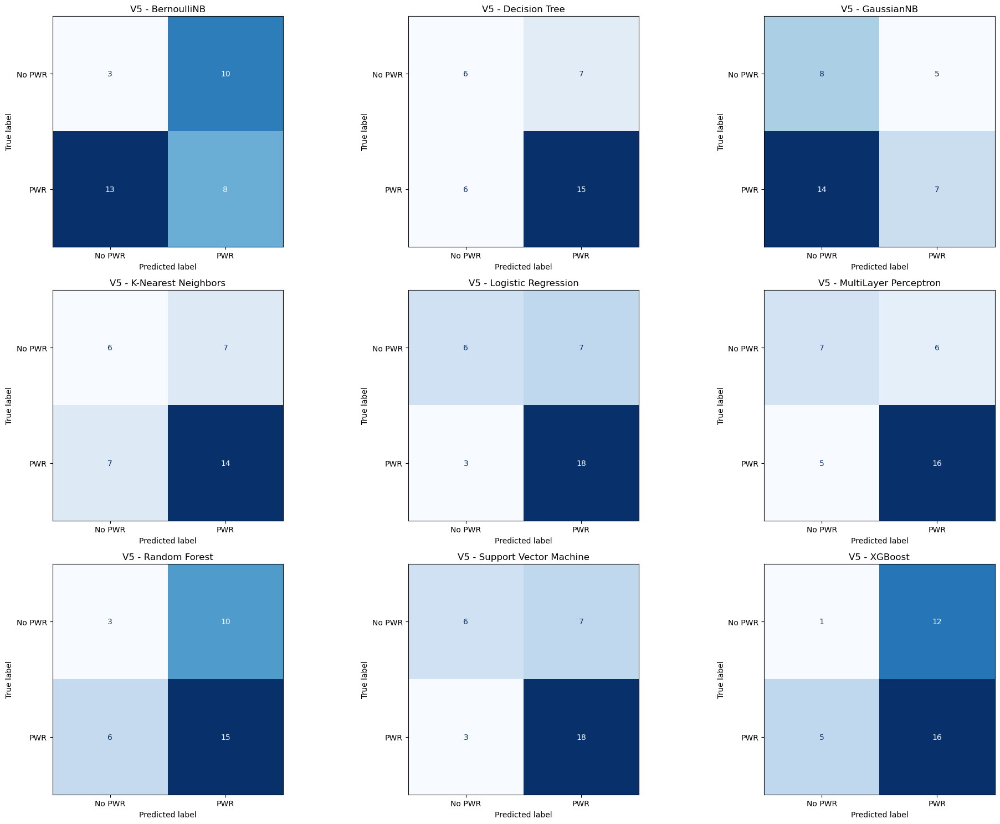

In [33]:
# visualize the confusion matrix for each model, across each visit, 
# using the best-performing version (based on CV ROC AUC)
def plot_confusion_matrix(df):
    from sklearn.metrics import ConfusionMatrixDisplay
    import matplotlib.pyplot as plt
    import re
    import numpy as np
    df = df.loc[df.groupby(['Visit', 'Model'])['CV ROC AUC'].idxmax()]
    visits = df['Visit'].unique()
    models = df['Model'].unique()
    for visit in visits:
        fig, axes = plt.subplots(3,3, figsize = (20,15))
        axes = axes.flatten()
        for idx,model in enumerate(models):
            ax = axes[idx]
            subset = df[(df['Visit'] == visit) & (df['Model'] == model)]
            if subset.empty:
                continue
            try:
                cm_str = subset['Overall Confusion Matrix'].values[0]
                cm_str = re.sub(r"\s+", ", ", cm_str.replace("\n", " "))
                cm_str = cm_str.replace("[,", "[").replace(",]", "]")  # edge cleanup
                cm = np.array(eval(cm_str))
                disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No PWR', 'PWR'])
                disp.plot(ax = ax,cmap='Blues', values_format='d',colorbar=False)
                ax.set_title(f'{visit} - {model}')
            except Exception as e:
                print(f"Skipping {visit} - {model} due to error: {e}")
                ax.axis('off')
        plt.tight_layout()
        plt.savefig(f"../result/figure/confusion_matrix_visit_{visit}.png", dpi=300, bbox_inches='tight')
        plt.show()

plot_confusion_matrix(all_visits_results)

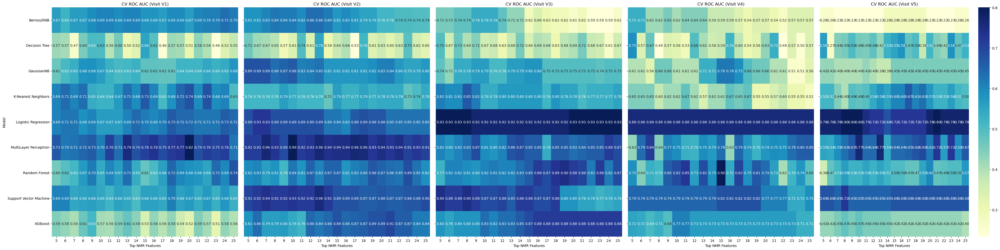

In [34]:
# The performance of all models at different NMR numbers
# Prepare data for heatmap: one heatmap per Visit
visits = sorted(df['Visit'].unique())
metric = 'CV ROC AUC'

# Set up the plotting area
fig, axes = plt.subplots(nrows=1, ncols=len(visits), figsize=(40, 10), sharey=True)

# Plot a heatmap for each Visit
for i, visit in enumerate(visits):
    ax = axes[i]
    subset = df[df['Visit'] == visit]
    pivot_table = subset.pivot(index='Model', columns='Top NMR Features', values=metric)
    sns.heatmap(pivot_table, annot=True, fmt=".2f", cmap="YlGnBu", cbar=(i == len(visits)-1), ax=ax)
    ax.set_title(f'{metric} (Visit {visit})')
    ax.set_xlabel('Top NMR Features')
    if i == 0:
        ax.set_ylabel('Model')
    else:
        ax.set_ylabel('')

plt.tight_layout()
plt.savefig("../result/figure/heatmap_model_performance_nmr_features.png", dpi=300, bbox_inches='tight')

In [20]:
import plotly.express as px
df['Top NMR Features'] = df['Top NMR Features'].astype(int)

# Create pivoted table for each Top NMR Features
fig = px.density_heatmap(
    df,
    x="Visit",
    y="Model",
    z="CV ROC AUC",
    animation_frame="Top NMR Features",
    color_continuous_scale="YlGnBu",
    range_color=[0.4, 1.0],
    title="Model CV ROC AUC by Visit (Animated over Top NMR Features Count)",
    
)

fig.update_layout(width=1000, height=600)
fig.show()

## Nested Cross-Validation using only NMR data

In [1]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, roc_auc_score
)
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
import xgboost as xgb
import pandas as pd
import numpy as np

In [3]:
# Prepare the data
def prepare_data(df):
    X = df.drop(columns = ['pwr_current','ppg_BMI','first_BMI','wt_gain','age_delivery_range2',
                           'race_1', 'race_2', 'vig_activity','weight_change','caffeine',
                        	'num_alc_weekly','smoke_current','visit'])
    y = df['pwr_current']
    dataframe = pd.DataFrame(X, columns=X.columns)
    return dataframe, y

for visit in range(1,6):
    df = pd.read_csv(f"../result/data/meta+nmr/DF{visit}.csv")
    X, y = prepare_data(df)
    df_combined = X.copy()
    df_combined['pwr_current'] = y
    df_combined.to_csv(f"../result/data/nmr_only/DF{visit}_nmr_only.csv", index=False)

In [ ]:
def train_with_cv(df,cv=10,inner_cv = 10,random_state=42):
    # Drop the target and identifier columns
    X = df.drop(columns = ['pwr_current'])
    y = df['pwr_current']

    param_grid = {
        'Logistic Regression': [
        # Combinations for 'liblinear' solver
        {'model__C': [0.01, 0.05, 0.1, 1, 10],'model__penalty': ['l1', 'l2'],'model__solver': ['liblinear']},
        # Combinations for 'lbfgs' solver
        {'model__C': [0.01, 0.05, 0.1, 1, 10],'model__penalty': ['l2'],'model__solver': ['lbfgs']},
        # Combinations for 'elastic net'
        {'model__C': [0.01, 0.05, 0.1, 1, 10],'model__penalty': ['elasticnet'],'model__l1_ratio': [0.1, 0.5, 0.9],'model__solver': ['saga']},
        
        ],
        
        'Support Vector Machine':[
        # Linear kernel: C only
        {'model__C': [0.01, 0.1, 1, 10], 'model__kernel': ['linear']},
        # RBF kernel: C and gamma
        {'model__C': [0.01, 0.1, 1, 10], 'model__kernel': ['rbf'], 'model__gamma': ['scale', 0.001, 0.01, 0.1, 1]},
        ],

        'K-Nearest Neighbors':{
            'model__n_neighbors': [1, 2, 3, 4, 5],
            'model__weights': ['uniform', 'distance'],
            'model__metric': ['euclidean', 'manhattan'],
        },

        'Random Forest':{
            'model__n_estimators': [50, 100, 200,300],
            'model__max_depth': [None, 10],
            'model__min_samples_split':[2, 5, 10],
            'model__max_features': ['sqrt', 1.0], # 1.0 means all
            'model__class_weight': ['balanced'],
            'model__bootstrap': [True],
        },

        'XGBoost':{
            'model__n_estimators': [50, 100, 200,300],
            'model__learning_rate': [0.01, 0.05,0.1, 0.2],
            'model__gamma': [0, 0.1],
            'model__reg_alpha': [0.01,0.1], # L1 regularization
            'model__reg_lambda': [0.01,0.1], # L2 regularization
            },
        
        'MultiLayer Perceptron':{
            'model__hidden_layer_sizes': [(100,), (150,),(150,50),(100,50),(50,25)],
            'model__activation': ['relu','tanh'],
            'model__alpha': [0.0001, 0.001],
            'model__solver': ['adam', 'lbfgs'], # 'lbfgs' is for smaller datasets
            'model__learning_rate_init': [0.001, 0.01, 0.1],
        },

        'GaussianNB':{
            'model__var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6],
        },

        'BernoulliNB':{
            'model__alpha': [1e-5, 0.1, 0.5, 1.0],
        },
        
        'Decision Tree':{
            'model__max_depth': [5, 10, None],
            'model__max_features': [None, 'sqrt', 'log2', 0.8],
            'model__criterion': ['gini', 'entropy'],
        }
    }
    # prepare the models
    models = {
        'Logistic Regression': LogisticRegression(max_iter=1000, random_state=random_state),
        'GaussianNB': GaussianNB(),
        'BernoulliNB': BernoulliNB(),
        'Support Vector Machine': SVC(probability=True, random_state=random_state),
        'Random Forest': RandomForestClassifier(random_state=random_state),
        'K-Nearest Neighbors': KNeighborsClassifier(n_jobs=-1),
        'XGBoost': xgb.XGBClassifier(eval_metric='logloss', random_state=random_state),
        'Decision Tree': DecisionTreeClassifier(random_state=random_state),
        'MultiLayer Perceptron': MLPClassifier(max_iter=1000, random_state=random_state),
    }    

    all_results = []
    outer_kf = StratifiedKFold(n_splits=cv, shuffle=True, random_state=random_state)
    best_models = {}
    # Loop through each outer fold
    for model_name, model in models.items():
        print(f"Training on the model:{model_name}")
        fold_metrics = []
        all_y_test_outer = []
        all_y_pred_outer = []
        all_y_proba_outer = []

        for fold_idx, (train_idx, test_idx) in enumerate(outer_kf.split(X, y)):
            print(f"This is fold:{fold_idx + 1} for model:{model_name}")
            X_train, X_test_outer_fold = X.iloc[train_idx], X.iloc[test_idx]
            y_train, y_test_outer_fold = y.iloc[train_idx], y.iloc[test_idx]

            # Define the pipeline
            clf = Pipeline([
                ('model', model)
            ])

            if model_name in param_grid:
                grid = GridSearchCV(
                    clf,
                    param_grid=param_grid[model_name],
                    cv=StratifiedKFold(n_splits=inner_cv, shuffle=True, random_state=random_state),
                    scoring='f1',
                    n_jobs=-1,
                )
                grid.fit(X_train, y_train)
                best_model = grid.best_estimator_
            else:
                best_model = clf
                best_model.fit(X_train, y_train)
            
            # Predict and Evaluate on the outer fold test set
            y_pred_outer_fold = best_model.predict(X_test_outer_fold)

            try:
                y_proba_outer_fold = best_model.predict_proba(X_test_outer_fold)[:, 1]
                roc = roc_auc_score(y_test_outer_fold, y_proba_outer_fold)
            except:
                y_proba_outer_fold = None
                roc = None
            
            # Store the results for this fold
            fold_metrics.append({
                'accuracy': accuracy_score(y_test_outer_fold, y_pred_outer_fold),
                'f1': f1_score(y_test_outer_fold, y_pred_outer_fold, zero_division=0),
                'precision': precision_score(y_test_outer_fold, y_pred_outer_fold, zero_division=0),
                'recall': recall_score(y_test_outer_fold, y_pred_outer_fold, zero_division=0),
                'roc_auc': roc,
                'confusion_matrix': confusion_matrix(y_test_outer_fold, y_pred_outer_fold),
            })

            # Store predictions and probabilities for later analysis
            all_y_test_outer.extend(y_test_outer_fold.tolist())
            all_y_pred_outer.extend(y_pred_outer_fold.tolist())
            
            if y_proba_outer_fold is not None:
                all_y_proba_outer.extend(y_proba_outer_fold.tolist())
            else:
                all_y_proba_outer.extend([None] * len(y_test_outer_fold))
        
        # Calculate mean metrics across all folds
        overall_roc_auc = roc_auc_score(all_y_test_outer, all_y_proba_outer) if all_y_proba_outer else None
        overall_confusion_matrix = confusion_matrix(all_y_test_outer, all_y_pred_outer)
        
        # Store the average results for this model
        n_folds = len(fold_metrics)

        avg_results = {
            'Model': model_name,
            'Average CV Accuracy': np.mean([fold['accuracy'] for fold in fold_metrics]),
            'Std CV Accuracy': np.std([fold['accuracy'] for fold in fold_metrics]),
            'SE CV Accuracy': np.std([fold['accuracy'] for fold in fold_metrics]) / np.sqrt(n_folds),

            'Average CV F1 Score': np.mean([fold['f1'] for fold in fold_metrics]),
            'Std CV F1 Score': np.std([fold['f1'] for fold in fold_metrics]),
            'SE CV F1 Score': np.std([fold['f1'] for fold in fold_metrics]) / np.sqrt(n_folds),

            'Average CV Precision': np.mean([fold['precision'] for fold in fold_metrics]),
            'Std CV Precision': np.std([fold['precision'] for fold in fold_metrics]),
            'SE CV Precision': np.std([fold['precision'] for fold in fold_metrics]) / np.sqrt(n_folds),

            'Average CV Recall': np.mean([fold['recall'] for fold in fold_metrics]),
            'Std CV Recall': np.std([fold['recall'] for fold in fold_metrics]),
            'SE CV Recall': np.std([fold['recall'] for fold in fold_metrics]) / np.sqrt(n_folds),

            'Average CV ROC AUC': np.mean([fold['roc_auc'] for fold in fold_metrics if fold['roc_auc'] is not None]),
            'Std CV ROC AUC': np.std([fold['roc_auc'] for fold in fold_metrics if fold['roc_auc'] is not None]),
            'SE CV ROC AUC': np.std([fold['roc_auc'] for fold in fold_metrics if fold['roc_auc'] is not None]) / np.sqrt(n_folds),
            
            'Overall ROC AUC': overall_roc_auc,
            'Overall Confusion Matrix': overall_confusion_matrix,
            'All Fold Confusion Matrices': [fold['confusion_matrix'] for fold in fold_metrics],
        }
        avg_results['All y True'] = all_y_test_outer
        avg_results['All y Proba'] = all_y_proba_outer
        all_results.append(avg_results)
        best_models[model_name] = {
            'estimator': best_model
        }
    return pd.DataFrame(all_results), all_results, best_models

In [ ]:
# Training and evaluating models for each visit
import joblib
# Dictionary to save all visits' all_results 
all_visit_raw_results = {}
all_best_models = {}
for v in range(1,6): 
    df = pd.read_csv(f"../result/data/nmr_only/DF{v}_nmr_only.csv")
    print(f"Results for Visit V{v}:")
    result, all_results, best_models = train_with_cv(df)
    # Save the results to excel files
    result.to_excel(f"../result/data/nmr_only/model_results_v{v}_hyper_nmr.xlsx", index=True)
    joblib.dump(all_results,f"../result/data/nmr_only/all_results_v{v}_nmr.pkl")
    
    all_visit_raw_results[f"V{v}"] = all_results
    all_best_models[f"V{v}"] = best_models
# Save combined all_results
joblib.dump(all_visit_raw_results,"../result/data/nmr_only/all_results_combined_nmr.pkl")
joblib.dump(all_best_models,"../result/data/nmr_only/all_best_models_nmr.pkl")
print("\nTraining and evaluation complete for all files.")

In [27]:
# Combine all visit results into a single DataFrame with Visit labels
visit_dfs = []
for v in range(1, 6):
    df = pd.read_csv(f"../result/data/nmr_only/model_results_v{v}_hyper_nmr.csv", index_col=0)
    df["Visit"] = f"V{v}"
    visit_dfs.append(df)

# Concatenate all visits
all_visits_results = pd.concat(visit_dfs, ignore_index=True)

# Save to a single Excel file
all_visits_results.to_excel("../result/data/nmr_only/model_results_all_visits_hyper_nmr.xlsx", index=False)

In [61]:
# Select the best model based on Average CV ROC AUC across all visits
all_visits_results = pd.read_excel("../result/data/nmr_only/model_results_all_visits_hyper_nmr.xlsx")
best_model_by_visit = all_visits_results.loc[all_visits_results.groupby('Visit')['Average CV ROC AUC'].idxmax()].reset_index(drop=True)
# Print results
print("Best model by visit based on Average CV ROC AUC using all 2D NMR Only:")
print(best_model_by_visit[['Visit', 'Model', 'Average CV ROC AUC','Std CV ROC AUC']])

# save the all model averages
#best_model_by_visit.to_excel("../result/data/nmr_only/best_model_by_visit_nmr.xlsx", index=False)

Best model by visit based on Average CV ROC AUC using all 2D NMR Only:
  Visit                  Model  Average CV ROC AUC  Std CV ROC AUC
0    V1          Random Forest            0.607500        0.231194
1    V2  MultiLayer Perceptron            0.656667        0.248182
2    V3  MultiLayer Perceptron            0.741667        0.206492
3    V4            BernoulliNB            0.741667        0.222673
4    V5            BernoulliNB            0.687500        0.195656


## Nested Cross-Validation using only Meta data

In [ ]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, roc_auc_score
)
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
import xgboost as xgb
import pandas as pd
import numpy as np

In [ ]:
# Prepare the data
for visit in range(1,6):
    df = pd.read_csv(f"../result/data/DF{visit}.csv")
    df = df.iloc[:, :14]
    df.to_csv(f"../result/data/meta_only/DF{visit}_meta_only.csv", index=False)

In [191]:
for visit in range(1,6):
    df = pd.read_csv(f"../result/data/meta_only/DF{visit}_meta_only.csv")
    df = df[df['weight_change'] > 0] # Filter out rows where weight_change is not greater than 0
    df.to_csv(f"../result/data/meta_only/DF{visit}_meta_only_filtered.csv", index=False)

In [ ]:
def train_with_cv(df,cv=10,inner_cv = 10,random_state=42):
    # list of columns to analyze
    one_hot_cols = ['vig_activity']
    binary_cols = ['race_1', 'race_2']
    continuous_cols = ['wt_gain','weight_change','age_delivery_range2','num_alc_weekly']
    explicit_cols = ['caffeine','smoke_current','ppg_BMI', 'first_BMI']

    # Drop the target and identifier columns
    X = df.drop(columns = ['pwr_current','participant_id','visit'])
    y = df['pwr_current']
    # Get the explicit categories
    explicit_categories = [sorted(set(X[col].dropna().unique())) for col in explicit_cols]
    # Convert categorical columns to one-hot encoding
    preprocessor = ColumnTransformer(
        transformers=[
            ('cat', OneHotEncoder(drop = 'first',handle_unknown='ignore'), one_hot_cols),
            ('explicit', OneHotEncoder(categories=explicit_categories, handle_unknown='ignore'), explicit_cols),
            ('binary', 'passthrough', binary_cols),
            ('num', StandardScaler(), continuous_cols)
        ]
    )

    param_grid = {
        'Logistic Regression': [
        # Combinations for 'liblinear' solver
        {'model__C': [0.01, 0.05, 0.1, 1, 10],'model__penalty': ['l1', 'l2'],'model__solver': ['liblinear']},
        # Combinations for 'lbfgs' solver
        {'model__C': [0.01, 0.05, 0.1, 1, 10],'model__penalty': ['l2'],'model__solver': ['lbfgs']},
        # Combinations for 'elastic net'
        {'model__C': [0.01, 0.05, 0.1, 1, 10],'model__penalty': ['elasticnet'],'model__l1_ratio': [0.1, 0.5, 0.9],'model__solver': ['saga']},
        
        ],
        
        'Support Vector Machine':[
        # Linear kernel: C only
        {'model__C': [0.01, 0.1, 1, 10], 'model__kernel': ['linear']},
        # RBF kernel: C and gamma
        {'model__C': [0.01, 0.1, 1, 10], 'model__kernel': ['rbf'], 'model__gamma': ['scale', 0.001, 0.01, 0.1, 1]},
        ],

        'K-Nearest Neighbors':{
            'model__n_neighbors': [1, 2, 3, 4, 5],
            'model__weights': ['uniform', 'distance'],
            'model__metric': ['euclidean', 'manhattan'],
        },

        'Random Forest':{
            'model__n_estimators': [50, 100, 200,300],
            'model__max_depth': [None, 10],
            'model__min_samples_split':[2, 5, 10],
            'model__max_features': ['sqrt', 1.0], # 1.0 means all
            'model__class_weight': ['balanced'],
            'model__bootstrap': [True],
        },

        'XGBoost':{
            'model__n_estimators': [50, 100, 200,300],
            'model__learning_rate': [0.01, 0.05,0.1, 0.2],
            'model__gamma': [0, 0.1],
            'model__reg_alpha': [0.01,0.1], # L1 regularization
            'model__reg_lambda': [0.01,0.1], # L2 regularization
            },
        
        'MultiLayer Perceptron':{
            'model__hidden_layer_sizes': [(100,), (150,),(150,50),(100,50),(50,25)],
            'model__activation': ['relu','tanh'],
            'model__alpha': [0.0001, 0.001],
            'model__solver': ['adam', 'lbfgs'], # 'lbfgs' is for smaller datasets
            'model__learning_rate_init': [0.001, 0.01, 0.1],
        },

        'GaussianNB':{
            'model__var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6],
        },

        'BernoulliNB':{
            'model__alpha': [1e-5, 0.1, 0.5, 1.0],
        },
        
        'Decision Tree':{
            'model__max_depth': [5, 10, None],
            'model__max_features': [None, 'sqrt', 'log2', 0.8],
            'model__criterion': ['gini', 'entropy'],
        }
    }
    # prepare the models
    models = {
        'Logistic Regression': LogisticRegression(max_iter=1000, random_state=random_state),
        'GaussianNB': GaussianNB(),
        'BernoulliNB': BernoulliNB(),
        'Support Vector Machine': SVC(probability=True, random_state=random_state),
        'Random Forest': RandomForestClassifier(random_state=random_state),
        'K-Nearest Neighbors': KNeighborsClassifier(n_jobs=1),
        'XGBoost': xgb.XGBClassifier(eval_metric='logloss', random_state=random_state),
        'Decision Tree': DecisionTreeClassifier(random_state=random_state),
        'MultiLayer Perceptron': MLPClassifier(max_iter=1000, random_state=random_state),
    }    

    all_results = []
    outer_kf = StratifiedKFold(n_splits=cv, shuffle=True, random_state=random_state)
    best_models = {}
    # Loop through each outer fold
    for model_name, model in models.items():
        print(f"Training on the model:{model_name}")
        fold_metrics = []
        all_y_test_outer = []
        all_y_pred_outer = []
        all_y_proba_outer = []

        for fold_idx, (train_idx, test_idx) in enumerate(outer_kf.split(X, y)):
            print(f"This is fold:{fold_idx + 1} for model:{model_name}")
            X_train, X_test_outer_fold = X.iloc[train_idx], X.iloc[test_idx]
            y_train, y_test_outer_fold = y.iloc[train_idx], y.iloc[test_idx]

            # Define the pipeline
            clf = Pipeline([
                ('preprocessor', preprocessor),
                ('model', model)
            ])

            if model_name in param_grid:
                grid = GridSearchCV(
                    clf,
                    param_grid=param_grid[model_name],
                    cv=StratifiedKFold(n_splits=inner_cv, shuffle=True, random_state=random_state),
                    scoring='f1',
                    n_jobs=-1,
                )
                grid.fit(X_train, y_train)
                best_model = grid.best_estimator_
            else:
                best_model = clf
                best_model.fit(X_train, y_train)
            
            # Predict and Evaluate on the outer fold test set
            y_pred_outer_fold = best_model.predict(X_test_outer_fold)

            try:
                y_proba_outer_fold = best_model.predict_proba(X_test_outer_fold)[:, 1]
                roc = roc_auc_score(y_test_outer_fold, y_proba_outer_fold)
            except:
                y_proba_outer_fold = None
                roc = None
            
            # Store the results for this fold
            fold_metrics.append({
                'accuracy': accuracy_score(y_test_outer_fold, y_pred_outer_fold),
                'f1': f1_score(y_test_outer_fold, y_pred_outer_fold, zero_division=0),
                'precision': precision_score(y_test_outer_fold, y_pred_outer_fold, zero_division=0),
                'recall': recall_score(y_test_outer_fold, y_pred_outer_fold, zero_division=0),
                'roc_auc': roc,
                'confusion_matrix': confusion_matrix(y_test_outer_fold, y_pred_outer_fold),
            })

            # Store predictions and probabilities for later analysis
            all_y_test_outer.extend(y_test_outer_fold.tolist())
            all_y_pred_outer.extend(y_pred_outer_fold.tolist())
            
            if y_proba_outer_fold is not None:
                all_y_proba_outer.extend(y_proba_outer_fold.tolist())
            else:
                all_y_proba_outer.extend([None] * len(y_test_outer_fold))
        
        # Calculate mean metrics across all folds
        overall_roc_auc = roc_auc_score(all_y_test_outer, all_y_proba_outer) if all_y_proba_outer else None
        overall_confusion_matrix = confusion_matrix(all_y_test_outer, all_y_pred_outer)
        
        # Store the average results for this model
        n_folds = len(fold_metrics)

        avg_results = {
            'Model': model_name,
            'Average CV Accuracy': np.mean([fold['accuracy'] for fold in fold_metrics]),
            'Std CV Accuracy': np.std([fold['accuracy'] for fold in fold_metrics]),
            'SE CV Accuracy': np.std([fold['accuracy'] for fold in fold_metrics]) / np.sqrt(n_folds),

            'Average CV F1 Score': np.mean([fold['f1'] for fold in fold_metrics]),
            'Std CV F1 Score': np.std([fold['f1'] for fold in fold_metrics]),
            'SE CV F1 Score': np.std([fold['f1'] for fold in fold_metrics]) / np.sqrt(n_folds),

            'Average CV Precision': np.mean([fold['precision'] for fold in fold_metrics]),
            'Std CV Precision': np.std([fold['precision'] for fold in fold_metrics]),
            'SE CV Precision': np.std([fold['precision'] for fold in fold_metrics]) / np.sqrt(n_folds),

            'Average CV Recall': np.mean([fold['recall'] for fold in fold_metrics]),
            'Std CV Recall': np.std([fold['recall'] for fold in fold_metrics]),
            'SE CV Recall': np.std([fold['recall'] for fold in fold_metrics]) / np.sqrt(n_folds),

            'Average CV ROC AUC': np.mean([fold['roc_auc'] for fold in fold_metrics if fold['roc_auc'] is not None]),
            'Std CV ROC AUC': np.std([fold['roc_auc'] for fold in fold_metrics if fold['roc_auc'] is not None]),
            'SE CV ROC AUC': np.std([fold['roc_auc'] for fold in fold_metrics if fold['roc_auc'] is not None]) / np.sqrt(n_folds),
            
            'Overall ROC AUC': overall_roc_auc,
            'Overall Confusion Matrix': overall_confusion_matrix,
            'All Fold Confusion Matrices': [fold['confusion_matrix'] for fold in fold_metrics],
        }
        avg_results['All y True'] = all_y_test_outer
        avg_results['All y Proba'] = all_y_proba_outer
        all_results.append(avg_results)
        best_models[model_name] = {
            'estimator': best_model
        }
    return pd.DataFrame(all_results), all_results, best_models

In [ ]:
# Training and evaluating models for each visit
import joblib
# Dictionary to save all visits' all_results 
all_visit_raw_results = {}
all_best_models = {}
for v in range(1,6): 
    df = pd.read_csv(f"../result/data/DF{v}.csv")
    print(f"Results for Visit V{v}:")
    result, all_results, best_models = train_with_cv(df)
    # Save the results to excel files
    result.to_excel(f"../result/data/model_results_v{v}_hyper.xlsx", index=True)
    joblib.dump(all_results,f"../result/data/all_results_v{v}.pkl")
    
    all_visit_raw_results[f"V{v}"] = all_results
    all_best_models[f"V{v}"] = best_models
# Save combined all_results
joblib.dump(all_visit_raw_results,"../result/data/all_results_combined.pkl")
joblib.dump(all_best_models,"../result/data/all_best_models.pkl")
print("\nTraining and evaluation complete for all files.")

In [4]:
# Combine all visit results into a single DataFrame with Visit labels
visit_dfs = []
for v in range(1, 6):
    df = pd.read_csv(f"../result/data/meta_only/model_results_v{v}_hyper_meta_filtered.csv", index_col=0)
    df["Visit"] = f"V{v}"
    visit_dfs.append(df)

# Concatenate all visits
all_visits_results = pd.concat(visit_dfs, ignore_index=True)

# Save to a single Excel file
all_visits_results.to_excel("../result/data/meta_only/model_results_all_visits_hyper_meta_filtered.xlsx", index=False)

In [62]:
# Select the best model based on Average CV ROC AUC across all visits
all_visits_results = pd.read_excel("../result/data/meta_only/model_results_all_visits_hyper_meta_filtered.xlsx")
best_model_by_visit = all_visits_results.loc[all_visits_results.groupby('Visit')['Average CV ROC AUC'].idxmax()].reset_index(drop=True)
# Print results
print("Best model using Meta Only by visit based on Average CV ROC AUC:")
print(best_model_by_visit[['Visit', 'Model', 'Average CV ROC AUC', 'Std CV ROC AUC']])

# save the all model averages to a CSV file
#best_model_by_visit.to_excel("../result/data/meta_only/best_model_by_visit_meta_filtered.xlsx", index=False)

Best model using Meta Only by visit based on Average CV ROC AUC:
  Visit                  Model  Average CV ROC AUC  Std CV ROC AUC
0    V1    Logistic Regression            0.706944        0.153339
1    V2  MultiLayer Perceptron            0.905556        0.131586
2    V3    Logistic Regression            0.933333        0.081650
3    V4                XGBoost            0.900000        0.200000
4    V5    Logistic Regression            0.775000        0.325000


## Visualization of comparison of Meta + NMR, Meta only, NMR only, Meta + Selected NMR training results

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [36]:
# Load the data
file_paths = {
    "Meta + Selected 2D NMR": "../result/data/meta+nmr/selection/model_results_all_visits_selection_leak.xlsx",
    "Meta + All 2D NMR": "../result/data/meta+nmr/model_results_all_visits_hyper_filtered.xlsx",
    "Meta Only": "../result/data/meta_only/model_results_all_visits_hyper_meta_filtered.xlsx",
    "All 2D NMR Only": "../result/data/nmr_only/model_results_all_visits_hyper_nmr.xlsx",
}
dataframes = []
for source_name, path in file_paths.items():
    df = pd.read_excel(path)
    df['Source'] = source_name
    df['Model'] = df['Model'].str.strip()
    dataframes.append(df)

df_all = pd.concat(dataframes, ignore_index=True)

df_all.loc[df_all['Source'] == 'Meta + Selected 2D NMR', 'Average CV Accuracy'] = \
    df_all.loc[df_all['Source'] == 'Meta + Selected 2D NMR', 'CV Accuracy']
df_all.loc[df_all['Source'] == 'Meta + Selected 2D NMR', 'Average CV ROC AUC'] = \
    df_all.loc[df_all['Source'] == 'Meta + Selected 2D NMR', 'CV ROC AUC']

#Keep only highest AUC per Visit+Model for Selected 2D NMR --------
df_all_selected = df_all[df_all['Source'] == 'Meta + Selected 2D NMR']
df_all_selected = (
    df_all_selected.sort_values(by="Average CV ROC AUC", ascending=False)
                   .groupby(['Visit', 'Model'], as_index=False)
                   .first()
)
df_all_others = df_all[df_all['Source'] != 'Meta + Selected 2D NMR']
df_all= pd.concat([df_all_others, df_all_selected], ignore_index=True)

In [37]:
def plot_model_per_visit(df, metric='Average CV Accuracy'):
    import matplotlib.pyplot as plt
    import seaborn as sns
    from matplotlib.container import BarContainer
    import numpy as np
    import pandas as pd

    df = df.copy()
    df['Model'] = df['Model'].str.strip()
    df['Visit'] = df['Visit'].astype(str)

    # Choose corresponding SE column
    if 'Accuracy' in metric:
        se_col = 'SE CV Accuracy'
    elif 'ROC AUC' in metric:
        se_col = 'SE CV ROC AUC'
    else:
        raise ValueError(f"Unrecognized metric: {metric}")

    visits = sorted(df['Visit'].dropna().unique())
    sources = sorted(df['Source'].dropna().unique())
    palette = sns.color_palette("Set2", n_colors=len(sources))

    for visit in visits:
        data = df[df['Visit'] == visit]
        if data.empty:
            continue
            
        plt.figure(figsize=(15, 12))
        ax = sns.barplot(
            data=data,
            x='Model',
            y=metric,
            hue='Source',
            palette=palette,
            errorbar=None,
            dodge=True,
        )

        ax.set_title(f"Model Performance {metric} - Visit {visit}", fontsize=12, pad=10)
        ax.set_xlabel('Model', fontsize=10)
        ax.set_ylabel(metric, fontsize=12)
        ax.set_ylim(0, 1.05)
        ax.tick_params(axis='x', rotation=60, labelsize=9)
        ax.tick_params(axis='y', labelsize=10)

        # Add error bars using direct data mapping
        for i, bar in enumerate(ax.patches):
            # Find corresponding row in data
            model_idx = i % len(data['Model'].unique())
            source_idx = i // len(data['Model'].unique())
            
            models = data['Model'].unique()
            sources = data['Source'].unique()
            
            if source_idx >= len(sources) or model_idx >= len(models):
                continue
                
            model = models[model_idx]
            source = sources[source_idx]
            
            row = data[(data['Model'] == model) & 
                       (data['Source'] == source)]
            
            if not row.empty:
                se = row[se_col].values[0]
                ax.errorbar(
                    bar.get_x() + bar.get_width() / 2,
                    bar.get_height(),
                    yerr=se,
                    fmt='none',
                    color='black',
                    capsize=5,
                    elinewidth=2,
                    alpha=0.6
                )

        # Add value labels
        for container in ax.containers:
            if isinstance(container, BarContainer):
                labels = [f'{val:.3f}' for val in container.datavalues]
                ax.bar_label(container, labels=labels, label_type='edge', fontsize=6, padding=3)

        plt.legend(title='Source', bbox_to_anchor=(1.01, 1), loc='upper left', fontsize=10, title_fontsize=11)
        plt.tight_layout()
        plt.savefig(f"../result/figure/model_performance_{metric.lower().replace(' ', '_')}_visit_{visit}.png", dpi=300, bbox_inches='tight')
        plt.show()

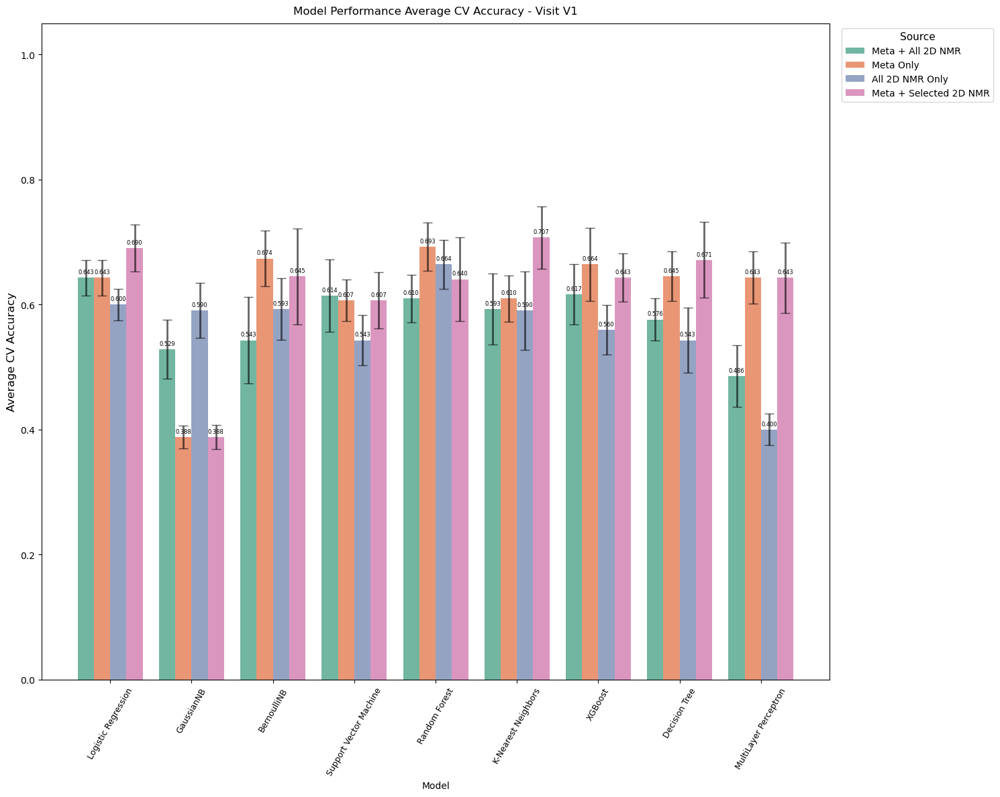

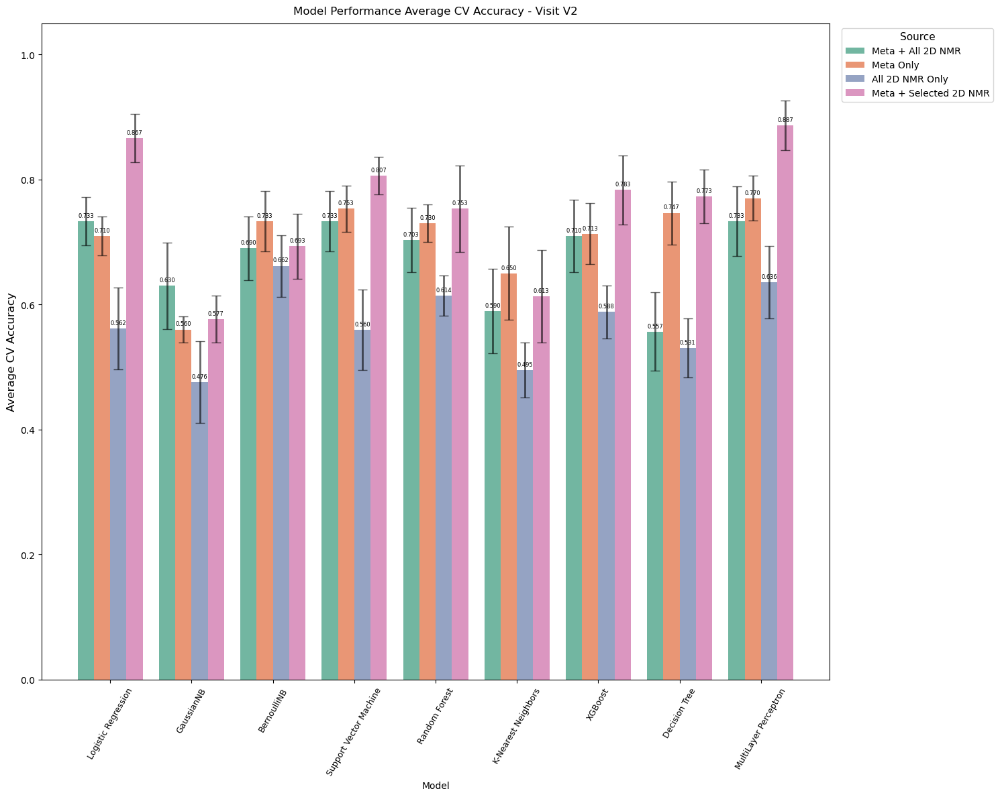

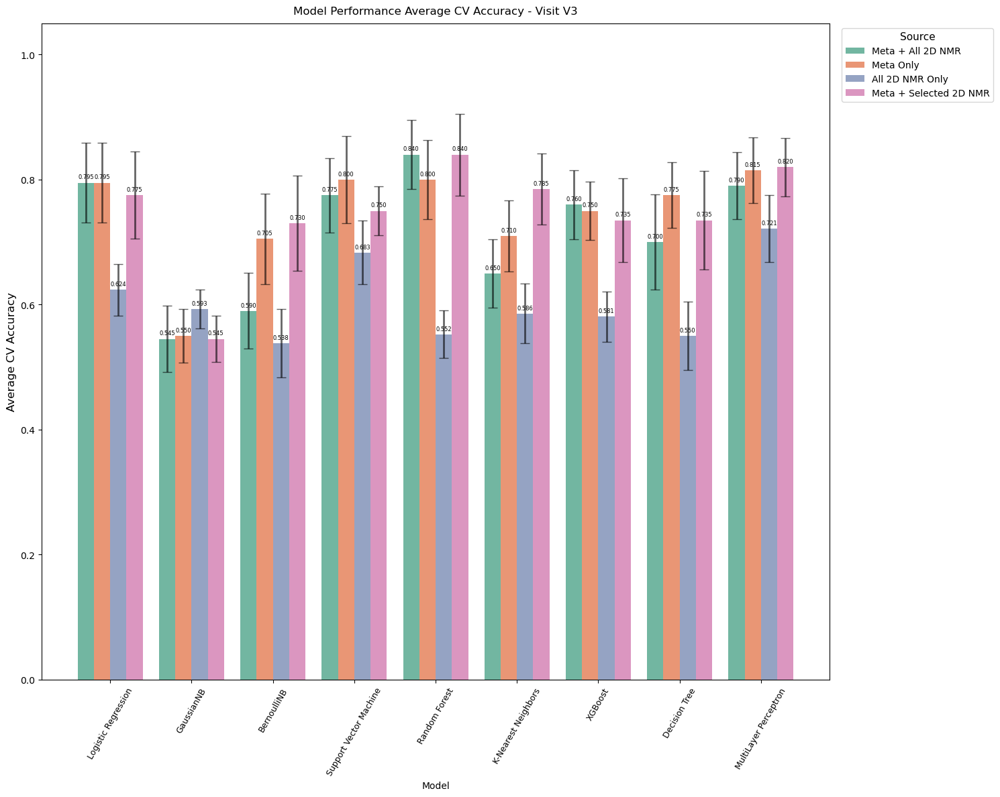

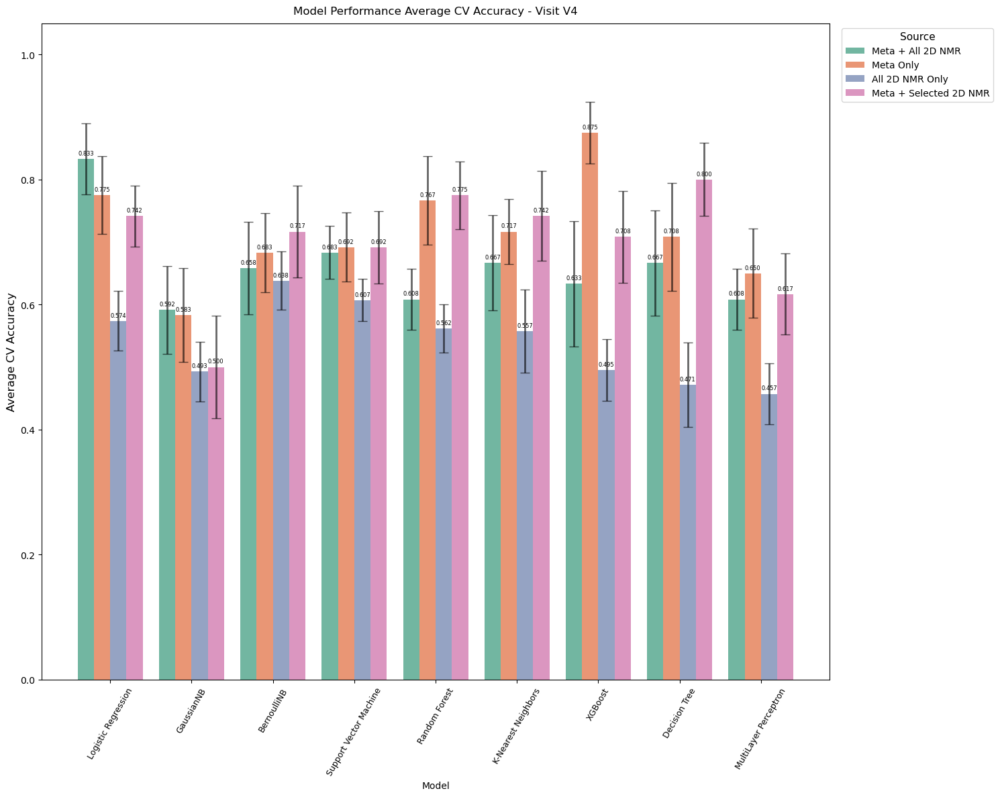

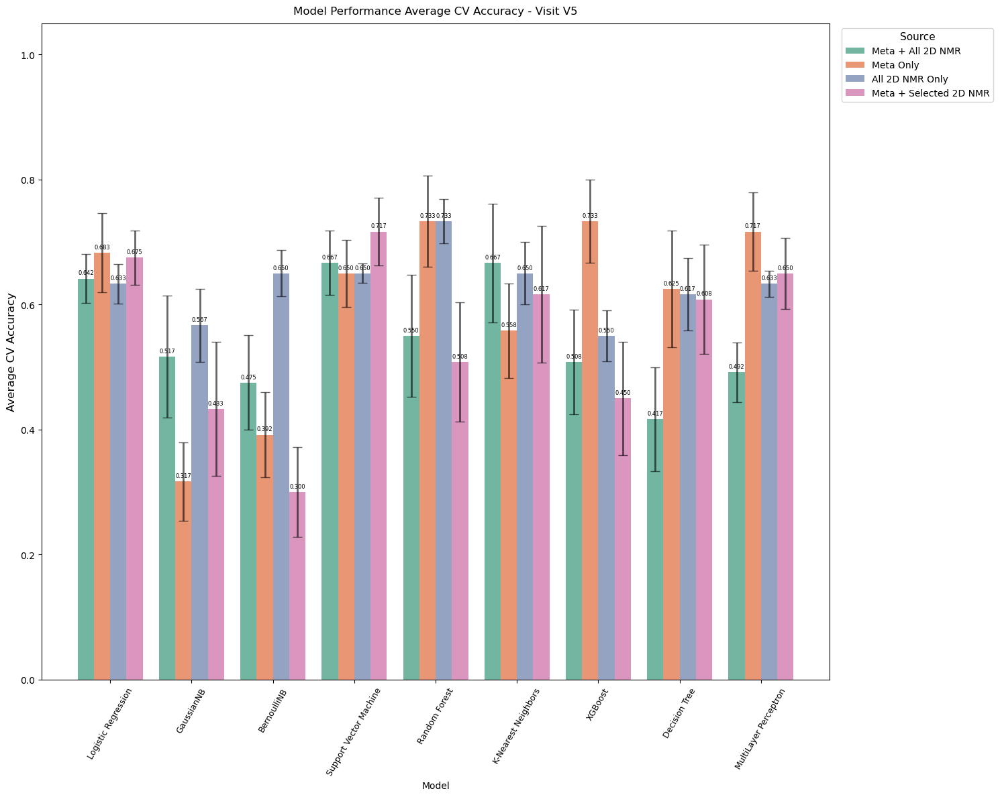

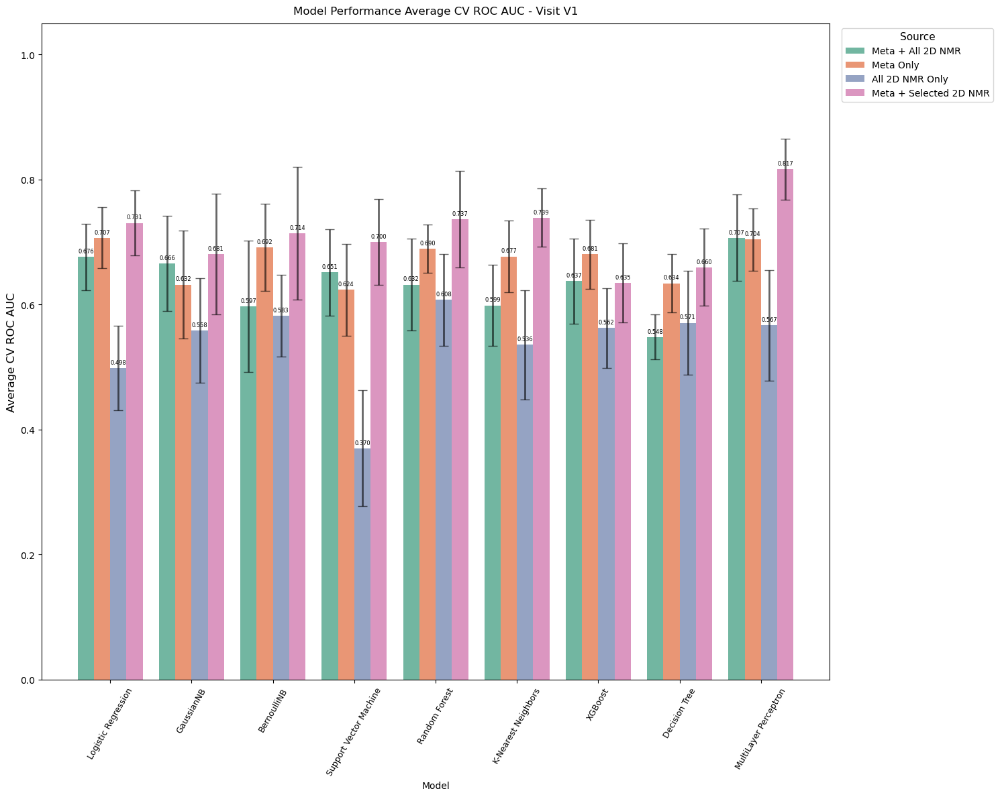

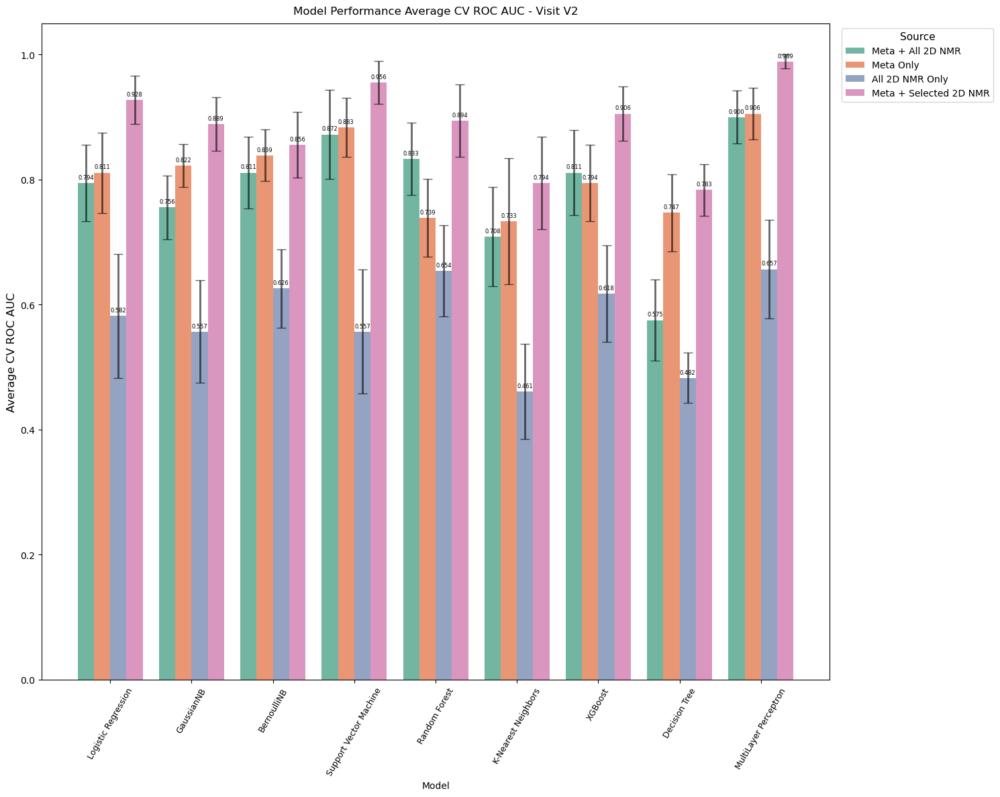

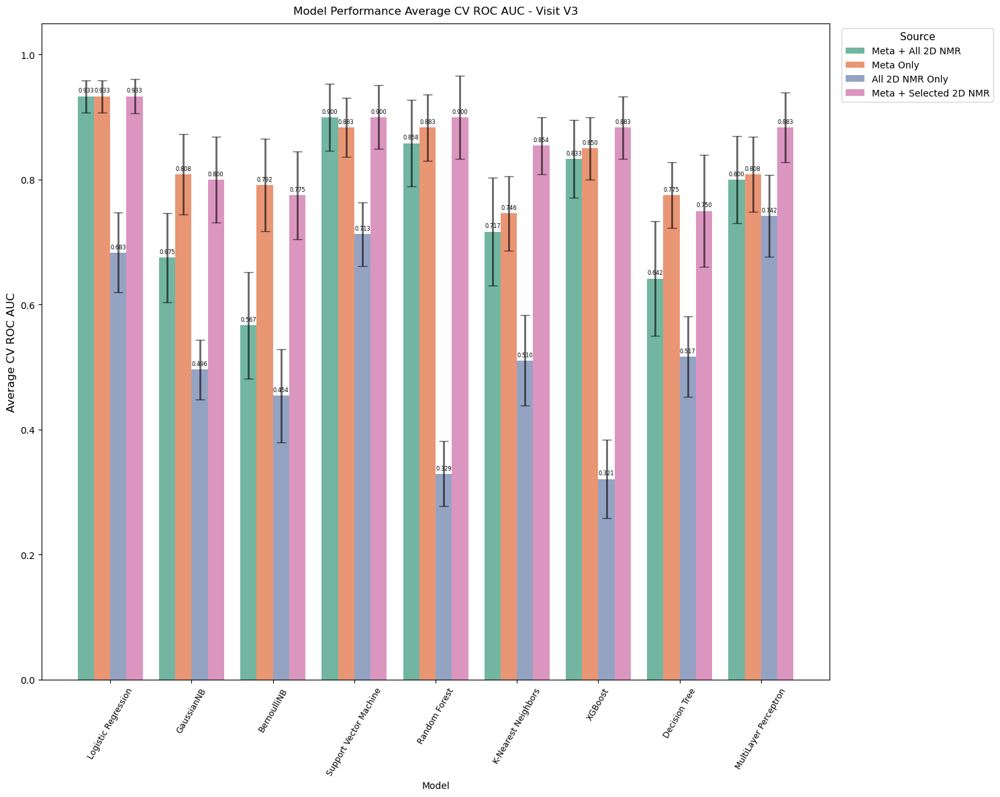

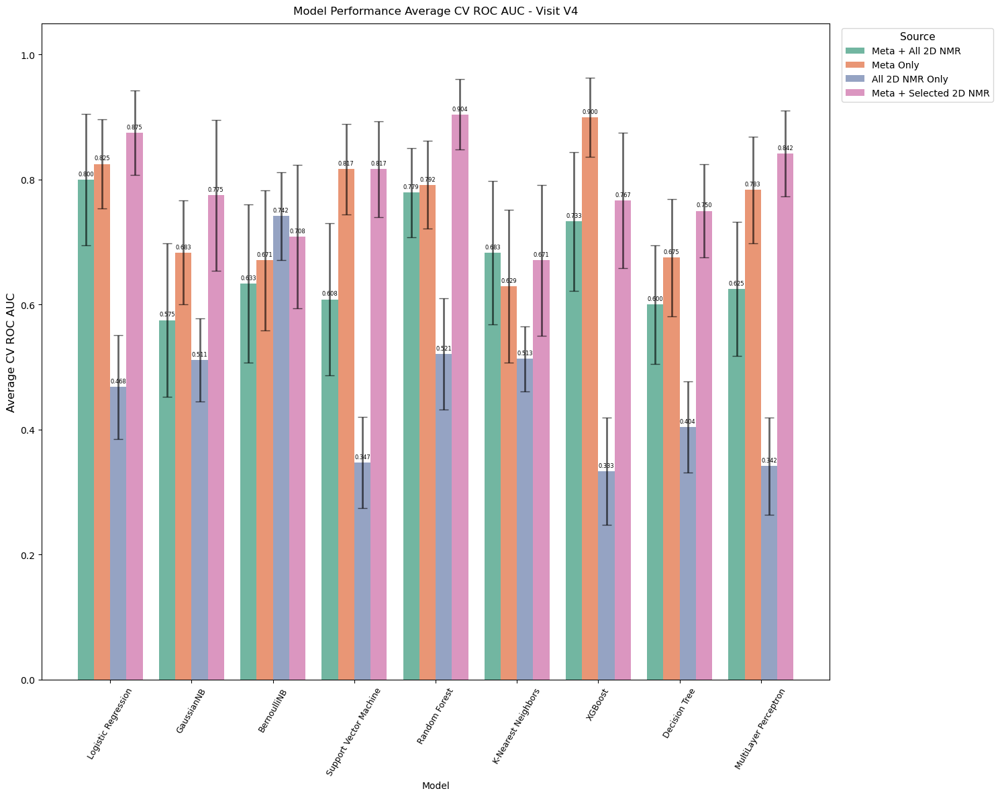

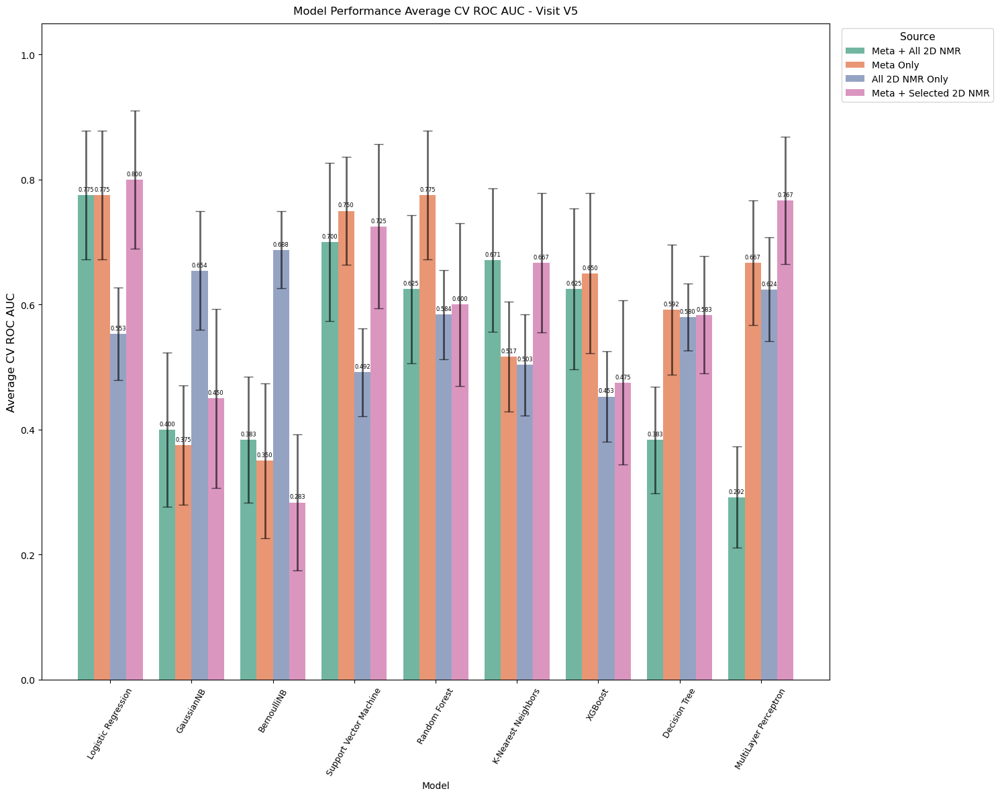

In [38]:
plot_model_per_visit(df_all, metric='Average CV Accuracy')
plot_model_per_visit(df_all, metric='Average CV ROC AUC')

In [39]:
def plot_model_comparison_per_model(df_all, metrics='Average CV Accuracy', error='SE CV Accuracy'):
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns
    import pandas as pd
    
    df_all = df_all.copy()
    df_all['Model'] = df_all['Model'].str.strip()
    models = sorted(df_all['Model'].unique())
    visits = sorted(df_all['Visit'].unique())
    metrics = metrics.strip()
    error = error.strip() if error else None
    palette = sns.color_palette("Set2")

    # Determine subplot grid size
    n_models = len(models)
    ncols = 3
    nrows = int(np.ceil(n_models / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(7 * ncols, 7 * nrows), sharey=True)
    axes = axes.flatten()

    legend_handles = None  # collect legend handles from the first plot

    for i, model in enumerate(models):
        ax = axes[i]
        data = df_all[df_all['Model'] == model]

        bar_plot = sns.barplot(
            data=data, x='Visit', y=metrics, hue='Source', ax=ax,
            palette=palette[:4], errorbar=None
        )
        ax.set_title(model)

        # Save legend handles from the first plot only
        if legend_handles is None:
            legend_handles, legend_labels = ax.get_legend_handles_labels()

        # Remove legends from individual subplots
        ax.get_legend().remove()

        if i % ncols == 0:
            ax.set_ylabel(metrics)
        else:
            ax.set_ylabel("")
        if i >= (nrows - 1) * ncols:
            ax.set_xlabel('Visit')
        else:
            ax.set_xlabel("")
        ax.set_xticks(range(len(visits)))
        ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

        # Add error bars using direct data mapping
        # Sort data to match bar order: by Visit and Source (same as barplot)
        data_sorted = data.sort_values(['Visit', 'Source'])
        data_sorted = data_sorted.reset_index(drop=True)
        
        # Add error bars to each bar
        for j, bar in enumerate(ax.patches):
            if j < len(data_sorted):
                err_val = data_sorted.loc[j, error]
                if pd.notna(err_val) and err_val > 0:
                    # Calculate position for error bar
                    x = bar.get_x() + bar.get_width() / 2
                    height = bar.get_height()
                    
                    # Add error bar
                    ax.errorbar(
                        x, height, yerr=err_val,
                        fmt='none', color='black', capsize=5, 
                        elinewidth=1.5, alpha=0.8
                    )
        
        # Add value labels
        for container in ax.containers:
            if isinstance(container, BarContainer):
                labels = [f'{val:.3f}' for val in container.datavalues]
                ax.bar_label(container, labels=labels, label_type='edge', fontsize=6, padding=3)

    # Hide unused subplots
    for j in range(len(models), len(axes)):
        axes[j].set_visible(False)

    # Add global legend to the right of the whole figure
    if legend_handles is not None:
        fig.legend(legend_handles, legend_labels, loc='upper right', 
                  bbox_to_anchor=(1.02, 1), fontsize=12, title='Source')

    plt.suptitle(f'Model Comparison Across Visits: {metrics}', fontsize=18)
    plt.tight_layout(rect=[0, 0, 0.90, 0.96])  # Adjust layout to make space for the legend
    plt.savefig(f"../result/figure/model_comparison_{metrics.lower().replace(' ', '_')}.png", dpi=300, bbox_inches='tight')
    plt.show()

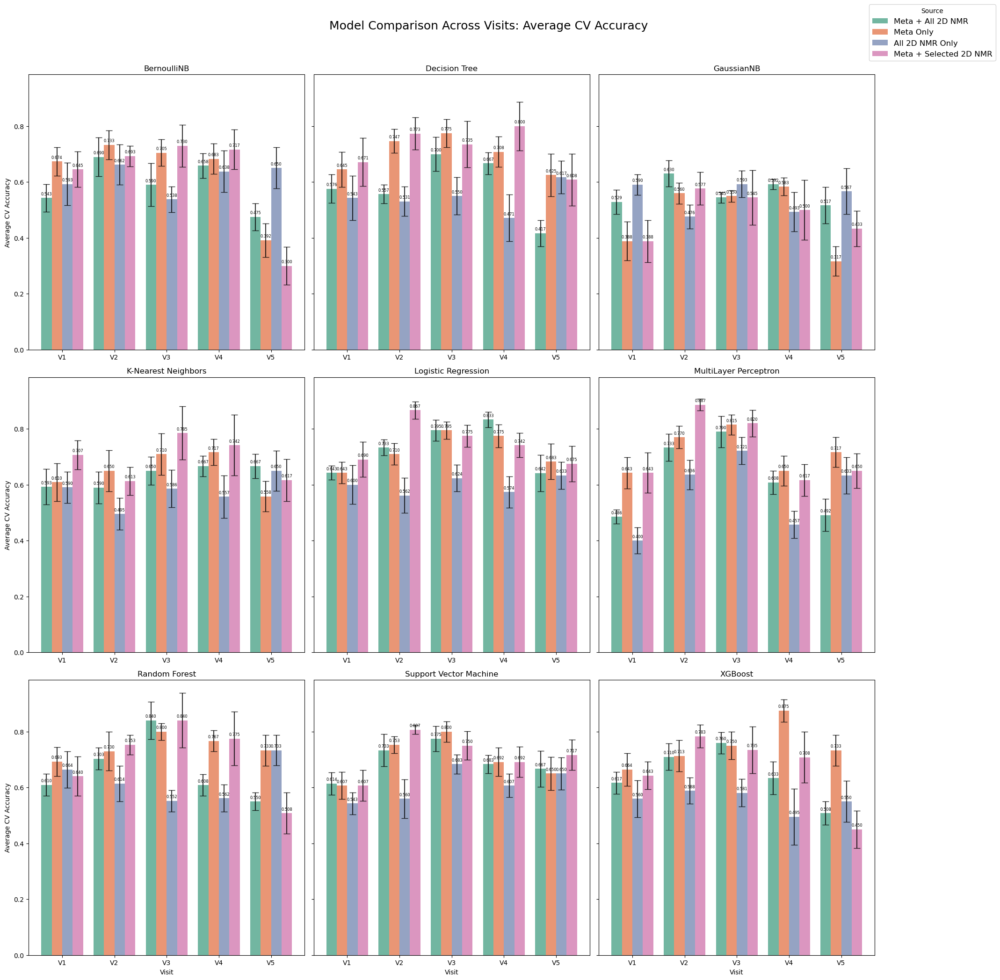

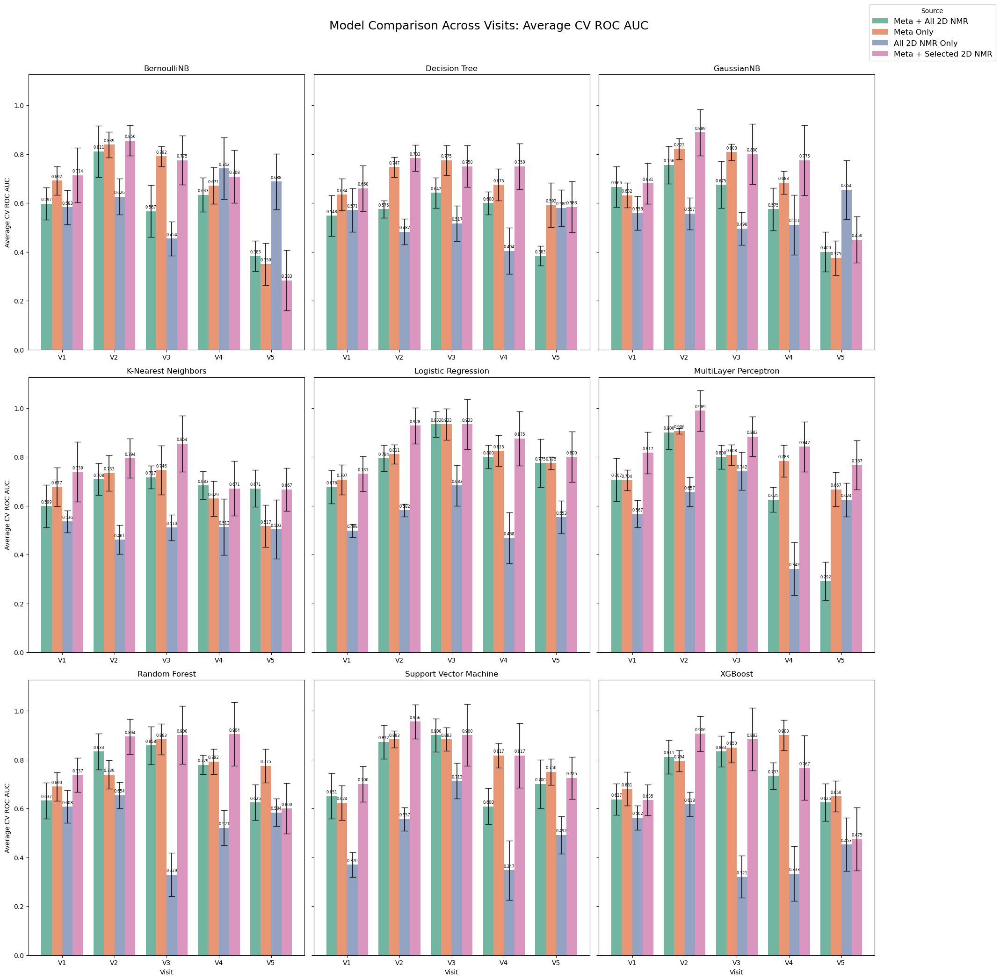

In [40]:
plot_model_comparison_per_model(df_all, metrics='Average CV Accuracy', error = 'SE CV Accuracy')
plot_model_comparison_per_model(df_all, metrics='Average CV ROC AUC', error='SE CV ROC AUC')

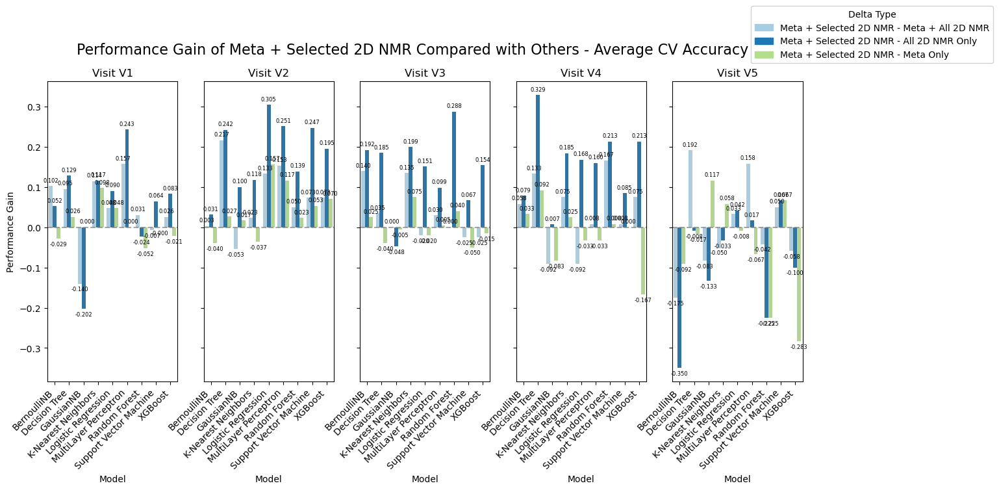

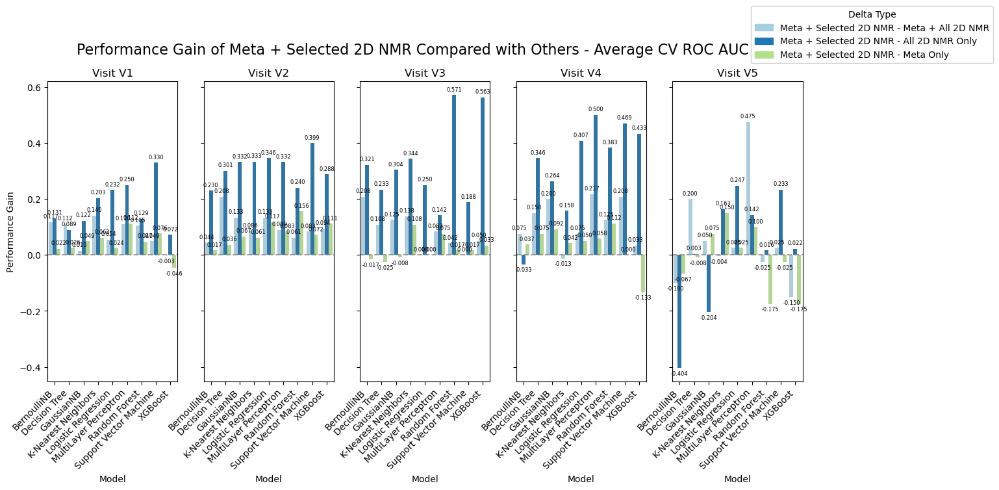

In [41]:
# Delta Bar plot for each model across visits
def plot_model_delta(df, metrics = 'Average CV Accuracy'):
    delta_df = df.pivot_table(index=["Visit", "Model"], columns="Source", values=metrics).reset_index()
    delta_df["Meta + Selected 2D NMR - Meta + All 2D NMR"] = delta_df["Meta + Selected 2D NMR"] - delta_df["Meta + All 2D NMR"]
    delta_df["Meta + Selected 2D NMR - All 2D NMR Only"] = delta_df["Meta + Selected 2D NMR"] - delta_df["All 2D NMR Only"]
    delta_df["Meta + Selected 2D NMR - Meta Only"] = delta_df["Meta + Selected 2D NMR"] - delta_df["Meta Only"]
    delta_long = pd.melt(
        delta_df,
        id_vars=["Visit", "Model"],
        value_vars=["Meta + Selected 2D NMR - Meta + All 2D NMR", "Meta + Selected 2D NMR - All 2D NMR Only", "Meta + Selected 2D NMR - Meta Only"],
        var_name="Delta Type",
        value_name="Delta"
    )
    visits = sorted(delta_long['Visit'].unique())
    delta_types = delta_long['Delta Type'].unique()
    color_map = {dt: palette[i] for i, dt in enumerate(delta_types)}

    n_visits = len(visits)
    fig, axes = plt.subplots(1, n_visits, figsize=(15,6), sharey=True)
    for i, visit in enumerate(visits):
        ax = axes[i]
        visit_data = delta_long[delta_long['Visit'] == visit]
        
        sns.barplot(
            data=visit_data, 
            x="Model", 
            y="Delta", 
            hue="Delta Type", 
            hue_order=delta_types,
            palette=[color_map[dt] for dt in delta_types],
            errorbar=None,
            ax=ax
        )
        
        ax.set_title(f'Visit {visit}')
        ax.set_xlabel('Model')
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
        ax.set_ylabel("Performance Gain" if i == 0 else "")
        ax.axhline(0, color='gray', linestyle='--', alpha=0.7)
        
        for container in ax.containers:
            ax.bar_label(container, fmt='%.3f', padding=3, fontsize=6)

        if ax.get_legend() is not None:
            ax.get_legend().remove()
    legend_elements = [
        plt.Rectangle((0,0), 1, 1, color=color_map[dt], label=dt) 
        for dt in delta_types
    ]
    
    fig.legend(
        handles=legend_elements, 
        loc='center right', 
        bbox_to_anchor=(1.1, 1.0), 
        title="Delta Type",
        frameon=True,
        framealpha=0.9
    )

    plt.suptitle(f'Performance Gain of Meta + Selected 2D NMR Compared with Others - {metrics}', fontsize=16)
    plt.savefig(f"../result/figure/model_delta_{metrics.lower().replace(' ', '_')}.png", dpi=300, bbox_inches='tight')  
    plt.show()
plot_model_delta(df_all, metrics='Average CV Accuracy')
plot_model_delta(df_all, metrics='Average CV ROC AUC')

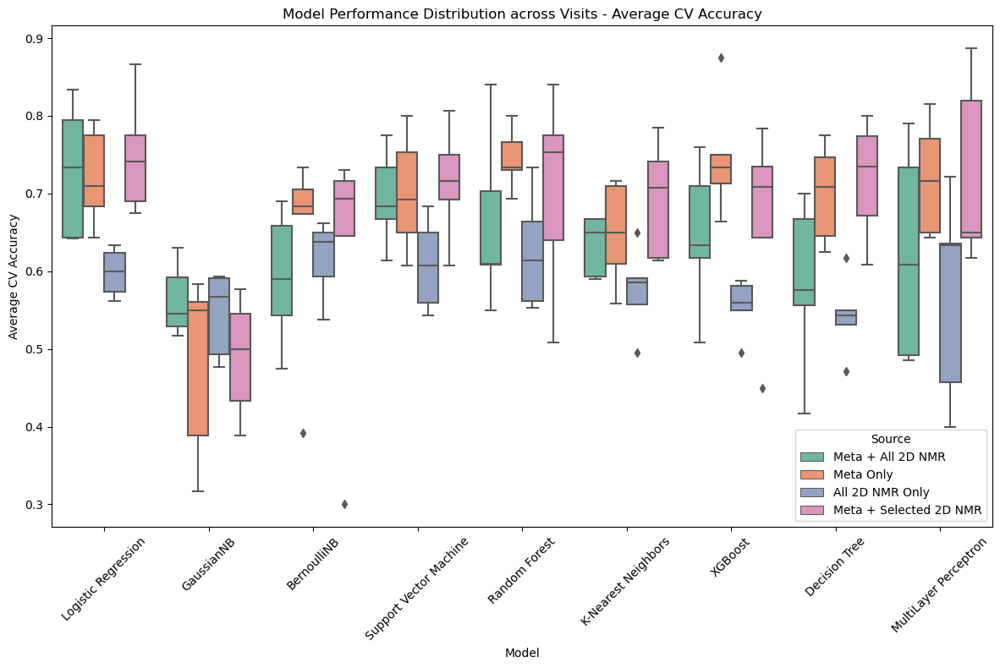

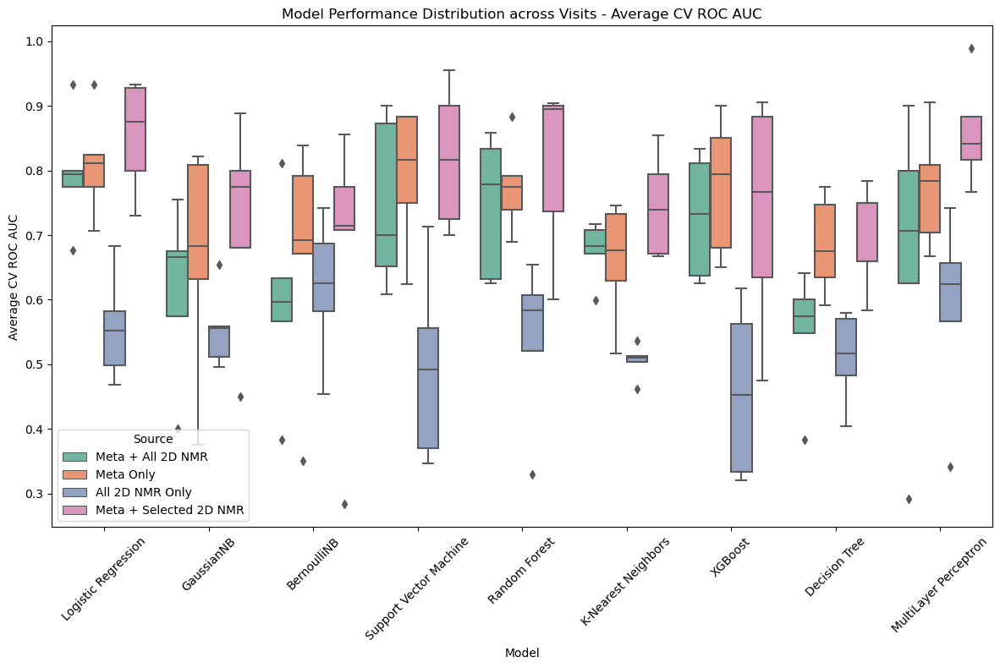

In [42]:
# Box plot for each model across visits
def plot_model_distribution(df, metrics='Average CV Accuracy'):
    plt.figure(figsize=(12, 8))
    palette = sns.color_palette("Set2", n_colors=4)
    sns.boxplot(data=df, x='Model', y=metrics, hue='Source', palette=palette[:4])
    plt.title(f'Model Performance Distribution across Visits - {metrics}')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig(f"../result/figure/model_distribution_{metrics.lower().replace(' ', '_')}.png", dpi=300, bbox_inches='tight')
    plt.show()
plot_model_distribution(df_all, metrics= 'Average CV Accuracy')
plot_model_distribution(df_all, metrics= 'Average CV ROC AUC')

Easily compare the median accuracy for each model and source by looking at the line inside the box. 

In [43]:
def plot_model_heatmap(df, metrics='Average CV Accuracy'):
    # Get unique sources and visits
    sources = df['Source'].unique()
    visits = sorted(df['Visit'].unique())
    
    # Create subplots
    n_sources = len(sources)
    fig, axes = plt.subplots(1, n_sources, figsize=(5*n_sources, 6), sharey=True)
    if n_sources == 1:
        axes = [axes]  # Make it iterable if single subplot
    
    # Get global min/max for consistent coloring
    vmin = df[metrics].min()
    vmax = df[metrics].max()
    
    for i, source in enumerate(sources):
        ax = axes[i]
        source_data = df[df['Source'] == source]
        
        # Special handling for 'Meta + NMR Selected'
        if source == 'Meta + NMR Selected':
            # For each model and visit, take the best result across feature sets
            best_per_model = source_data.groupby(['Model', 'Visit'])[metrics].max().reset_index()
            
            pivot = best_per_model.pivot(index='Model', columns='Visit', values=metrics)
            
            pivot = pivot.reindex(index=sorted(source_data['Model'].unique()), 
                                 columns=visits)
            
            # Create heatmap
            if not pivot.empty:
                sns.heatmap(pivot, annot=True, cmap="YlGnBu", fmt=".2f", 
                            ax=ax, vmin=vmin, vmax=vmax, cbar=False)
                ax.set_title(f"{source}\n(Best per Model per Visit)")
            else:
                ax.set_title(f"{source}\n(No Data)")
                ax.set_xticks([])
                ax.set_yticks([])
        else:
            # Regular handling for other sources
            pivot = source_data.pivot_table(
                index='Model',
                columns='Visit',
                values=metrics,
                aggfunc='mean'  # Average across feature sets
            )
            
            # Reindex to include all visits and models
            pivot = pivot.reindex(index=sorted(source_data['Model'].unique()), 
                                 columns=visits)
            
            # Create heatmap
            if not pivot.empty:
                sns.heatmap(pivot, annot=True, cmap="YlGnBu", fmt=".2f", 
                            ax=ax, vmin=vmin, vmax=vmax, cbar=False)
                ax.set_title(f"{source}")
            else:
                ax.set_title(f"{source}\n(No Data)")
                ax.set_xticks([])
                ax.set_yticks([])
    
    # Add colorbar
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
    sm = plt.cm.ScalarMappable(cmap="YlGnBu", 
                               norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm._A = []
    fig.colorbar(sm, cax=cbar_ax)
    
    fig.suptitle(f'Heatmap of {metrics} per Model and Visit')
    plt.tight_layout(rect=[0, 0, 0.85, 0.95])
    plt.savefig(f"../result/figure/model_heatmap_{metrics.lower().replace(' ', '_')}.png", dpi=300, bbox_inches='tight')
    plt.show()

/var/folders/ff/tm9v3zh91jv9vg9vgbf1rhnr0000gn/T/ipykernel_88865/1836601461.py:71: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



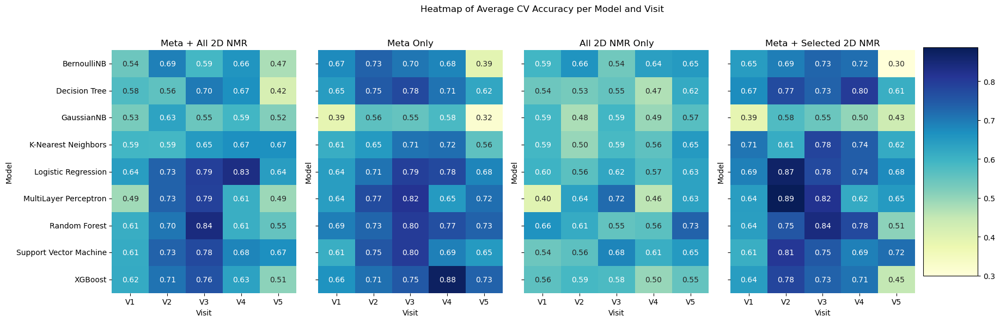

/var/folders/ff/tm9v3zh91jv9vg9vgbf1rhnr0000gn/T/ipykernel_88865/1836601461.py:71: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



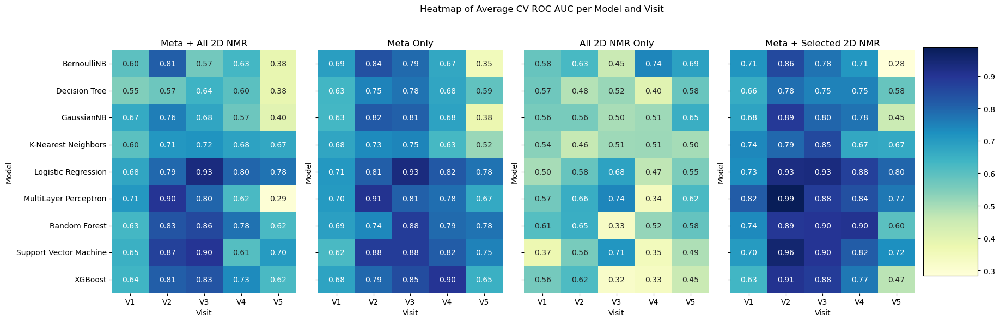

In [44]:
plot_model_heatmap(df_all, metrics='Average CV Accuracy')
plot_model_heatmap(df_all, metrics='Average CV ROC AUC')

## SHAP

In [18]:
import shap
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.neural_network import MLPClassifier
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [19]:
meta_cols = ['vig_activity', 'race_1', 'race_2', 'wt_gain','weight_change','age_delivery_range2','num_alc_weekly','caffeine','smoke_current','ppg_BMI', 'first_BMI']
non_feature_cols = ['pwr_current', 'participant_id', 'visit']

In [20]:
top_nmr_feature = pd.read_csv("../result/data/meta+nmr/selection/top_nmr_features_by_visit.csv")

In [21]:
visit_configs = {
    'V1':{'model': 'MultiLayer Perceptron', 'top_n': 20,'file':'DF1_filtered.csv'},
    'V2':{'model': 'MultiLayer Perceptron', 'top_n': 10,'file':'DF2_filtered.csv'},
    'V3':{'model': 'Logistic Regression', 'top_n': 5,'file':'DF3_filtered.csv'},
    'V4':{'model': 'Random Forest', 'top_n': 15,'file':'DF4_filtered.csv'},
    'V5':{'model': 'Logistic Regression', 'top_n': 8,'file':'DF5_filtered.csv'}
}
dfs_by_visit = {}
for visit in range(1,6):
    df_visit = pd.read_csv(f"../result/data/meta+nmr/{visit_configs[f'V{visit}']['file']}")
    dfs_by_visit[f'V{visit}'] = df_visit
    top_n = visit_configs[f'V{visit}']['top_n']
    file_path = visit_configs[f'V{visit}']['file']

    features = (top_nmr_feature[top_nmr_feature['Visit'] == f'V{visit}'].head(top_n)['Feature'].tolist())
    selected_cols = meta_cols + non_feature_cols + features
    
    df_selected = df_visit[selected_cols]
    
    dfs_by_visit[f'V{visit}'] = df_selected
    df_selected.to_csv(f"../result/data/meta+nmr/selection/df_{visit}_top_n.csv", index=False)

In [22]:
# For each visit, we will re-train a model using the selected features
def train_model_with_selected_features(df, visit,random_state=42):
    one_hot_cols = ['vig_activity']
    binary_cols = ['race_1', 'race_2']
    continuous_cols = ['wt_gain','weight_change','age_delivery_range2','num_alc_weekly']
    explicit_cols = ['caffeine','smoke_current','ppg_BMI', 'first_BMI']
    meta_cols = one_hot_cols + binary_cols + continuous_cols + explicit_cols
    non_feature_cols = ['participant_id', 'visit', 'pwr_current']
    other_cols = [col for col in df.columns if col not in meta_cols + non_feature_cols]
    explicit_categories = [sorted(set(df[col].dropna().unique())) for col in explicit_cols]

    X = df.drop(columns=['pwr_current','participant_id','visit'])
    y = df['pwr_current']

    preprocessor = ColumnTransformer(
        transformers=[
            ('cat', OneHotEncoder(drop='first', handle_unknown='ignore'), one_hot_cols),
            ('explicit', OneHotEncoder(categories=explicit_categories, handle_unknown='ignore'), explicit_cols),
            ('binary', 'passthrough', binary_cols),
            ('num', StandardScaler(), continuous_cols),
            ('other', 'passthrough', other_cols)
        ]
    )
    
    config = visit_configs[visit]
    model_name = config['model']
    top_n = config['top_n']
    model_class = {
        'Random Forest': RandomForestClassifier,
        'MultiLayer Perceptron': MLPClassifier,
        'Logistic Regression': LogisticRegression,
    }[model_name]

    model = model_class(random_state=random_state)
    pipeline = Pipeline([
        ('preprocessor', preprocessor),
        ('model', model)
    ])

    pipeline.fit(X, y)

    X_transformed = pipeline.named_steps['preprocessor'].transform(X)
    if model_name in ['Random Forest']:
        explainer = shap.TreeExplainer(model)
        shap_values = explainer(X_transformed)
        if len(shap_values) == 2:
            shap_values = shap_values[1]
    else:
        explainer = shap.Explainer(model.predict_proba, X_transformed)
        shap_values = explainer(X_transformed)
        if isinstance(shap_values, list) and len(shap_values) == 2:
            shap_values = shap_values[1]
        
    return pipeline, shap_values


In [23]:
def visualize_shap(pipeline, shap_values, df, visit_id, nsample_limit=100, max_display=20):
    # Extract features from the DataFrame
    X = df.drop(columns=["participant_id", "visit", "pwr_current"])
    X_transformed = pipeline.named_steps['preprocessor'].transform(X)
    feature_names = pipeline.named_steps['preprocessor'].get_feature_names_out()
    
    if isinstance(shap_values, list):
        # KernelExplainer output: list of arrays
        shap_values_sample = [sv[:nsample_limit] for sv in shap_values]
        X_sample = X_transformed[:nsample_limit]
    else:
        # TreeExplainer output: array
        shap_values_sample = shap_values[:nsample_limit]
        X_sample = X_transformed[:nsample_limit]

    # 1. summary_plot (bar)
    shap.summary_plot(
        shap_values_sample, 
        features=X_sample, 
        feature_names=feature_names, 
        plot_type="bar", 
        max_display=max_display, 
        show=False
    )
    plt.title(f"SHAP Summary (Bar) - {visit_id}")
    plt.tight_layout()
    plt.show()

    # 2. summary_plot (beeswarm)
    shap.summary_plot(
        shap_values_sample, 
        features=X_sample, 
        feature_names=feature_names, 
        show=False
    )
    plt.title(f"SHAP Beeswarm - {visit_id}")
    plt.tight_layout()
    plt.show()

    # 3. heatmap
    if not isinstance(shap_values, list):
        try:
            shap.plots.heatmap(
                shap.Explanation(
                    values=shap_values_sample,
                    data=X_sample,
                    feature_names=feature_names
                ), 
                max_display=max_display, 
                show=False
            )
            plt.title(f"SHAP Heatmap - {visit_id}")
            plt.tight_layout()
            plt.show()
        except Exception as e:
            print(f"[Skipped heatmap] {e}")

    # 4. decision_plot
    try:
        explainer = shap.Explainer(pipeline.named_steps['model'], X_sample)
        shap.decision_plot(
            explainer.expected_value, 
            shap_values_sample, 
            X_sample, 
            feature_names=feature_names, 
            show=False
        )
        plt.title(f"SHAP Decision Plot - {visit_id}")
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"[Skipped decision_plot] {e}")

In [24]:
df1 = pd.read_csv("../result/data/meta+nmr/selection/df_1_top_n.csv")
df2 = pd.read_csv("../result/data/meta+nmr/selection/df_2_top_n.csv")
df3 = pd.read_csv("../result/data/meta+nmr/selection/df_3_top_n.csv")
df4 = pd.read_csv("../result/data/meta+nmr/selection/df_4_top_n.csv")
df5 = pd.read_csv("../result/data/meta+nmr/selection/df_5_top_n.csv")

<Figure size 640x480 with 0 Axes>

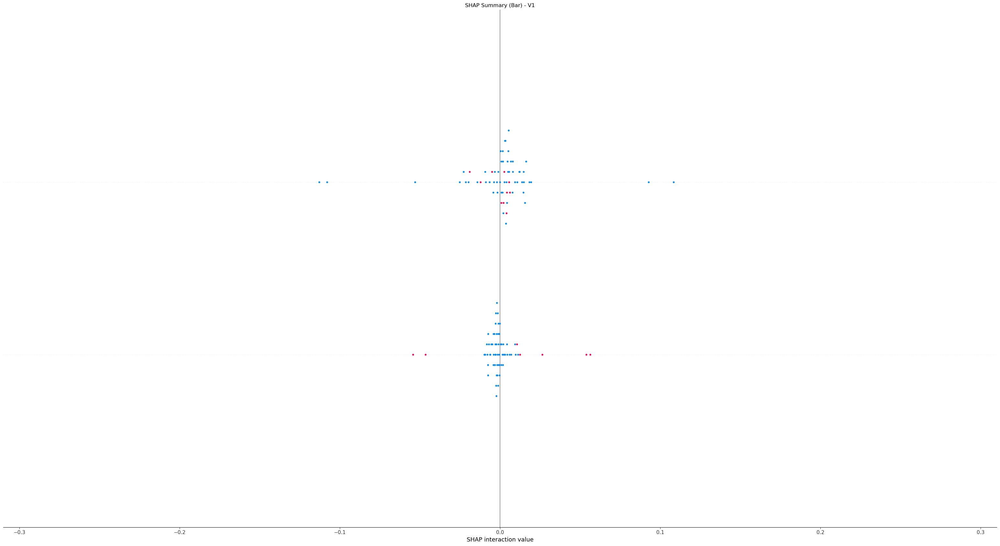

<Figure size 640x480 with 0 Axes>

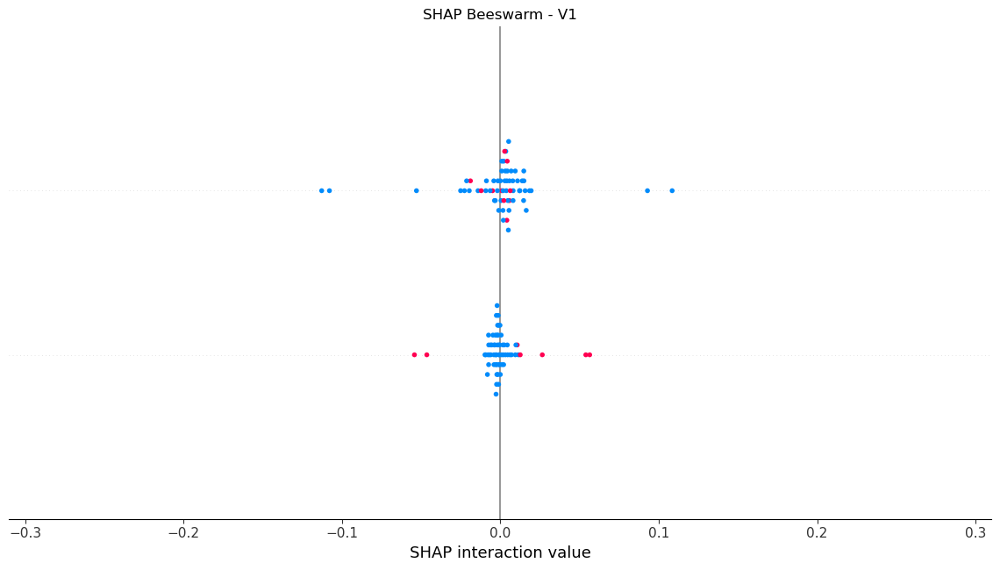

[Skipped heatmap] The hclust order only supports 2D arrays right now!
[Skipped decision_plot] The passed model is not callable and cannot be analyzed directly with the given masker! Model: MLPClassifier(random_state=42)


<Figure size 640x480 with 0 Axes>

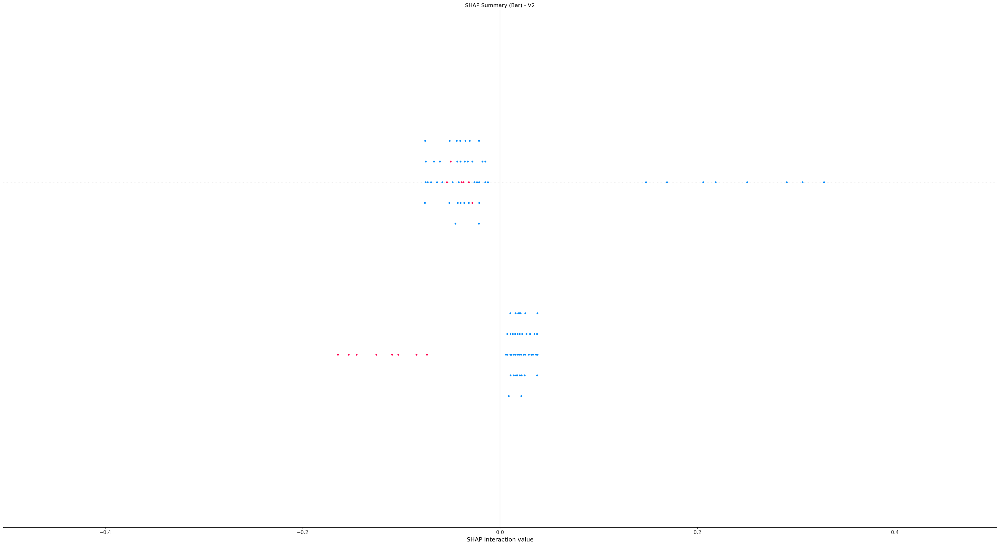

<Figure size 640x480 with 0 Axes>

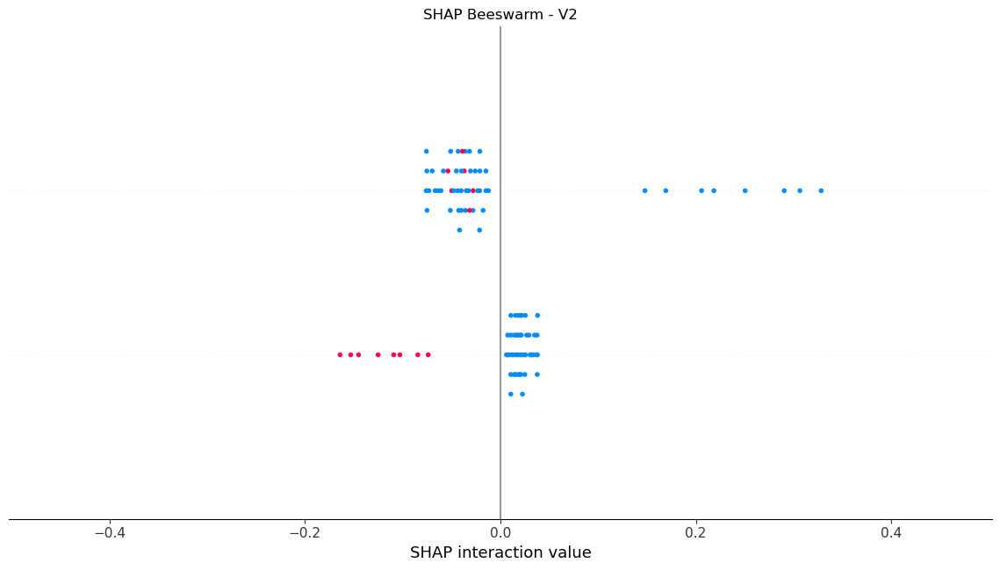

[Skipped heatmap] The hclust order only supports 2D arrays right now!
[Skipped decision_plot] The passed model is not callable and cannot be analyzed directly with the given masker! Model: MLPClassifier(random_state=42)


<Figure size 640x480 with 0 Axes>

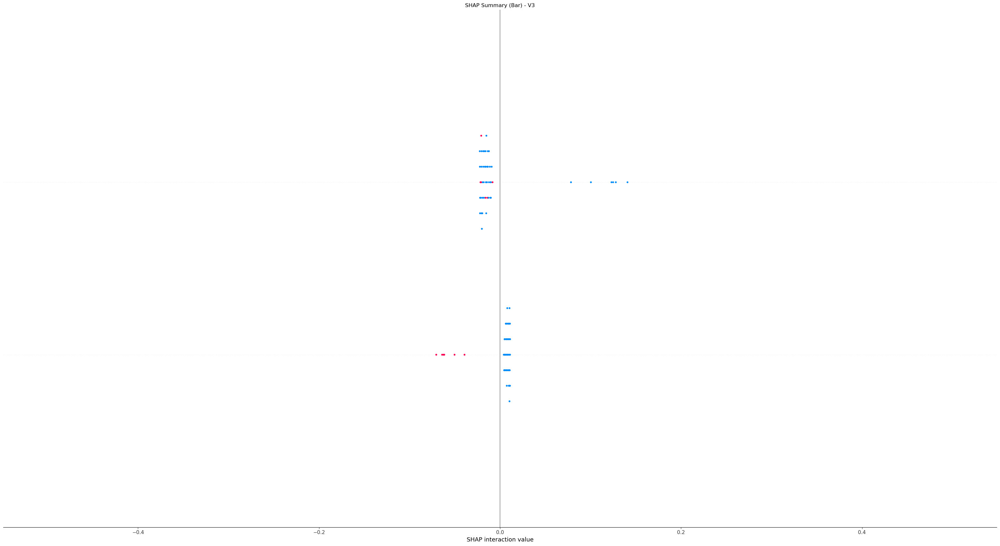

<Figure size 640x480 with 0 Axes>

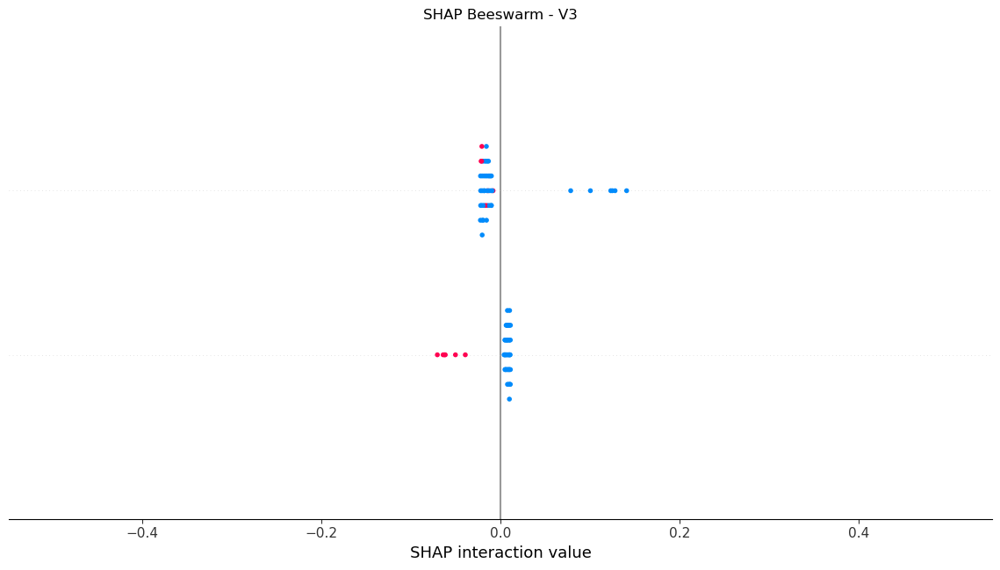

[Skipped heatmap] The hclust order only supports 2D arrays right now!
[Skipped decision_plot] The shap_values arg is the wrong type. Try explainer.shap_values().


<Figure size 640x480 with 0 Axes>

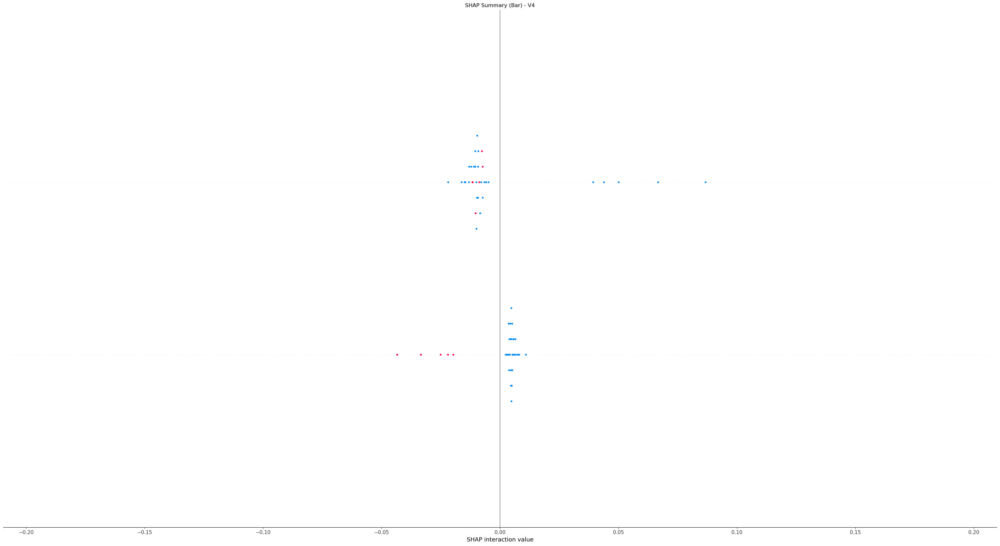

<Figure size 640x480 with 0 Axes>

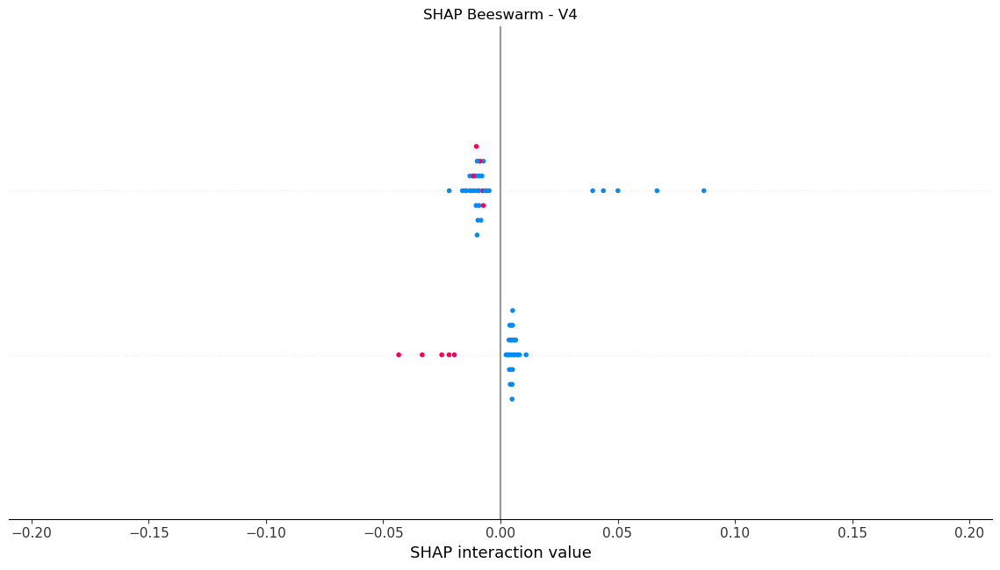

[Skipped heatmap] The hclust order only supports 2D arrays right now!
[Skipped decision_plot] The shap_values arg is the wrong type. Try explainer.shap_values().


<Figure size 640x480 with 0 Axes>

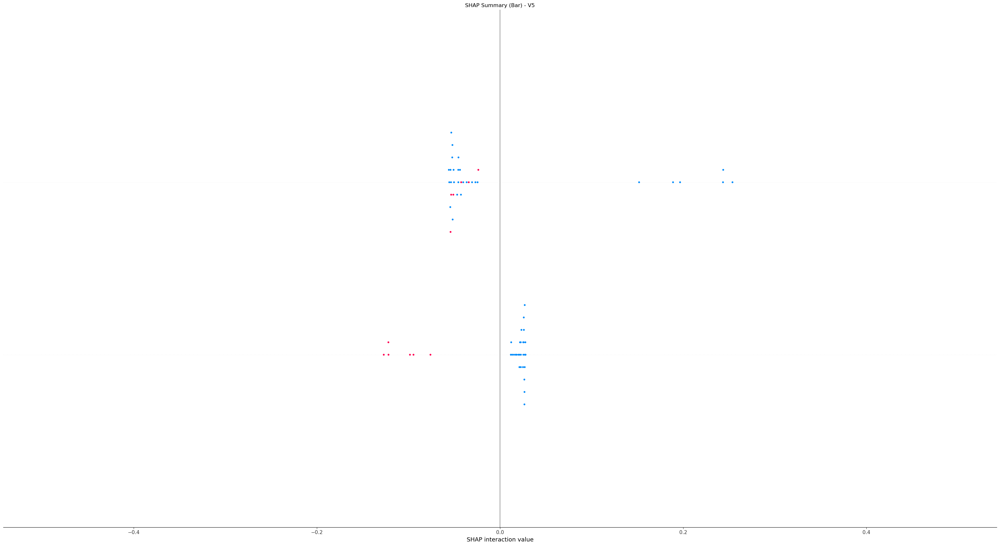

<Figure size 640x480 with 0 Axes>

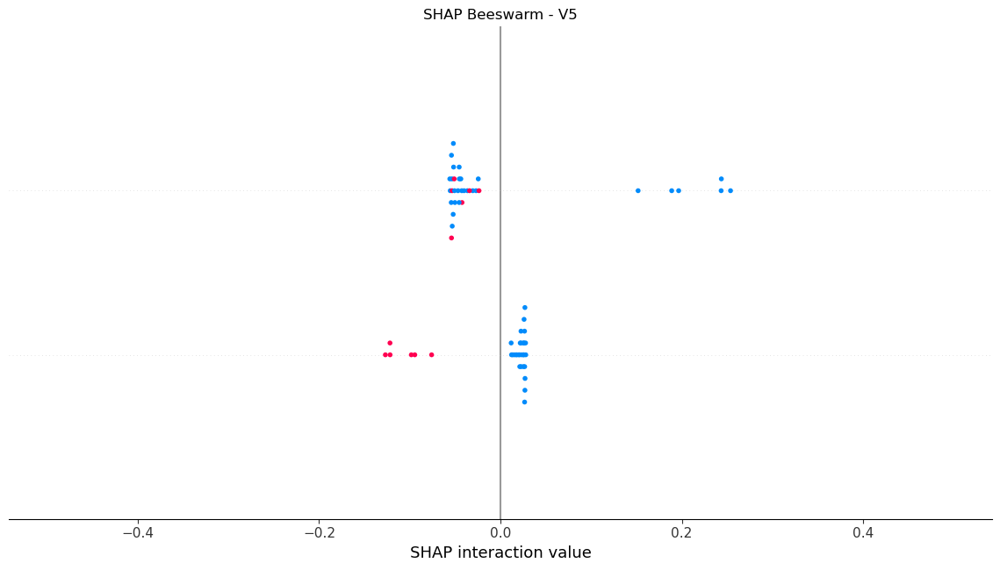

[Skipped heatmap] The hclust order only supports 2D arrays right now!
[Skipped decision_plot] The shap_values arg is the wrong type. Try explainer.shap_values().


In [25]:
for i, (df, visit) in enumerate(zip([df1, df2, df3, df4, df5], ["V1", "V2", "V3", "V4", "V5"])):
    model, shap_vals = train_model_with_selected_features(df, visit)
    visualize_shap(model, shap_vals, df, visit)

## Metabolites

In [3]:
from scipy.stats import ttest_ind
import warnings
warnings.filterwarnings("ignore")
import pandas as pd

def select_top_nmr_features(X,y, other_cols, top_n):
    p_values = {}
    for col in other_cols:
        group0 = X[y == 0][col]
        group1 = X[y == 1][col]
        try:
            t_stat, p = ttest_ind(group0, group1, equal_var=False)
        except Exception as e:
            print(f"Error calculating t-test for {col}: {e}")
            p = np.nan
        p_values[col] = p
    # Sort features by p-value
    sorted_features = sorted(p_values.items(), key=lambda x: x[1])

    # Select top_n features
    top_features = sorted_features[:top_n]
    top_df = pd.DataFrame(top_features, columns=['Feature', 'p_value'])
    return top_df

In [4]:
results_dict = {}
for visit in range(1,6):
    df = pd.read_csv(f"../result/data/meta+nmr/DF{visit}_filtered.csv")

    # Define columns
    one_hot_cols = ['vig_activity']
    binary_cols = ['race_1', 'race_2']
    continuous_cols = ['wt_gain','weight_change','age_delivery_range2','num_alc_weekly']
    explicit_cols = ['caffeine','smoke_current','ppg_BMI', 'first_BMI']
    meta_cols = one_hot_cols + binary_cols + continuous_cols + explicit_cols
    non_feature_cols = ['participant_id', 'visit', 'pwr_current']
    all_nmr_cols = [col for col in df.columns if col not in meta_cols + non_feature_cols]

    # Select top NMR features based on t-test p-values
    visit_dict = {
            'V1':20,
            'V2':10,
            'V3':5,
            'V4':15,
            'V5':8
        }
        # sorted by p value
    X_tmp = df.drop(columns=non_feature_cols)
    y_tmp = df['pwr_current']
    top_n_nmr = select_top_nmr_features(X_tmp, y_tmp, all_nmr_cols, visit_dict[f'V{visit}'])
    results_dict[f'V{visit}'] = top_n_nmr

combined_results = pd.concat(results_dict, names=['Visit'])
combined_results.to_csv("../result/data/meta+nmr/selection/top_nmr_features_by_visit.csv")

In [5]:
from collections import Counter
feature_sets = {visit: set(df['Feature']) for visit, df in results_dict.items()}
common_features = set.intersection(*feature_sets.values())
print(f"Features common across all visits: {common_features}")

all_selected = [f for feats in feature_sets.values() for f in feats]
feature_counts = Counter(all_selected)
multi_visit_features = [f for f, count in feature_counts.items() if count > 1]

print("\nFeatures appearing in multiple visits:", multi_visit_features)

multi_visit_features = list(set(multi_visit_features))  # ensure unique
visits = list(feature_sets.keys())

# Initialize presence DataFrame
presence_df = pd.DataFrame(0, index=multi_visit_features, columns=visits)

for visit, features in feature_sets.items():
    presence_df.loc[presence_df.index.isin(features), visit] = 1

print("\nPresence matrix for overlapping features:\n")
print(presence_df)

Features common across all visits: set()

Features appearing in multiple visits: ['3.22,3.18,56,57', '1.5,1.46,18,19', '2.14,2.1,29,30', '3.58,3.54,44,45', '2.1,2.06,31,32', '1.9,1.86,30,31', '1.46,1.42,24,25', '3.42,3.38,78,79']

Presence matrix for overlapping features:

                 V1  V2  V3  V4  V5
3.22,3.18,56,57   1   1   0   0   0
3.58,3.54,44,45   1   1   1   0   0
2.14,2.1,29,30    1   1   0   1   0
1.5,1.46,18,19    1   0   0   1   0
1.46,1.42,24,25   0   0   1   0   1
3.42,3.38,78,79   0   0   0   1   1
2.1,2.06,31,32    0   1   0   1   0
1.9,1.86,30,31    0   1   0   1   0


In [26]:
# Presence matrix based on metabolites
file_path = "../peaks/merged_features_metabolites_1d.csv"
df = pd.read_csv(file_path)

# Extract the first metabolite from the "Metabolite" column
df["Metabolite"] = df["Metabolites"].str.extract(r'^\s*([^\]]+\])')
df.to_csv("../peaks/merged_features_metabolites_1d_extracted.csv", index=False)
presence_matrix = pd.crosstab(df["Metabolite"], df["Visit"])

for v in ["V1", "V2", "V3", "V4", "V5"]:
    if v not in presence_matrix.columns:
        presence_matrix[v] = 0
# Reorder columns
presence_matrix = presence_matrix[["V1", "V2", "V3", "V4", "V5"]]

# Add a column for the total presence across visits
presence_matrix["Total"] = presence_matrix.sum(axis=1)

presence_matrix_sorted = presence_matrix.sort_values(
    by=["Total", "Metabolite"], ascending=[False, True]
)
presence_matrix_sorted.to_csv("../peaks/presence_matrix_sorted_1d.csv")

## 1D data

In [39]:
import pandas as pd
import numpy as np
# Load the data
meta_df = pd.read_excel("../Matthias Klein's files - GWG/OB70 SHIPP3 SELECTED_marked.xlsx")
nmr_data = pd.read_csv("../mrbin_result/1D data/75_19_2dregions_13/mrbin_2025-07-19_16-00-21bins.csv", index_col=0)

# drop pwr_any and pwr_first columns
meta_df = meta_df.dropna(subset = ['pwr_current'])
meta_df = meta_df.drop(columns = ['pwr_any','pwr_first','pp_weight_loss1','pp_weight_loss2','pp_weight_loss3'])

# Replace '.' and other known invalid placeholders with NaN
meta_df.replace(to_replace=['.', 'NA', ''], value=np.nan, inplace=True)
# Loop through each object column and convert it to numeric
for col in meta_df.select_dtypes(include=['object']).columns:
    meta_df[col] = pd.to_numeric(meta_df[col], errors='coerce')  
    print(f"Converted column: {col} → {meta_df[col].dtype}")

## Imputation for missing values of wt_gain
# Calulate only when both weight_change_v1 and wt_gain are not NaN

mask = meta_df['weight_change_v1'].notna() & meta_df['wt_gain'].notna()
print(f"Calculating delta for {mask.sum()} rows where both wt_gain and weight_change_v1 are not NaN")
delta = (meta_df.loc[mask, 'wt_gain'] - meta_df.loc[mask, 'weight_change_v1']).mean()

# Impute missing values in wt_gain
missing_mask = meta_df['wt_gain'].isna() & meta_df['weight_change_v1'].notna()
meta_df.loc[missing_mask, 'wt_gain'] = meta_df.loc[missing_mask, 'weight_change_v1'] + delta

# print how many rows were imputed
print(f"Filled {missing_mask.sum()} missing wt_gain values using estimated delta = {delta:.2f}")

# Define the prefixes and extract the relevant columns
prefixes = ['weight_change','caffeine','num_alc_weekly','smoke_current']
visit_labels = ['V1', 'V2', 'V3', 'V4', 'V5']

# Identify the columns that are not in the prefixes
meta_columns = [col for col in meta_df.columns if not any(col.endswith(f'_v{i}') for i in range(1, 6))]

# Dictionary to store visit-specific DataFrames
visit_dfs = {}

for v in range(1, 6):
    visit = f'V{v}'
    visit_columns = [f"{prefix}_v{v}" for prefix in prefixes]
    seleted_columns = meta_columns + visit_columns 

    # subset the DataFrame for the current visit
    visit_df = meta_df[seleted_columns].copy()
    rename_dict = {f"{prefix}_v{v}": prefix for prefix in prefixes}
    visit_df.rename(columns=rename_dict, inplace=True)
    visit_df['visit'] = visit
    visit_dfs[visit] = visit_df
# Load the NMR data
nmr_data['participant_id'] = nmr_data.index.str.extract(r'GWG-(\d+)', expand=False)
nmr_data['visit'] = nmr_data.index.str.extract(r'GWG-\d+-(V\d)', expand=False)
nmr_data = nmr_data.dropna(subset=['visit'])

# Merge the NMR data with the visit DataFrame
def get_visit_df(visit):
    nmr_visit_df = nmr_data[nmr_data['visit'] == visit].copy()
    meta_visit_df = visit_dfs[visit]
    nmr_visit_df['participant_id'] = nmr_visit_df['participant_id'].astype(str)
    meta_visit_df['participant_id'] = meta_visit_df['participant_id'].astype(str)
    merged = pd.merge(meta_visit_df, nmr_visit_df, on=['participant_id', 'visit'], how='inner')
    return merged

DF1 = get_visit_df('V1')
DF2 = get_visit_df('V2')
DF3 = get_visit_df('V3')
DF4 = get_visit_df('V4')
DF5 = get_visit_df('V5')

DF1.to_csv("../result/1D_data/DF1_filtered_1d.csv", index=False)
DF2.to_csv("../result/1D_data/DF2_filtered_1d.csv", index=False)
DF3.to_csv("../result/1D_data/DF3_filtered_1d.csv", index=False)
DF4.to_csv("../result/1D_data/DF4_filtered_1d.csv", index=False)
DF5.to_csv("../result/1D_data/DF5_filtered_1d.csv", index=False)

for visit in range(1,6):
    df = pd.read_csv(f"../result/1D_data/DF{visit}_filtered_1d.csv")
    df = df[df['weight_change'] > 0] # Filter out rows where weight_change is not greater than 0
    df.to_csv(f"../result/1D_data/DF{visit}_filtered_1d.csv", index=False)
    print(f"DF{visit} shape: {df.shape}")

Calculating delta for 68 rows where both wt_gain and weight_change_v1 are not NaN
Filled 3 missing wt_gain values using estimated delta = 9.56
DF1 shape: (64, 1160)
DF2 shape: (52, 1160)
DF3 shape: (48, 1160)
DF4 shape: (33, 1160)
DF5 shape: (34, 1160)


1D NMR Only

In [41]:
# Prepare the data
def prepare_data(df):
    X = df.drop(columns = ['pwr_current','ppg_BMI','first_BMI','wt_gain','age_delivery_range2',
                           'race_1', 'race_2', 'vig_activity','weight_change','caffeine',
                        	'num_alc_weekly','smoke_current','visit'])
    y = df['pwr_current']
    dataframe = pd.DataFrame(X, columns=X.columns)
    return dataframe, y

for visit in range(1,6):
    df = pd.read_csv(f"../result/1D_data/DF{visit}_filtered_1d.csv")
    X, y = prepare_data(df)
    df_combined = X.copy()
    df_combined['pwr_current'] = y
    df_combined.to_csv(f"../result/1D_data/nmr_only/DF{visit}_nmr_only_1d.csv", index=False)

In [31]:
# Select the best model based on CV ROC AUC across all visits
all_visits_results = pd.read_csv("../result/1D_data/model_results_all_visits_selection_1d_leak.csv")
best_model_by_visit = all_visits_results.loc[all_visits_results.groupby('Visit')['CV ROC AUC'].idxmax()].reset_index(drop=True)
# Print results
print("Best model using Meta + Selected 1D NMR by visit based on CV ROC AUC:")
print(best_model_by_visit[['Visit', 'Model', 'CV ROC AUC','Top NMR Features', 'Std CV ROC AUC']])

# save the all model averages to a CSV file
#best_model_by_visit.to_csv("../result/1D_data/best_model_by_visit_selection_1d.csv", index=False)

Best model using Meta + Selected 1D NMR by visit based on CV ROC AUC:
  Visit                  Model  CV ROC AUC  Top NMR Features  Std CV ROC AUC
0    V1  MultiLayer Perceptron    0.783333                15        0.196222
1    V2  MultiLayer Perceptron    0.944444                15        0.074074
2    V3    Logistic Regression    0.933333                 5        0.086066
3    V4    Logistic Regression    0.925000                 5        0.168737
4    V5    Logistic Regression    0.775000                 5        0.299305


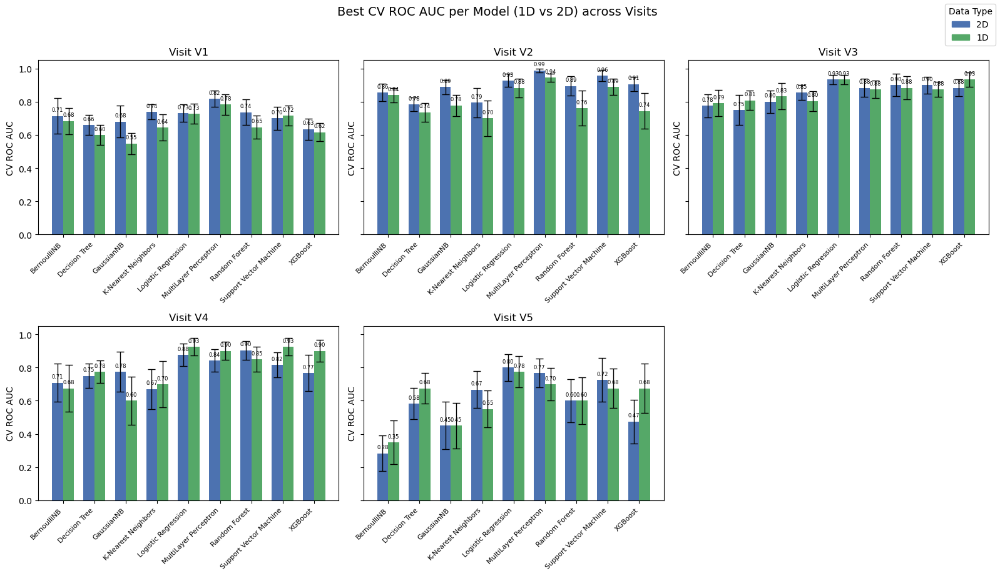

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ---------- 1. Load the files ----------
df_2d = pd.read_excel("../result/data/meta+nmr/selection/model_results_all_visits_selection_leak.xlsx")
df_1d = pd.read_csv("../result/1D_data/model_results_all_visits_selection_1d_leak.csv")

# ---------- 2. Get the best CV ROC AUC for each Visit-Model ----------
def pick_best(df, data_type):
    best = df.loc[df.groupby(["Visit", "Model"])["CV ROC AUC"].idxmax()].copy()
    best["Data Type"] = data_type
    # Fill NaN for missing columns
    if "SE CV ROC AUC" not in best.columns:
        best["SE CV ROC AUC"] = np.nan
    return best[["Visit", "Model", "CV ROC AUC", "SE CV ROC AUC", "Data Type"]]

best_all = pd.concat([
    pick_best(df_2d, "2D"),
    pick_best(df_1d, "1D")
], ignore_index=True)

# Sort the data
visit_order = ["V1", "V2", "V3", "V4", "V5"]
model_order = sorted(best_all["Model"].unique())
best_all["Visit"] = pd.Categorical(best_all["Visit"], categories=visit_order, ordered=True)
best_all["Model"] = pd.Categorical(best_all["Model"], categories=model_order, ordered=True)

# ---------- 3. Plotting ----------
fig, axes = plt.subplots(2, 3, figsize=(16, 9), sharey=True)
axes = axes.flatten()

bar_width = 0.35
colors = {"2D": "#4C72B0", "1D": "#55A868"}

for idx, visit in enumerate(visit_order):
    ax = axes[idx]
    sub = best_all[best_all["Visit"] == visit].sort_values("Model")
    for i, model in enumerate(model_order):
        for dtype, offset in zip(["2D", "1D"], [-bar_width/2, bar_width/2]):
            row = sub[(sub["Model"] == model) & (sub["Data Type"] == dtype)]
            if row.empty:
                continue
            auc = row["CV ROC AUC"].values[0]
            se  = row["SE CV ROC AUC"].values[0]
            xpos = i + offset
            ax.bar(xpos, auc, width=bar_width, color=colors[dtype],
                   label=dtype if i == 0 else "")
            if not np.isnan(se):
                ax.errorbar(xpos, auc, yerr=se, fmt='none',
                            ecolor='black', capsize=4, lw=1)
            ax.text(xpos, auc + 0.02, f"{auc:.2f}", 
                    ha='center', va='bottom', fontsize=6)
    ax.set_title(f"Visit {visit}")
    ax.set_xticks(np.arange(len(model_order)))
    ax.set_xticklabels(model_order, rotation=45, ha="right", fontsize=8)
    ax.set_ylim(0, 1.05)
    ax.set_ylabel("CV ROC AUC")

# Remove the 6th empty subplot
fig.delaxes(axes[-1])

# Legend
handles = [plt.Rectangle((0, 0), 1, 1, color=colors[d]) for d in colors]
labels  = list(colors.keys())
fig.legend(handles, labels, title="Data Type", loc="upper right")

fig.suptitle("Best CV ROC AUC per Model (1D vs 2D) across Visits",
             fontsize=14, y=1.02)
plt.tight_layout()
plt.savefig("../result/figure/best_model_comparison_1d_vs_2d.png", dpi=300, bbox_inches='tight')
plt.show()

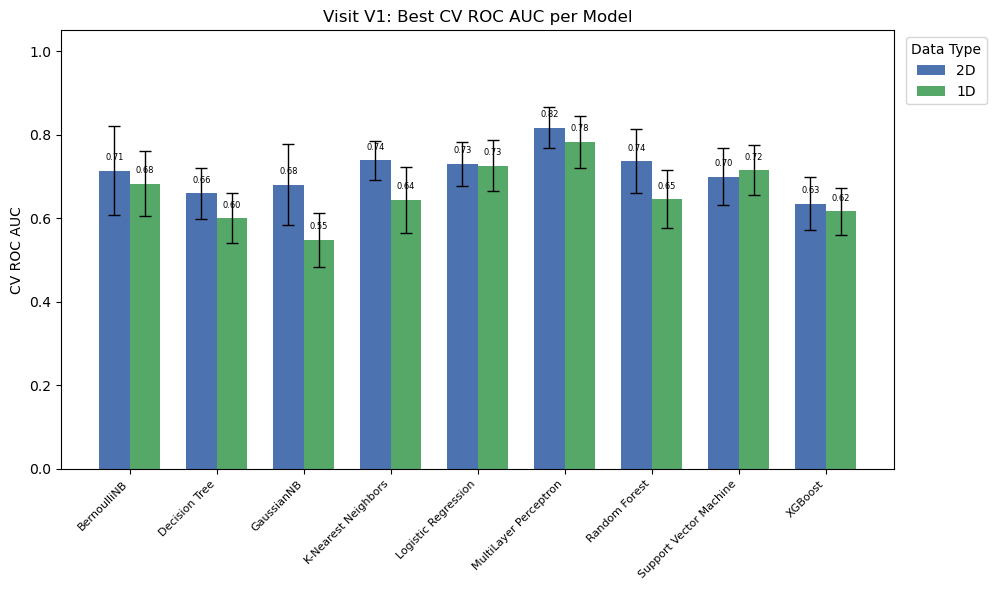

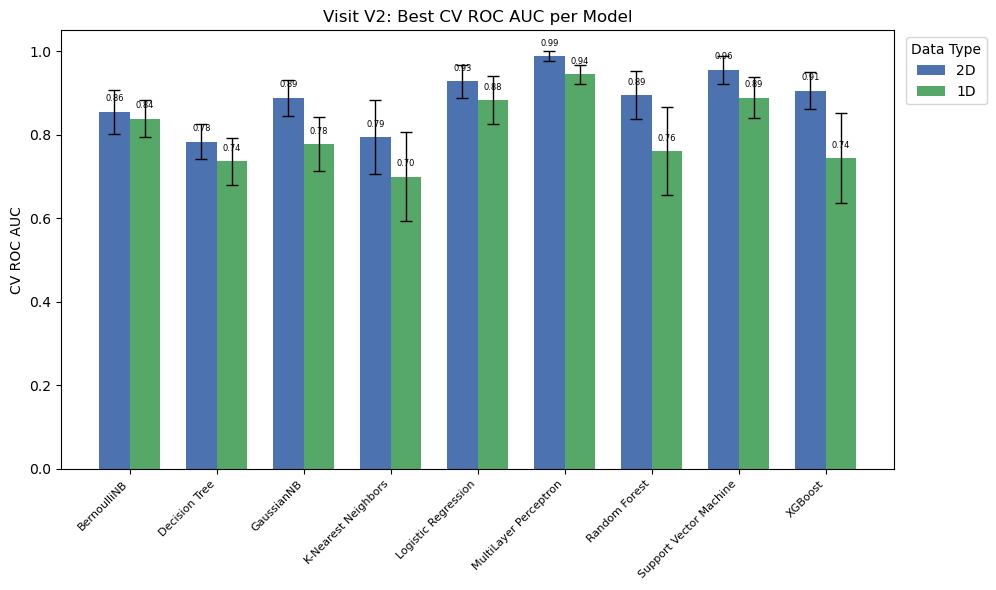

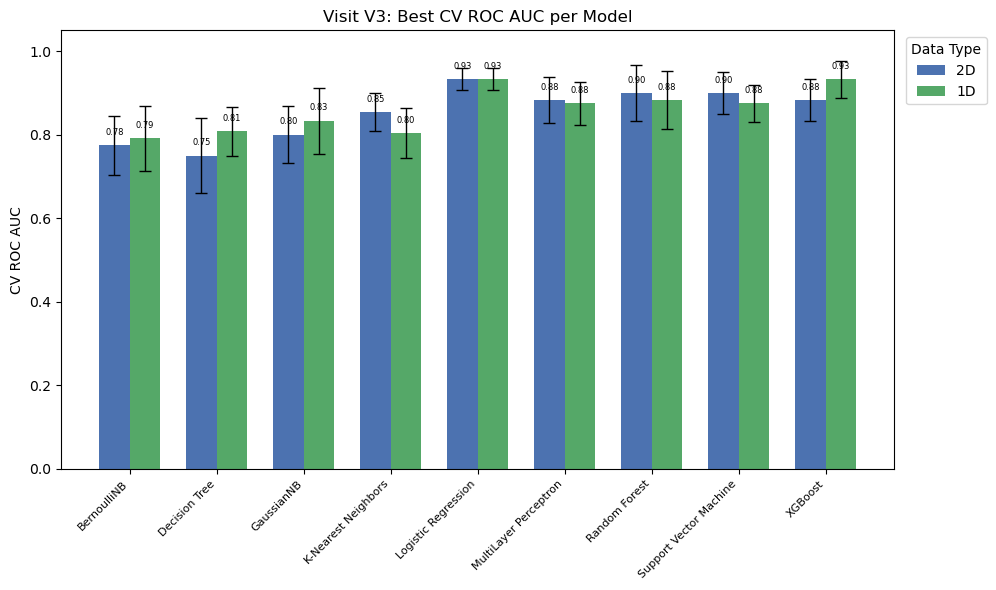

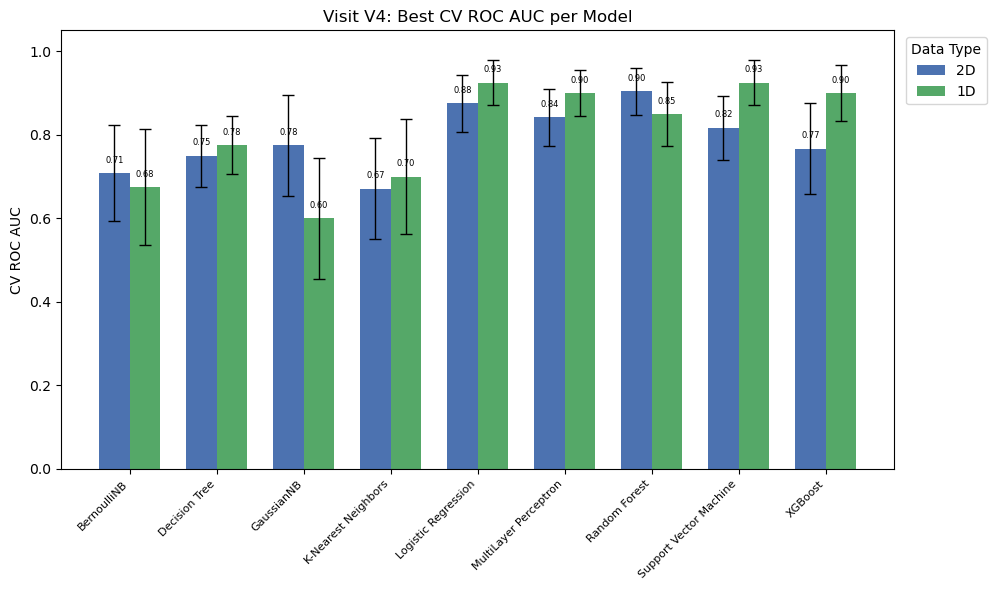

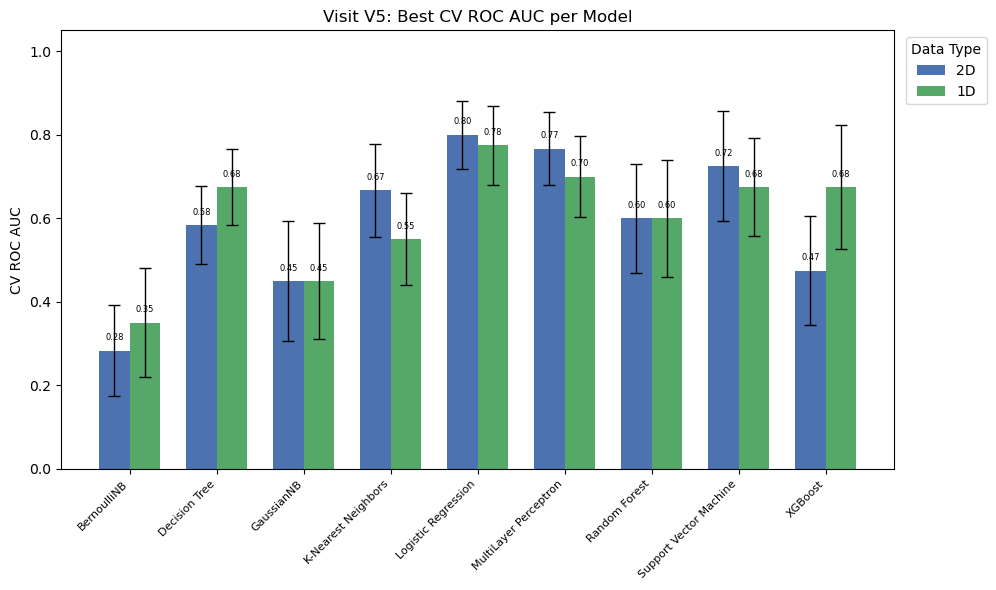

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ---------- 1. Load the two result files ----------
df_2d = pd.read_excel("../result/data/meta+nmr/selection/model_results_all_visits_selection_leak.xlsx")
df_1d = pd.read_csv("../result/1D_data/model_results_all_visits_selection_1d_leak.csv")

# ---------- 2. Keep the highest‑CV‑ROC‑AUC row for each Visit–Model ----------
def pick_best(df, data_type):
    best = df.loc[df.groupby(["Visit", "Model"])["CV ROC AUC"].idxmax()].copy()
    best["Data Type"] = data_type
    if "SE CV ROC AUC" not in best.columns:
        best["SE CV ROC AUC"] = np.nan
    return best[["Visit", "Model", "CV ROC AUC", "SE CV ROC AUC", "Data Type"]]

best_all = pd.concat(
    [pick_best(df_2d, "2D"),
     pick_best(df_1d, "1D")],
    ignore_index=True
)

# ---------- 3. Prepare plotting order ----------
visit_order = ["V1", "V2", "V3", "V4", "V5"]
model_order = sorted(best_all["Model"].unique())  # 9 models
best_all["Visit"] = pd.Categorical(best_all["Visit"],
                                   categories=visit_order,
                                   ordered=True)
best_all["Model"] = pd.Categorical(best_all["Model"],
                                   categories=model_order,
                                   ordered=True)

# ---------- 4. Plot five separate figures ----------
bar_width = 0.35
colors = {"2D": "#4C72B0", "1D": "#55A868"}

for visit in visit_order:
    sub = best_all[best_all["Visit"] == visit].sort_values("Model")
    if sub.empty:
        continue  # skip if visit has no data
    
    fig, ax = plt.subplots(figsize=(10, 6))
    
    for i, model in enumerate(model_order):
        # Two bars per model: 2D and 1D 
        for dtype, offset in zip(["2D", "1D"], [-bar_width/2, bar_width/2]):
            row = sub[(sub["Model"] == model) & (sub["Data Type"] == dtype)]
            if row.empty:
                continue
            auc = row["CV ROC AUC"].values[0]
            se  = row["SE CV ROC AUC"].values[0]
            xpos = i + offset
            ax.bar(xpos, auc, width=bar_width, color=colors[dtype], label=dtype if i == 0 else "")
            if not np.isnan(se):
                ax.errorbar(xpos, auc, yerr=se, fmt='none',
                            ecolor='black', capsize=4, lw=1)
            ax.text(xpos, auc + 0.02, f"{auc:.2f}", 
                    ha='center', va='bottom', fontsize=6)

    # Formatting
    ax.set_title(f"Visit {visit}: Best CV ROC AUC per Model")
    ax.set_xticks(np.arange(len(model_order)))
    ax.set_xticklabels(model_order, rotation=45, ha="right", fontsize=8)
    ax.set_ylim(0, 1.05)
    ax.set_ylabel("CV ROC AUC")
    ax.legend(title="Data Type", loc="upper right", bbox_to_anchor=(1.12, 1))
    plt.tight_layout()
    plt.savefig(f"../result/figure/best_model_comparison_{visit.lower()}_1d_vs_2d.png", dpi=300, bbox_inches='tight')
    plt.show()


In [29]:
results_dict = {}
for visit in range(1,6):
    df = pd.read_csv(f"../result/1D_data/DF{visit}_filtered_1d.csv")

    # Define columns
    one_hot_cols = ['vig_activity']
    binary_cols = ['race_1', 'race_2']
    continuous_cols = ['wt_gain','weight_change','age_delivery_range2','num_alc_weekly']
    explicit_cols = ['caffeine','smoke_current','ppg_BMI', 'first_BMI']
    meta_cols = one_hot_cols + binary_cols + continuous_cols + explicit_cols
    non_feature_cols = ['participant_id', 'visit', 'pwr_current']
    all_nmr_cols = [col for col in df.columns if col not in meta_cols + non_feature_cols]

    # Select top NMR features based on t-test p-values
    visit_dict = {
            'V1':15,
            'V2':15,
            'V3':5,
            'V4':5,
            'V5':5
        }
        # sorted by p value
    X_tmp = df.drop(columns=non_feature_cols)
    y_tmp = df['pwr_current']
    top_n_nmr = select_top_nmr_features(X_tmp, y_tmp, all_nmr_cols, visit_dict[f'V{visit}'])
    results_dict[f'V{visit}'] = top_n_nmr

combined_results = pd.concat(results_dict, names=['Visit'])
combined_results.to_csv("../result/1D_data/top_nmr_features_by_visit.csv")

In [30]:
from collections import Counter
feature_sets = {visit: set(df['Feature']) for visit, df in results_dict.items()}
common_features = set.intersection(*feature_sets.values())
print(f"Features common across all visits: {common_features}")

all_selected = [f for feats in feature_sets.values() for f in feats]
feature_counts = Counter(all_selected)
multi_visit_features = [f for f, count in feature_counts.items() if count > 1]

print("\nFeatures appearing in multiple visits:", multi_visit_features)

multi_visit_features = list(set(multi_visit_features))  # ensure unique
visits = list(feature_sets.keys())

# Initialize presence DataFrame
presence_df = pd.DataFrame(0, index=multi_visit_features, columns=visits)

for visit, features in feature_sets.items():
    presence_df.loc[presence_df.index.isin(features), visit] = 1

print("\nPresence matrix for overlapping features:\n")
print(presence_df)

Features common across all visits: set()

Features appearing in multiple visits: ['4.061,4.058', '3.281,3.278', '2.129,2.126']

Presence matrix for overlapping features:

             V1  V2  V3  V4  V5
2.129,2.126   0   1   1   0   0
4.061,4.058   0   1   1   0   0
3.281,3.278   0   1   1   0   0


# Peaks

In [ ]:
import pandas as pd
file_path = "../peaks/annotated_1d.csv"

with open(file_path, 'r') as file:
    lines = file.readlines()

processed_data = []

for line in lines:
    line = line.strip()
    if not line:
        continue
    parts = line.split(" ", 1)
    feature = parts[0]
    metabolites = parts[1] if len(parts) > 1 else ""
    processed_data.append([feature,metabolites])

# convert it into dataframe
df = pd.DataFrame(processed_data, columns=["Feature", "Metabolites"])
df_cleaned = df[df["Feature"] != "\"item\""].copy()

# Clean up quotes and whitespace
df_cleaned["Feature"] = df_cleaned["Feature"].str.strip('" ').str.strip()
df_cleaned["Metabolites"] = df_cleaned["Metabolites"].str.strip('" ').str.strip()

# Save cleaned version as new CSV 
output_path = "../peaks/cleaned_features_metabolites_1d.csv"
df_cleaned.to_csv(output_path, index=False)

# Load the top nmr feature file
df_top = pd.read_csv("../result/1D_data/top_nmr_features_by_visit.csv")
df_merged = pd.merge(df_top, df_cleaned, on='Feature', how='left')
df_merged.to_csv("../peaks/merged_features_metabolites_1d.csv", index=False)

## Multiple Testing Correction

In [12]:
import pandas as pd
import statsmodels.stats.multitest as smm

# Load the data
file_path = "../peaks/merged_features_metabolites_1d.csv"
df = pd.read_csv(file_path)

results = []

# Loop over each visit and apply BH correction
for visit, df_visit in df.groupby("Visit"):
    pvals = df_visit['p_value'].values

    # Benjamini–Hochberg correction (FDR)
    reject, pvals_corrected, _, _ = smm.multipletests(pvals, method="fdr_bh")

    df_visit = df_visit.copy()
    df_visit["p_adj"] = pvals_corrected

    results.append(df_visit)


# combine all results
df_corrected = pd.concat(results).reset_index(drop=True)

# Save to CSV
output_path = "../peaks/merged_features_metabolites_corrected_1d.csv"
df_corrected.to_csv(output_path, index=False)

In [1]:
import pandas as pd
import numpy as np
from pathlib import Path
from scipy.stats import mannwhitneyu, chi2_contingency, fisher_exact
from statsmodels.stats.multitest import multipletests

# -----------------------------
# 0) Parameters
# -----------------------------

files = [
    "../result/data/meta_only/DF1_meta_only_filtered.csv",
    "../result/data/meta_only/DF2_meta_only_filtered.csv",
    "../result/data/meta_only/DF3_meta_only_filtered.csv",
    "../result/data/meta_only/DF4_meta_only_filtered.csv",
    "../result/data/meta_only/DF5_meta_only_filtered.csv",
]

# Outcome
outcome = "pwr_current"

# Variables by type (as specified)
continuous_cols = ['wt_gain','weight_change','age_delivery_range2','num_alc_weekly']
categorical_cols = ['vig_activity','race_1','race_2','caffeine','smoke_current','ppg_BMI','first_BMI']

# Output paths
out_global = Path("../result/data/meta_only/pwr_meta_global_tests.csv")
out_visit_all = Path("../result/data/meta_only/pwr_meta_by_visit_tests.csv")
out_visit_sig = Path("../result/data/meta_only/pwr_meta_by_visit_significant_only.csv")

# -----------------------------
# 1) Load & combine
# -----------------------------

dfs = [pd.read_csv(f) for f in files]
df_all = pd.concat(dfs, ignore_index=True)

# Optional: coerce outcome to numeric (0/1)
df_all[outcome] = pd.to_numeric(df_all[outcome], errors="coerce")

# -----------------------------
# 2) Helper functions
# -----------------------------

def test_continuous_vs_binary(series, y):
    """Mann-Whitney U test between two groups defined by binary y."""
    a = series[y == 0].dropna()
    b = series[y == 1].dropna()
    if len(a) == 0 or len(b) == 0:
        return np.nan, np.nan
    stat, p = mannwhitneyu(a, b, alternative='two-sided')
    return stat, p

def test_categorical_vs_binary(series, y):
    """
    Chi-square for general tables.
    Fisher's exact only when table is 2x2.
    Returns (test_name, statistic_OR, p).
    For Fisher: 'statistic_OR' is the odds ratio.
    For Chi-square: 'statistic_OR' is the chi2 statistic.
    """
    ct = pd.crosstab(series, y)
    # Drop rows or cols with all zeros (if any) to avoid errors
    ct = ct.loc[(ct.sum(axis=1) > 0), (ct.sum(axis=0) > 0)]
    if ct.shape == (2, 2):
        try:
            odds, p = fisher_exact(ct.values)
            return "Fisher's exact", odds, p
        except Exception:
            # Fallback to chi-square if Fisher fails
            chi2, p, dof, exp = chi2_contingency(ct)
            return "Chi-square", chi2, p
    else:
        chi2, p, dof, exp = chi2_contingency(ct)
        return "Chi-square", chi2, p

# -----------------------------
# 3) Global tests (pooled across visits)
# -----------------------------

global_results = []

# Continuous
for col in continuous_cols:
    stat, p = test_continuous_vs_binary(df_all[col], df_all[outcome])
    global_results.append([col, "Mann-Whitney U", stat, p])

# Categorical
for col in categorical_cols:
    test_name, stat_or, p = test_categorical_vs_binary(df_all[col], df_all[outcome])
    global_results.append([col, test_name, stat_or, p])

global_df = pd.DataFrame(global_results, columns=["Variable", "Test", "Statistic/OR", "p_value"])

# FDR
global_df["p_fdr_bh"] = multipletests(global_df["p_value"], method="fdr_bh")[1]

# Sort by adjusted p
global_df = global_df.sort_values("p_fdr_bh").reset_index(drop=True)

# Save
global_df.to_csv(out_global, index=False)

# -----------------------------
# 4) Per-visit tests + per-visit FDR
# -----------------------------

visit_rows = []

for visit, dfv in df_all.groupby("visit"):
    yv = pd.to_numeric(dfv[outcome], errors="coerce")
    tmp_rows = []

    # Continuous
    for col in continuous_cols:
        stat, p = test_continuous_vs_binary(dfv[col], yv)
        tmp_rows.append([visit, col, "Mann-Whitney U", stat, p])

    # Categorical
    for col in categorical_cols:
        test_name, stat_or, p = test_categorical_vs_binary(dfv[col], yv)
        tmp_rows.append([visit, col, test_name, stat_or, p])

    tmp_df = pd.DataFrame(tmp_rows, columns=["Visit", "Variable", "Test", "Statistic/OR", "p_value"])

    # FDR within visit
    tmp_df["p_fdr_bh"] = multipletests(tmp_df["p_value"], method="fdr_bh")[1]
    visit_rows.append(tmp_df)

visit_df = pd.concat(visit_rows, ignore_index=True)

# Save all per-visit tests
visit_df.to_csv(out_visit_all, index=False)

# -----------------------------
# 5) Compact significant-only summary per visit (FDR<0.05)
# -----------------------------

visit_sig_df = (visit_df.loc[visit_df["p_fdr_bh"] < 0.05, ["Visit","Variable","p_fdr_bh"]]
                        .sort_values(["Visit","p_fdr_bh"])
                        .reset_index(drop=True))

visit_sig_df.to_csv(out_visit_sig, index=False)



In [ ]:
# Extract the list of metabolites for each visit to perform further analysis
import pandas as pd
file_path = "../peaks/merged_features_metabolites_2d_extracted.csv"
df = pd.read_csv(file_path)

visit_metabolites = {}

for visit, group in df.groupby("Visit"):
    cleaned_metabolites = group["Metabolite"].str.replace(r'\[.*?\]', '', regex=True).str.strip()
    metabolites = cleaned_metabolites.tolist()
    visit_metabolites[visit] = metabolites
visit_metabolites_df = pd.DataFrame.from_dict(visit_metabolites, orient='index').transpose()
visit_metabolites_df.to_csv("../peaks/visit_metabolites_2d.csv", index=False)

In [6]:
# create the annotation list of signals
import pandas as pd
file_path = "../peaks/cleaned_features_metabolites_1d.csv"
df = pd.read_csv(file_path)

df["Metabolites"] = df["Metabolites"].str.extract(r'^\s*(.+?)\[', expand=False).str.strip()
df.to_csv("../peaks/annotation_signals_1d.csv", index=False)

In [ ]:
# Rename the columns to identify metabolites
annotation = pd.read_csv("../peaks/annotation_signals_1d.csv")
mapping = dict(zip(annotation["Feature"], annotation["Metabolites"]))

for visit in range(1,6):
    df = pd.read_csv(f"../result/1D_data/nmr_only/DF{visit}_nmr_only_1d.csv")
    df_annotated = df.rename(columns = mapping)
    df_annotated.to_csv(f"../result/1D_data/nmr_only/DF{visit}_nmr_only_annotated_1d.csv",index=False)


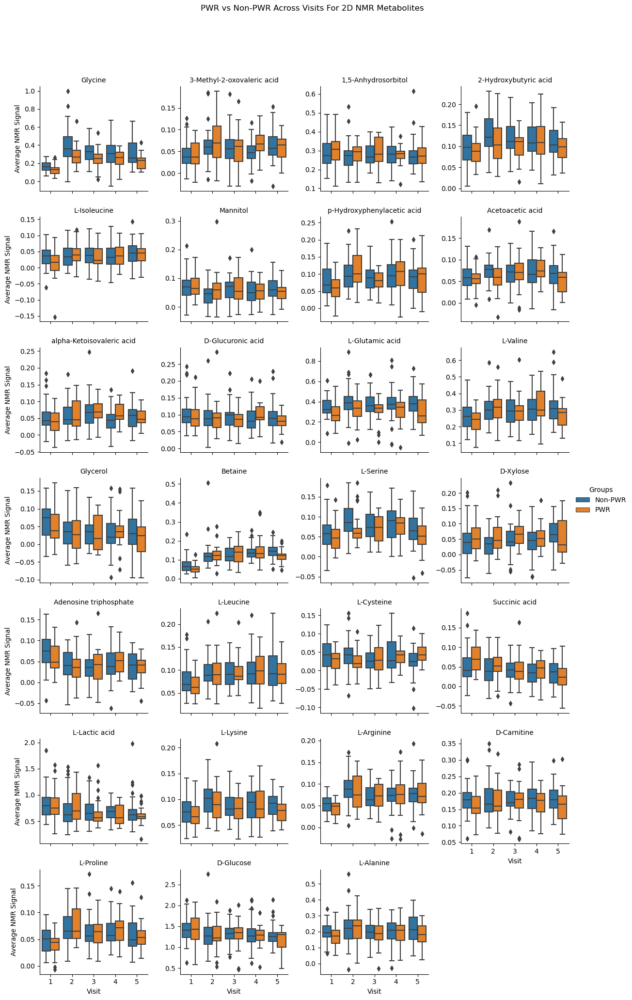

In [28]:
# boxplot of metabolites
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import re

# Load 5 visits data
files =[
    "../result/data/nmr_only/DF1_nmr_only_annotated.csv",
    "../result/data/nmr_only/DF2_nmr_only_annotated.csv",
    "../result/data/nmr_only/DF3_nmr_only_annotated.csv",
    "../result/data/nmr_only/DF4_nmr_only_annotated.csv",
    "../result/data/nmr_only/DF5_nmr_only_annotated.csv"
]
dfs = [pd.read_csv(f) for f in files]

# Metabolites
target_2d_only = {
    "1,5-Anhydrosorbitol", "2-Hydroxybutyric acid", "3-Methyl-2-oxovaleric acid",
    "Acetoacetic acid", "Adenosine triphosphate", "Betaine", "D-Carnitine",
    "D-Glucose", "D-Glucuronic acid", "D-Xylose", "Glycerol", "Glycine",
    "L-Alanine", "L-Arginine", "L-Isoleucine", "L-Lactic acid", "L-Leucine",
    "L-Proline", "L-Serine", "L-Valine", "Mannitol", "Succinic acid",
    "alpha-Ketoisovaleric acid", "p-Hydroxyphenylacetic acid", "L-Lysine", "L-Cysteine", "L-Glutamic acid"
}
# Load name_map file
name_map = pd.read_csv("../metaboanalyst/enrichment/global/name_map.csv")
metabolites_to_plot = set(name_map["Query"].dropna().unique()) & target_2d_only

#  Build tidy dataframe (only filtered metabolites)
plot_data = []
for i, df in enumerate(dfs, start=1):
    for met in metabolites_to_plot:
        # find all columns matching this metabolite
        cols = [c for c in df.columns if re.sub(r"\.\d+$", "", c) == met]
        if not cols:
            continue
        avg_val = df[cols].mean(axis=1)
        temp = pd.DataFrame({
            "visit": i,
            "Groups": df["pwr_current"].map({0: "Non-PWR", 1: "PWR"}),  # relabel
            "metabolite": met,
            "value": avg_val
        })
        plot_data.append(temp)
plot_df = pd.concat(plot_data, ignore_index=True)

# Plot boxplots for each metabolite
g = sns.catplot(
    data=plot_df,
    x="visit", y="value", hue="Groups",
    col="metabolite", col_wrap=4,
    kind="box", sharey=False, height=3, aspect=1
)

g.set_titles("{col_name}")
g.set_axis_labels("Visit", "Average NMR Signal")
plt.subplots_adjust(top=0.9)
g.fig.suptitle("PWR vs Non-PWR Across Visits For 2D NMR Metabolites")
g.savefig("../result/figure/boxplots_metabolites_2d.png", dpi=300, bbox_inches='tight')
plt.show()

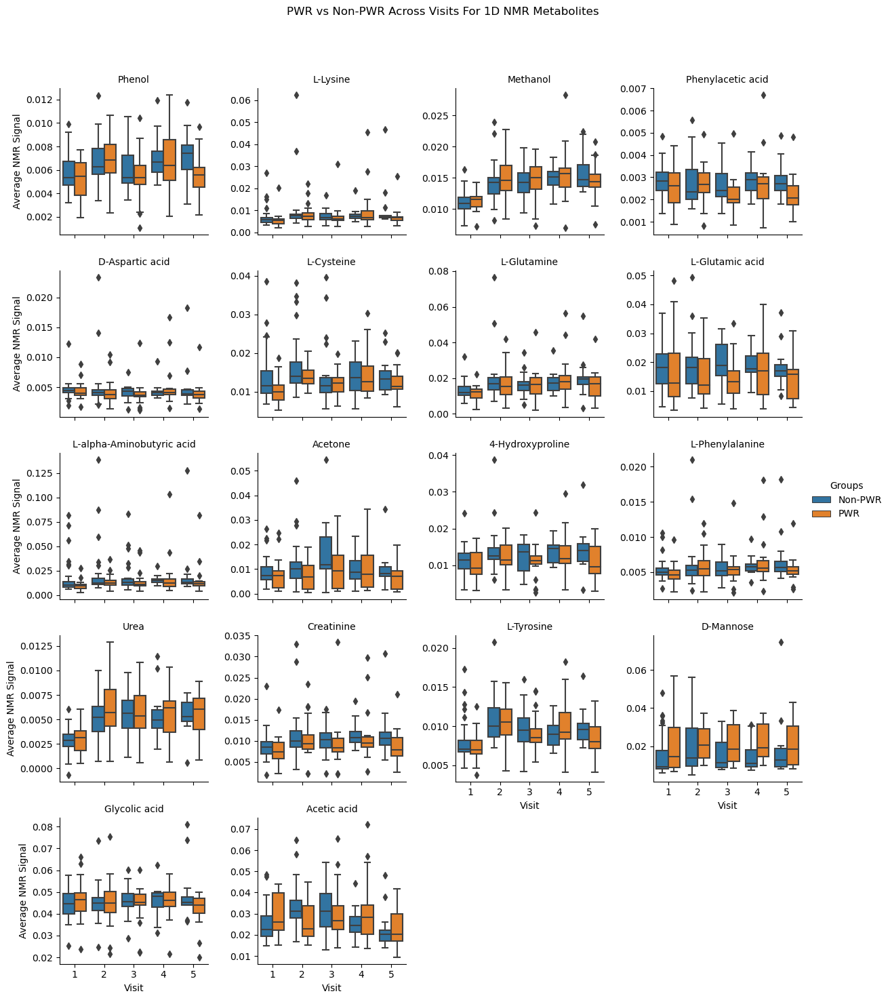

In [29]:
# boxplot of metabolites
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import re

# Load 5 visits data
files =[
    "../result/1D_data/nmr_only/DF1_nmr_only_annotated_1d.csv",
    "../result/1D_data/nmr_only/DF2_nmr_only_annotated_1d.csv",
    "../result/1D_data/nmr_only/DF3_nmr_only_annotated_1d.csv",
    "../result/1D_data/nmr_only/DF4_nmr_only_annotated_1d.csv",
    "../result/1D_data/nmr_only/DF5_nmr_only_annotated_1d.csv"
]
dfs = [pd.read_csv(f) for f in files]

# Metabolites
target_1d_only = {
    "4-Hydroxyproline", "Acetic acid", "Acetone", "Creatinine",
    "D-Aspartic acid", "D-Mannose", "Glycolic acid", "L-Glutamine",
    "L-Phenylalanine", "L-Tyrosine", "L-alpha-Aminobutyric acid",
    "Methanol", "Phenol", "Phenylacetic acid", "Urea", "L-Lysine", "L-Cysteine", "L-Glutamic acid"
}
# Load name_map file
name_map = pd.read_csv("../metaboanalyst/enrichment/global/name_map.csv")
metabolites_to_plot = set(name_map["Query"].dropna().unique()) & target_1d_only

#  Build tidy dataframe (only filtered metabolites)
plot_data = []
for i, df in enumerate(dfs, start=1):
    for met in metabolites_to_plot:
        # find all columns matching this metabolite
        cols = [c for c in df.columns if re.sub(r"\.\d+$", "", c) == met]
        if not cols:
            continue
        avg_val = df[cols].mean(axis=1)
        temp = pd.DataFrame({
            "visit": i,
            "Groups": df["pwr_current"].map({0: "Non-PWR", 1: "PWR"}),  # relabel
            "metabolite": met,
            "value": avg_val
        })
        plot_data.append(temp)
plot_df = pd.concat(plot_data, ignore_index=True)

# Plot boxplots for each metabolite
g = sns.catplot(
    data=plot_df,
    x="visit", y="value", hue="Groups",
    col="metabolite", col_wrap=4,
    kind="box", sharey=False, height=3, aspect=1
)

g.set_titles("{col_name}")
g.set_axis_labels("Visit", "Average NMR Signal")
plt.subplots_adjust(top=0.9)
g.fig.suptitle("PWR vs Non-PWR Across Visits For 1D NMR Metabolites")
g.savefig("../result/figure/boxplots_metabolites_1d.png", dpi=300, bbox_inches='tight')
plt.show()

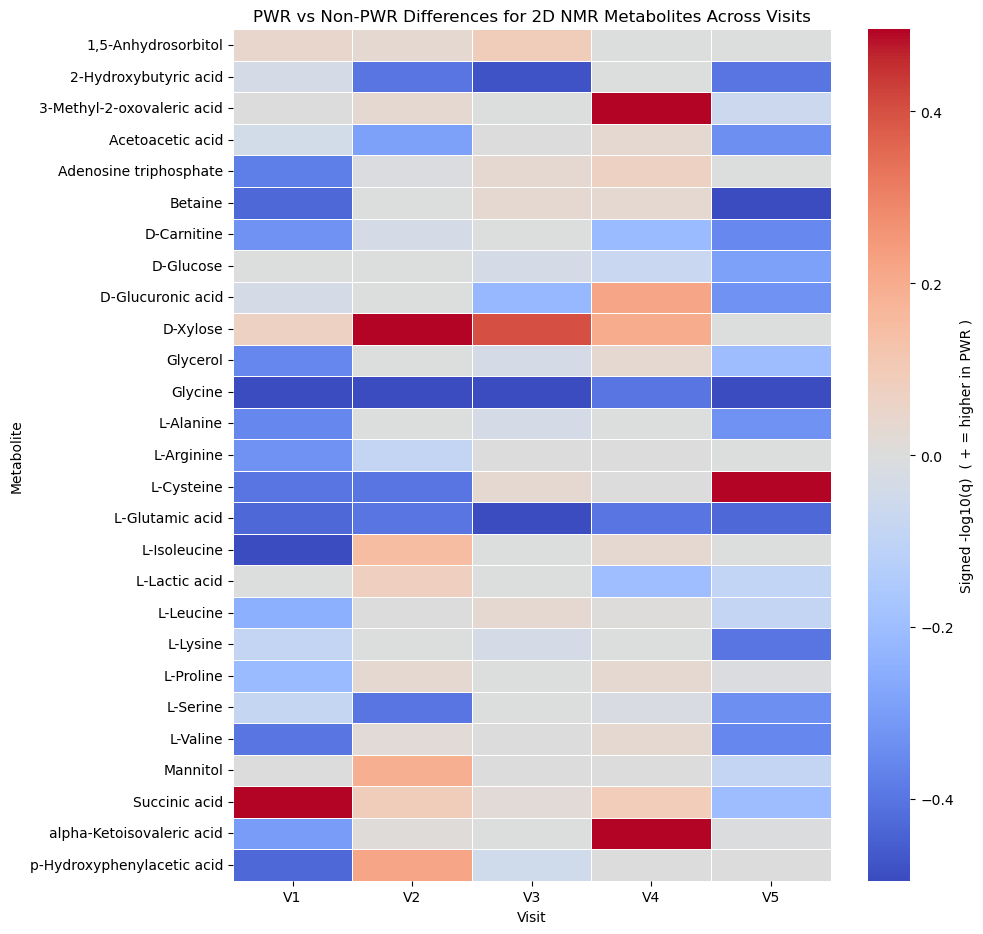

In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from scipy.stats import ttest_ind

files = [
    "../result/data/nmr_only/DF1_nmr_only_annotated.csv",
    "../result/data/nmr_only/DF2_nmr_only_annotated.csv",
    "../result/data/nmr_only/DF3_nmr_only_annotated.csv",
    "../result/data/nmr_only/DF4_nmr_only_annotated.csv",
    "../result/data/nmr_only/DF5_nmr_only_annotated.csv",
]
name_map_path = "../metaboanalyst/enrichment/global/name_map.csv"

# 2D-only (24)
TARGET_2D = {
    "1,5-Anhydrosorbitol","2-Hydroxybutyric acid","3-Methyl-2-oxovaleric acid",
    "Acetoacetic acid","Adenosine triphosphate","Betaine","D-Carnitine",
    "D-Glucose","D-Glucuronic acid","D-Xylose","Glycerol","L-Alanine",
    "L-Arginine","L-Isoleucine","L-Lactic acid","L-Leucine","L-Proline",
    "L-Serine","L-Valine","Mannitol","Succinic acid",
    "alpha-Ketoisovaleric acid","p-Hydroxyphenylacetic acid","Glycine","L-Lysine","L-Cysteine", "L-Glutamic acid"
}


WHICH_SET = "2d_only"
ALPHA = 0.05            # FDR threshold
MASK_NON_SIG = False 

def strip_suffix(col: str) -> str:
    # remove trailing ".1", ".2", etc.
    return re.sub(r"\.\d+$", "", col)

def welch_p_and_sign(values: pd.Series, groups: pd.Series):
    # groups: 0 = Non-PWR, 1 = PWR
    g1 = values[groups == 1].dropna()  # PWR
    g0 = values[groups == 0].dropna()  # Non-PWR
    if len(g1) < 2 or len(g0) < 2:
        return np.nan, np.nan
    stat, p = ttest_ind(g1, g0, equal_var=False)
    sign = np.sign(g1.mean() - g0.mean())
    return float(p), float(sign)

def bh_fdr(p_series: pd.Series) -> pd.Series:
    """Benjamini-Hochberg across all provided p-values (Series)."""
    p = p_series.dropna().sort_values()
    m = len(p)
    if m == 0:
        return pd.Series(index=p_series.index, dtype=float)
    ranks = np.arange(1, m + 1)
    q = p.values * m / ranks
    # enforce monotonicity
    q = np.minimum.accumulate(q[::-1])[::-1]
    q_series = pd.Series(q, index=p.index)
    # put back to original shape
    out = pd.Series(np.nan, index=p_series.index)
    out.loc[q_series.index] = q_series.values
    # cap at 1
    out = out.clip(upper=1.0)
    return out


all_from_map = set(name_map["Query"].dropna().unique())
name_map = pd.read_csv(name_map_path)

if WHICH_SET == "2d_only":
    metabolites_to_plot = all_from_map & TARGET_2D
# --- Collect raw p-values and signs per visit × metabolite ---
p_cols = []
sign_cols = []

for i, fpath in enumerate(files, start=1):
    df = pd.read_csv(fpath)
    # average replicate columns for each metabolite
    avg_by_met = {}
    for met in metabolites_to_plot:
        cols = [c for c in df.columns if strip_suffix(c) == met]
        if cols:
            avg_by_met[met] = df[cols].mean(axis=1)
    if not avg_by_met:
        continue

    X = pd.DataFrame(avg_by_met)
    groups = df["pwr_current"]  # 0/1

    p_vals = {}
    signs = {}
    for met in X.columns:
        p, s = welch_p_and_sign(X[met], groups)
        p_vals[met] = p
        signs[met] = s

    p_cols.append(pd.Series(p_vals, name=f"V{i}"))
    sign_cols.append(pd.Series(signs, name=f"V{i}"))

p_mat = pd.concat(p_cols, axis=1).reindex(sorted(metabolites_to_plot))
sign_mat = pd.concat(sign_cols, axis=1).reindex_like(p_mat)
# --- BH FDR across ALL tests (flatten, adjust, reshape) ---
p_long = p_mat.stack(dropna=False)                     # MultiIndex: (metabolite, visit)
q_long = bh_fdr(p_long.dropna())                       # adjust only non-NaN
q_mat = q_long.unstack(level=1).reindex_like(p_mat)    # same shape as p_mat

# --- Build signed −log10(q) matrix ---
eps = 1e-300
signed_log10_q = sign_mat * (-np.log10(q_mat.clip(lower=eps)))

# Optional mask for q >= ALPHA
mask = (q_mat >= ALPHA) if MASK_NON_SIG else None


# --- Plot ---
plt.figure(figsize=(10, max(6, 0.35 * len(signed_log10_q))))
sns.heatmap(
    signed_log10_q,
    mask=mask,
    cmap="coolwarm",
    center=0,
    linewidths=0.5,
    linecolor="white",
    cbar_kws={"label": "Signed -log10(q)  ( + = higher in PWR )"}
)

plt.title(f"PWR vs Non-PWR Differences for 2D NMR Metabolites Across Visits")
plt.xlabel("Visit")
plt.ylabel("Metabolite")
plt.tight_layout()
plt.savefig(f"../result/figure/heatmap_metabolites_2d.png", dpi=300, bbox_inches='tight')
plt.show()

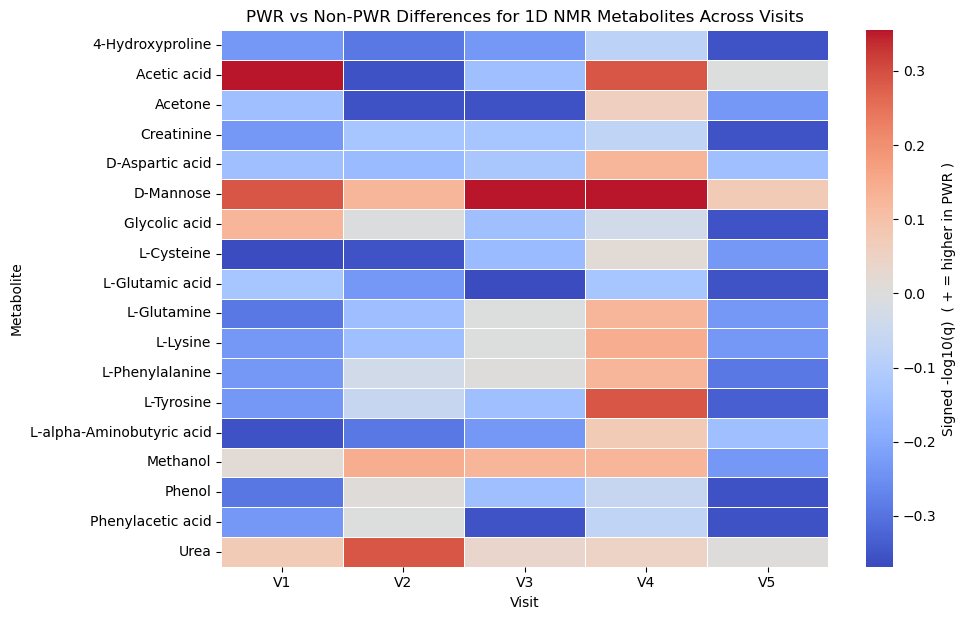

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from scipy.stats import ttest_ind

files = [
    "../result/1D_data/nmr_only/DF1_nmr_only_annotated_1d.csv",
    "../result/1D_data/nmr_only/DF2_nmr_only_annotated_1d.csv",
    "../result/1D_data/nmr_only/DF3_nmr_only_annotated_1d.csv",
    "../result/1D_data/nmr_only/DF4_nmr_only_annotated_1d.csv",
    "../result/1D_data/nmr_only/DF5_nmr_only_annotated_1d.csv",
]
name_map_path = "../metaboanalyst/enrichment/global/name_map.csv"


# 1D-only (15)
TARGET_1D = {
    "4-Hydroxyproline","Acetic acid","Acetone","Creatinine","D-Aspartic acid",
    "D-Mannose","Glycolic acid","L-Glutamine","L-Phenylalanine","L-Tyrosine",
    "L-alpha-Aminobutyric acid","Methanol","Phenol","Phenylacetic acid","L-Lysine","Urea", "L-Cysteine", "L-Glutamic acid"
}

WHICH_SET = "1d_only"
ALPHA = 0.05            # FDR threshold
MASK_NON_SIG = False 

def strip_suffix(col: str) -> str:
    # remove trailing ".1", ".2", etc.
    return re.sub(r"\.\d+$", "", col)

def welch_p_and_sign(values: pd.Series, groups: pd.Series):
    # groups: 0 = Non-PWR, 1 = PWR
    g1 = values[groups == 1].dropna()  # PWR
    g0 = values[groups == 0].dropna()  # Non-PWR
    if len(g1) < 2 or len(g0) < 2:
        return np.nan, np.nan
    stat, p = ttest_ind(g1, g0, equal_var=False)
    sign = np.sign(g1.mean() - g0.mean())
    return float(p), float(sign)

def bh_fdr(p_series: pd.Series) -> pd.Series:
    """Benjamini-Hochberg across all provided p-values (Series)."""
    p = p_series.dropna().sort_values()
    m = len(p)
    if m == 0:
        return pd.Series(index=p_series.index, dtype=float)
    ranks = np.arange(1, m + 1)
    q = p.values * m / ranks
    # enforce monotonicity
    q = np.minimum.accumulate(q[::-1])[::-1]
    q_series = pd.Series(q, index=p.index)
    # put back to original shape
    out = pd.Series(np.nan, index=p_series.index)
    out.loc[q_series.index] = q_series.values
    # cap at 1
    out = out.clip(upper=1.0)
    return out


all_from_map = set(name_map["Query"].dropna().unique())
name_map = pd.read_csv(name_map_path)

if WHICH_SET == "1d_only":
    metabolites_to_plot = all_from_map & TARGET_1D
# --- Collect raw p-values and signs per visit × metabolite ---
p_cols = []
sign_cols = []

for i, fpath in enumerate(files, start=1):
    df = pd.read_csv(fpath)
    # average replicate columns for each metabolite
    avg_by_met = {}
    for met in metabolites_to_plot:
        cols = [c for c in df.columns if strip_suffix(c) == met]
        if cols:
            avg_by_met[met] = df[cols].mean(axis=1)
    if not avg_by_met:
        continue

    X = pd.DataFrame(avg_by_met)
    groups = df["pwr_current"]  # 0/1

    p_vals = {}
    signs = {}
    for met in X.columns:
        p, s = welch_p_and_sign(X[met], groups)
        p_vals[met] = p
        signs[met] = s

    p_cols.append(pd.Series(p_vals, name=f"V{i}"))
    sign_cols.append(pd.Series(signs, name=f"V{i}"))

p_mat = pd.concat(p_cols, axis=1).reindex(sorted(metabolites_to_plot))
sign_mat = pd.concat(sign_cols, axis=1).reindex_like(p_mat)
# --- BH FDR across ALL tests (flatten, adjust, reshape) ---
p_long = p_mat.stack(dropna=False)                     # MultiIndex: (metabolite, visit)
q_long = bh_fdr(p_long.dropna())                       # adjust only non-NaN
q_mat = q_long.unstack(level=1).reindex_like(p_mat)    # same shape as p_mat

# --- Build signed −log10(q) matrix ---
eps = 1e-300
signed_log10_q = sign_mat * (-np.log10(q_mat.clip(lower=eps)))

# Optional mask for q >= ALPHA
mask = (q_mat >= ALPHA) if MASK_NON_SIG else None


# --- Plot ---
plt.figure(figsize=(10, max(6, 0.35 * len(signed_log10_q))))
sns.heatmap(
    signed_log10_q,
    mask=mask,
    cmap="coolwarm",
    center=0,
    linewidths=0.5,
    linecolor="white",
    cbar_kws={"label": "Signed -log10(q)  ( + = higher in PWR )"}
)

plt.title(f"PWR vs Non-PWR Differences for 1D NMR Metabolites Across Visits")
plt.xlabel("Visit")
plt.ylabel("Metabolite")
plt.tight_layout()
plt.savefig(f"../result/figure/heatmap_metabolites_1d.png", dpi=300, bbox_inches='tight')
plt.show()      

# Deployment

In [1]:
import joblib
params = joblib.load("../result/data/meta+nmr/selection/all_param_selection_leak.pkl")

In [2]:
params.keys()

dict_keys([1, 2, 3, 4, 5])

In [6]:
params[1][20]['MultiLayer Perceptron']

[{'model__activation': 'relu',
  'model__alpha': 0.0001,
  'model__hidden_layer_sizes': (100,),
  'model__learning_rate_init': 0.001,
  'model__solver': 'adam'},
 {'model__activation': 'tanh',
  'model__alpha': 0.0001,
  'model__hidden_layer_sizes': (150, 50),
  'model__learning_rate_init': 0.1,
  'model__solver': 'adam'},
 {'model__activation': 'relu',
  'model__alpha': 0.0001,
  'model__hidden_layer_sizes': (150, 50),
  'model__learning_rate_init': 0.1,
  'model__solver': 'adam'},
 {'model__activation': 'tanh',
  'model__alpha': 0.001,
  'model__hidden_layer_sizes': (100, 50),
  'model__learning_rate_init': 0.1,
  'model__solver': 'adam'},
 {'model__activation': 'relu',
  'model__alpha': 0.001,
  'model__hidden_layer_sizes': (150,),
  'model__learning_rate_init': 0.1,
  'model__solver': 'adam'},
 {'model__activation': 'relu',
  'model__alpha': 0.0001,
  'model__hidden_layer_sizes': (100, 50),
  'model__learning_rate_init': 0.1,
  'model__solver': 'adam'},
 {'model__activation': 'relu

In [7]:
from sklearn.base import BaseEstimator, TransformerMixin
from scipy.stats import ttest_ind
import numpy as np
import pandas as pd

class NMRTopNSelector(BaseEstimator, TransformerMixin):
    def __init__(self, top_n=10):
        self.top_n = top_n
        self.selected_cols_ = None

    def fit(self, X, y=None):
        # X will be a DataFrame with only candidate NMR columns
        pvals = {}
        X0 = X[y == 0]
        X1 = X[y == 1]
        for col in X.columns:
            try:
                _, p = ttest_ind(X0[col], X1[col], equal_var=False)
            except Exception:
                p = np.nan
            pvals[col] = p
        cols_sorted = sorted(pvals, key=pvals.get)
        self.selected_cols_ = cols_sorted[: self.top_n]
        return self

    def transform(self, X):
        return X[self.selected_cols_]

In [8]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import joblib, json, os

def final_tune_and_refit(df, model_name, estimator, param_grid, top_n, outdir, 
                         cv=10, random_state=42):
    one_hot_cols = ['vig_activity']
    binary_cols   = ['race_1', 'race_2']
    continuous_cols = ['wt_gain','weight_change','age_delivery_range2','num_alc_weekly']
    explicit_cols = ['caffeine','smoke_current','ppg_BMI', 'first_BMI']
    meta_cols = one_hot_cols + binary_cols + continuous_cols + explicit_cols
    non_feature_cols = ['participant_id', 'visit', 'pwr_current']

    X = df.drop(columns=['pwr_current','participant_id','visit'])
    y = df['pwr_current']
    all_nmr_cols = [c for c in df.columns if c not in meta_cols + non_feature_cols]  


    nmr_block = Pipeline([('select', NMRTopNSelector(top_n=top_n))])

    pre = ColumnTransformer(transformers=[
        ('cat',     OneHotEncoder(drop='first', handle_unknown='ignore'), one_hot_cols),
        ('explicit',OneHotEncoder(handle_unknown='ignore'),               explicit_cols),
        ('binary',  'passthrough',                                       binary_cols),
        ('num',     StandardScaler(),                                     continuous_cols),
        ('nmr',     nmr_block,                                            all_nmr_cols),
    ])

    pipe = Pipeline([('preprocessor', pre), ('model', estimator)])


    grid = param_grid[model_name]

    cv_split = StratifiedKFold(n_splits=cv, shuffle=True, random_state=random_state)
    gs = GridSearchCV(pipe, grid, cv=cv_split, scoring='roc_auc', n_jobs=-1, refit=True)
    gs.fit(X, y)  

    os.makedirs(outdir, exist_ok=True)
    joblib.dump(gs.best_estimator_, os.path.join(outdir, f"{model_name}_N{top_n}_final_model.pkl"))
    with open(os.path.join(outdir, f"{model_name}_N{top_n}_best_params.json"), "w") as f:
        json.dump(gs.best_params_, f, indent=2)


    nmr_selected = (gs.best_estimator_
                      .named_steps['preprocessor']
                      .named_transformers_['nmr']
                      .named_steps['select'].selected_cols_)
    with open(os.path.join(outdir, f"{model_name}_N{top_n}_selected_nmr.json"), "w") as f:
        json.dump(nmr_selected, f, indent=2)

    return {
        "best_params": gs.best_params_,
        "cv_best_score": gs.best_score_,
        "selected_nmr": nmr_selected,
        "final_model_path": os.path.join(outdir, f"{model_name}_N{top_n}_final_model.pkl")
    }


In [10]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
import pandas as pd
deployment_plan = {
    1: {"MultiLayer Perceptron": 20},
    2: {"MultiLayer Perceptron": 10},
    3: {"Logistic Regression": 5},
    4: {"Random Forest": 15},
    5: {"Logistic Regression": 8},
}

if __name__ == "__main__":
    for visit in range(1, 6):
        print(f"[Deployment] Visit {visit}")
        df = pd.read_csv(f"../result/data/meta+nmr/DF{visit}_filtered.csv")  
        outdir = f"../result/data/meta+nmr/selection/deploy/V{visit}"

        models = {
            'Logistic Regression': LogisticRegression(max_iter=5000, random_state=42),
            'Random Forest': RandomForestClassifier(random_state=42),
            'MultiLayer Perceptron': MLPClassifier(max_iter=1000, random_state=42),
        }
        param_grid = {
            'Logistic Regression': [
                {'model__C': [0.01, 0.05, 0.1, 1, 10],'model__penalty': ['l1', 'l2'],'model__solver': ['liblinear']},
                {'model__C': [0.01, 0.05, 0.1, 1, 10],'model__penalty': ['l2'],'model__solver': ['lbfgs']},
                {'model__C': [0.01, 0.05, 0.1, 1, 10],'model__penalty': ['elasticnet'],'model__l1_ratio': [0.1, 0.5, 0.9],'model__solver': ['saga']},
            ],
            'Random Forest':{
                'model__n_estimators': [100, 200],
                'model__max_depth': [None, 10],
                'model__min_samples_split':[2, 5],
                'model__max_features': ['sqrt', 1.0],
                'model__class_weight': ['balanced'],
                'model__bootstrap': [True],
            },
            'MultiLayer Perceptron':{
                'model__hidden_layer_sizes': [(100,), (150,), (150,50)],
                'model__activation': ['relu','tanh'],
                'model__alpha': [1e-4, 1e-3],
                'model__solver': ['adam', 'lbfgs'],
                'model__learning_rate_init': [0.001, 0.01],
            },
        }  
        for model_name, top_n in deployment_plan.get(visit, {}).items():
            info = final_tune_and_refit(
                df=df,
                model_name=model_name,
                estimator=models[model_name],
                param_grid=param_grid,
                top_n=top_n,
                outdir=outdir,
                cv=10,
                random_state=42,
            )
            print(f"V{visit} {model_name} N={top_n} — AUC(cv)={info['cv_best_score']:.3f}")
            print("Best params:", info["best_params"])
            print("Selected NMR:", info["selected_nmr"][:5], "…")
            print("Saved model →", info["final_model_path"])

[Deployment] Visit 1
V1 MultiLayer Perceptron N=20 — AUC(cv)=0.800
Best params: {'model__activation': 'relu', 'model__alpha': 0.0001, 'model__hidden_layer_sizes': (150,), 'model__learning_rate_init': 0.001, 'model__solver': 'adam'}
Selected NMR: ['2.46,2.42,33,34', '2.38,2.34,31,32', '3.58,3.54,44,45', '2.38,2.34,36,37', '0.98,0.94,13,14'] …
Saved model → ../result/data/meta+nmr/selection/deploy/V1/MultiLayer Perceptron_N20_final_model.pkl
[Deployment] Visit 2
V2 MultiLayer Perceptron N=10 — AUC(cv)=0.972
Best params: {'model__activation': 'relu', 'model__alpha': 0.0001, 'model__hidden_layer_sizes': (100,), 'model__learning_rate_init': 0.001, 'model__solver': 'adam'}
Selected NMR: ['3.58,3.54,44,45', '1.9,1.86,30,31', '3.62,3.58,72,73', '2.1,2.06,31,32', '3.46,3.42,80,81'] …
Saved model → ../result/data/meta+nmr/selection/deploy/V2/MultiLayer Perceptron_N10_final_model.pkl
[Deployment] Visit 3
V3 Logistic Regression N=5 — AUC(cv)=0.933
Best params: {'model__C': 0.1, 'model__penalty': '

In [32]:
import pandas as pd
import numpy as np
# Load the data
meta_df = pd.read_csv("../result/data/meta+nmr/selection/deploy/test.csv")
nmr_data = pd.read_csv("../mrbin_result/Result_final/mrbin_2025-05-29bins.csv", index_col=0)
# drop pwr_any and pwr_first columns
meta_df = meta_df.drop(columns = ['pwr_current','pwr_any','pwr_first','pp_weight_loss1','pp_weight_loss2','pp_weight_loss3'])

# Replace '.' and other known invalid placeholders with NaN
meta_df.replace(to_replace=['.', 'NA', ''], value=np.nan, inplace=True)
# Loop through each object column and convert it to numeric
for col in meta_df.select_dtypes(include=['object']).columns:
    meta_df[col] = pd.to_numeric(meta_df[col], errors='coerce')  
    print(f"Converted column: {col} → {meta_df[col].dtype}")

# Define the prefixes and extract the relevant columns
prefixes = ['weight_change','caffeine','num_alc_weekly','smoke_current']
visit_labels = ['V1', 'V2', 'V3', 'V4', 'V5']

# Identify the columns that are not in the prefixes
meta_columns = [col for col in meta_df.columns if not any(col.endswith(f'_v{i}') for i in range(1, 6))]

# Dictionary to store visit-specific DataFrames
visit_dfs = {}

for v in range(1, 6):
    visit = f'V{v}'
    visit_columns = [f"{prefix}_v{v}" for prefix in prefixes]
    seleted_columns = meta_columns + visit_columns 

    # subset the DataFrame for the current visit
    visit_df = meta_df[seleted_columns].copy()
    rename_dict = {f"{prefix}_v{v}": prefix for prefix in prefixes}
    visit_df.rename(columns=rename_dict, inplace=True)
    visit_df['visit'] = visit
    visit_dfs[visit] = visit_df
# Load the NMR data
nmr_data['participant_id'] = nmr_data.index.str.extract(r'GWG-(\d+)', expand=False)
nmr_data['visit'] = nmr_data.index.str.extract(r'GWG-\d+-(V\d)', expand=False)
nmr_data = nmr_data.dropna(subset=['visit'])

# Merge the NMR data with the visit DataFrame
def get_visit_df(visit):
    nmr_visit_df = nmr_data[nmr_data['visit'] == visit].copy()
    meta_visit_df = visit_dfs[visit]
    nmr_visit_df['participant_id'] = nmr_visit_df['participant_id'].astype(str)
    meta_visit_df['participant_id'] = meta_visit_df['participant_id'].astype(str)
    merged = pd.merge(meta_visit_df, nmr_visit_df, on=['participant_id', 'visit'], how='inner')
    return merged

In [33]:
DF1 = get_visit_df('V1')
DF2 = get_visit_df('V2')
DF3 = get_visit_df('V3')
DF4 = get_visit_df('V4')
DF5 = get_visit_df('V5')

In [36]:
DF1.to_csv("../result/data/meta+nmr/selection/deploy/V1_test.csv", index=False)
DF2.to_csv("../result/data/meta+nmr/selection/deploy/V2_test.csv", index=False)
DF3.to_csv("../result/data/meta+nmr/selection/deploy/V3_test.csv", index=False)
DF4.to_csv("../result/data/meta+nmr/selection/deploy/V4_test.csv", index=False)

In [43]:
import os, json, joblib
import pandas as pd
import numpy as np

# --- columns match training script ---
ONE_HOT_COLS   = ['vig_activity']
BINARY_COLS    = ['race_1', 'race_2']
CONTINUOUS_COLS= ['wt_gain','weight_change','age_delivery_range2','num_alc_weekly']
EXPLICIT_COLS  = ['caffeine','smoke_current','ppg_BMI','first_BMI']
META_COLS      = ONE_HOT_COLS + BINARY_COLS + CONTINUOUS_COLS + EXPLICIT_COLS
NON_FEATURE    = ['participant_id','visit','pwr_current']  

def load_final_pipeline(base_dir, visit, model_name, top_n):
    path = os.path.join(base_dir, f"V{visit}", f"{model_name}_N{top_n}_final_model.pkl")
    pipe = joblib.load(path)
    return pipe

def make_X_test(df):
    # Keep all columns except the non-features; ColumnTransformer inside the pipeline
    # will pick the right subsets by name (incl. NMR block).
    cols_to_drop = [c for c in NON_FEATURE if c in df.columns]
    X = df.drop(columns=cols_to_drop)
    return X

def predict_with_threshold(pipe, X, threshold=0.5):
    proba = pipe.predict_proba(X)[:, 1]
    yhat  = (proba >= threshold).astype(int)
    return proba, yhat

# ===== Example usage =====
BASE_DIR = "../result/data/meta+nmr/selection/deploy"

# Choose which model to apply; here are your five “final” combos:
plan = {
    1: ("MultiLayer Perceptron", 20),
    2: ("MultiLayer Perceptron", 10),
    3: ("Logistic Regression", 5),
    4: ("Random Forest", 15),
    5: ("Logistic Regression", 8),
}

visit = 4
# Load test set (must have the same column names used in training)
test_df = pd.read_csv("../result/data/meta+nmr/selection/deploy/V4_test.csv")
model_name, top_n = plan[visit]

pipe = load_final_pipeline(BASE_DIR, visit, model_name, top_n)
X_test = make_X_test(test_df)

# Default 0.5 threshold; for clinical screening use your tuned threshold if you’ve decided one
proba, yhat = predict_with_threshold(pipe, X_test, threshold=0.5)

out = test_df.copy()
out["pred_proba"] = proba
out["pred_label"] = yhat
out.to_csv(f"../result/data/meta+nmr/selection/deploy/prediction/V{visit}_{model_name.replace(' ','')}_N{top_n}_predictions.csv", index=False)
print(out[["participant_id","pred_proba","pred_label"]])


   participant_id  pred_proba  pred_label
0            4158    0.851381           1
1            4169    0.772771           1
2            4193    0.718409           1
